# Optimization Methods

Until now, you've always used Gradient Descent to update the parameters and minimize the cost. In this notebook, you will learn more advanced optimization methods that can speed up learning and perhaps even get you to a better final value for the cost function. Having a good optimization algorithm can be the difference between waiting days vs. just a few hours to get a good result. 

Gradient descent goes "downhill" on a cost function $J$. Think of it as trying to do this: 
<img src="images/cost.jpg" style="width:650px;height:300px;">
<caption><center> <u> **Figure 1** </u>: **Minimizing the cost is like finding the lowest point in a hilly landscape**<br> At each step of the training, you update your parameters following a certain direction to try to get to the lowest possible point. </center></caption>

**Notations**: As usual, $\frac{\partial J}{\partial a } = $ `da` for any variable `a`.

To get started, run the following code to import the libraries you will need.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import math
import sklearn
import sklearn.datasets

from opt_utils import load_params_and_grads, initialize_parameters, forward_propagation, backward_propagation
from opt_utils import compute_cost, predict, predict_dec, plot_decision_boundary, load_dataset
from testCases import *

%matplotlib inline
plt.rcParams['figure.figsize'] = (7.0, 4.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

/home/jovyan/work/week6/opt_utils.py:76: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert(parameters['W' + str(l)].shape == layer_dims[l], layer_dims[l-1])
/home/jovyan/work/week6/opt_utils.py:77: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert(parameters['W' + str(l)].shape == layer_dims[l], 1)


## 1 - Gradient Descent

A simple optimization method in machine learning is gradient descent (GD). When you take gradient steps with respect to all $m$ examples on each step, it is also called Batch Gradient Descent. 

**Warm-up exercise**: Implement the gradient descent update rule. The  gradient descent rule is, for $l = 1, ..., L$: 
$$ W^{[l]} = W^{[l]} - \alpha \text{ } dW^{[l]} \tag{1}$$
$$ b^{[l]} = b^{[l]} - \alpha \text{ } db^{[l]} \tag{2}$$

where L is the number of layers and $\alpha$ is the learning rate. All parameters should be stored in the `parameters` dictionary. Note that the iterator `l` starts at 0 in the `for` loop while the first parameters are $W^{[1]}$ and $b^{[1]}$. You need to shift `l` to `l+1` when coding.

In [14]:
# GRADED FUNCTION: update_parameters_with_gd

def update_parameters_with_gd(parameters, grads, learning_rate):
    """
    Update parameters using one step of gradient descent
    
    Arguments:
    parameters -- python dictionary containing your parameters to be updated:
                    parameters['W' + str(l)] = Wl
                    parameters['b' + str(l)] = bl
    grads -- python dictionary containing your gradients to update each parameters:
                    grads['dW' + str(l)] = dWl
                    grads['db' + str(l)] = dbl
    learning_rate -- the learning rate, scalar.
    
    Returns:
    parameters -- python dictionary containing your updated parameters 
    """

    L = len(parameters) // 2 # number of layers in the neural networks
    print(parameters)
    # Update rule for each parameter
    for l in range(L):
        ### START CODE HERE ### (approx. 2 lines)
        parameters["W" + str(l+1)] = parameters["W" + str(l+1)]-learning_rate*grads["dW" + str(l+1)]
        parameters["b" + str(l+1)] = parameters["b" + str(l+1)]-learning_rate*grads["db" + str(l+1)]
        ### END CODE HERE ###
        
    return parameters

In [15]:
parameters, grads, learning_rate = update_parameters_with_gd_test_case()

parameters = update_parameters_with_gd(parameters, grads, learning_rate)
print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

{'W1': array([[ 1.62434536, -0.61175641, -0.52817175],
       [-1.07296862,  0.86540763, -2.3015387 ]]), 'b1': array([[ 1.74481176],
       [-0.7612069 ]]), 'W2': array([[ 0.3190391 , -0.24937038,  1.46210794],
       [-2.06014071, -0.3224172 , -0.38405435],
       [ 1.13376944, -1.09989127, -0.17242821]]), 'b2': array([[-0.87785842],
       [ 0.04221375],
       [ 0.58281521]])}
W1 = [[ 1.63535156 -0.62320365 -0.53718766]
 [-1.07799357  0.85639907 -2.29470142]]
b1 = [[ 1.74604067]
 [-0.75184921]]
W2 = [[ 0.32171798 -0.25467393  1.46902454]
 [-2.05617317 -0.31554548 -0.3756023 ]
 [ 1.1404819  -1.09976462 -0.1612551 ]]
b2 = [[-0.88020257]
 [ 0.02561572]
 [ 0.57539477]]


**Expected Output**:

<table> 
    <tr>
    <td > **W1** </td> 
           <td > [[ 1.63535156 -0.62320365 -0.53718766]
 [-1.07799357  0.85639907 -2.29470142]] </td> 
    </tr> 
    
    <tr>
    <td > **b1** </td> 
           <td > [[ 1.74604067]
 [-0.75184921]] </td> 
    </tr> 
    
    <tr>
    <td > **W2** </td> 
           <td > [[ 0.32171798 -0.25467393  1.46902454]
 [-2.05617317 -0.31554548 -0.3756023 ]
 [ 1.1404819  -1.09976462 -0.1612551 ]] </td> 
    </tr> 
    
    <tr>
    <td > **b2** </td> 
           <td > [[-0.88020257]
 [ 0.02561572]
 [ 0.57539477]] </td> 
    </tr> 
</table>


A variant of this is Stochastic Gradient Descent (SGD), which is equivalent to mini-batch gradient descent where each mini-batch has just 1 example. The update rule that you have just implemented does not change. What changes is that you would be computing gradients on just one training example at a time, rather than on the whole training set. The code examples below illustrate the difference between stochastic gradient descent and (batch) gradient descent. 

- **(Batch) Gradient Descent**:

``` python
X = data_input
Y = labels
parameters = initialize_parameters(layers_dims)
for i in range(0, num_iterations):
    # Forward propagation
    a, caches = forward_propagation(X, parameters)
    # Compute cost.
    cost = compute_cost(a, Y)
    # Backward propagation.
    grads = backward_propagation(a, caches, parameters)
    # Update parameters.
    parameters = update_parameters(parameters, grads)
        
```

- **Stochastic Gradient Descent**:

```python
X = data_input
Y = labels
parameters = initialize_parameters(layers_dims)
for i in range(0, num_iterations):
    for j in range(0, m):
        # Forward propagation
        a, caches = forward_propagation(X[:,j], parameters)
        # Compute cost
        cost = compute_cost(a, Y[:,j])
        # Backward propagation
        grads = backward_propagation(a, caches, parameters)
        # Update parameters.
        parameters = update_parameters(parameters, grads)
```


In Stochastic Gradient Descent, you use only 1 training example before updating the gradients. When the training set is large, SGD can be faster. But the parameters will "oscillate" toward the minimum rather than converge smoothly. Here is an illustration of this: 

<img src="images/kiank_sgd.png" style="width:750px;height:250px;">
<caption><center> <u> <font color='purple'> **Figure 1** </u><font color='purple'>  : **SGD vs GD**<br> "+" denotes a minimum of the cost. SGD leads to many oscillations to reach convergence. But each step is a lot faster to compute for SGD than for GD, as it uses only one training example (vs. the whole batch for GD). </center></caption>

**Note** also that implementing SGD requires 3 for-loops in total:
1. Over the number of iterations
2. Over the $m$ training examples
3. Over the layers (to update all parameters, from $(W^{[1]},b^{[1]})$ to $(W^{[L]},b^{[L]})$)

In practice, you'll often get faster results if you do not use neither the whole training set, nor only one training example, to perform each update. Mini-batch gradient descent uses an intermediate number of examples for each step. With mini-batch gradient descent, you loop over the mini-batches instead of looping over individual training examples.

<img src="images/kiank_minibatch.png" style="width:750px;height:250px;">
<caption><center> <u> <font color='purple'> **Figure 2** </u>: <font color='purple'>  **SGD vs Mini-Batch GD**<br> "+" denotes a minimum of the cost. Using mini-batches in your optimization algorithm often leads to faster optimization. </center></caption>

<font color='blue'>
**What you should remember**:
- The difference between gradient descent, mini-batch gradient descent and stochastic gradient descent is the number of examples you use to perform one update step.
- You have to tune a learning rate hyperparameter $\alpha$.
- With a well-turned mini-batch size, usually it outperforms either gradient descent or stochastic gradient descent (particularly when the training set is large).

## 2 - Mini-Batch Gradient descent

Let's learn how to build mini-batches from the training set (X, Y).

There are two steps:
- **Shuffle**: Create a shuffled version of the training set (X, Y) as shown below. Each column of X and Y represents a training example. Note that the random shuffling is done synchronously between X and Y. Such that after the shuffling the $i^{th}$ column of X is the example corresponding to the $i^{th}$ label in Y. The shuffling step ensures that examples will be split randomly into different mini-batches. 

<img src="images/kiank_shuffle.png" style="width:550px;height:300px;">

- **Partition**: Partition the shuffled (X, Y) into mini-batches of size `mini_batch_size` (here 64). Note that the number of training examples is not always divisible by `mini_batch_size`. The last mini batch might be smaller, but you don't need to worry about this. When the final mini-batch is smaller than the full `mini_batch_size`, it will look like this: 

<img src="images/kiank_partition.png" style="width:550px;height:300px;">

**Exercise**: Implement `random_mini_batches`. We coded the shuffling part for you. To help you with the partitioning step, we give you the following code that selects the indexes for the $1^{st}$ and $2^{nd}$ mini-batches:
```python
first_mini_batch_X = shuffled_X[:, 0 : mini_batch_size]
second_mini_batch_X = shuffled_X[:, mini_batch_size : 2 * mini_batch_size]
...
```

Note that the last mini-batch might end up smaller than `mini_batch_size=64`. Let $\lfloor s \rfloor$ represents $s$ rounded down to the nearest integer (this is `math.floor(s)` in Python). If the total number of examples is not a multiple of `mini_batch_size=64` then there will be $\lfloor \frac{m}{mini\_batch\_size}\rfloor$ mini-batches with a full 64 examples, and the number of examples in the final mini-batch will be ($m-mini_\_batch_\_size \times \lfloor \frac{m}{mini\_batch\_size}\rfloor$). 

In [28]:
# GRADED FUNCTION: random_mini_batches

def random_mini_batches(X, Y, mini_batch_size = 64, seed = 0):
    """
    Creates a list of random minibatches from (X, Y)
    
    Arguments:
    X -- input data, of shape (input size, number of examples)
    Y -- true "label" vector (1 for blue dot / 0 for red dot), of shape (1, number of examples)
    mini_batch_size -- size of the mini-batches, integer
    
    Returns:
    mini_batches -- list of synchronous (mini_batch_X, mini_batch_Y)
    """
    
    np.random.seed(seed)            # To make your "random" minibatches the same as ours
    m = X.shape[1]                  # number of training examples
    mini_batches = []
        
    # Step 1: Shuffle (X, Y)
    permutation = list(np.random.permutation(m))
    shuffled_X = X[:, permutation]
    shuffled_Y = Y[:, permutation].reshape((1,m))

    # Step 2: Partition (shuffled_X, shuffled_Y). Minus the end case.
    num_complete_minibatches = math.floor(m/mini_batch_size) # number of mini batches of size mini_batch_size in your partitionning
    for k in range(0, num_complete_minibatches):
        ### START CODE HERE ### (approx. 2 lines)
        mini_batch_X = shuffled_X[:, k * mini_batch_size : (k+1) * mini_batch_size]
        mini_batch_Y = shuffled_Y[:, k * mini_batch_size : (k+1) * mini_batch_size]
        ### END CODE HERE ###
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    # Handling the end case (last mini-batch < mini_batch_size)
    if m % mini_batch_size != 0:
        ### START CODE HERE ### (approx. 2 lines)
        mini_batch_X = shuffled_X[:, num_complete_minibatches * mini_batch_size : m]
        mini_batch_Y = shuffled_Y[:, num_complete_minibatches * mini_batch_size : m]
        ### END CODE HERE ###
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    return mini_batches

In [29]:
X_assess, Y_assess, mini_batch_size = random_mini_batches_test_case()
mini_batches = random_mini_batches(X_assess, Y_assess, mini_batch_size)

print ("shape of the 1st mini_batch_X: " + str(mini_batches[0][0].shape))
print ("shape of the 2nd mini_batch_X: " + str(mini_batches[1][0].shape))
print ("shape of the 3rd mini_batch_X: " + str(mini_batches[2][0].shape))
print ("shape of the 1st mini_batch_Y: " + str(mini_batches[0][1].shape))
print ("shape of the 2nd mini_batch_Y: " + str(mini_batches[1][1].shape)) 
print ("shape of the 3rd mini_batch_Y: " + str(mini_batches[2][1].shape))
print ("mini batch sanity check: " + str(mini_batches[0][0][0][0:3]))

shape of the 1st mini_batch_X: (12288, 64)
shape of the 2nd mini_batch_X: (12288, 64)
shape of the 3rd mini_batch_X: (12288, 20)
shape of the 1st mini_batch_Y: (1, 64)
shape of the 2nd mini_batch_Y: (1, 64)
shape of the 3rd mini_batch_Y: (1, 20)
mini batch sanity check: [ 0.90085595 -0.7612069   0.2344157 ]


**Expected Output**:

<table style="width:50%"> 
    <tr>
    <td > **shape of the 1st mini_batch_X** </td> 
           <td > (12288, 64) </td> 
    </tr> 
    
    <tr>
    <td > **shape of the 2nd mini_batch_X** </td> 
           <td > (12288, 64) </td> 
    </tr> 
    
    <tr>
    <td > **shape of the 3rd mini_batch_X** </td> 
           <td > (12288, 20) </td> 
    </tr>
    <tr>
    <td > **shape of the 1st mini_batch_Y** </td> 
           <td > (1, 64) </td> 
    </tr> 
    <tr>
    <td > **shape of the 2nd mini_batch_Y** </td> 
           <td > (1, 64) </td> 
    </tr> 
    <tr>
    <td > **shape of the 3rd mini_batch_Y** </td> 
           <td > (1, 20) </td> 
    </tr> 
    <tr>
    <td > **mini batch sanity check** </td> 
           <td > [ 0.90085595 -0.7612069   0.2344157 ] </td> 
    </tr>
    
</table>

<font color='blue'>
**What you should remember**:
- Shuffling and Partitioning are the two steps required to build mini-batches
- Powers of two are often chosen to be the mini-batch size, e.g., 16, 32, 64, 128.

## 3 - Momentum

Because mini-batch gradient descent makes a parameter update after seeing just a subset of examples, the direction of the update has some variance, and so the path taken by mini-batch gradient descent will "oscillate" toward convergence. Using momentum can reduce these oscillations. 

Momentum takes into account the past gradients to smooth out the update. We will store the 'direction' of the previous gradients in the variable $v$. Formally, this will be the exponentially weighted average of the gradient on previous steps. You can also think of $v$ as the "velocity" of a ball rolling downhill, building up speed (and momentum) according to the direction of the gradient/slope of the hill. 

<img src="images/opt_momentum.png" style="width:400px;height:250px;">
<caption><center> <u><font color='purple'>**Figure 3**</u><font color='purple'>: The red arrows shows the direction taken by one step of mini-batch gradient descent with momentum. The blue points show the direction of the gradient (with respect to the current mini-batch) on each step. Rather than just following the gradient, we let the gradient influence $v$ and then take a step in the direction of $v$.<br> <font color='black'> </center>


**Exercise**: Initialize the velocity. The velocity, $v$, is a python dictionary that needs to be initialized with arrays of zeros. Its keys are the same as those in the `grads` dictionary, that is:
for $l =1,...,L$:
```python
v["dW" + str(l+1)] = ... #(numpy array of zeros with the same shape as parameters["W" + str(l+1)])
v["db" + str(l+1)] = ... #(numpy array of zeros with the same shape as parameters["b" + str(l+1)])
```
**Note** that the iterator l starts at 0 in the for loop while the first parameters are v["dW1"] and v["db1"] (that's a "one" on the superscript). This is why we are shifting l to l+1 in the `for` loop.

In [30]:
# GRADED FUNCTION: initialize_velocity

def initialize_velocity(parameters):
    """
    Initializes the velocity as a python dictionary with:
                - keys: "dW1", "db1", ..., "dWL", "dbL" 
                - values: numpy arrays of zeros of the same shape as the corresponding gradients/parameters.
    Arguments:
    parameters -- python dictionary containing your parameters.
                    parameters['W' + str(l)] = Wl
                    parameters['b' + str(l)] = bl
    
    Returns:
    v -- python dictionary containing the current velocity.
                    v['dW' + str(l)] = velocity of dWl
                    v['db' + str(l)] = velocity of dbl
    """
    
    L = len(parameters) // 2 # number of layers in the neural networks
    v = {}
    
    # Initialize velocity
    for l in range(L):
        ### START CODE HERE ### (approx. 2 lines)
        v["dW" + str(l+1)] = np.zeros((np.shape(parameters['W' + str(l+1)])[0],np.shape(parameters['W' + str(l+1)])[1]))
        v["db" + str(l+1)] = np.zeros((np.shape(parameters['b' + str(l+1)])[0],np.shape(parameters['b' + str(l+1)])[1]))
        ### END CODE HERE ###
        
    return v

In [31]:
parameters = initialize_velocity_test_case()

v = initialize_velocity(parameters)
print("v[\"dW1\"] = " + str(v["dW1"]))
print("v[\"db1\"] = " + str(v["db1"]))
print("v[\"dW2\"] = " + str(v["dW2"]))
print("v[\"db2\"] = " + str(v["db2"]))

v["dW1"] = [[ 0.  0.  0.]
 [ 0.  0.  0.]]
v["db1"] = [[ 0.]
 [ 0.]]
v["dW2"] = [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
v["db2"] = [[ 0.]
 [ 0.]
 [ 0.]]


**Expected Output**:

<table style="width:40%"> 
    <tr>
    <td > **v["dW1"]** </td> 
           <td > [[ 0.  0.  0.]
 [ 0.  0.  0.]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db1"]** </td> 
           <td > [[ 0.]
 [ 0.]] </td> 
    </tr> 
    
    <tr>
    <td > **v["dW2"]** </td> 
           <td > [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db2"]** </td> 
           <td > [[ 0.]
 [ 0.]
 [ 0.]] </td> 
    </tr> 
</table>


**Exercise**:  Now, implement the parameters update with momentum. The momentum update rule is, for $l = 1, ..., L$: 

$$ \begin{cases}
v_{dW^{[l]}} = \beta v_{dW^{[l]}} + (1 - \beta) dW^{[l]} \\
W^{[l]} = W^{[l]} - \alpha v_{dW^{[l]}}
\end{cases}\tag{3}$$

$$\begin{cases}
v_{db^{[l]}} = \beta v_{db^{[l]}} + (1 - \beta) db^{[l]} \\
b^{[l]} = b^{[l]} - \alpha v_{db^{[l]}} 
\end{cases}\tag{4}$$

where L is the number of layers, $\beta$ is the momentum and $\alpha$ is the learning rate. All parameters should be stored in the `parameters` dictionary.  Note that the iterator `l` starts at 0 in the `for` loop while the first parameters are $W^{[1]}$ and $b^{[1]}$ (that's a "one" on the superscript). So you will need to shift `l` to `l+1` when coding.

In [32]:
# GRADED FUNCTION: update_parameters_with_momentum

def update_parameters_with_momentum(parameters, grads, v, beta, learning_rate):
    """
    Update parameters using Momentum
    
    Arguments:
    parameters -- python dictionary containing your parameters:
                    parameters['W' + str(l)] = Wl
                    parameters['b' + str(l)] = bl
    grads -- python dictionary containing your gradients for each parameters:
                    grads['dW' + str(l)] = dWl
                    grads['db' + str(l)] = dbl
    v -- python dictionary containing the current velocity:
                    v['dW' + str(l)] = ...
                    v['db' + str(l)] = ...
    beta -- the momentum hyperparameter, scalar
    learning_rate -- the learning rate, scalar
    
    Returns:
    parameters -- python dictionary containing your updated parameters 
    v -- python dictionary containing your updated velocities
    """

    L = len(parameters) // 2 # number of layers in the neural networks
    
    # Momentum update for each parameter
    for l in range(L):
        
        ### START CODE HERE ### (approx. 4 lines)
        # compute velocities
        v["dW" + str(l+1)] = beta*v["dW" + str(l+1)]+(1-beta)* grads["dW" + str(l+1)]
        v["db" + str(l+1)] = beta*v["db" + str(l+1)]+(1-beta)* grads["db" + str(l+1)]
        # update parameters
        parameters["W" + str(l+1)] = parameters["W" + str(l+1)]-learning_rate*v["dW" + str(l+1)]
        parameters["b" + str(l+1)] = parameters["b" + str(l+1)]-learning_rate*v["db" + str(l+1)]
        ### END CODE HERE ###
        
    return parameters, v

In [33]:
parameters, grads, v = update_parameters_with_momentum_test_case()

parameters, v = update_parameters_with_momentum(parameters, grads, v, beta = 0.9, learning_rate = 0.01)
print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))
print("v[\"dW1\"] = " + str(v["dW1"]))
print("v[\"db1\"] = " + str(v["db1"]))
print("v[\"dW2\"] = " + str(v["dW2"]))
print("v[\"db2\"] = " + str(v["db2"]))

W1 = [[ 1.62544598 -0.61290114 -0.52907334]
 [-1.07347112  0.86450677 -2.30085497]]
b1 = [[ 1.74493465]
 [-0.76027113]]
W2 = [[ 0.31930698 -0.24990073  1.4627996 ]
 [-2.05974396 -0.32173003 -0.38320915]
 [ 1.13444069 -1.0998786  -0.1713109 ]]
b2 = [[-0.87809283]
 [ 0.04055394]
 [ 0.58207317]]
v["dW1"] = [[-0.11006192  0.11447237  0.09015907]
 [ 0.05024943  0.09008559 -0.06837279]]
v["db1"] = [[-0.01228902]
 [-0.09357694]]
v["dW2"] = [[-0.02678881  0.05303555 -0.06916608]
 [-0.03967535 -0.06871727 -0.08452056]
 [-0.06712461 -0.00126646 -0.11173103]]
v["db2"] = [[ 0.02344157]
 [ 0.16598022]
 [ 0.07420442]]


**Expected Output**:

<table style="width:90%"> 
    <tr>
    <td > **W1** </td> 
           <td > [[ 1.62544598 -0.61290114 -0.52907334]
 [-1.07347112  0.86450677 -2.30085497]] </td> 
    </tr> 
    
    <tr>
    <td > **b1** </td> 
           <td > [[ 1.74493465]
 [-0.76027113]] </td> 
    </tr> 
    
    <tr>
    <td > **W2** </td> 
           <td > [[ 0.31930698 -0.24990073  1.4627996 ]
 [-2.05974396 -0.32173003 -0.38320915]
 [ 1.13444069 -1.0998786  -0.1713109 ]] </td> 
    </tr> 
    
    <tr>
    <td > **b2** </td> 
           <td > [[-0.87809283]
 [ 0.04055394]
 [ 0.58207317]] </td> 
    </tr> 

    <tr>
    <td > **v["dW1"]** </td> 
           <td > [[-0.11006192  0.11447237  0.09015907]
 [ 0.05024943  0.09008559 -0.06837279]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db1"]** </td> 
           <td > [[-0.01228902]
 [-0.09357694]] </td> 
    </tr> 
    
    <tr>
    <td > **v["dW2"]** </td> 
           <td > [[-0.02678881  0.05303555 -0.06916608]
 [-0.03967535 -0.06871727 -0.08452056]
 [-0.06712461 -0.00126646 -0.11173103]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db2"]** </td> 
           <td > [[ 0.02344157]
 [ 0.16598022]
 [ 0.07420442]]</td> 
    </tr> 
</table>



**Note** that:
- The velocity is initialized with zeros. So the algorithm will take a few iterations to "build up" velocity and start to take bigger steps.
- If $\beta = 0$, then this just becomes standard gradient descent without momentum. 

**How do you choose $\beta$?**

- The larger the momentum $\beta$ is, the smoother the update because the more we take the past gradients into account. But if $\beta$ is too big, it could also smooth out the updates too much. 
- Common values for $\beta$ range from 0.8 to 0.999. If you don't feel inclined to tune this, $\beta = 0.9$ is often a reasonable default. 
- Tuning the optimal $\beta$ for your model might need trying several values to see what works best in term of reducing the value of the cost function $J$. 

<font color='blue'>
**What you should remember**:
- Momentum takes past gradients into account to smooth out the steps of gradient descent. It can be applied with batch gradient descent, mini-batch gradient descent or stochastic gradient descent.
- You have to tune a momentum hyperparameter $\beta$ and a learning rate $\alpha$.

## 4 - Adam

Adam is one of the most effective optimization algorithms for training neural networks. It combines ideas from RMSProp (described in lecture) and Momentum. 

**How does Adam work?**
1. It calculates an exponentially weighted average of past gradients, and stores it in variables $v$ (before bias correction) and $v^{corrected}$ (with bias correction). 
2. It calculates an exponentially weighted average of the squares of the past gradients, and  stores it in variables $s$ (before bias correction) and $s^{corrected}$ (with bias correction). 
3. It updates parameters in a direction based on combining information from "1" and "2".

The update rule is, for $l = 1, ..., L$: 

$$\begin{cases}
v_{dW^{[l]}} = \beta_1 v_{dW^{[l]}} + (1 - \beta_1) \frac{\partial \mathcal{J} }{ \partial W^{[l]} } \\
v^{corrected}_{dW^{[l]}} = \frac{v_{dW^{[l]}}}{1 - (\beta_1)^t} \\
s_{dW^{[l]}} = \beta_2 s_{dW^{[l]}} + (1 - \beta_2) (\frac{\partial \mathcal{J} }{\partial W^{[l]} })^2 \\
s^{corrected}_{dW^{[l]}} = \frac{s_{dW^{[l]}}}{1 - (\beta_1)^t} \\
W^{[l]} = W^{[l]} - \alpha \frac{v^{corrected}_{dW^{[l]}}}{\sqrt{s^{corrected}_{dW^{[l]}}} + \varepsilon}
\end{cases}$$
where:
- t counts the number of steps taken of Adam 
- L is the number of layers
- $\beta_1$ and $\beta_2$ are hyperparameters that control the two exponentially weighted averages. 
- $\alpha$ is the learning rate
- $\varepsilon$ is a very small number to avoid dividing by zero

As usual, we will store all parameters in the `parameters` dictionary  

**Exercise**: Initialize the Adam variables $v, s$ which keep track of the past information.

**Instruction**: The variables $v, s$ are python dictionaries that need to be initialized with arrays of zeros. Their keys are the same as for `grads`, that is:
for $l = 1, ..., L$:
```python
v["dW" + str(l+1)] = ... #(numpy array of zeros with the same shape as parameters["W" + str(l+1)])
v["db" + str(l+1)] = ... #(numpy array of zeros with the same shape as parameters["b" + str(l+1)])
s["dW" + str(l+1)] = ... #(numpy array of zeros with the same shape as parameters["W" + str(l+1)])
s["db" + str(l+1)] = ... #(numpy array of zeros with the same shape as parameters["b" + str(l+1)])

```

In [34]:
# GRADED FUNCTION: initialize_adam

def initialize_adam(parameters) :
    """
    Initializes v and s as two python dictionaries with:
                - keys: "dW1", "db1", ..., "dWL", "dbL" 
                - values: numpy arrays of zeros of the same shape as the corresponding gradients/parameters.
    
    Arguments:
    parameters -- python dictionary containing your parameters.
                    parameters["W" + str(l)] = Wl
                    parameters["b" + str(l)] = bl
    
    Returns: 
    v -- python dictionary that will contain the exponentially weighted average of the gradient.
                    v["dW" + str(l)] = ...
                    v["db" + str(l)] = ...
    s -- python dictionary that will contain the exponentially weighted average of the squared gradient.
                    s["dW" + str(l)] = ...
                    s["db" + str(l)] = ...

    """
    
    L = len(parameters) // 2 # number of layers in the neural networks
    v = {}
    s = {}
    
    # Initialize v, s. Input: "parameters". Outputs: "v, s".
    for l in range(L):
    ### START CODE HERE ### (approx. 4 lines)
        v["dW" + str(l+1)] = np.zeros((np.shape(parameters['W' + str(l+1)])[0],np.shape(parameters['W' + str(l+1)])[1]))
        v["db" + str(l+1)] = np.zeros((np.shape(parameters['b' + str(l+1)])[0],np.shape(parameters['b' + str(l+1)])[1]))
        s["dW" + str(l+1)] = np.zeros((np.shape(parameters['W' + str(l+1)])[0],np.shape(parameters['W' + str(l+1)])[1]))
        s["db" + str(l+1)] = np.zeros((np.shape(parameters['b' + str(l+1)])[0],np.shape(parameters['b' + str(l+1)])[1]))
    ### END CODE HERE ###
    
    return v, s

In [35]:
parameters = initialize_adam_test_case()

v, s = initialize_adam(parameters)
print("v[\"dW1\"] = " + str(v["dW1"]))
print("v[\"db1\"] = " + str(v["db1"]))
print("v[\"dW2\"] = " + str(v["dW2"]))
print("v[\"db2\"] = " + str(v["db2"]))
print("s[\"dW1\"] = " + str(s["dW1"]))
print("s[\"db1\"] = " + str(s["db1"]))
print("s[\"dW2\"] = " + str(s["dW2"]))
print("s[\"db2\"] = " + str(s["db2"]))


v["dW1"] = [[ 0.  0.  0.]
 [ 0.  0.  0.]]
v["db1"] = [[ 0.]
 [ 0.]]
v["dW2"] = [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
v["db2"] = [[ 0.]
 [ 0.]
 [ 0.]]
s["dW1"] = [[ 0.  0.  0.]
 [ 0.  0.  0.]]
s["db1"] = [[ 0.]
 [ 0.]]
s["dW2"] = [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
s["db2"] = [[ 0.]
 [ 0.]
 [ 0.]]


**Expected Output**:

<table style="width:40%"> 
    <tr>
    <td > **v["dW1"]** </td> 
           <td > [[ 0.  0.  0.]
 [ 0.  0.  0.]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db1"]** </td> 
           <td > [[ 0.]
 [ 0.]] </td> 
    </tr> 
    
    <tr>
    <td > **v["dW2"]** </td> 
           <td > [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db2"]** </td> 
           <td > [[ 0.]
 [ 0.]
 [ 0.]] </td> 
    </tr> 
    <tr>
    <td > **s["dW1"]** </td> 
           <td > [[ 0.  0.  0.]
 [ 0.  0.  0.]] </td> 
    </tr> 
    
    <tr>
    <td > **s["db1"]** </td> 
           <td > [[ 0.]
 [ 0.]] </td> 
    </tr> 
    
    <tr>
    <td > **s["dW2"]** </td> 
           <td > [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]] </td> 
    </tr> 
    
    <tr>
    <td > **s["db2"]** </td> 
           <td > [[ 0.]
 [ 0.]
 [ 0.]] </td> 
    </tr>

</table>


**Exercise**:  Now, implement the parameters update with Adam. Recall the general update rule is, for $l = 1, ..., L$: 

$$\begin{cases}
v_{W^{[l]}} = \beta_1 v_{W^{[l]}} + (1 - \beta_1) \frac{\partial J }{ \partial W^{[l]} } \\
v^{corrected}_{W^{[l]}} = \frac{v_{W^{[l]}}}{1 - (\beta_1)^t} \\
s_{W^{[l]}} = \beta_2 s_{W^{[l]}} + (1 - \beta_2) (\frac{\partial J }{\partial W^{[l]} })^2 \\
s^{corrected}_{W^{[l]}} = \frac{s_{W^{[l]}}}{1 - (\beta_2)^t} \\
W^{[l]} = W^{[l]} - \alpha \frac{v^{corrected}_{W^{[l]}}}{\sqrt{s^{corrected}_{W^{[l]}}}+\varepsilon}
\end{cases}$$


**Note** that the iterator `l` starts at 0 in the `for` loop while the first parameters are $W^{[1]}$ and $b^{[1]}$. You need to shift `l` to `l+1` when coding.

In [42]:
# GRADED FUNCTION: update_parameters_with_adam

def update_parameters_with_adam(parameters, grads, v, s, t, learning_rate = 0.01,
                                beta1 = 0.9, beta2 = 0.999,  epsilon = 1e-8):
    """
    Update parameters using Adam
    
    Arguments:
    parameters -- python dictionary containing your parameters:
                    parameters['W' + str(l)] = Wl
                    parameters['b' + str(l)] = bl
    grads -- python dictionary containing your gradients for each parameters:
                    grads['dW' + str(l)] = dWl
                    grads['db' + str(l)] = dbl
    v -- Adam variable, moving average of the first gradient, python dictionary
    s -- Adam variable, moving average of the squared gradient, python dictionary
    learning_rate -- the learning rate, scalar.
    beta1 -- Exponential decay hyperparameter for the first moment estimates 
    beta2 -- Exponential decay hyperparameter for the second moment estimates 
    epsilon -- hyperparameter preventing division by zero in Adam updates

    Returns:
    parameters -- python dictionary containing your updated parameters 
    v -- Adam variable, moving average of the first gradient, python dictionary
    s -- Adam variable, moving average of the squared gradient, python dictionary
    """
    
    L = len(parameters) // 2                 # number of layers in the neural networks
    v_corrected = {}                         # Initializing first moment estimate, python dictionary
    s_corrected = {}                         # Initializing second moment estimate, python dictionary 
    
    # Perform Adam update on all parameters
    for l in range(L):
        # Moving average of the gradients. Inputs: "v, grads, beta1". Output: "v".
        ### START CODE HERE ### (approx. 2 lines)
        v["dW" + str(l+1)] = beta1*v["dW" + str(l+1)]+(1-beta1)*grads["dW" + str(l+1)]
        v["db" + str(l+1)] = beta1*v["db" + str(l+1)]+(1-beta1)*grads["db" + str(l+1)]
        ### END CODE HERE ###

        # Compute bias-corrected first moment estimate. Inputs: "v, beta1, t". Output: "v_corrected".
        ### START CODE HERE ### (approx. 2 lines)
        v_corrected["dW" + str(l+1)] = v["dW" + str(l+1)]/(1-beta1**t)
        v_corrected["db" + str(l+1)] = v["db" + str(l+1)]/(1-beta1**t)
        ### END CODE HERE ###

        # Moving average of the squared gradients. Inputs: "s, grads, beta2". Output: "s".
        ### START CODE HERE ### (approx. 2 lines)
        s["dW" + str(l+1)] = beta2*s["dW" + str(l+1)]+(1-beta2)*(grads["dW" + str(l+1)]**2)
        s["db" + str(l+1)] = beta2*s["db" + str(l+1)]+(1-beta2)*(grads["db" + str(l+1)]**2)
        ### END CODE HERE ###

        # Compute bias-corrected second raw moment estimate. Inputs: "s, beta2, t". Output: "s_corrected".
        ### START CODE HERE ### (approx. 2 lines)
        s_corrected["dW" + str(l+1)] = s["dW" + str(l+1)]/(1-beta2**t)
        s_corrected["db" + str(l+1)] = s["db" + str(l+1)]/(1-beta2**t)
        ### END CODE HERE ###

        # Update parameters. Inputs: "parameters, learning_rate, v_corrected, s_corrected, epsilon". Output: "parameters".
        ### START CODE HERE ### (approx. 2 lines)
        parameters["W" + str(l+1)] = parameters["W" + str(l+1)]-learning_rate*v_corrected["dW" + str(l+1)]/(np.sqrt(s_corrected["dW" + str(l+1)])+epsilon)
        parameters["b" + str(l+1)] = parameters["b" + str(l+1)]-learning_rate*v_corrected["db" + str(l+1)]/(np.sqrt(s_corrected["db" + str(l+1)])+epsilon)
        ### END CODE HERE ###

    return parameters, v, s

In [43]:
parameters, grads, v, s = update_parameters_with_adam_test_case()
parameters, v, s  = update_parameters_with_adam(parameters, grads, v, s, t = 2)

print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))
print("v[\"dW1\"] = " + str(v["dW1"]))
print("v[\"db1\"] = " + str(v["db1"]))
print("v[\"dW2\"] = " + str(v["dW2"]))
print("v[\"db2\"] = " + str(v["db2"]))
print("s[\"dW1\"] = " + str(s["dW1"]))
print("s[\"db1\"] = " + str(s["db1"]))
print("s[\"dW2\"] = " + str(s["dW2"]))
print("s[\"db2\"] = " + str(s["db2"]))

W1 = [[ 1.63178673 -0.61919778 -0.53561312]
 [-1.08040999  0.85796626 -2.29409733]]
b1 = [[ 1.75225313]
 [-0.75376553]]
W2 = [[ 0.32648046 -0.25681174  1.46954931]
 [-2.05269934 -0.31497584 -0.37661299]
 [ 1.14121081 -1.09244991 -0.16498684]]
b2 = [[-0.88529979]
 [ 0.03477238]
 [ 0.57537385]]
v["dW1"] = [[-0.11006192  0.11447237  0.09015907]
 [ 0.05024943  0.09008559 -0.06837279]]
v["db1"] = [[-0.01228902]
 [-0.09357694]]
v["dW2"] = [[-0.02678881  0.05303555 -0.06916608]
 [-0.03967535 -0.06871727 -0.08452056]
 [-0.06712461 -0.00126646 -0.11173103]]
v["db2"] = [[ 0.02344157]
 [ 0.16598022]
 [ 0.07420442]]
s["dW1"] = [[ 0.00121136  0.00131039  0.00081287]
 [ 0.0002525   0.00081154  0.00046748]]
s["db1"] = [[  1.51020075e-05]
 [  8.75664434e-04]]
s["dW2"] = [[  7.17640232e-05   2.81276921e-04   4.78394595e-04]
 [  1.57413361e-04   4.72206320e-04   7.14372576e-04]
 [  4.50571368e-04   1.60392066e-07   1.24838242e-03]]
s["db2"] = [[  5.49507194e-05]
 [  2.75494327e-03]
 [  5.50629536e-04]]


**Expected Output**:

<table> 
    <tr>
    <td > **W1** </td> 
           <td > [[ 1.63178673 -0.61919778 -0.53561312]
 [-1.08040999  0.85796626 -2.29409733]] </td> 
    </tr> 
    
    <tr>
    <td > **b1** </td> 
           <td > [[ 1.75225313]
 [-0.75376553]] </td> 
    </tr> 
    
    <tr>
    <td > **W2** </td> 
           <td > [[ 0.32648046 -0.25681174  1.46954931]
 [-2.05269934 -0.31497584 -0.37661299]
 [ 1.14121081 -1.09245036 -0.16498684]] </td> 
    </tr> 
    
    <tr>
    <td > **b2** </td> 
           <td > [[-0.88529978]
 [ 0.03477238]
 [ 0.57537385]] </td> 
    </tr> 
    <tr>
    <td > **v["dW1"]** </td> 
           <td > [[-0.11006192  0.11447237  0.09015907]
 [ 0.05024943  0.09008559 -0.06837279]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db1"]** </td> 
           <td > [[-0.01228902]
 [-0.09357694]] </td> 
    </tr> 
    
    <tr>
    <td > **v["dW2"]** </td> 
           <td > [[-0.02678881  0.05303555 -0.06916608]
 [-0.03967535 -0.06871727 -0.08452056]
 [-0.06712461 -0.00126646 -0.11173103]] </td> 
    </tr> 
    
    <tr>
    <td > **v["db2"]** </td> 
           <td > [[ 0.02344157]
 [ 0.16598022]
 [ 0.07420442]] </td> 
    </tr> 
    <tr>
    <td > **s["dW1"]** </td> 
           <td > [[ 0.00121136  0.00131039  0.00081287]
 [ 0.0002525   0.00081154  0.00046748]] </td> 
    </tr> 
    
    <tr>
    <td > **s["db1"]** </td> 
           <td > [[  1.51020075e-05]
 [  8.75664434e-04]] </td> 
    </tr> 
    
    <tr>
    <td > **s["dW2"]** </td> 
           <td > [[  7.17640232e-05   2.81276921e-04   4.78394595e-04]
 [  1.57413361e-04   4.72206320e-04   7.14372576e-04]
 [  4.50571368e-04   1.60392066e-07   1.24838242e-03]] </td> 
    </tr> 
    
    <tr>
    <td > **s["db2"]** </td> 
           <td > [[  5.49507194e-05]
 [  2.75494327e-03]
 [  5.50629536e-04]] </td> 
    </tr>
</table>


You now have three working optimization algorithms (mini-batch gradient descent, Momentum, Adam). Let's implement a model with each of these optimizers and observe the difference.

## 5 - Model with different optimization algorithms

Lets use the following "moons" dataset to test the different optimization methods. (The dataset is named "moons" because the data from each of the two classes looks a bit like a crescent-shaped moon.) 

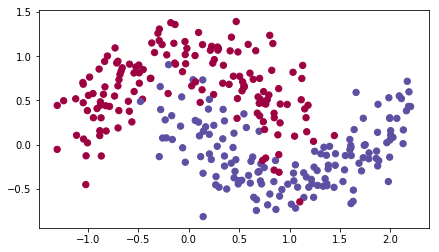

In [44]:
train_X, train_Y = load_dataset()

We have already implemented a 3-layer neural network. You will train it with: 
- Mini-batch **Gradient Descent**: it will call your function:
    - `update_parameters_with_gd()`
- Mini-batch **Momentum**: it will call your functions:
    - `initialize_velocity()` and `update_parameters_with_momentum()`
- Mini-batch **Adam**: it will call your functions:
    - `initialize_adam()` and `update_parameters_with_adam()`

In [45]:
def model(X, Y, layers_dims, optimizer, learning_rate = 0.0007, mini_batch_size = 64, beta = 0.9,
          beta1 = 0.9, beta2 = 0.999,  epsilon = 1e-8, num_epochs = 10000, print_cost = True):
    """
    3-layer neural network model which can be run in different optimizer modes.
    
    Arguments:
    X -- input data, of shape (2, number of examples)
    Y -- true "label" vector (1 for blue dot / 0 for red dot), of shape (1, number of examples)
    layers_dims -- python list, containing the size of each layer
    learning_rate -- the learning rate, scalar.
    mini_batch_size -- the size of a mini batch
    beta -- Momentum hyperparameter
    beta1 -- Exponential decay hyperparameter for the past gradients estimates 
    beta2 -- Exponential decay hyperparameter for the past squared gradients estimates 
    epsilon -- hyperparameter preventing division by zero in Adam updates
    num_epochs -- number of epochs
    print_cost -- True to print the cost every 1000 epochs

    Returns:
    parameters -- python dictionary containing your updated parameters 
    """

    L = len(layers_dims)             # number of layers in the neural networks
    costs = []                       # to keep track of the cost
    t = 0                            # initializing the counter required for Adam update
    seed = 10                        # For grading purposes, so that your "random" minibatches are the same as ours
    
    # Initialize parameters
    parameters = initialize_parameters(layers_dims)

    # Initialize the optimizer
    if optimizer == "gd":
        pass # no initialization required for gradient descent
    elif optimizer == "momentum":
        v = initialize_velocity(parameters)
    elif optimizer == "adam":
        v, s = initialize_adam(parameters)
    
    # Optimization loop
    for i in range(num_epochs):
        
        # Define the random minibatches. We increment the seed to reshuffle differently the dataset after each epoch
        seed = seed + 1
        minibatches = random_mini_batches(X, Y, mini_batch_size, seed)

        for minibatch in minibatches:

            # Select a minibatch
            (minibatch_X, minibatch_Y) = minibatch

            # Forward propagation
            a3, caches = forward_propagation(minibatch_X, parameters)

            # Compute cost
            cost = compute_cost(a3, minibatch_Y)

            # Backward propagation
            grads = backward_propagation(minibatch_X, minibatch_Y, caches)

            # Update parameters
            if optimizer == "gd":
                parameters = update_parameters_with_gd(parameters, grads, learning_rate)
            elif optimizer == "momentum":
                parameters, v = update_parameters_with_momentum(parameters, grads, v, beta, learning_rate)
            elif optimizer == "adam":
                t = t + 1 # Adam counter
                parameters, v, s = update_parameters_with_adam(parameters, grads, v, s,
                                                               t, learning_rate, beta1, beta2,  epsilon)
        
        # Print the cost every 1000 epoch
        if print_cost and i % 1000 == 0:
            print ("Cost after epoch %i: %f" %(i, cost))
        if print_cost and i % 100 == 0:
            costs.append(cost)
                
    # plot the cost
    plt.plot(costs)
    plt.ylabel('cost')
    plt.xlabel('epochs (per 100)')
    plt.title("Learning rate = " + str(learning_rate))
    plt.show()

    return parameters

You will now run this 3 layer neural network with each of the 3 optimization methods.

### 5.1 - Mini-batch Gradient descent

Run the following code to see how the model does with mini-batch gradient descent.

In [ ]:
# train 3-layer model
layers_dims = [train_X.shape[0], 5, 2, 1]
parameters = model(train_X, train_Y, layers_dims, optimizer = "gd")

# Predict
predictions = predict(train_X, train_Y, parameters)

# Plot decision boundary
plt.title("Model with Gradient Descent optimization")
axes = plt.gca()
axes.set_xlim([-1.5,2.5])
axes.set_ylim([-1,1.5])
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

{'W1': array([[ 1.78862847,  0.43650985],
       [ 0.09649747, -1.8634927 ],
       [-0.2773882 , -0.35475898],
       [-0.08274148, -0.62700068],
       [-0.04381817, -0.47721803]]), 'b1': array([[ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.]]), 'W2': array([[-0.83096103,  0.55948432,  0.55739447,  1.08122894,  0.03164405],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.],
       [ 0.]]), 'W3': array([[-1.18504653, -0.2056499 ]]), 'b3': array([[ 0.]])}
{'W1': array([[ 1.78864592,  0.4364933 ],
       [ 0.0964832 , -1.8634772 ],
       [-0.27742535, -0.35473334],
       [-0.08277551, -0.62697032],
       [-0.04381916, -0.47721714]]), 'b1': array([[  3.11198156e-05],
       [ -2.56064398e-05],
       [  2.32631396e-06],
       [ -4.33006467e-05],
       [ -1.26726907e-06]]), 'W2': array([[-0.83098989,  0.55943022,  0.55739664,  1.08121394,  0.03163203],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]])

{'W1': array([[ 1.7891283 ,  0.43599199],
       [ 0.09609712, -1.86308327],
       [-0.27879564, -0.35393845],
       [-0.08387849, -0.62619053],
       [-0.04384702, -0.47719488]]), 'b1': array([[  1.10167567e-03],
       [ -8.75965603e-04],
       [  2.30110825e-04],
       [ -1.35157475e-03],
       [ -4.36981279e-05]]), 'W2': array([[-0.83176549,  0.55805071,  0.55757499,  1.08084779,  0.03133345],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.00177933],
       [ 0.        ]]), 'W3': array([[-1.1846651, -0.2056499]]), 'b3': array([[ 0.00031075]])}
{'W1': array([[ 1.78913893,  0.43598172],
       [ 0.09608923, -1.86307514],
       [-0.27881621, -0.35392269],
       [-0.08389378, -0.62617478],
       [-0.04384746, -0.47719442]]), 'b1': array([[  1.12063392e-03],
       [ -8.98442155e-04],
       [  2.21804094e-04],
       [ -1.39510795e-03],
       [ -4.49601421e-05]]), 'W2': array([[-0.83178301,  0.55802225,  0.55757528,  1.08083991,  

{'W1': array([[ 1.789637  ,  0.43546247],
       [ 0.0956896 , -1.86267424],
       [-0.28023821, -0.35309437],
       [-0.08500485, -0.62538117],
       [-0.04387575, -0.47717193]]), 'b1': array([[  2.22573014e-03],
       [ -1.75613422e-03],
       [  4.88001310e-04],
       [ -2.73991380e-03],
       [ -8.76024371e-05]]), 'W2': array([[-0.83258431,  0.55661554,  0.55776307,  1.0804697 ,  0.03102269],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.00360635],
       [ 0.        ]]), 'W3': array([[-1.18430459, -0.2056499 ]]), 'b3': array([[ 0.00078006]])}
{'W1': array([[ 1.78964689,  0.43545368],
       [ 0.09567955, -1.86266887],
       [-0.28027255, -0.35308046],
       [-0.08504485, -0.6253702 ],
       [-0.04387661, -0.47717164]]), 'b1': array([[  2.24317000e-03],
       [ -1.76381226e-03],
       [  4.99138911e-04],
       [ -2.73777089e-03],
       [ -8.78015664e-05]]), 'W2': array([[-0.83260101,  0.55659586,  0.55777153,  1.0804665 ,

{'W1': array([[ 1.79015353,  0.43491845],
       [ 0.09527442, -1.86225673],
       [-0.28170984, -0.35223501],
       [-0.08620212, -0.62454989],
       [-0.0439052 , -0.47714867]]), 'b1': array([[ 0.00334033],
       [-0.00263835],
       [ 0.00075568],
       [-0.00408672],
       [-0.00013083]]), 'W2': array([[-0.83341368,  0.55514888,  0.55796125,  1.08008787,  0.0307052 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.00547673],
       [ 0.        ]]), 'W3': array([[-1.18394335, -0.2056499 ]]), 'b3': array([[ 0.00128446]])}
{'W1': array([[ 1.7901636 ,  0.43490047],
       [ 0.09526903, -1.86224915],
       [-0.28173583, -0.35221642],
       [-0.08621261, -0.62453514],
       [-0.0439055 , -0.47714825]]), 'b1': array([[ 0.00336147],
       [-0.00265979],
       [ 0.00076235],
       [-0.00412842],
       [-0.00013201]]), 'W2': array([[-0.83342601,  0.55512263,  0.55796265,  1.08008034,  0.03069912],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.790653  ,  0.43434658],
       [ 0.09488944, -1.8618693 ],
       [-0.28312677, -0.35141702],
       [-0.0873099 , -0.62377889],
       [-0.04393283, -0.47712724]]), 'b1': array([[ 0.0043513 ],
       [-0.00347364],
       [ 0.00104692],
       [-0.00537858],
       [-0.00017113]]), 'W2': array([[-0.83419273,  0.55378636,  0.55816304,  1.07973687,  0.03041056],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.00735567],
       [ 0.        ]]), 'W3': array([[-1.18363133, -0.2056499 ]]), 'b3': array([[ 0.00150346]])}
{'W1': array([[ 1.79066271,  0.43433024],
       [ 0.0948843 , -1.86186283],
       [-0.28314596, -0.3514025 ],
       [-0.08731991, -0.62376629],
       [-0.04393311, -0.47712689]]), 'b1': array([[ 0.00436567],
       [-0.00349052],
       [ 0.00104008],
       [-0.00541148],
       [-0.00017206]]), 'W2': array([[-0.83420516,  0.55376386,  0.55816361,  1.07973056,  0.0304054 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.79115859,  0.43376019],
       [ 0.09450034, -1.86147802],
       [-0.28451313, -0.35060478],
       [-0.08842226, -0.62299786],
       [-0.04396017, -0.47710575]]), 'b1': array([[ 0.00534511],
       [-0.00429567],
       [ 0.00127178],
       [-0.00665045],
       [-0.00021063]]), 'W2': array([[-0.83497845,  0.55240854,  0.55835757,  1.07938345,  0.03011166],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.00926302],
       [ 0.        ]]), 'W3': array([[-1.18331654, -0.2056499 ]]), 'b3': array([[ 0.00192282]])}
{'W1': array([[ 1.79116551,  0.43375252],
       [ 0.09449577, -1.86147295],
       [-0.28454777, -0.35058924],
       [-0.08844819, -0.6229868 ],
       [-0.04396067, -0.47710547]]), 'b1': array([[ 0.00535542],
       [-0.00430249],
       [ 0.00129407],
       [-0.0066457 ],
       [-0.00021076]]), 'W2': array([[-0.83498937,  0.55239072,  0.55836551,  1.07937916,  0.03010792],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.79167934,  0.43316131],
       [ 0.09410298, -1.86107351],
       [-0.28598542, -0.34973632],
       [-0.08955368, -0.62218887],
       [-0.04398756, -0.47708371]]), 'b1': array([[ 0.00635535],
       [-0.00512782],
       [ 0.00157086],
       [-0.00794208],
       [-0.00025057]]), 'W2': array([[-0.83579148,  0.55098302,  0.55856573,  1.07901872,  0.0298013 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.01125396],
       [ 0.        ]]), 'W3': array([[-1.18300079, -0.2056499 ]]), 'b3': array([[ 0.00232647]])}
{'W1': array([[ 1.79168737,  0.43314881],
       [ 0.09409397, -1.86107029],
       [-0.28601841, -0.3497217 ],
       [-0.08957132, -0.62218257],
       [-0.04398805, -0.47708354]]), 'b1': array([[ 0.00636725],
       [-0.00513762],
       [ 0.00158496],
       [-0.00796126],
       [-0.0002511 ]]), 'W2': array([[-0.8358023 ,  0.5509707 ,  0.55857351,  1.0790167 ,  0.02979924],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.79216108,  0.43260657],
       [ 0.09373399, -1.86069643],
       [-0.28742173, -0.3489021 ],
       [-0.09065485, -0.62143143],
       [-0.04401373, -0.47706332]]), 'b1': array([[ 0.00729286],
       [-0.0059115 ],
       [ 0.0018999 ],
       [-0.00912376],
       [-0.00028715]]), 'W2': array([[-0.8365443 ,  0.54965285,  0.55878218,  1.07868344,  0.02951239],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.01328142],
       [ 0.        ]]), 'W3': array([[-1.18272425, -0.2056499 ]]), 'b3': array([[ 0.00262083]])}
{'W1': array([[ 1.79217626,  0.43258973],
       [ 0.09372149, -1.86068483],
       [-0.28745726, -0.34888095],
       [-0.09068503, -0.62140801],
       [-0.0440144 , -0.47706269]]), 'b1': array([[ 0.00733103],
       [-0.0059383 ],
       [ 0.00189659],
       [-0.00916996],
       [-0.00028859]]), 'W2': array([[-0.83656844,  0.54961174,  0.55878724,  1.07867288,  0.02950334],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.79268875,  0.43199341],
       [ 0.09333629, -1.86029379],
       [-0.2888635 , -0.34804368],
       [-0.091769  , -0.62062389],
       [-0.04404036, -0.47704172]]), 'b1': array([[ 0.00832709],
       [-0.00675263],
       [ 0.00215537],
       [-0.01046174],
       [-0.00032732]]), 'W2': array([[-0.83736728,  0.54823016,  0.55899114,  1.07832477,  0.02920189],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.01513898],
       [ 0.        ]]), 'W3': array([[-1.18243251, -0.2056499 ]]), 'b3': array([[ 0.0031133]])}
{'W1': array([[ 1.79269569,  0.43198727],
       [ 0.09333197, -1.86028964],
       [-0.28888543, -0.34803421],
       [-0.09179067, -0.62061469],
       [-0.04404076, -0.47704149]]), 'b1': array([[ 0.0083389 ],
       [-0.00676408],
       [ 0.00215642],
       [-0.01047202],
       [-0.00032777]]), 'W2': array([[-0.83737909,  0.54821549,  0.55899658,  1.07832143,  0.02919872],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.79318274,  0.43141834],
       [ 0.09296245, -1.85991449],
       [-0.29032646, -0.3471934 ],
       [-0.09287715, -0.61985903],
       [-0.04406625, -0.47702153]]), 'b1': array([[ 0.00928977],
       [-0.00754552],
       [ 0.00249152],
       [-0.01167181],
       [-0.00036396]]), 'W2': array([[-0.83813828,  0.54688845,  0.55922158,  1.07799204,  0.02891005],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.01712271],
       [ 0.        ]]), 'W3': array([[-1.1821828, -0.2056499]]), 'b3': array([[ 0.00338775]])}
{'W1': array([[ 1.79320251,  0.43139844],
       [ 0.09294566, -1.85990255],
       [-0.2903549 , -0.34717522],
       [-0.09291026, -0.61983548],
       [-0.04406713, -0.4770209 ]]), 'b1': array([[ 0.00932729],
       [-0.00756578],
       [ 0.00248819],
       [-0.01171174],
       [-0.00036503]]), 'W2': array([[-0.83817074,  0.54684525,  0.55922504,  1.07798179,  0.028901  ],
       [-0.25594047, -0.34491592, -0.

       [ 0.       ]]), 'W3': array([[-1.18190764, -0.2056499 ]]), 'b3': array([[ 0.00396516]])}
{'W1': array([[ 1.79367692,  0.43084822],
       [ 0.09258873, -1.85952311],
       [-0.29172817, -0.34635789],
       [-0.09396112, -0.61907034],
       [-0.04409154, -0.47700086]]), 'b1': array([[ 0.01026484],
       [-0.00835769],
       [ 0.002754  ],
       [-0.01294905],
       [-0.00040168]]), 'W2': array([[-0.83891346,  0.54550422,  0.55943408,  1.07764725,  0.02860657],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.01898865],
       [ 0.        ]]), 'W3': array([[-1.18190029, -0.2056499 ]]), 'b3': array([[ 0.00397512]])}
{'W1': array([[ 1.79368209,  0.43083365],
       [ 0.09258692, -1.85952005],
       [-0.29176159, -0.34633841],
       [-0.0939647 , -0.61906429],
       [-0.04409163, -0.4770007 ]]), 'b1': array([[ 0.01026736],
       [-0.00836443],
       [ 0.0027823 ],
       [-0.01296236],
       [-0.00040203]]), 'W2': array([[-0.83

{'W1': array([[ 1.79412933,  0.43030191],
       [ 0.09224492, -1.85917106],
       [-0.29311671, -0.34554953],
       [-0.09498296, -0.61835787],
       [-0.04411498, -0.47698241]]), 'b1': array([[ 0.01115138],
       [-0.00909004],
       [ 0.00310191],
       [-0.01407503],
       [-0.00043503]]), 'W2': array([[-0.83961148,  0.54425631,  0.55966172,  1.07734181,  0.02833426],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.0209852],
       [ 0.       ]]), 'W3': array([[-1.18167707, -0.2056499 ]]), 'b3': array([[ 0.00435492]])}
{'W1': array([[ 1.79413693,  0.43029272],
       [ 0.09223614, -1.85916514],
       [-0.29314523, -0.3455342 ],
       [-0.09500662, -0.61834577],
       [-0.0441156 , -0.47698209]]), 'b1': array([[ 0.01117108],
       [-0.00910665],
       [ 0.00310529],
       [-0.01410186],
       [-0.00043574]]), 'W2': array([[-0.83962329,  0.54423489,  0.5596672 ,  1.07733731,  0.02832988],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.18144715, -0.2056499 ]]), 'b3': array([[ 0.00473165]])}
{'W1': array([[ 1.79458728,  0.42973954],
       [ 0.09189965, -1.85881657],
       [-0.2944814 , -0.34475412],
       [-0.09600818, -0.61763914],
       [-0.04413829, -0.47696396]]), 'b1': array([[ 0.01201219],
       [-0.00981526],
       [ 0.00343381],
       [-0.01519045],
       [-0.00046778]]), 'W2': array([[-0.84031373,  0.54299826,  0.55988941,  1.07703548,  0.02805928],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.02296686],
       [ 0.        ]]), 'W3': array([[-1.18145629, -0.2056499 ]]), 'b3': array([[ 0.00470767]])}
{'W1': array([[ 1.7945914 ,  0.42973573],
       [ 0.09189436, -1.85881444],
       [-0.29450927, -0.34474487],
       [-0.09603051, -0.61763387],
       [-0.04413873, -0.47696384]]), 'b1': array([[ 0.01201832],
       [-0.00981664],
       [ 0.00345556],
       [-0.01518084],
       [-0.0004677 ]]), 'W2': array([[-0.8

{'W1': array([[ 1.79509643,  0.42908753],
       [ 0.09152402, -1.85842785],
       [-0.29593057, -0.34390056],
       [-0.09710046, -0.61684962],
       [-0.04416296, -0.47694389]]), 'b1': array([[ 0.01291778],
       [-0.01061851],
       [ 0.00379314],
       [-0.01645657],
       [-0.00050429]]), 'W2': array([[-0.84108111,  0.54161765,  0.56013077,  1.07669944,  0.02775582],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.0250972],
       [ 0.       ]]), 'W3': array([[-1.18121279, -0.2056499 ]]), 'b3': array([[ 0.00522497]])}
{'W1': array([[ 1.79509881,  0.42907766],
       [ 0.09152173, -1.85842886],
       [-0.29595205, -0.34389732],
       [-0.09712369, -0.61685185],
       [-0.04416356, -0.47694394]]), 'b1': array([[ 0.01290995],
       [-0.01061627],
       [ 0.00381388],
       [-0.0164358 ],
       [-0.00050375]]), 'W2': array([[-0.84108104,  0.54162068,  0.56014027,  1.0767025 ,  0.02775775],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.79555406,  0.42848882],
       [ 0.09118857, -1.85808482],
       [-0.2972366 , -0.34315695],
       [-0.09811428, -0.61615138],
       [-0.04418569, -0.47692631]]), 'b1': array([[ 0.01371366],
       [-0.01132541],
       [ 0.00420536],
       [-0.0175374 ],
       [-0.00053535]]), 'W2': array([[-0.84176502,  0.54039709,  0.56036909,  1.07640854,  0.0274894 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.02709083],
       [ 0.        ]]), 'W3': array([[-1.18102657, -0.2056499 ]]), 'b3': array([[ 0.00561439]])}
{'W1': array([[ 1.7955587 ,  0.42848465],
       [ 0.09118559, -1.85808214],
       [-0.29726709, -0.34314249],
       [-0.09812022, -0.61614605],
       [-0.04418584, -0.47692618]]), 'b1': array([[ 0.01373008],
       [-0.01133595],
       [ 0.00422949],
       [-0.01755839],
       [-0.00053589]]), 'W2': array([[-0.84177307,  0.54038761,  0.56037659,  1.07640637,  0.0274873 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.79605006,  0.42785584],
       [ 0.09083096, -1.85770944],
       [-0.29863901, -0.34234328],
       [-0.0991754 , -0.61538454],
       [-0.04420887, -0.47690723]]), 'b1': array([[ 0.01460377],
       [-0.01210536],
       [ 0.00465242],
       [-0.01876227],
       [-0.00057028]]), 'W2': array([[-0.84251583,  0.53906159,  0.56062046,  1.07608767,  0.0271947 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.02928692],
       [ 0.        ]]), 'W3': array([[-1.18082401, -0.2056499 ]]), 'b3': array([[ 0.0060492]])}
{'W1': array([[ 1.79605994,  0.42783971],
       [ 0.09082084, -1.85770411],
       [-0.29867635, -0.34232588],
       [-0.09920149, -0.61537377],
       [-0.04420953, -0.47690696]]), 'b1': array([[ 0.01461774],
       [-0.01211258],
       [ 0.00467164],
       [-0.01877082],
       [-0.0005705 ]]), 'W2': array([[-0.84252894,  0.53904167,  0.56062989,  1.07608406,  0.02719101],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.79652711,  0.42724031],
       [ 0.09048206, -1.85735643],
       [-0.30001435, -0.34156697],
       [-0.10023993, -0.6146629 ],
       [-0.0442323 , -0.47688943]]), 'b1': array([[ 0.0154451 ],
       [-0.01283918],
       [ 0.00510476],
       [-0.01988326],
       [-0.00060186]]), 'W2': array([[-0.84323526,  0.53780201,  0.56088509,  1.07579391,  0.02692003],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.03142866],
       [ 0.        ]]), 'W3': array([[-1.18066989, -0.2056499 ]]), 'b3': array([[ 0.00634973]])}
{'W1': array([[ 1.79653836,  0.42722948],
       [ 0.09047333, -1.85735021],
       [-0.30003576, -0.34155703],
       [-0.10025739, -0.61465047],
       [-0.04423274, -0.47688912]]), 'b1': array([[ 0.0154689 ],
       [-0.01285284],
       [ 0.0051222 ],
       [-0.01991058],
       [-0.00060255]]), 'W2': array([[-0.84325418,  0.5377794 ,  0.56089064,  1.07578894,  0.02691526],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18051798, -0.2056499 ]]), 'b3': array([[ 0.0066832]])}
{'W1': array([[ 1.79697901,  0.42665766],
       [ 0.09015374, -1.85701775],
       [-0.30131124, -0.34082871],
       [-0.10123977, -0.61396856],
       [-0.04425389, -0.47687249]]), 'b1': array([[ 0.0162453 ],
       [-0.01353903],
       [ 0.00552096],
       [-0.02096159],
       [-0.00063207]]), 'W2': array([[-0.8439179 ,  0.53659315,  0.56113502,  1.07551145,  0.02665478],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.03344488],
       [ 0.        ]]), 'W3': array([[-1.18051833, -0.2056499 ]]), 'b3': array([[ 0.00672484]])}
{'W1': array([[ 1.79699008,  0.42664038],
       [ 0.09014676, -1.85700587],
       [-0.30134076, -0.34081194],
       [-0.10127281, -0.61394375],
       [-0.04425441, -0.4768719 ]]), 'b1': array([[ 0.0162597 ],
       [-0.01355754],
       [ 0.00552413],
       [-0.02098113],
       [-0.00063285]]), 'W2': array([[-0.84

{'W1': array([[ 1.79744823,  0.42605199],
       [ 0.08980883, -1.8566697 ],
       [-0.3026234 , -0.34007775],
       [-0.10225716, -0.61325422],
       [-0.04427575, -0.47685521]]), 'b1': array([[ 0.01708313],
       [-0.01425776],
       [ 0.00593418],
       [-0.02209693],
       [-0.0006633 ]]), 'W2': array([[-0.8446274 ,  0.53534808,  0.56138963,  1.0752228 ,  0.02638132],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.03548832],
       [ 0.        ]]), 'W3': array([[-1.180372 , -0.2056499]]), 'b3': array([[ 0.00707958]])}
{'W1': array([[ 1.79746645,  0.42603224],
       [ 0.08979729, -1.85665717],
       [-0.30265465, -0.34005729],
       [-0.10228034, -0.61322907],
       [-0.04427632, -0.47685459]]), 'b1': array([[ 0.01711572],
       [-0.01427842],
       [ 0.00594004],
       [-0.02213842],
       [-0.00066431]]), 'W2': array([[-0.84465685,  0.53530326,  0.56139414,  1.07521151,  0.02637115],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.79791317,  0.42544987],
       [ 0.08947821, -1.85632578],
       [-0.30391873, -0.33934305],
       [-0.10327321, -0.61254566],
       [-0.04429732, -0.47683825]]), 'b1': array([[ 0.01789659],
       [-0.01497293],
       [ 0.00637267],
       [-0.02320264],
       [-0.00069357]]), 'W2': array([[-0.84533   ,  0.53411822,  0.56164949,  1.07493924,  0.02611043],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.0375505],
       [ 0.       ]]), 'W3': array([[-1.18024086, -0.2056499 ]]), 'b3': array([[ 0.00748618]])}
{'W1': array([[ 1.7979232 ,  0.42543587],
       [ 0.08946882, -1.85632221],
       [-0.30395687, -0.33932738],
       [-0.10329876, -0.61253782],
       [-0.04429778, -0.47683807]]), 'b1': array([[ 0.01790821],
       [-0.01497965],
       [ 0.00640278],
       [-0.02321017],
       [-0.0006939 ]]), 'W2': array([[-0.84534453,  0.53410441,  0.56166101,  1.07493739,  0.02610802],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.79836157,  0.42490953],
       [ 0.08915062, -1.85598813],
       [-0.30518694, -0.33862294],
       [-0.10425272, -0.61185013],
       [-0.04431796, -0.47682175]]), 'b1': array([[ 0.01876925],
       [-0.01568174],
       [ 0.00681674],
       [-0.02433121],
       [-0.00072387]]), 'W2': array([[-0.84603065,  0.53290902,  0.56190766,  1.07466256,  0.02584367],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.03949506],
       [ 0.        ]]), 'W3': array([[-1.18012474, -0.2056499 ]]), 'b3': array([[ 0.00780063]])}
{'W1': array([[ 1.79836931,  0.42490025],
       [ 0.08914321, -1.8559826 ],
       [-0.30521421, -0.33860918],
       [-0.10427316, -0.61183834],
       [-0.04431832, -0.47682148]]), 'b1': array([[ 0.01878875],
       [-0.01569153],
       [ 0.00682627],
       [-0.02434471],
       [-0.00072434]]), 'W2': array([[-0.84604288,  0.53288881,  0.5619143 ,  1.07465813,  0.02583936],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18001164, -0.2056499 ]]), 'b3': array([[ 0.00815245]])}
{'W1': array([[ 1.79882333,  0.42435974],
       [ 0.08881076, -1.85563858],
       [-0.30650135, -0.33787942],
       [-0.10527609, -0.61112833],
       [-0.04433928, -0.47680481]]), 'b1': array([[ 0.01967553],
       [-0.01639679],
       [ 0.00729314],
       [-0.02545661],
       [-0.00075399]]), 'W2': array([[-0.84675662,  0.53165507,  0.56218138,  1.07437761,  0.0255672 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.04151311],
       [ 0.        ]]), 'W3': array([[-1.1800139, -0.2056499]]), 'b3': array([[ 0.0081297]])}
{'W1': array([[ 1.7988315 ,  0.42434716],
       [ 0.08880784, -1.85563438],
       [-0.30651335, -0.33787056],
       [-0.10528199, -0.61111984],
       [-0.04433942, -0.47680461]]), 'b1': array([[ 0.01968171],
       [-0.01640812],
       [ 0.00729096],
       [-0.02547949],
       [-0.00075454]]), 'W2': array([[-0.8467

       [ 0.        ]]), 'W3': array([[-1.17989938, -0.2056499 ]]), 'b3': array([[ 0.00850195]])}
{'W1': array([[ 1.7992884 ,  0.42380618],
       [ 0.08847151, -1.85528446],
       [-0.30781675, -0.33712686],
       [-0.10628803, -0.61039642],
       [-0.04436023, -0.4767878 ]]), 'b1': array([[ 0.02059515],
       [-0.01713158],
       [ 0.00776238],
       [-0.0266363 ],
       [-0.00078493]]), 'W2': array([[-0.84748903,  0.53038431,  0.56245445,  1.0740897 ,  0.02528571],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.04351908],
       [ 0.        ]]), 'W3': array([[-1.179902 , -0.2056499]]), 'b3': array([[ 0.00852679]])}
{'W1': array([[ 1.79929987,  0.42379091],
       [ 0.08846338, -1.85527379],
       [-0.30784319, -0.33710954],
       [-0.10632271, -0.61037317],
       [-0.04436077, -0.47678728]]), 'b1': array([[ 0.02061273],
       [-0.01715332],
       [ 0.00775894],
       [-0.02666228],
       [-0.00078583]]), 'W2': array([[-0.847

{'W1': array([[ 1.79977125,  0.42320182],
       [ 0.08812299, -1.85492396],
       [-0.30913434, -0.33636316],
       [-0.10733495, -0.60964827],
       [-0.04438143, -0.47677063]]), 'b1': array([[ 0.02149486],
       [-0.01787105],
       [ 0.0082044 ],
       [-0.02781436],
       [-0.00081583]]), 'W2': array([[-0.8482343 ,  0.52908821,  0.56272599,  1.07379868,  0.02499853],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.04541953],
       [ 0.        ]]), 'W3': array([[-1.17978566, -0.2056499 ]]), 'b3': array([[ 0.00893039]])}
{'W1': array([[ 1.79977694,  0.42318041],
       [ 0.08812238, -1.85492326],
       [-0.30916212, -0.33635121],
       [-0.10734603, -0.60964725],
       [-0.04438169, -0.47677061]]), 'b1': array([[ 0.02148735],
       [-0.01787622],
       [ 0.00822197],
       [-0.02781732],
       [-0.0008159 ]]), 'W2': array([[-0.84823549,  0.52908584,  0.56273436,  1.07379929,  0.02499853],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80025367,  0.42254096],
       [ 0.08779405, -1.85458518],
       [-0.31046453, -0.33560836],
       [-0.10836292, -0.60894661],
       [-0.04440206, -0.47675463]]), 'b1': array([[ 0.02229811],
       [-0.01858635],
       [ 0.00869218],
       [-0.02885252],
       [-0.00084486]]), 'W2': array([[-0.84894899,  0.52786916,  0.56301483,  1.07353112,  0.02472961],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.04753853],
       [ 0.        ]]), 'W3': array([[-1.17972569, -0.2056499 ]]), 'b3': array([[ 0.00932794]])}
{'W1': array([[ 1.80026338,  0.42252851],
       [ 0.08778671, -1.85457798],
       [-0.31049619, -0.33558959],
       [-0.10838373, -0.6089316 ],
       [-0.0444024 , -0.4767543 ]]), 'b1': array([[ 0.02232448],
       [-0.01860484],
       [ 0.00869942],
       [-0.02887666],
       [-0.00084573]]), 'W2': array([[-0.84896408,  0.52784331,  0.56302122,  1.07352535,  0.02472376],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80075076,  0.42189788],
       [ 0.087449  , -1.85421888],
       [-0.31180468, -0.33482   ],
       [-0.10938815, -0.60818911],
       [-0.04442255, -0.47673752]]), 'b1': array([[ 0.0231874 ],
       [-0.01934134],
       [ 0.00917051],
       [-0.03000803],
       [-0.00087613]]), 'W2': array([[-0.84970689,  0.52655059,  0.56329352,  1.07323728,  0.02443584],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.04949331],
       [ 0.        ]]), 'W3': array([[-1.17962195, -0.2056499 ]]), 'b3': array([[ 0.009781]])}
{'W1': array([[ 1.80075913,  0.42187708],
       [ 0.087442  , -1.85421523],
       [-0.31182021, -0.33481275],
       [-0.10940785, -0.60818104],
       [-0.04442288, -0.47673735]]), 'b1': array([[ 0.02319591],
       [-0.01934939],
       [ 0.00917563],
       [-0.03001825],
       [-0.0008765 ]]), 'W2': array([[-0.84971453,  0.52653687,  0.56329789,  1.073235  ,  0.02443314],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.80122011,  0.42126247],
       [ 0.08712498, -1.85388016],
       [-0.31313256, -0.33404164],
       [-0.11039253, -0.60748359],
       [-0.04444211, -0.4767218 ]]), 'b1': array([[ 0.02400391],
       [-0.02004923],
       [ 0.00967596],
       [-0.03105519],
       [-0.00090469]]), 'W2': array([[-0.85040879,  0.52532928,  0.56357632,  1.07297027,  0.02416441],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.0514694],
       [ 0.       ]]), 'W3': array([[-1.17955431, -0.2056499 ]]), 'b3': array([[ 0.01018851]])}
{'W1': array([[ 1.80123414,  0.42123775],
       [ 0.0871167 , -1.85387352],
       [-0.31316643, -0.33402199],
       [-0.11041553, -0.60746966],
       [-0.04444263, -0.47672149]]), 'b1': array([[ 0.02401797],
       [-0.0200631 ],
       [ 0.00968403],
       [-0.03107769],
       [-0.0009052 ]]), 'W2': array([[-0.85042667,  0.52530501,  0.56358364,  1.0729654 ,  0.02415919],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.80170928,  0.4205895 ],
       [ 0.08679337, -1.85353873],
       [-0.31447572, -0.33325723],
       [-0.11142413, -0.60677125],
       [-0.04446191, -0.47670612]]), 'b1': array([[ 0.0248114 ],
       [-0.02076406],
       [ 0.01019215],
       [-0.03210876],
       [-0.00093329]]), 'W2': array([[-0.85113479,  0.52409594,  0.56386879,  1.07270477,  0.023891  ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.05343634],
       [ 0.        ]]), 'W3': array([[-1.17950944, -0.2056499 ]]), 'b3': array([[ 0.01069222]])}
{'W1': array([[ 1.80171225,  0.42058346],
       [ 0.08678942, -1.85353059],
       [-0.31450085, -0.33323938],
       [-0.11143891, -0.60675485],
       [-0.04446224, -0.47670575]]), 'b1': array([[ 0.0248253 ],
       [-0.02078099],
       [ 0.01019695],
       [-0.03213829],
       [-0.00093395]]), 'W2': array([[-0.85113849,  0.52406716,  0.56387234,  1.07269792,  0.02388435],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.802178  ,  0.41989871],
       [ 0.08648041, -1.85320928],
       [-0.31582318, -0.33246452],
       [-0.11239906, -0.60608371],
       [-0.04448065, -0.47669112]]), 'b1': array([[ 0.02551235],
       [-0.02143953],
       [ 0.01075483],
       [-0.03311061],
       [-0.00095986]]), 'W2': array([[-0.85180648,  0.52290503,  0.56416426,  1.0724482 ,  0.02362626],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.05556192],
       [ 0.        ]]), 'W3': array([[-1.17946654, -0.2056499 ]]), 'b3': array([[ 0.01107936]])}
{'W1': array([[ 1.80218809,  0.4198823 ],
       [ 0.08647421, -1.85320339],
       [-0.31584715, -0.33245148],
       [-0.11241783, -0.60607125],
       [-0.04448106, -0.47669085]]), 'b1': array([[ 0.02552552],
       [-0.02145251],
       [ 0.01075714],
       [-0.03313142],
       [-0.00096032]]), 'W2': array([[-0.85182014,  0.52288364,  0.56417004,  1.07244376,  0.02362151],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80265029,  0.41921789],
       [ 0.08615458, -1.85288171],
       [-0.31717361, -0.33168608],
       [-0.11340432, -0.60539778],
       [-0.04449972, -0.47667632]]), 'b1': array([[ 0.02626041],
       [-0.02211414],
       [ 0.01124648],
       [-0.03409597],
       [-0.00098623]]), 'W2': array([[-0.85249296,  0.52171716,  0.56447311,  1.07219741,  0.02336324],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.05777693],
       [ 0.        ]]), 'W3': array([[-1.17945735, -0.2056499 ]]), 'b3': array([[ 0.01143674]])}
{'W1': array([[ 1.80265979,  0.41919929],
       [ 0.0861518 , -1.85287766],
       [-0.317192  , -0.33167348],
       [-0.11341652, -0.60538884],
       [-0.04449984, -0.47667614]]), 'b1': array([[ 0.02626103],
       [-0.02212512],
       [ 0.01125427],
       [-0.03411267],
       [-0.00098672]]), 'W2': array([[-0.85250392,  0.5217028 ,  0.56447619,  1.07219419,  0.0233598 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80311317,  0.41853786],
       [ 0.08585186, -1.85255591],
       [-0.31851292, -0.33090529],
       [-0.11437146, -0.6047139 ],
       [-0.04451768, -0.47666174]]), 'b1': array([[ 0.02696184],
       [-0.02279233],
       [ 0.01172669],
       [-0.03508688],
       [-0.00101242]]), 'W2': array([[-0.85315935,  0.52053816,  0.56477862,  1.07194613,  0.02309965],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.05995604],
       [ 0.        ]]), 'W3': array([[-1.17943961, -0.2056499 ]]), 'b3': array([[ 0.01190439]])}
{'W1': array([[ 1.80312118,  0.41852104],
       [ 0.08584499, -1.85254572],
       [-0.31853462, -0.33088843],
       [-0.11439131, -0.60469279],
       [-0.04451811, -0.47666129]]), 'b1': array([[ 0.02698252],
       [-0.02281151],
       [ 0.01172235],
       [-0.0351207 ],
       [-0.00101315]]), 'W2': array([[-0.85316869,  0.52050159,  0.56478089,  1.07193745,  0.02309112],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80357941,  0.41785135],
       [ 0.08553628, -1.85222849],
       [-0.3198418 , -0.33013332],
       [-0.1153529 , -0.60402535],
       [-0.04453592, -0.47664722]]), 'b1': array([[ 0.02769108],
       [-0.02345896],
       [ 0.01219957],
       [-0.03607868],
       [-0.00103797]]), 'W2': array([[-0.85383144,  0.51934933,  0.56508773,  1.07169595,  0.0228347 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.06206852],
       [ 0.        ]]), 'W3': array([[-1.17942664, -0.2056499 ]]), 'b3': array([[ 0.0122423]])}
{'W1': array([[ 1.80358115,  0.41784905],
       [ 0.08553557, -1.85222195],
       [-0.31986603, -0.33011239],
       [-0.11535436, -0.60401184],
       [-0.04453595, -0.47664693]]), 'b1': array([[ 0.02769747],
       [-0.0234725 ],
       [ 0.01220817],
       [-0.03610662],
       [-0.00103857]]), 'W2': array([[-0.85383418,  0.51932648,  0.56508941,  1.07168943,  0.02282878],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.80401919,  0.41720315],
       [ 0.08524048, -1.85190943],
       [-0.32116752, -0.32935305],
       [-0.11630408, -0.60335308],
       [-0.04455318, -0.4766332 ]]), 'b1': array([[ 0.02838358],
       [-0.02411545],
       [ 0.01264176],
       [-0.0370312 ],
       [-0.00106281]]), 'W2': array([[-0.85446603,  0.51819169,  0.56539392,  1.07145249,  0.02257548],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.06418249],
       [ 0.        ]]), 'W3': array([[-1.17941064, -0.2056499 ]]), 'b3': array([[ 0.01277776]])}
{'W1': array([[ 1.8040247 ,  0.41719737],
       [ 0.08523472, -1.85190623],
       [-0.32120301, -0.32933813],
       [-0.11632134, -0.60334583],
       [-0.04455343, -0.47663306]]), 'b1': array([[ 0.02839581],
       [-0.02412049],
       [ 0.01266581],
       [-0.03703555],
       [-0.00106303]]), 'W2': array([[-0.85447524,  0.51817952,  0.56540593,  1.07145044,  0.02257303],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80445464,  0.41654032],
       [ 0.08494808, -1.85160251],
       [-0.32250646, -0.3285826 ],
       [-0.11725083, -0.60270336],
       [-0.04457004, -0.47661983]]), 'b1': array([[ 0.02902261],
       [-0.02473021],
       [ 0.01312972],
       [-0.03791229],
       [-0.00108571]]), 'W2': array([[-0.85508336,  0.51707467,  0.56571879,  1.07122077,  0.02232627],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.06639204],
       [ 0.        ]]), 'W3': array([[-1.17943059, -0.2056499 ]]), 'b3': array([[ 0.01317312]])}
{'W1': array([[ 1.80447541,  0.41651887],
       [ 0.08493552, -1.85158954],
       [-0.32253653, -0.32856072],
       [-0.11727684, -0.60267649],
       [-0.04457058, -0.47661927]]), 'b1': array([[ 0.02905869],
       [-0.02475202],
       [ 0.01313545],
       [-0.03795749],
       [-0.00108666]]), 'W2': array([[-0.85511795,  0.5170272 ,  0.56572335,  1.0712101 ,  0.02231544],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80490939,  0.41587027],
       [ 0.08464461, -1.85127726],
       [-0.32386595, -0.32780446],
       [-0.11823623, -0.60201494],
       [-0.04458751, -0.4766058 ]]), 'b1': array([[ 0.0297168 ],
       [-0.02538579],
       [ 0.01368648],
       [-0.03885682],
       [-0.00110989]]), 'W2': array([[-0.85574056,  0.51589074,  0.56605705,  1.07097576,  0.02206135],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.06867667],
       [ 0.        ]]), 'W3': array([[-1.17945433, -0.2056499 ]]), 'b3': array([[ 0.0136759]])}
{'W1': array([[ 1.80492358,  0.41585154],
       [ 0.08463606, -1.85126596],
       [-0.32390276, -0.32777728],
       [-0.11825398, -0.60199149],
       [-0.04458788, -0.47660532]]), 'b1': array([[ 0.02975562],
       [-0.02540919],
       [ 0.01368997],
       [-0.0389054 ],
       [-0.0011109 ]]), 'W2': array([[-0.85576272,  0.51584996,  0.56606246,  1.0709663 ,  0.0220517 ],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.80533492,  0.41524751],
       [ 0.0843601 , -1.85097546],
       [-0.32508561, -0.32711566],
       [-0.11914955, -0.60137547],
       [-0.04460361, -0.47659291]]), 'b1': array([[ 0.03038685],
       [-0.02600276],
       [ 0.01421769],
       [-0.03975924],
       [-0.00113255]]), 'W2': array([[-0.85635906,  0.51479079,  0.56637068,  1.07075079,  0.02181512],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.07074605],
       [ 0.        ]]), 'W3': array([[-1.1794866, -0.2056499]]), 'b3': array([[ 0.01410715]])}
{'W1': array([[ 1.80534862,  0.41521656],
       [ 0.0843545 , -1.85096845],
       [-0.3251117 , -0.32709781],
       [-0.1191612 , -0.6013609 ],
       [-0.04460385, -0.47659261]]), 'b1': array([[ 0.0303988 ],
       [-0.02601945],
       [ 0.01422278],
       [-0.03979396],
       [-0.00113326]]), 'W2': array([[-0.85637335,  0.51476552,  0.56637548,  1.07074519,  0.02180916],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.80579681,  0.41454507],
       [ 0.08405588, -1.85064658],
       [-0.32642986, -0.32635475],
       [-0.12013766, -0.60067648],
       [-0.04462069, -0.47657898]]), 'b1': array([[ 0.03109363],
       [-0.02668321],
       [ 0.01483679],
       [-0.04075875],
       [-0.00115741]]), 'W2': array([[-0.85701768,  0.51359207,  0.56672061,  1.07050637,  0.02154559],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.07304923],
       [ 0.        ]]), 'W3': array([[-1.17952398, -0.2056499 ]]), 'b3': array([[ 0.01457013]])}
{'W1': array([[ 1.80580381,  0.41453267],
       [ 0.08405253, -1.8506417 ],
       [-0.3264677 , -0.32633195],
       [-0.12014994, -0.60066568],
       [-0.04462083, -0.47657878]]), 'b1': array([[ 0.03110099],
       [-0.02669495],
       [ 0.01486383],
       [-0.0407772 ],
       [-0.0011579 ]]), 'W2': array([[-0.8570267 ,  0.51357454,  0.56672999,  1.07050239,  0.02154137],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80622498,  0.41390135],
       [ 0.08377718, -1.85034753],
       [-0.32767125, -0.32564761],
       [-0.12105717, -0.60003844],
       [-0.04463627, -0.47656645]]), 'b1': array([[ 0.03174132],
       [-0.0272936 ],
       [ 0.01544152],
       [-0.04164383],
       [-0.00117934]]), 'W2': array([[-0.85763237,  0.51249997,  0.56704624,  1.07028615,  0.0213004 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.07518007],
       [ 0.        ]]), 'W3': array([[-1.17958176, -0.2056499 ]]), 'b3': array([[ 0.01505686]])}
{'W1': array([[ 1.80623246,  0.41388781],
       [ 0.08377389, -1.85034333],
       [-0.32768578, -0.32563834],
       [-0.12106448, -0.60002994],
       [-0.04463641, -0.47656627]]), 'b1': array([[ 0.0317488 ],
       [-0.02730477],
       [ 0.01544584],
       [-0.04165982],
       [-0.00117981]]), 'W2': array([[-0.85764187,  0.51248487,  0.56704943,  1.07028283,  0.02129681],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.17963422, -0.2056499 ]]), 'b3': array([[ 0.01549102]])}
{'W1': array([[ 1.80666387,  0.41324507],
       [ 0.08349064, -1.85003409],
       [-0.32892885, -0.32492275],
       [-0.12198555, -0.59937078],
       [-0.04465214, -0.47655344]]), 'b1': array([[ 0.03242673],
       [-0.02794042],
       [ 0.01599962],
       [-0.04261755],
       [-0.00120249]]), 'W2': array([[-0.85826572,  0.51135522,  0.56737386,  1.07005573,  0.0210424 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.07729915],
       [ 0.        ]]), 'W3': array([[-1.17962635, -0.2056499 ]]), 'b3': array([[ 0.01553586]])}
{'W1': array([[ 1.8066656 ,  0.41323695],
       [ 0.08348793, -1.85003435],
       [-0.32895791, -0.32491532],
       [-0.12200858, -0.59937101],
       [-0.04465258, -0.47655344]]), 'b1': array([[ 0.03241874],
       [-0.02794204],
       [ 0.01601404],
       [-0.04259391],
       [-0.00120224]]), 'W2': array([[-0.8

       [ 0.        ]]), 'W3': array([[-1.17972584, -0.2056499 ]]), 'b3': array([[ 0.01596049]])}
{'W1': array([[ 1.80704205,  0.41265251],
       [ 0.0832345 , -1.84976354],
       [-0.33022931, -0.32419719],
       [-0.1228727 , -0.59879118],
       [-0.04466689, -0.47654229]]), 'b1': array([[ 0.0330257 ],
       [-0.02851515],
       [ 0.01664169],
       [-0.04339853],
       [-0.0012222 ]]), 'W2': array([[-0.85879944,  0.51036552,  0.56773254,  1.06986408,  0.02082127],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.07960467],
       [ 0.        ]]), 'W3': array([[-1.17973426, -0.2056499 ]]), 'b3': array([[ 0.01589073]])}
{'W1': array([[ 1.80705368,  0.41263574],
       [ 0.0832275 , -1.84975238],
       [-0.33025757, -0.32417414],
       [-0.12289296, -0.59876766],
       [-0.04466728, -0.47654184]]), 'b1': array([[ 0.03304454],
       [-0.02853516],
       [ 0.01665279],
       [-0.04343491],
       [-0.0012229 ]]), 'W2': array([[-0.8

       [ 0.        ]]), 'W3': array([[-1.17983133, -0.2056499 ]]), 'b3': array([[ 0.01625622]])}
{'W1': array([[ 1.8074095 ,  0.41205788],
       [ 0.0829933 , -1.84950203],
       [-0.33149694, -0.32345416],
       [-0.12368813, -0.5982303 ],
       [-0.04468019, -0.47653163]]), 'b1': array([[ 0.03359086],
       [-0.02907344],
       [ 0.01730542],
       [-0.04420813],
       [-0.00124171]]), 'W2': array([[-0.85930893,  0.5094091 ,  0.56806716,  1.06967738,  0.02060594],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.08187577],
       [ 0.        ]]), 'W3': array([[-1.17983525, -0.2056499 ]]), 'b3': array([[ 0.01628203]])}
{'W1': array([[ 1.80741242,  0.41205001],
       [ 0.08299228, -1.84950067],
       [-0.33152248, -0.32344306],
       [-0.12370112, -0.5982267 ],
       [-0.04468034, -0.47653158]]), 'b1': array([[ 0.03359175],
       [-0.02907722],
       [ 0.01731901],
       [-0.04420454],
       [-0.00124176]]), 'W2': array([[-0.8

{'W1': array([[ 1.80777643,  0.41146751],
       [ 0.08274741, -1.84923589],
       [-0.33275986, -0.32272351],
       [-0.1245304 , -0.5976581 ],
       [-0.04469389, -0.47652086]]), 'b1': array([[ 0.03415674],
       [-0.02962613],
       [ 0.01795075],
       [-0.04498539],
       [-0.00126054]]), 'W2': array([[-0.85982004,  0.50843382,  0.56840986,  1.06948762,  0.02038655],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.08404731],
       [ 0.        ]]), 'W3': array([[-1.17992876, -0.2056499 ]]), 'b3': array([[ 0.01671374]])}
{'W1': array([[ 1.80777817,  0.4114594 ],
       [ 0.08274761, -1.84923473],
       [-0.33278726, -0.32270921],
       [-0.12454617, -0.59765426],
       [-0.04469404, -0.47652081]]), 'b1': array([[ 0.03414875],
       [-0.02963194],
       [ 0.01797775],
       [-0.04498076],
       [-0.00126062]]), 'W2': array([[-0.85981949,  0.50842999,  0.56841864,  1.06948712,  0.02038558],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80814047,  0.41088899],
       [ 0.08250951, -1.84897745],
       [-0.3340017 , -0.32200202],
       [-0.12535937, -0.59710033],
       [-0.04470714, -0.47651049]]), 'b1': array([[ 0.03473723],
       [-0.03018228],
       [ 0.01858396],
       [-0.0457767 ],
       [-0.00127935]]), 'W2': array([[-0.86033195,  0.50748708,  0.56874925,  1.06930646,  0.02017314],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.08615519],
       [ 0.        ]]), 'W3': array([[-1.18004197, -0.2056499 ]]), 'b3': array([[ 0.01715546]])}
{'W1': array([[ 1.80814283,  0.41087924],
       [ 0.08250498, -1.84897134],
       [-0.33403667, -0.32198223],
       [-0.12537655, -0.59708658],
       [-0.04470732, -0.47651024]]), 'b1': array([[ 0.03472949],
       [-0.03018697],
       [ 0.01860631],
       [-0.04577794],
       [-0.00127954]]), 'W2': array([[-0.86033194,  0.50746438,  0.56875931,  1.06930084,  0.02016781],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80849993,  0.41031523],
       [ 0.08227018, -1.84870918],
       [-0.33526898, -0.32125693],
       [-0.12618899, -0.5965216 ],
       [-0.0447202 , -0.47649983]]), 'b1': array([[ 0.03529015],
       [-0.03073821],
       [ 0.01923171],
       [-0.04656625],
       [-0.00129811]]), 'W2': array([[-0.86083601,  0.50650334,  0.56909491,  1.06911509,  0.01995032],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.08834433],
       [ 0.        ]]), 'W3': array([[-1.18013817, -0.2056499 ]]), 'b3': array([[ 0.01759271]])}
{'W1': array([[ 1.80850625,  0.41030687],
       [ 0.08226472, -1.84870549],
       [-0.33529202, -0.32124739],
       [-0.12620052, -0.5965138 ],
       [-0.04472042, -0.47649968]]), 'b1': array([[ 0.03530326],
       [-0.03074338],
       [ 0.01924876],
       [-0.04657716],
       [-0.00129832]]), 'W2': array([[-0.86084584,  0.50648927,  0.56910367,  1.06911257,  0.01994734],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80886074,  0.40974504],
       [ 0.08203113, -1.84844894],
       [-0.33652722, -0.32052606],
       [-0.12702017, -0.59595937],
       [-0.04473327, -0.47648958]]), 'b1': array([[ 0.03586353],
       [-0.03128701],
       [ 0.01987818],
       [-0.0473453 ],
       [-0.00131631]]), 'W2': array([[-0.86134604,  0.50554748,  0.5694475 ,  1.06893413,  0.01973491],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.09048803],
       [ 0.        ]]), 'W3': array([[-1.18026535, -0.2056499 ]]), 'b3': array([[ 0.01809831]])}
{'W1': array([[ 1.80886539,  0.40972917],
       [ 0.08202996, -1.84844705],
       [-0.33654808, -0.32051483],
       [-0.12702309, -0.59595562],
       [-0.04473331, -0.4764895 ]]), 'b1': array([[ 0.03585962],
       [-0.03129714],
       [ 0.0198898 ],
       [-0.04735934],
       [-0.0013167 ]]), 'W2': array([[-0.8613481 ,  0.50554099,  0.56945392,  1.06893302,  0.01973326],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80925145,  0.4091303 ],
       [ 0.08178376, -1.84816668],
       [-0.33784436, -0.31974947],
       [-0.12790886, -0.59534787],
       [-0.04474682, -0.47647858]]), 'b1': array([[ 0.03649623],
       [-0.03189481],
       [ 0.02053653],
       [-0.04821432],
       [-0.0013364 ]]), 'W2': array([[-0.86190081,  0.50451237,  0.56981402,  1.06873816,  0.01950007],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.09268035],
       [ 0.        ]]), 'W3': array([[-1.18039299, -0.2056499 ]]), 'b3': array([[ 0.01845566]])}
{'W1': array([[ 1.80925594,  0.4091182 ],
       [ 0.08177999, -1.84816368],
       [-0.33787939, -0.31972801],
       [-0.12791728, -0.59534177],
       [-0.04474696, -0.47647846]]), 'b1': array([[ 0.03650482],
       [-0.03190418],
       [ 0.02055851],
       [-0.04822676],
       [-0.00133677]]), 'W2': array([[-0.86190484,  0.50450135,  0.56982353,  1.06873633,  0.01949759],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8096111 ,  0.40854738],
       [ 0.08155081, -1.84790939],
       [-0.33915186, -0.31897175],
       [-0.12871519, -0.59479062],
       [-0.04475918, -0.47646864]]), 'b1': array([[ 0.03705473],
       [-0.03244606],
       [ 0.02122464],
       [-0.04900553],
       [-0.00135455]]), 'W2': array([[-0.862403  ,  0.50356647,  0.57017989,  1.06856064,  0.01928561],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.09486135],
       [ 0.        ]]), 'W3': array([[-1.18054149, -0.2056499 ]]), 'b3': array([[ 0.01890853]])}
{'W1': array([[ 1.80960945,  0.40855487],
       [ 0.08154748, -1.8479098 ],
       [-0.33918235, -0.31895593],
       [-0.12872225, -0.5947915 ],
       [-0.0447593 , -0.47646865]]), 'b1': array([[ 0.03706302],
       [-0.03244279],
       [ 0.02126236],
       [-0.04899859],
       [-0.00135442]]), 'W2': array([[-0.86240345,  0.50356723,  0.57019058,  1.06856166,  0.01928629],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.80999019,  0.40794251],
       [ 0.08129627, -1.84764004],
       [-0.34051484, -0.31814741],
       [-0.12957915, -0.59420665],
       [-0.0447725 , -0.47645833]]), 'b1': array([[ 0.03767577],
       [-0.03301549],
       [ 0.02195101],
       [-0.04983869],
       [-0.001373  ]]), 'W2': array([[-0.86293894,  0.50257302,  0.570559  ,  1.06837866,  0.01906188],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.09710311],
       [ 0.        ]]), 'W3': array([[-1.18070679, -0.2056499 ]]), 'b3': array([[ 0.01938068]])}
{'W1': array([[ 1.8100038 ,  0.40792394],
       [ 0.0812867 , -1.84762885],
       [-0.34054647, -0.31812642],
       [-0.12960541, -0.59418301],
       [-0.04477296, -0.4764579 ]]), 'b1': array([[ 0.03768855],
       [-0.03303265],
       [ 0.02196415],
       [-0.0498623 ],
       [-0.00137355]]), 'W2': array([[-0.86295927,  0.50253146,  0.57056668,  1.0683698 ,  0.01905234],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18085675, -0.2056499 ]]), 'b3': array([[ 0.01976265]])}
{'W1': array([[ 1.81035013,  0.40738436],
       [ 0.08105867, -1.84737791],
       [-0.34181767, -0.31735194],
       [-0.13040255, -0.59363707],
       [-0.04478485, -0.47644839]]), 'b1': array([[ 0.03825544],
       [-0.03356959],
       [ 0.0226491 ],
       [-0.05062251],
       [-0.00139084]]), 'W2': array([[-0.86345565,  0.50160681,  0.57092214,  1.06819902,  0.01884251],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.09920961],
       [ 0.        ]]), 'W3': array([[-1.1808582, -0.2056499]]), 'b3': array([[ 0.01981069]])}
{'W1': array([[ 1.81036011,  0.40736308],
       [ 0.0810545 , -1.84737266],
       [-0.34185739, -0.31733029],
       [-0.13041763, -0.59362529],
       [-0.044785  , -0.47644819]]), 'b1': array([[ 0.038264  ],
       [-0.03358083],
       [ 0.02267844],
       [-0.05064084],
       [-0.00139126]]), 'W2': array([[-0.863

{'W1': array([[ 1.81069933,  0.40682583],
       [ 0.08081879, -1.84710808],
       [-0.34324202, -0.31648173],
       [-0.13124573, -0.59304928],
       [-0.04479729, -0.47643826]]), 'b1': array([[ 0.03886583],
       [-0.0341417 ],
       [ 0.02340937],
       [-0.05144663],
       [-0.00140909]]), 'W2': array([[-0.86395164,  0.50061207,  0.5713241 ,  1.06801513,  0.01861603],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.10154096],
       [ 0.        ]]), 'W3': array([[-1.18102142, -0.2056499 ]]), 'b3': array([[ 0.02033916]])}
{'W1': array([[ 1.81070412,  0.40681459],
       [ 0.08081693, -1.84710569],
       [-0.34326178, -0.31646587],
       [-0.1312497 , -0.59304417],
       [-0.04479736, -0.47643817]]), 'b1': array([[ 0.03887285],
       [-0.03414891],
       [ 0.02342477],
       [-0.05146202],
       [-0.00140936]]), 'W2': array([[-0.8639567 ,  0.50060343,  0.57132782,  1.06801352,  0.01861394],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18119896, -0.2056499 ]]), 'b3': array([[ 0.0208174]])}
{'W1': array([[ 1.81102724,  0.40631638],
       [ 0.08059538, -1.84685054],
       [-0.34463307, -0.31562451],
       [-0.13207453, -0.59248585],
       [-0.04480918, -0.47642869]]), 'b1': array([[ 0.03949206],
       [-0.03470181],
       [ 0.02415779],
       [-0.05223122],
       [-0.00142657]]), 'W2': array([[-0.86442744,  0.4996635 ,  0.57171827,  1.06784263,  0.01839993],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.10385296],
       [ 0.        ]]), 'W3': array([[-1.18120022, -0.2056499 ]]), 'b3': array([[ 0.0208337]])}
{'W1': array([[ 1.81103054,  0.40630698],
       [ 0.08059325, -1.84684897],
       [-0.34465969, -0.31560993],
       [-0.13207906, -0.59248248],
       [-0.04480926, -0.47642864]]), 'b1': array([[ 0.03949301],
       [-0.03470717],
       [ 0.02416973],
       [-0.05224267],
       [-0.00142677]]), 'W2': array([[-0.864

       [ 0.        ]]), 'W3': array([[-1.18138331, -0.2056499 ]]), 'b3': array([[ 0.02130156]])}
{'W1': array([[ 1.81133592,  0.40583332],
       [ 0.08038194, -1.84660951],
       [-0.34594808, -0.31481776],
       [-0.13284345, -0.59195671],
       [-0.04482003, -0.47641982]]), 'b1': array([[ 0.04006593],
       [-0.03521754],
       [ 0.02486558],
       [-0.05297216],
       [-0.00144275]]), 'W2': array([[-0.86487357,  0.4987736 ,  0.57209783,  1.06768102,  0.01819674],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.10609753],
       [ 0.        ]]), 'W3': array([[-1.18138462, -0.2056499 ]]), 'b3': array([[ 0.02129691]])}
{'W1': array([[ 1.81133936,  0.40583276],
       [ 0.0803793 , -1.84660466],
       [-0.34597857, -0.3147974 ],
       [-0.13285765, -0.59194653],
       [-0.04482026, -0.47641964]]), 'b1': array([[ 0.04009404],
       [-0.03523399],
       [ 0.02486842],
       [-0.05298867],
       [-0.00144321]]), 'W2': array([[-0.8

{'W1': array([[ 1.8116488 ,  0.40535021],
       [ 0.08016628, -1.84636493],
       [-0.34730292, -0.31399048],
       [-0.1336299 , -0.59142   ],
       [-0.04483108, -0.4764109 ]]), 'b1': array([[ 0.04068416],
       [-0.03575745],
       [ 0.02557957],
       [-0.05373465],
       [-0.00145944]]), 'W2': array([[-0.86533108,  0.49787103,  0.57249535,  1.0675198 ,  0.01799055],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.10834602],
       [ 0.        ]]), 'W3': array([[-1.18158664, -0.2056499 ]]), 'b3': array([[ 0.02182289]])}
{'W1': array([[ 1.81165611,  0.40533637],
       [ 0.08016298, -1.84636105],
       [-0.34733577, -0.31397315],
       [-0.13365434, -0.59141147],
       [-0.04483149, -0.47641075]]), 'b1': array([[ 0.04069148],
       [-0.03576478],
       [ 0.02560933],
       [-0.05373471],
       [-0.00145944]]), 'W2': array([[-0.86534025,  0.49785664,  0.5725071 ,  1.06751814,  0.01798777],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81194123,  0.4048976 ],
       [ 0.07996338, -1.84613494],
       [-0.34858005, -0.31321807],
       [-0.13437751, -0.59091468],
       [-0.04484155, -0.47640258]]), 'b1': array([[ 0.04125556],
       [-0.03626116],
       [ 0.02625266],
       [-0.05444493],
       [-0.00147469]]), 'W2': array([[-0.8657584 ,  0.49702126,  0.57287872,  1.06736977,  0.01779673],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.11041007],
       [ 0.        ]]), 'W3': array([[-1.18178024, -0.2056499 ]]), 'b3': array([[ 0.02226847]])}
{'W1': array([[ 1.81194774,  0.40488937],
       [ 0.07995718, -1.84613058],
       [-0.34860572, -0.3132045 ],
       [-0.13439653, -0.59090495],
       [-0.04484186, -0.47640242]]), 'b1': array([[ 0.0412691 ],
       [-0.03626927],
       [ 0.0262621 ],
       [-0.05445688],
       [-0.00147488]]), 'W2': array([[-0.8657688 ,  0.49700464,  0.57288735,  1.06736739,  0.0177932 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81221828,  0.40445866],
       [ 0.07977084, -1.84591587],
       [-0.34984818, -0.31242872],
       [-0.13508999, -0.59043251],
       [-0.04485145, -0.47639474]]), 'b1': array([[ 0.04178832],
       [-0.03674319],
       [ 0.02695331],
       [-0.05512822],
       [-0.00148913]]), 'W2': array([[-0.86615854,  0.49621142,  0.57325307,  1.06722792,  0.01761187],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.11257029],
       [ 0.        ]]), 'W3': array([[-1.18198749, -0.2056499 ]]), 'b3': array([[ 0.02261969]])}
{'W1': array([[ 1.81221828,  0.40445866],
       [ 0.07977104, -1.84591575],
       [-0.34988322, -0.31240987],
       [-0.1351023 , -0.59043217],
       [-0.04485154, -0.47639474]]), 'b1': array([[ 0.04178832],
       [-0.03674666],
       [ 0.02698372],
       [-0.05511796],
       [-0.00148918]]), 'W2': array([[-0.86615854,  0.49621125,  0.57326561,  1.06722877,  0.01761211],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8125315 ,  0.40397593],
       [ 0.07955668, -1.84567426],
       [-0.3512005 , -0.31159936],
       [-0.13587097, -0.58990016],
       [-0.04486216, -0.47638617]]), 'b1': array([[ 0.04236825],
       [-0.03726123],
       [ 0.0276787 ],
       [-0.05586801],
       [-0.00150459]]), 'W2': array([[-0.8666167 ,  0.49531612,  0.57366292,  1.06707112,  0.01740755],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.11480103],
       [ 0.        ]]), 'W3': array([[-1.18221653, -0.2056499 ]]), 'b3': array([[ 0.02319249]])}
{'W1': array([[ 1.8125379 ,  0.40397388],
       [ 0.07955236, -1.84566856],
       [-0.35123488, -0.31157441],
       [-0.13588916, -0.58988777],
       [-0.04486245, -0.47638596]]), 'b1': array([[ 0.0424034 ],
       [-0.03728157],
       [ 0.02769312],
       [-0.05589301],
       [-0.00150518]]), 'W2': array([[-0.86663086,  0.49529574,  0.57367111,  1.0670679 ,  0.01740264],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81284909,  0.40347956],
       [ 0.0793398 , -1.8454231 ],
       [-0.35258166, -0.31074026],
       [-0.13667078, -0.58934576],
       [-0.04487298, -0.47637734]]), 'b1': array([[ 0.04300749],
       [-0.03781669],
       [ 0.02836586],
       [-0.05666509],
       [-0.0015211 ]]), 'W2': array([[-0.86708111,  0.49438675,  0.5740775 ,  1.06690892,  0.01719404],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.11697603],
       [ 0.        ]]), 'W3': array([[-1.18243289, -0.2056499 ]]), 'b3': array([[ 0.02367815]])}
{'W1': array([[ 1.81285568,  0.40347352],
       [ 0.07933624, -1.84541954],
       [-0.3525942 , -0.31073645],
       [-0.13668497, -0.58933775],
       [-0.04487311, -0.47637722]]), 'b1': array([[ 0.0430188 ],
       [-0.03782661],
       [ 0.02837427],
       [-0.05667353],
       [-0.00152144]]), 'W2': array([[-0.86709264,  0.49437364,  0.57408355,  1.06690676,  0.01719096],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8131605 ,  0.40301014],
       [ 0.07912968, -1.84518243],
       [-0.35394653, -0.30987827],
       [-0.13744525, -0.58881339],
       [-0.04488335, -0.47636897]]), 'b1': array([[ 0.04361692],
       [-0.03834122],
       [ 0.02910208],
       [-0.05742106],
       [-0.00153645]]), 'W2': array([[-0.86754426,  0.49349439,  0.57448809,  1.06675486,  0.01698945],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.11913344],
       [ 0.        ]]), 'W3': array([[-1.18267262, -0.2056499 ]]), 'b3': array([[ 0.02423476]])}
{'W1': array([[ 1.81316722,  0.40299534],
       [ 0.07912751, -1.84517771],
       [-0.35396012, -0.30986552],
       [-0.13745058, -0.58880357],
       [-0.04488342, -0.47636881]]), 'b1': array([[ 0.04362727],
       [-0.03836226],
       [ 0.02908639],
       [-0.05745565],
       [-0.00153717]]), 'W2': array([[-0.86755194,  0.49347803,  0.57448879,  1.06675198,  0.01698516],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81346126,  0.40256827],
       [ 0.07891979, -1.84494706],
       [-0.3553072 , -0.30902194],
       [-0.13822151, -0.58829142],
       [-0.04489346, -0.47636088]]), 'b1': array([[ 0.04427304],
       [-0.03886461],
       [ 0.02981354],
       [-0.05816433],
       [-0.00155174]]), 'W2': array([[-0.86800085,  0.49262095,  0.57490303,  1.06660741,  0.01678943],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.12117775],
       [ 0.        ]]), 'W3': array([[-1.18291688, -0.2056499 ]]), 'b3': array([[ 0.02480825]])}
{'W1': array([[ 1.81346542,  0.40256604],
       [ 0.07891677, -1.84494281],
       [-0.35534232, -0.30900094],
       [-0.13823312, -0.58828163],
       [-0.04489356, -0.47636073]]), 'b1': array([[ 0.04429832],
       [-0.03887565],
       [ 0.0298357 ],
       [-0.05818248],
       [-0.00155212]]), 'W2': array([[-0.86800979,  0.49260542,  0.5749146 ,  1.0666045 ,  0.01678563],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18318054, -0.2056499 ]]), 'b3': array([[ 0.02528422]])}
{'W1': array([[ 1.81377363,  0.40210524],
       [ 0.07870392, -1.84470168],
       [-0.35673496, -0.3081146 ],
       [-0.13900083, -0.58774804],
       [-0.04490376, -0.47635252]]), 'b1': array([[ 0.04494496],
       [-0.03940288],
       [ 0.03058778],
       [-0.05895915],
       [-0.00156731]]), 'W2': array([[-0.86847329,  0.4917094 ,  0.57534065,  1.06645273,  0.01658008],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.12339977],
       [ 0.        ]]), 'W3': array([[-1.18318435, -0.2056499 ]]), 'b3': array([[ 0.02535643]])}
{'W1': array([[ 1.81377952,  0.4020944 ],
       [ 0.07870062, -1.84469463],
       [-0.35676652, -0.30808865],
       [-0.13901411, -0.587733  ],
       [-0.04490397, -0.47635229]]), 'b1': array([[ 0.04495159],
       [-0.039415  ],
       [ 0.030609  ],
       [-0.05898074],
       [-0.00156765]]), 'W2': array([[-0.8

{'W1': array([[ 1.81406057,  0.40168906],
       [ 0.07850417, -1.84447822],
       [-0.35807391, -0.30725592],
       [-0.13973837, -0.58725118],
       [-0.04491329, -0.47634498]]), 'b1': array([[ 0.04557827],
       [-0.03989461],
       [ 0.03133161],
       [-0.05965828],
       [-0.00158125]]), 'W2': array([[-0.86891288,  0.49087815,  0.57575301,  1.06631425,  0.01638954],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.12543016],
       [ 0.        ]]), 'W3': array([[-1.18344848, -0.2056499 ]]), 'b3': array([[ 0.02580064]])}
{'W1': array([[ 1.81406831,  0.40167527],
       [ 0.07849756, -1.84447452],
       [-0.35810923, -0.30723546],
       [-0.13975805, -0.58724305],
       [-0.04491359, -0.47634486]]), 'b1': array([[ 0.04558521],
       [-0.03990195],
       [ 0.03135788],
       [-0.05966894],
       [-0.00158141]]), 'W2': array([[-0.86892305,  0.49086381,  0.57576549,  1.06631295,  0.01638675],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81436256,  0.4012503 ],
       [ 0.07829624, -1.84424011],
       [-0.3594722 , -0.30633496],
       [-0.14051267, -0.58672034],
       [-0.04492312, -0.47633704]]), 'b1': array([[ 0.0462356 ],
       [-0.04041149],
       [ 0.03211147],
       [-0.06040572],
       [-0.00159577]]), 'W2': array([[-0.86937528,  0.48999181,  0.57617634,  1.06616584,  0.01618569],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.12747181],
       [ 0.        ]]), 'W3': array([[-1.18370833, -0.2056499 ]]), 'b3': array([[ 0.02635812]])}
{'W1': array([[ 1.81436617,  0.40124481],
       [ 0.0782942 , -1.84423702],
       [-0.35949423, -0.30632259],
       [-0.14051711, -0.58671362],
       [-0.04492319, -0.47633693]]), 'b1': array([[ 0.046249  ],
       [-0.04041905],
       [ 0.03212056],
       [-0.06042215],
       [-0.00159602]]), 'W2': array([[-0.86938101,  0.48998047,  0.57618401,  1.06616365,  0.01618289],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81465777,  0.4008155 ],
       [ 0.07809804, -1.84401681],
       [-0.36083956, -0.30542833],
       [-0.14123233, -0.58622376],
       [-0.04493223, -0.47632967]]), 'b1': array([[ 0.04684988],
       [-0.04090445],
       [ 0.03291226],
       [-0.06112434],
       [-0.00160964]]), 'W2': array([[-0.86982363,  0.48915996,  0.5765947 ,  1.06602869,  0.01599438],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.12955696],
       [ 0.        ]]), 'W3': array([[-1.18399754, -0.2056499 ]]), 'b3': array([[ 0.02673471]])}
{'W1': array([[ 1.81466208,  0.40080923],
       [ 0.07809575, -1.84401251],
       [-0.36087276, -0.30540918],
       [-0.14124868, -0.58621453],
       [-0.04493248, -0.47632953]]), 'b1': array([[ 0.04686909],
       [-0.04091914],
       [ 0.03292557],
       [-0.06114642],
       [-0.00160997]]), 'W2': array([[-0.86983076,  0.48914462,  0.5766061 ,  1.06602705,  0.01599097],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81495741,  0.40036765],
       [ 0.07789471, -1.84378073],
       [-0.36223994, -0.30449529],
       [-0.14197728, -0.58569777],
       [-0.04494156, -0.47632196]]), 'b1': array([[ 0.04750153],
       [-0.04142681],
       [ 0.03367334],
       [-0.0619005 ],
       [-0.00162417]]), 'W2': array([[-0.87027775,  0.48828081,  0.57702302,  1.06588329,  0.01579132],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.13155541],
       [ 0.        ]]), 'W3': array([[-1.18426366, -0.2056499 ]]), 'b3': array([[ 0.02735426]])}
{'W1': array([[ 1.81495889,  0.40036325],
       [ 0.07789471, -1.84378073],
       [-0.36227741, -0.30447396],
       [-0.14199409, -0.58569644],
       [-0.04494168, -0.47632195]]), 'b1': array([[ 0.04750189],
       [-0.04142681],
       [ 0.03371539],
       [-0.06188488],
       [-0.00162406]]), 'W2': array([[-0.87027884,  0.48828081,  0.57703774,  1.06588389,  0.01579143],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81526793,  0.39991004],
       [ 0.07768428, -1.84353765],
       [-0.36377335, -0.30345777],
       [-0.14276858, -0.58515876],
       [-0.0449512 , -0.4763141 ]]), 'b1': array([[ 0.0481699 ],
       [-0.04196135],
       [ 0.03459253],
       [-0.06261811],
       [-0.00163875]]), 'W2': array([[-0.8707516 ,  0.48737427,  0.57749522,  1.06573482,  0.01558178],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.13381548],
       [ 0.        ]]), 'W3': array([[-1.18458544, -0.2056499 ]]), 'b3': array([[ 0.02787099]])}
{'W1': array([[ 1.81527963,  0.39989328],
       [ 0.07767559, -1.84353194],
       [-0.36380505, -0.30344326],
       [-0.14280319, -0.58514753],
       [-0.04495173, -0.47631391]]), 'b1': array([[ 0.04819656],
       [-0.04197306],
       [ 0.03459894],
       [-0.06261887],
       [-0.00163892]]), 'W2': array([[-0.87076976,  0.48735229,  0.57750795,  1.06573334,  0.01557766],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18487203, -0.2056499 ]]), 'b3': array([[ 0.02833354]])}
{'W1': array([[ 1.81556139,  0.39948349],
       [ 0.0774848 , -1.84331266],
       [-0.36514674, -0.3025394 ],
       [-0.1435053 , -0.58466617],
       [-0.04496034, -0.47630691]]), 'b1': array([[ 0.04880719],
       [-0.04245389],
       [ 0.03534268],
       [-0.06324451],
       [-0.0016519 ]]), 'W2': array([[-0.87120299,  0.48653348,  0.57792533,  1.06560038,  0.01538856],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.13565788],
       [ 0.        ]]), 'W3': array([[-1.18486746, -0.2056499 ]]), 'b3': array([[ 0.02839814]])}
{'W1': array([[ 1.81556949,  0.39946918],
       [ 0.07748018, -1.84330752],
       [-0.36517404, -0.30251615],
       [-0.14351458, -0.58465587],
       [-0.04496048, -0.47630675]]), 'b1': array([[ 0.04882104],
       [-0.04246633],
       [ 0.03535383],
       [-0.06326464],
       [-0.00165229]]), 'W2': array([[-0.8

{'W1': array([[ 1.81584505,  0.39907248],
       [ 0.07729137, -1.84308324],
       [-0.36652627, -0.30158402],
       [-0.14421795, -0.58416271],
       [-0.04496895, -0.47629967]]), 'b1': array([[ 0.0494275 ],
       [-0.0429574 ],
       [ 0.0361001 ],
       [-0.06391591],
       [-0.00166548]]), 'W2': array([[-0.87164067,  0.48567701,  0.57834585,  1.06546051,  0.01518987],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.13757745],
       [ 0.        ]]), 'W3': array([[-1.18513606, -0.2056499 ]]), 'b3': array([[ 0.02894762]])}
{'W1': array([[ 1.81585441,  0.39905169],
       [ 0.0772865 , -1.84307965],
       [-0.36655872, -0.30156676],
       [-0.14423331, -0.58415546],
       [-0.04496918, -0.47629955]]), 'b1': array([[ 0.0494357 ],
       [-0.04296642],
       [ 0.03612431],
       [-0.06392326],
       [-0.00166568]]), 'W2': array([[-0.87165111,  0.48566341,  0.57835892,  1.06545906,  0.0151869 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81614787,  0.39862562],
       [ 0.07709114, -1.8428528 ],
       [-0.36798639, -0.30060426],
       [-0.14496384, -0.58365477],
       [-0.04497778, -0.47629247]]), 'b1': array([[ 0.05007581],
       [-0.04346361],
       [ 0.03693861],
       [-0.06457317],
       [-0.00167887]]), 'W2': array([[-0.87210396,  0.48481505,  0.57881565,  1.06532297,  0.01499037],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.13964868],
       [ 0.        ]]), 'W3': array([[-1.18546928, -0.2056499 ]]), 'b3': array([[ 0.02950212]])}
{'W1': array([[ 1.81616033,  0.39861318],
       [ 0.0770821 , -1.84284615],
       [-0.36801074, -0.30059083],
       [-0.14498837, -0.58364078],
       [-0.04497813, -0.47629226]]), 'b1': array([[ 0.05009937],
       [-0.04347463],
       [ 0.0369512 ],
       [-0.06458496],
       [-0.00167914]]), 'W2': array([[-0.87212557,  0.48478931,  0.57882496,  1.06531935,  0.01498478],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18578682, -0.2056499 ]]), 'b3': array([[ 0.02993848]])}
{'W1': array([[ 1.81643267,  0.39820994],
       [ 0.07689811, -1.84262915],
       [-0.36939172, -0.29965702],
       [-0.14568653, -0.58316263],
       [-0.04498635, -0.47628557]]), 'b1': array([[ 0.05069618],
       [-0.04395263],
       [ 0.03769267],
       [-0.06520751],
       [-0.00169155]]), 'W2': array([[-0.87254291,  0.4839777 ,  0.57926801,  1.06519066,  0.01479707],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.14165316],
       [ 0.        ]]), 'W3': array([[-1.18578748, -0.2056499 ]]), 'b3': array([[ 0.02992852]])}
{'W1': array([[ 1.81643883,  0.39819562],
       [ 0.07689343, -1.84262385],
       [-0.36942265, -0.29963559],
       [-0.14570234, -0.58315062],
       [-0.04498657, -0.4762854 ]]), 'b1': array([[ 0.05071169],
       [-0.04396851],
       [ 0.03770199],
       [-0.06523717],
       [-0.00169196]]), 'W2': array([[-0.8

{'W1': array([[ 1.81671023,  0.39778194],
       [ 0.07671039, -1.84240948],
       [-0.3708484 , -0.29867773],
       [-0.14639823, -0.58267731],
       [-0.04499454, -0.47627885]]), 'b1': array([[ 0.05128294],
       [-0.04443841],
       [ 0.03847318],
       [-0.0658283 ],
       [-0.00170407]]), 'W2': array([[-0.87295973,  0.48315528,  0.57974403,  1.0650608 ,  0.01460607],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.14378551],
       [ 0.        ]]), 'W3': array([[-1.18612904, -0.2056499 ]]), 'b3': array([[ 0.0305567]])}
{'W1': array([[ 1.8167111 ,  0.39778311],
       [ 0.07670719, -1.8424079 ],
       [-0.37087363, -0.29866646],
       [-0.14640593, -0.5826742 ],
       [-0.04499463, -0.4762788 ]]), 'b1': array([[ 0.05130125],
       [-0.04444589],
       [ 0.03848718],
       [-0.06583376],
       [-0.0017043 ]]), 'W2': array([[-0.87296316,  0.48314942,  0.5797553 ,  1.0650605 ,  0.01460483],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.81696803,  0.39740037],
       [ 0.07652757, -1.84219743],
       [-0.37230098, -0.29771813],
       [-0.14710992, -0.5822086 ],
       [-0.04500256, -0.47627245]]), 'b1': array([[ 0.05188669],
       [-0.04491052],
       [ 0.03924813],
       [-0.06639285],
       [-0.00171599]]), 'W2': array([[-0.87335807,  0.48236073,  0.58023313,  1.06493757,  0.01442219],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.14593534],
       [ 0.        ]]), 'W3': array([[-1.18648759, -0.2056499 ]]), 'b3': array([[ 0.03103965]])}
{'W1': array([[ 1.81697166,  0.39739702],
       [ 0.0765244 , -1.84219539],
       [-0.37232634, -0.29770316],
       [-0.14711692, -0.5822041 ],
       [-0.04500265, -0.47627239]]), 'b1': array([[ 0.05189231],
       [-0.04491621],
       [ 0.03926949],
       [-0.06640541],
       [-0.00171616]]), 'W2': array([[-0.87336443,  0.48235297,  0.58024316,  1.06493686,  0.01442049],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81725409,  0.39695416],
       [ 0.07633602, -1.8419745 ],
       [-0.37373955, -0.29673372],
       [-0.1478089 , -0.58171426],
       [-0.04501053, -0.47626579]]), 'b1': array([[ 0.05247492],
       [-0.04538982],
       [ 0.04002291],
       [-0.06703947],
       [-0.00172817]]), 'W2': array([[-0.87378535,  0.48152317,  0.58070635,  1.06480469,  0.01422728],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.14794931],
       [ 0.        ]]), 'W3': array([[-1.1868212, -0.2056499]]), 'b3': array([[ 0.03164847]])}
{'W1': array([[ 1.81725635,  0.39694631],
       [ 0.07633584, -1.84197394],
       [-0.3737673 , -0.29671598],
       [-0.14782547, -0.58171405],
       [-0.04501075, -0.47626577]]), 'b1': array([[ 0.05247539],
       [-0.04539649],
       [ 0.04004128],
       [-0.06702451],
       [-0.00172816]]), 'W2': array([[-0.87378653,  0.48152164,  0.58071641,  1.06480594,  0.01422735],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.81753875,  0.3964694 ],
       [ 0.07614241, -1.8417546 ],
       [-0.37525264, -0.29571005],
       [-0.14855671, -0.58122653],
       [-0.04501888, -0.4762593 ]]), 'b1': array([[ 0.05302106],
       [-0.04587085],
       [ 0.04085213],
       [-0.06763301],
       [-0.0017399 ]]), 'W2': array([[-0.87419021,  0.48069629,  0.58121741,  1.06467994,  0.0140367 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.15018461],
       [ 0.        ]]), 'W3': array([[-1.18720075, -0.2056499 ]]), 'b3': array([[ 0.03220732]])}
{'W1': array([[ 1.81754134,  0.39646541],
       [ 0.0761423 , -1.84175178],
       [-0.37528029, -0.29568674],
       [-0.148562  , -0.58122117],
       [-0.04501895, -0.47625921]]), 'b1': array([[ 0.05303396],
       [-0.0458852 ],
       [ 0.04086317],
       [-0.06764478],
       [-0.00174025]]), 'W2': array([[-0.87419456,  0.48068682,  0.58122417,  1.0646785 ,  0.01403403],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81783496,  0.39595069],
       [ 0.07595228, -1.84153322],
       [-0.37672582, -0.29470033],
       [-0.14927853, -0.58073446],
       [-0.04502676, -0.47625284]]), 'b1': array([[ 0.05354589],
       [-0.04636247],
       [ 0.0416336 ],
       [-0.06825507],
       [-0.00175203]]), 'W2': array([[-0.87460289,  0.4798645 ,  0.58171273,  1.06455205,  0.01384294],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.15235107],
       [ 0.        ]]), 'W3': array([[-1.18756976, -0.2056499 ]]), 'b3': array([[ 0.03280655]])}
{'W1': array([[ 1.81784726,  0.39593138],
       [ 0.07594511, -1.84152706],
       [-0.37675945, -0.29467875],
       [-0.14929358, -0.58072176],
       [-0.04502696, -0.47625266]]), 'b1': array([[ 0.05356541],
       [-0.04637488],
       [ 0.04165795],
       [-0.06827544],
       [-0.00175239]]), 'W2': array([[-0.87462091,  0.47984092,  0.58172532,  1.06454854,  0.01383754],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81811177,  0.39548558],
       [ 0.07577179, -1.84131893],
       [-0.37816263, -0.29371417],
       [-0.14996872, -0.58025702],
       [-0.04503425, -0.47624666]]), 'b1': array([[ 0.05406045],
       [-0.04682394],
       [ 0.04241491],
       [-0.06885401],
       [-0.00176316]]), 'W2': array([[-0.87499939,  0.4790578 ,  0.58220242,  1.06442726,  0.01365504],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.15447818],
       [ 0.        ]]), 'W3': array([[-1.18793674, -0.2056499 ]]), 'b3': array([[ 0.03329903]])}
{'W1': array([[ 1.81811276,  0.39548333],
       [ 0.07577124, -1.8413177 ],
       [-0.37820018, -0.29369008],
       [-0.14998026, -0.58025338],
       [-0.04503434, -0.47624662]]), 'b1': array([[ 0.05406741],
       [-0.04682775],
       [ 0.04245131],
       [-0.0688517 ],
       [-0.0017632 ]]), 'W2': array([[-0.87500087,  0.47905336,  0.5822173 ,  1.06442675,  0.01365395],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81839493,  0.39500207],
       [ 0.07558914, -1.84110303],
       [-0.37967065, -0.29268391],
       [-0.15068246, -0.57977779],
       [-0.04504186, -0.47624052]]), 'b1': array([[ 0.05460614],
       [-0.04731601],
       [ 0.04325398],
       [-0.06945875],
       [-0.00177492]]), 'W2': array([[-0.87540319,  0.47824683,  0.58272646,  1.06430619,  0.0134661 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.15672462],
       [ 0.        ]]), 'W3': array([[-1.18834791, -0.2056499 ]]), 'b3': array([[ 0.03388128]])}
{'W1': array([[ 1.81840441,  0.3949878 ],
       [ 0.07558398, -1.8410943 ],
       [-0.37970381, -0.29265292],
       [-0.15069977, -0.5797586 ],
       [-0.04504208, -0.47624027]]), 'b1': array([[ 0.05461283],
       [-0.04732777],
       [ 0.04327468],
       [-0.06948044],
       [-0.0017752 ]]), 'W2': array([[-0.87541684,  0.47821357,  0.58273404,  1.0642996 ,  0.01345828],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.18873181, -0.2056499 ]]), 'b3': array([[ 0.03439551]])}
{'W1': array([[ 1.81868034,  0.39446393],
       [ 0.07541269, -1.84089078],
       [-0.38116492, -0.29163264],
       [-0.15139015, -0.57930218],
       [-0.04504918, -0.47623454]]), 'b1': array([[ 0.05504356],
       [-0.04778316],
       [ 0.04410477],
       [-0.07004177],
       [-0.00178584]]), 'W2': array([[-0.87578073,  0.4774477 ,  0.58323837,  1.06418583,  0.01327955],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.15895447],
       [ 0.        ]]), 'W3': array([[-1.18874203, -0.2056499 ]]), 'b3': array([[ 0.0343709]])}
{'W1': array([[ 1.81869138,  0.39443392],
       [ 0.07540529, -1.84088497],
       [-0.38121059, -0.29160502],
       [-0.15141785, -0.57928914],
       [-0.04504952, -0.47623438]]), 'b1': array([[ 0.05505467],
       [-0.047795  ],
       [ 0.04413052],
       [-0.07005852],
       [-0.00178605]]), 'W2': array([[-0.87

{'W1': array([[ 1.81897871,  0.39391365],
       [ 0.07522571, -1.84067064],
       [-0.38268644, -0.29055137],
       [-0.15211584, -0.57880958],
       [-0.04505663, -0.47622843]]), 'b1': array([[ 0.05552887],
       [-0.04826921],
       [ 0.04494349],
       [-0.0706558 ],
       [-0.00179721]]), 'W2': array([[-0.87618324,  0.47661767,  0.58375878,  1.06406184,  0.01308579],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.16112242],
       [ 0.        ]]), 'W3': array([[-1.1891396, -0.2056499]]), 'b3': array([[ 0.03504066]])}
{'W1': array([[ 1.8189882 ,  0.39390347],
       [ 0.07521874, -1.84066537],
       [-0.38271939, -0.29052846],
       [-0.15213139, -0.57879782],
       [-0.04505682, -0.47622829]]), 'b1': array([[ 0.05554708],
       [-0.04827704],
       [ 0.04497217],
       [-0.07067328],
       [-0.00179743]]), 'W2': array([[-0.87619953,  0.476597  ,  0.58377118,  1.06405882,  0.01308121],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.81926   ,  0.39337826],
       [ 0.07505275, -1.84046131],
       [-0.38427117, -0.28941301],
       [-0.15279826, -0.57834162],
       [-0.04506358, -0.47622269]]), 'b1': array([[ 0.05599693],
       [-0.0487416 ],
       [ 0.04587244],
       [-0.07125966],
       [-0.00180807]]), 'W2': array([[-0.87655641,  0.47582945,  0.58430624,  1.06394541,  0.01290097],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.16348527],
       [ 0.        ]]), 'W3': array([[-1.189584 , -0.2056499]]), 'b3': array([[ 0.03564893]])}
{'W1': array([[ 1.81926815,  0.39336401],
       [ 0.0750461 , -1.84045172],
       [-0.38429645, -0.28939256],
       [-0.15281851, -0.57831984],
       [-0.04506383, -0.47622242]]), 'b1': array([[ 0.05601021],
       [-0.04875895],
       [ 0.04587624],
       [-0.0712933 ],
       [-0.00180848]]), 'W2': array([[-0.87656778,  0.47579307,  0.58431305,  1.06393873,  0.01289214],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.81950265,  0.39288569],
       [ 0.07489233, -1.84026883],
       [-0.38581151, -0.28831122],
       [-0.15347597, -0.57790833],
       [-0.04507019, -0.47621748]]), 'b1': array([[ 0.05638959],
       [-0.04917839],
       [ 0.04677928],
       [-0.07176552],
       [-0.00181781]]), 'W2': array([[-0.87686427,  0.4751041 ,  0.58484817,  1.0638415 ,  0.01273196],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.16578678],
       [ 0.        ]]), 'W3': array([[-1.19001091, -0.2056499 ]]), 'b3': array([[ 0.03609004]])}
{'W1': array([[ 1.81950688,  0.39287864],
       [ 0.07488953, -1.84026701],
       [-0.38584486, -0.28829168],
       [-0.15348182, -0.57790552],
       [-0.04507026, -0.47621743]]), 'b1': array([[ 0.0564026 ],
       [-0.04918743],
       [ 0.04679832],
       [-0.07177086],
       [-0.00181805]]), 'W2': array([[-0.87687071,  0.47509758,  0.58486206,  1.06384117,  0.01273044],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81971348,  0.39242148],
       [ 0.07475663, -1.84009994],
       [-0.38735596, -0.28719626],
       [-0.15407237, -0.57753099],
       [-0.04507606, -0.47621294]]), 'b1': array([[ 0.05674163],
       [-0.04958252],
       [ 0.04770344],
       [-0.07220981],
       [-0.00182653]]), 'W2': array([[-0.87711656,  0.47447018,  0.58539478,  1.06375284,  0.01258345],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.16818452],
       [ 0.        ]]), 'W3': array([[-1.19046816, -0.2056499 ]]), 'b3': array([[ 0.03668369]])}
{'W1': array([[ 1.81971174,  0.39242941],
       [ 0.07475424, -1.84009345],
       [-0.387384  , -0.28717171],
       [-0.15408476, -0.57751562],
       [-0.04507612, -0.47621277]]), 'b1': array([[ 0.0567504 ],
       [-0.04959268],
       [ 0.0477101 ],
       [-0.07222461],
       [-0.0018268 ]]), 'W2': array([[-0.87711705,  0.47444569,  0.58540183,  1.06374729,  0.0125772 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.81991413,  0.39198979],
       [ 0.0746164 , -1.83992803],
       [-0.38887208, -0.28610003],
       [-0.1546865 , -0.57714311],
       [-0.04508186, -0.47620838]]), 'b1': array([[ 0.05709428],
       [-0.04997794],
       [ 0.04859398],
       [-0.07264555],
       [-0.00183507]]), 'W2': array([[-0.87736267,  0.47382248,  0.5859361 ,  1.0636611 ,  0.0124319 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.17042214],
       [ 0.        ]]), 'W3': array([[-1.19089237, -0.2056499 ]]), 'b3': array([[ 0.03735747]])}
{'W1': array([[ 1.81991912,  0.39198093],
       [ 0.07461213, -1.83992466],
       [-0.38891908, -0.28606231],
       [-0.15470142, -0.57713523],
       [-0.04508203, -0.47620829]]), 'b1': array([[ 0.05710795],
       [-0.04998329],
       [ 0.04863429],
       [-0.07265242],
       [-0.00183515]]), 'W2': array([[-0.87736994,  0.47380931,  0.58595221,  1.06365946,  0.01242902],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8201276 ,  0.39147409],
       [ 0.0744856 , -1.83975299],
       [-0.39039426, -0.28496611],
       [-0.15526884, -0.57674978],
       [-0.04508741, -0.47620378]]), 'b1': array([[ 0.05750278],
       [-0.0503839 ],
       [ 0.04956132],
       [-0.07312793],
       [-0.00184373]]), 'W2': array([[-0.87760188,  0.47316477,  0.58647643,  1.06356563,  0.01227643],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.1727596],
       [ 0.       ]]), 'W3': array([[-1.19132288, -0.2056499 ]]), 'b3': array([[ 0.03784499]])}
{'W1': array([[ 1.82012916,  0.39146708],
       [ 0.07448594, -1.83975211],
       [-0.39041606, -0.28495084],
       [-0.15526855, -0.57674807],
       [-0.0450874 , -0.47620376]]), 'b1': array([[ 0.05749742],
       [-0.05039116],
       [ 0.04957273],
       [-0.07313651],
       [-0.00184392]]), 'W2': array([[-0.87760163,  0.47316218,  0.58648449,  1.06356526,  0.01227555],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.8203473 ,  0.39093051],
       [ 0.07435506, -1.83958611],
       [-0.39187281, -0.28388528],
       [-0.15584944, -0.57637224],
       [-0.0450927 , -0.47619945]]), 'b1': array([[ 0.05792203],
       [-0.05078057],
       [ 0.05051931],
       [-0.07358404],
       [-0.00185223]]), 'W2': array([[-0.87784279,  0.47253742,  0.58701975,  1.06347733,  0.01212825],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.1750411],
       [ 0.       ]]), 'W3': array([[-1.1917715, -0.2056499]]), 'b3': array([[ 0.03835738]])}
{'W1': array([[ 1.82035098,  0.39092013],
       [ 0.0743503 , -1.83958404],
       [-0.39188965, -0.28387392],
       [-0.15586015, -0.57636758],
       [-0.04509283, -0.4761994 ]]), 'b1': array([[ 0.05792369],
       [-0.05078419],
       [ 0.05052298],
       [-0.07359218],
       [-0.00185232]]), 'W2': array([[-0.87784589,  0.472529  ,  0.58702581,  1.06347694,  0.01212664],
       [-0.25594047, -0.34491592, -0.97

       [ 0.        ]]), 'W3': array([[-1.19222813, -0.2056499 ]]), 'b3': array([[ 0.03894714]])}
{'W1': array([[ 1.8205704 ,  0.39039894],
       [ 0.07421781, -1.83941595],
       [-0.39337733, -0.28279199],
       [-0.15644795, -0.57598795],
       [-0.04509827, -0.47619508]]), 'b1': array([[ 0.05838484],
       [-0.05118102],
       [ 0.05148942],
       [-0.07404595],
       [-0.00186057]]), 'W2': array([[-0.87809949,  0.4718962 ,  0.58758227,  1.06338905,  0.01197749],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.17734052],
       [ 0.        ]]), 'W3': array([[-1.19224325, -0.2056499 ]]), 'b3': array([[ 0.03898392]])}
{'W1': array([[ 1.82057275,  0.39038665],
       [ 0.07421781, -1.83941595],
       [-0.39341003, -0.28277424],
       [-0.15645928, -0.57598764],
       [-0.04509833, -0.47619508]]), 'b1': array([[ 0.05837375],
       [-0.05118102],
       [ 0.05151732],
       [-0.07403651],
       [-0.00186052]]), 'W2': array([[-0.8

{'W1': array([[ 1.82077416,  0.38987893],
       [ 0.07409368, -1.83925156],
       [-0.3948074 , -0.28174677],
       [-0.15701147, -0.57561715],
       [-0.0451033 , -0.47619091]]), 'b1': array([[ 0.05880818],
       [-0.05156764],
       [ 0.05238393],
       [-0.0744809 ],
       [-0.00186863]]), 'W2': array([[-0.87831915,  0.47127766,  0.58811806,  1.06330168,  0.01183121],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.17948168],
       [ 0.        ]]), 'W3': array([[-1.19266546, -0.2056499 ]]), 'b3': array([[ 0.03950449]])}
{'W1': array([[ 1.82077708,  0.38987112],
       [ 0.07409274, -1.83925032],
       [-0.39483256, -0.28172512],
       [-0.15701886, -0.57561402],
       [-0.04510339, -0.47619087]]), 'b1': array([[ 0.05880921],
       [-0.05157109],
       [ 0.05241124],
       [-0.07448362],
       [-0.00186866]]), 'W2': array([[-0.8783218 ,  0.47127303,  0.58812701,  1.06330127,  0.01183012],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82101044,  0.38931623],
       [ 0.07395261, -1.83907471],
       [-0.3963285 , -0.28063792],
       [-0.15761925, -0.57521771],
       [-0.04510878, -0.47618647]]), 'b1': array([[ 0.05928401],
       [-0.0519818 ],
       [ 0.05336878],
       [-0.07496109],
       [-0.00187719]]), 'W2': array([[-0.87859133,  0.47061035,  0.58869917,  1.06320918,  0.01167355],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.18180485],
       [ 0.        ]]), 'W3': array([[-1.19315682, -0.2056499 ]]), 'b3': array([[ 0.04015068]])}
{'W1': array([[ 1.82101062,  0.38931576],
       [ 0.07395189, -1.83907368],
       [-0.39634879, -0.28061865],
       [-0.15762089, -0.57521539],
       [-0.0451088 , -0.47618644]]), 'b1': array([[ 0.05928482],
       [-0.05198748],
       [ 0.05338705],
       [-0.07497394],
       [-0.00187734]]), 'W2': array([[-0.87859154,  0.47060685,  0.5887053 ,  1.06320907,  0.0116726 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82122114,  0.38879662],
       [ 0.07382224, -1.8389067 ],
       [-0.39783179, -0.27953651],
       [-0.15821179, -0.57483692],
       [-0.04511394, -0.4761823 ]]), 'b1': array([[ 0.05973476],
       [-0.05237781],
       [ 0.0543323 ],
       [-0.07539833],
       [-0.0018852 ]]), 'W2': array([[-0.87882844,  0.46997684,  0.5892769 ,  1.06312214,  0.01152381],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.18407772],
       [ 0.        ]]), 'W3': array([[-1.19363625, -0.2056499 ]]), 'b3': array([[ 0.04071338]])}
{'W1': array([[ 1.82122428,  0.38878313],
       [ 0.07381874, -1.83890614],
       [-0.39785186, -0.27952865],
       [-0.15822492, -0.57483538],
       [-0.04511403, -0.47618228]]), 'b1': array([[ 0.05973075],
       [-0.05238191],
       [ 0.05433985],
       [-0.0753944 ],
       [-0.0018853 ]]), 'W2': array([[-0.87882871,  0.46997457,  0.58928742,  1.06312298,  0.0115236 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82144315,  0.38824164],
       [ 0.07368619, -1.83873412],
       [-0.39936884, -0.27840037],
       [-0.15881901, -0.57444477],
       [-0.04511926, -0.47617806]]), 'b1': array([[ 0.0601914 ],
       [-0.05277374],
       [ 0.05533687],
       [-0.0758492 ],
       [-0.00189304]]), 'W2': array([[-0.87907432,  0.46932413,  0.58987183,  1.06303277,  0.01136993],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.18642892],
       [ 0.        ]]), 'W3': array([[-1.19413802, -0.2056499 ]]), 'b3': array([[ 0.04128414]])}
{'W1': array([[ 1.82145162,  0.3882246 ],
       [ 0.07368497, -1.83872842],
       [-0.39940558, -0.27836944],
       [-0.15883059, -0.57443259],
       [-0.04511937, -0.47617793]]), 'b1': array([[ 0.06019289],
       [-0.05279477],
       [ 0.05535635],
       [-0.07587922],
       [-0.00189349]]), 'W2': array([[-0.87908444,  0.46930397,  0.58988394,  1.06303006,  0.01136483],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8216765 ,  0.38767102],
       [ 0.07354893, -1.83855611],
       [-0.40090632, -0.27723674],
       [-0.15943247, -0.57404093],
       [-0.04512451, -0.47617375]]), 'b1': array([[ 0.06064292],
       [-0.0532024 ],
       [ 0.05632993],
       [-0.07634952],
       [-0.00190161]]), 'W2': array([[-0.879337  ,  0.46865311,  0.59046035,  1.06294225,  0.01121065],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.18860172],
       [ 0.        ]]), 'W3': array([[-1.19461769, -0.2056499 ]]), 'b3': array([[ 0.04206011]])}
{'W1': array([[ 1.82168446,  0.38765746],
       [ 0.07354552, -1.83855168],
       [-0.40094092, -0.27721306],
       [-0.15944542, -0.57403062],
       [-0.04512459, -0.47617365]]), 'b1': array([[ 0.06065057],
       [-0.0532128 ],
       [ 0.05635744],
       [-0.0763599 ],
       [-0.00190186]]), 'W2': array([[-0.87934804,  0.46863639,  0.59047535,  1.06293936,  0.01120652],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82189147,  0.38715539],
       [ 0.0734185 , -1.83839071],
       [-0.40249245, -0.27601093],
       [-0.16002116, -0.57366595],
       [-0.0451295 , -0.4761698 ]]), 'b1': array([[ 0.06109616],
       [-0.05359909],
       [ 0.05745983],
       [-0.07679669],
       [-0.00190936]]), 'W2': array([[-0.87958653,  0.46802862,  0.59107361,  1.06286047,  0.01106331],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.19089938],
       [ 0.        ]]), 'W3': array([[-1.19515048, -0.2056499 ]]), 'b3': array([[ 0.04277646]])}
{'W1': array([[ 1.8218946 ,  0.38714007],
       [ 0.07341572, -1.83838548],
       [-0.40251833, -0.27598656],
       [-0.16003351, -0.57365381],
       [-0.04512956, -0.47616968]]), 'b1': array([[ 0.06110706],
       [-0.05360941],
       [ 0.05747275],
       [-0.07680729],
       [-0.0019096 ]]), 'W2': array([[-0.87958703,  0.46800881,  0.59108112,  1.06285654,  0.01105829],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82212854,  0.38658019],
       [ 0.07328289, -1.83820776],
       [-0.40407932, -0.27476089],
       [-0.16061979, -0.57324976],
       [-0.04513453, -0.47616548]]), 'b1': array([[ 0.06157468],
       [-0.05403102],
       [ 0.0585613 ],
       [-0.07732639],
       [-0.00191782]]), 'W2': array([[-0.87985793,  0.46733797,  0.59168163,  1.0627646 ,  0.01089812],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.1931519],
       [ 0.       ]]), 'W3': array([[-1.19565582, -0.2056499 ]]), 'b3': array([[ 0.04342295]])}
{'W1': array([[ 1.82213651,  0.3865572 ],
       [ 0.07328009, -1.83820404],
       [-0.40410988, -0.27473456],
       [-0.16063109, -0.57324119],
       [-0.04513465, -0.47616539]]), 'b1': array([[ 0.06157123],
       [-0.05403814],
       [ 0.05859099],
       [-0.07733768],
       [-0.00191794]]), 'W2': array([[-0.8798641 ,  0.46732371,  0.5916932 ,  1.06276251,  0.01089478],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.82235971,  0.38601944],
       [ 0.07314718, -1.83803085],
       [-0.40569031, -0.27350085],
       [-0.16122724, -0.57284759],
       [-0.04513959, -0.47616135]]), 'b1': array([[ 0.06205808],
       [-0.05445334],
       [ 0.05967382],
       [-0.07781668],
       [-0.00192587]]), 'W2': array([[-0.88012441,  0.46666943,  0.59231097,  1.0626755 ,  0.01073911],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.19540574],
       [ 0.        ]]), 'W3': array([[-1.19618783, -0.2056499 ]]), 'b3': array([[ 0.04417501]])}
{'W1': array([[ 1.82236472,  0.38600214],
       [ 0.07314218, -1.8380245 ],
       [-0.40572314, -0.27347609],
       [-0.16124294, -0.57283379],
       [-0.04513976, -0.47616121]]), 'b1': array([[ 0.06207506],
       [-0.05446605],
       [ 0.05968461],
       [-0.07783336],
       [-0.00192611]]), 'W2': array([[-0.8801284 ,  0.46664511,  0.5923231 ,  1.06267166,  0.01073323],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82257655,  0.38549164],
       [ 0.073019  , -1.83786444],
       [-0.40723364, -0.27229685],
       [-0.16181224, -0.57246914],
       [-0.04514434, -0.47615753]]), 'b1': array([[ 0.06252143],
       [-0.05485749],
       [ 0.06074232],
       [-0.07828009],
       [-0.00193348]]), 'W2': array([[-0.88037483,  0.46604087,  0.59292354,  1.06259449,  0.01058984],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.19756925],
       [ 0.        ]]), 'W3': array([[-1.19671246, -0.2056499 ]]), 'b3': array([[ 0.04486119]])}
{'W1': array([[ 1.8225859 ,  0.38547049],
       [ 0.07301338, -1.83785919],
       [-0.40726457, -0.27227044],
       [-0.16182504, -0.57245716],
       [-0.04514446, -0.47615741]]), 'b1': array([[ 0.0625308 ],
       [-0.05486637],
       [ 0.06076234],
       [-0.07830033],
       [-0.00193368]]), 'W2': array([[-0.8803856 ,  0.46602032,  0.5929347 ,  1.06259148,  0.01058505],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82279871,  0.38494516],
       [ 0.07288434, -1.83769028],
       [-0.40883201, -0.27105516],
       [-0.16241176, -0.57206977],
       [-0.04514915, -0.47615357]]), 'b1': array([[ 0.06298491],
       [-0.05526571],
       [ 0.0618507 ],
       [-0.07876765],
       [-0.00194107]]), 'W2': array([[-0.88062865,  0.4653808 ,  0.59356869,  1.06250689,  0.01043244],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.19981627],
       [ 0.        ]]), 'W3': array([[-1.19725589, -0.2056499 ]]), 'b3': array([[ 0.04554203]])}
{'W1': array([[ 1.82280216,  0.38493497],
       [ 0.07288333, -1.83768858],
       [-0.40886127, -0.27103626],
       [-0.16242444, -0.57206601],
       [-0.04514927, -0.47615353]]), 'b1': array([[ 0.06298669],
       [-0.05526946],
       [ 0.06187533],
       [-0.07876713],
       [-0.00194107]]), 'W2': array([[-0.88063147,  0.46537436,  0.59358278,  1.06250676,  0.01043129],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82301438,  0.38442798],
       [ 0.07276074, -1.83752203],
       [-0.41033985, -0.26988848],
       [-0.16298346, -0.5716871 ],
       [-0.04515365, -0.4761498 ]]), 'b1': array([[ 0.06346752],
       [-0.05567011],
       [ 0.06285254],
       [-0.07923037],
       [-0.0019485 ]]), 'W2': array([[-0.88088379,  0.46474485,  0.59418238,  1.06242285,  0.01028022],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.20192373],
       [ 0.        ]]), 'W3': array([[-1.19777848, -0.2056499 ]]), 'b3': array([[ 0.04620112]])}
{'W1': array([[ 1.82302174,  0.38439021],
       [ 0.07275693, -1.83751636],
       [-0.41039252, -0.26984318],
       [-0.16299217, -0.57167414],
       [-0.04515373, -0.47614967]]), 'b1': array([[ 0.06345777],
       [-0.05567479],
       [ 0.06290728],
       [-0.07924107],
       [-0.0019486 ]]), 'W2': array([[-0.88088183,  0.46472241,  0.59420397,  1.06241801,  0.01027481],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82324308,  0.38384362],
       [ 0.07262647, -1.83734201],
       [-0.41192932, -0.26866331],
       [-0.16357262, -0.57127617],
       [-0.04515832, -0.47614582]]), 'b1': array([[ 0.06393064],
       [-0.05608595],
       [ 0.063912  ],
       [-0.07973847],
       [-0.00195608]]), 'W2': array([[-0.88113572,  0.46406162,  0.59483952,  1.06233035,  0.01011683],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.20416885],
       [ 0.        ]]), 'W3': array([[-1.19832201, -0.2056499 ]]), 'b3': array([[ 0.04687367]])}
{'W1': array([[ 1.82324521,  0.38384023],
       [ 0.0726238 , -1.83733971],
       [-0.41195905, -0.26863645],
       [-0.16357874, -0.57127091],
       [-0.04515837, -0.47614577]]), 'b1': array([[ 0.0639377 ],
       [-0.05609153],
       [ 0.06392972],
       [-0.07975125],
       [-0.0019562 ]]), 'W2': array([[-0.88113916,  0.4640528 ,  0.59484987,  1.06232943,  0.01011476],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82345658,  0.38332824],
       [ 0.07249698, -1.83717524],
       [-0.4133956 , -0.26752087],
       [-0.16412756, -0.57089461],
       [-0.04516262, -0.47614219]]), 'b1': array([[ 0.06438992],
       [-0.05647756],
       [ 0.06486651],
       [-0.08022192],
       [-0.0019632 ]]), 'W2': array([[-0.88138656,  0.46342822,  0.59544477,  1.06224721,  0.00996523],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.20619935],
       [ 0.        ]]), 'W3': array([[-1.19883449, -0.2056499 ]]), 'b3': array([[ 0.04755394]])}
{'W1': array([[ 1.82346209,  0.38331049],
       [ 0.07249552, -1.83717278],
       [-0.41342772, -0.26749836],
       [-0.16414558, -0.57088849],
       [-0.04516272, -0.47614214]]), 'b1': array([[ 0.06439277],
       [-0.056483  ],
       [ 0.06488697],
       [-0.08022064],
       [-0.00196326]]), 'W2': array([[-0.88139045,  0.46341887,  0.59545919,  1.0622466 ,  0.00996333],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82368589,  0.38277025],
       [ 0.07236126, -1.83699909],
       [-0.41495509, -0.26630802],
       [-0.16471513, -0.57049261],
       [-0.04516707, -0.47613842]]), 'b1': array([[ 0.06488428],
       [-0.05689884],
       [ 0.06587293],
       [-0.08073759],
       [-0.0019708 ]]), 'W2': array([[-0.8816547 ,  0.46275976,  0.59609589,  1.06216123,  0.00980535],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.20836361],
       [ 0.        ]]), 'W3': array([[-1.19939355, -0.2056499 ]]), 'b3': array([[ 0.04826853]])}
{'W1': array([[ 1.82368589,  0.38277025],
       [ 0.07236126, -1.83699909],
       [-0.41497912, -0.26629452],
       [-0.16472461, -0.57049197],
       [-0.04516711, -0.47613841]]), 'b1': array([[ 0.06488428],
       [-0.05689884],
       [ 0.06590412],
       [-0.0807275 ],
       [-0.00197076]]), 'W2': array([[-0.8816547 ,  0.46275976,  0.59611003,  1.06216159,  0.0098055 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82391531,  0.38215904],
       [ 0.07223534, -1.83683703],
       [-0.41644593, -0.26517612],
       [-0.16530526, -0.5701187 ],
       [-0.04517134, -0.47613498]]), 'b1': array([[ 0.06524824],
       [-0.057287  ],
       [ 0.0668668 ],
       [-0.08116803],
       [-0.0019775 ]]), 'W2': array([[-0.88189095,  0.46214427,  0.59674119,  1.06208494,  0.00965859],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.21056233],
       [ 0.        ]]), 'W3': array([[-1.19996584, -0.2056499 ]]), 'b3': array([[ 0.04892633]])}
{'W1': array([[ 1.82391922,  0.38214974],
       [ 0.07223402, -1.83683527],
       [-0.41647472, -0.26515716],
       [-0.16531338, -0.57011435],
       [-0.04517142, -0.47613494]]), 'b1': array([[ 0.06524969],
       [-0.05729051],
       [ 0.06688283],
       [-0.08117122],
       [-0.00197753]]), 'W2': array([[-0.88189511,  0.46213751,  0.59675465,  1.06208411,  0.00965699],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.2005112, -0.2056499]]), 'b3': array([[ 0.0497025]])}
{'W1': array([[ 1.82415281,  0.38152705],
       [ 0.07210597, -1.83666184],
       [-0.41797749, -0.26398578],
       [-0.16588553, -0.56971667],
       [-0.04517558, -0.47613133]]), 'b1': array([[ 0.06566082],
       [-0.05770948],
       [ 0.06785614],
       [-0.08168517],
       [-0.00198485]]), 'W2': array([[-0.88213912,  0.46147991,  0.59739545,  1.06199932,  0.0094985 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.21273065],
       [ 0.        ]]), 'W3': array([[-1.20052331, -0.2056499 ]]), 'b3': array([[ 0.04965664]])}
{'W1': array([[ 1.82415482,  0.38151841],
       [ 0.07210356, -1.8366622 ],
       [-0.41802069, -0.26394821],
       [-0.16589107, -0.56971749],
       [-0.04517563, -0.47613133]]), 'b1': array([[ 0.06565319],
       [-0.0577067 ],
       [ 0.06790985],
       [-0.08167877],
       [-0.0019848 ]]), 'W2': array([[-0.8821

       [ 0.        ]]), 'W3': array([[-1.20110748, -0.2056499 ]]), 'b3': array([[ 0.05036709]])}
{'W1': array([[ 1.82437737,  0.38092858],
       [ 0.07197847, -1.83649834],
       [-0.41951779, -0.26277556],
       [-0.16646311, -0.56934094],
       [-0.04517976, -0.47612797]]), 'b1': array([[ 0.06604649],
       [-0.05809792],
       [ 0.06893681],
       [-0.08213233],
       [-0.00199138]]), 'W2': array([[-0.88237362,  0.46085763,  0.59806483,  1.06192267,  0.00935018],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.21499892],
       [ 0.        ]]), 'W3': array([[-1.20112478, -0.2056499 ]]), 'b3': array([[ 0.05034911]])}
{'W1': array([[ 1.82438377,  0.38091785],
       [ 0.07197592, -1.83649456],
       [-0.41954653, -0.26275648],
       [-0.16646945, -0.5693325 ],
       [-0.04517981, -0.47612789]]), 'b1': array([[ 0.06606059],
       [-0.0581084 ],
       [ 0.06895206],
       [-0.08214852],
       [-0.00199159]]), 'W2': array([[-0.8

{'W1': array([[ 1.82461493,  0.38030106],
       [ 0.07184899, -1.83632491],
       [-0.42107308, -0.26155452],
       [-0.16704579, -0.56894079],
       [-0.04518387, -0.47612446]]), 'b1': array([[ 0.06645126],
       [-0.05851031],
       [ 0.06999497],
       [-0.08263631],
       [-0.00199832]]), 'W2': array([[-0.8826245 ,  0.46019804,  0.59874502,  1.06183879,  0.00919144],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.21721764],
       [ 0.        ]]), 'W3': array([[-1.2017187, -0.2056499]]), 'b3': array([[ 0.05090915]])}
{'W1': array([[ 1.82462316,  0.38028062],
       [ 0.07184488, -1.83632069],
       [-0.42111721, -0.26152192],
       [-0.1670606 , -0.56893127],
       [-0.045184  , -0.47612437]]), 'b1': array([[ 0.06646155],
       [-0.05852009],
       [ 0.07002801],
       [-0.08265477],
       [-0.00199848]]), 'W2': array([[-0.88263346,  0.46018181,  0.59876568,  1.06183746,  0.00918784],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.82483332,  0.37971137],
       [ 0.07173362, -1.83616569],
       [-0.42253409, -0.26041028],
       [-0.16759286, -0.56857305],
       [-0.04518764, -0.47612128]]), 'b1': array([[ 0.06682596],
       [-0.05889615],
       [ 0.07097627],
       [-0.08308949],
       [-0.00200463]]), 'W2': array([[-0.88285034,  0.45959357,  0.59939061,  1.06176337,  0.00904561],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.21929531],
       [ 0.        ]]), 'W3': array([[-1.20228451, -0.2056499 ]]), 'b3': array([[ 0.05155459]])}
{'W1': array([[ 1.82484126,  0.37969785],
       [ 0.07173009, -1.83616149],
       [-0.42255397, -0.26039546],
       [-0.16760639, -0.56856283],
       [-0.04518771, -0.4761212 ]]), 'b1': array([[ 0.06683363],
       [-0.05890294],
       [ 0.070986  ],
       [-0.08310034],
       [-0.00200476]]), 'W2': array([[-0.88286153,  0.4595771 ,  0.59939933,  1.06176088,  0.00904164],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82506665,  0.37907999],
       [ 0.07160636, -1.83599092],
       [-0.42401326, -0.25925049],
       [-0.16816656, -0.56816971],
       [-0.04519154, -0.47611785]]), 'b1': array([[ 0.0672349 ],
       [-0.05930893],
       [ 0.07192691],
       [-0.08360042],
       [-0.00201141]]), 'W2': array([[-0.88309235,  0.45892813,  0.60004529,  1.06167826,  0.00888482],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.22132074],
       [ 0.        ]]), 'W3': array([[-1.20282922, -0.2056499 ]]), 'b3': array([[ 0.05225591]])}
{'W1': array([[ 1.82507164,  0.37907596],
       [ 0.07160382, -1.83598715],
       [-0.42405176, -0.25921225],
       [-0.16817289, -0.56816128],
       [-0.04519159, -0.47611778]]), 'b1': array([[ 0.06725538],
       [-0.05931938],
       [ 0.07196939],
       [-0.08361661],
       [-0.00201161]]), 'W2': array([[-0.88310247,  0.45891402,  0.60006106,  1.06167602,  0.00888121],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82529707,  0.37847065],
       [ 0.07147766, -1.83581763],
       [-0.425557  , -0.25801931],
       [-0.16873315, -0.56776934],
       [-0.04519534, -0.47611451]]), 'b1': array([[ 0.06765758],
       [-0.05972015],
       [ 0.07296826],
       [-0.08411053],
       [-0.00201811]]), 'W2': array([[-0.88333944,  0.45826771,  0.60073272,  1.06159424,  0.00872512],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.22349551],
       [ 0.        ]]), 'W3': array([[-1.20342858, -0.2056499 ]]), 'b3': array([[ 0.05290384]])}
{'W1': array([[ 1.82530598,  0.37845917],
       [ 0.07147122, -1.8358119 ],
       [-0.42558501, -0.25800501],
       [-0.16875842, -0.56775525],
       [-0.0451955 , -0.4761144 ]]), 'b1': array([[ 0.06767771],
       [-0.05972881],
       [ 0.07297816],
       [-0.08412097],
       [-0.00201823]]), 'W2': array([[-0.88335449,  0.45824488,  0.60074762,  1.06159155,  0.00871991],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82552906,  0.37784977],
       [ 0.07135094, -1.83565146],
       [-0.42705644, -0.2568498 ],
       [-0.16930209, -0.56738652],
       [-0.04519915, -0.47611135]]), 'b1': array([[ 0.06804933],
       [-0.0601202 ],
       [ 0.0739614 ],
       [-0.08458308],
       [-0.00202438]]), 'W2': array([[-0.8835831 ,  0.45763417,  0.60141661,  1.06151768,  0.0085727 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.22560359],
       [ 0.        ]]), 'W3': array([[-1.20403248, -0.2056499 ]]), 'b3': array([[ 0.05367881]])}
{'W1': array([[ 1.82553008,  0.37784746],
       [ 0.07134989, -1.83564999],
       [-0.42708571, -0.25682719],
       [-0.16930925, -0.56738302],
       [-0.04519921, -0.47611132]]), 'b1': array([[ 0.06805648],
       [-0.06012583],
       [ 0.07398391],
       [-0.0845914 ],
       [-0.00202445]]), 'W2': array([[-0.88358477,  0.45762886,  0.6014305 ,  1.06151761,  0.00857145],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82575334,  0.37726574],
       [ 0.07122266, -1.83549089],
       [-0.42855408, -0.25568069],
       [-0.16986456, -0.56701308],
       [-0.04520288, -0.47610834]]), 'b1': array([[ 0.06844726],
       [-0.06048605],
       [ 0.07498749],
       [-0.08505016],
       [-0.0020302 ]]), 'W2': array([[-0.88382763,  0.45701797,  0.60211035,  1.0614453 ,  0.00842525],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.22775375],
       [ 0.        ]]), 'W3': array([[-1.20466436, -0.2056499 ]]), 'b3': array([[ 0.0542542]])}
{'W1': array([[ 1.82575801,  0.37725896],
       [ 0.07121856, -1.83548686],
       [-0.42858675, -0.25565982],
       [-0.16987932, -0.56700394],
       [-0.045203  , -0.47610827]]), 'b1': array([[ 0.06846107],
       [-0.06049521],
       [ 0.07500435],
       [-0.08506739],
       [-0.00203034]]), 'W2': array([[-0.88383546,  0.45700236,  0.60212684,  1.06144416,  0.00842181],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.82597775,  0.37666813],
       [ 0.07109403, -1.83532648],
       [-0.43009642, -0.25446942],
       [-0.17043859, -0.56662753],
       [-0.04520654, -0.47610529]]), 'b1': array([[ 0.0689153 ],
       [-0.06083626],
       [ 0.07606046],
       [-0.08551232],
       [-0.00203603]]), 'W2': array([[-0.88407267,  0.45638369,  0.60283102,  1.06136855,  0.0082727 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.22997249],
       [ 0.        ]]), 'W3': array([[-1.20531671, -0.2056499 ]]), 'b3': array([[ 0.05489388]])}
{'W1': array([[ 1.82598535,  0.37664603],
       [ 0.07109033, -1.83531786],
       [-0.43011065, -0.25445478],
       [-0.17045214, -0.56660719],
       [-0.04520664, -0.47610513]]), 'b1': array([[ 0.06893379],
       [-0.06085422],
       [ 0.07603953],
       [-0.08554933],
       [-0.00203638]]), 'W2': array([[-0.88408039,  0.45635086,  0.60283235,  1.06136285,  0.0082641 ],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.20587306, -0.2056499 ]]), 'b3': array([[ 0.05571123]])}
{'W1': array([[ 1.82620128,  0.37606888],
       [ 0.07096654, -1.83515408],
       [-0.43156274, -0.25330838],
       [-0.17099225, -0.56622319],
       [-0.04521004, -0.47610215]]), 'b1': array([[ 0.06941412],
       [-0.06120488],
       [ 0.07699447],
       [-0.08604422],
       [-0.00204219]]), 'W2': array([[-0.88431826,  0.45571939,  0.60350809,  1.06128479,  0.00811115],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.23197013],
       [ 0.        ]]), 'W3': array([[-1.2058921, -0.2056499]]), 'b3': array([[ 0.05569202]])}
{'W1': array([[ 1.82620265,  0.37606136],
       [ 0.07096765, -1.83515356],
       [-0.43158147, -0.25329453],
       [-0.17099489, -0.5662222 ],
       [-0.04521006, -0.47610214]]), 'b1': array([[ 0.06941578],
       [-0.06120868],
       [ 0.07700216],
       [-0.08604906],
       [-0.00204222]]), 'W2': array([[-0.884

{'W1': array([[ 1.82642867,  0.37545952],
       [ 0.07083703, -1.83498063],
       [-0.4330444 , -0.25213216],
       [-0.17155752, -0.56581756],
       [-0.04521356, -0.47609905]]), 'b1': array([[ 0.0699007 ],
       [-0.0615807 ],
       [ 0.07794486],
       [-0.08657242],
       [-0.00204831]]), 'W2': array([[-0.88456722,  0.45505098,  0.60419841,  1.06120262,  0.00794892],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.23398284],
       [ 0.        ]]), 'W3': array([[-1.20648322, -0.2056499 ]]), 'b3': array([[ 0.05650316]])}
{'W1': array([[ 1.82643234,  0.3754509 ],
       [ 0.07083463, -1.83497948],
       [-0.433073  , -0.25210872],
       [-0.17156749, -0.56581538],
       [-0.0452136 , -0.47609903]]), 'b1': array([[ 0.06990807],
       [-0.06158616],
       [ 0.07796791],
       [-0.08657298],
       [-0.00204841]]), 'W2': array([[-0.88457172,  0.4550467 ,  0.6042121 ,  1.06120311,  0.00794798],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82667699,  0.37472438],
       [ 0.07070827, -1.8348146 ],
       [-0.43461609, -0.25091321],
       [-0.1721295 , -0.56542728],
       [-0.04521693, -0.47609614]]), 'b1': array([[ 0.07031117],
       [-0.06194976],
       [ 0.07899143],
       [-0.08707224],
       [-0.00205428]]), 'W2': array([[-0.88480074,  0.4544111 ,  0.60495486,  1.0611281 ,  0.0077935 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.23630816],
       [ 0.        ]]), 'W3': array([[-1.20717874, -0.2056499 ]]), 'b3': array([[ 0.0571569]])}
{'W1': array([[ 1.82668573,  0.3747056 ],
       [ 0.07070268, -1.83480544],
       [-0.43465102, -0.25087868],
       [-0.17214634, -0.56540681],
       [-0.04521706, -0.47609598]]), 'b1': array([[ 0.07034809],
       [-0.06196764],
       [ 0.07899052],
       [-0.08710187],
       [-0.00205462]]), 'W2': array([[-0.88481376,  0.4543757 ,  0.60496551,  1.06112235,  0.00778456],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.82693303,  0.37397393],
       [ 0.07057234, -1.8346414 ],
       [-0.43616764, -0.2496916 ],
       [-0.17269751, -0.56503445],
       [-0.0452205 , -0.47609315]]), 'b1': array([[ 0.07073446],
       [-0.06234549],
       [ 0.07997456],
       [-0.08757246],
       [-0.00206049]]), 'W2': array([[-0.88504555,  0.45374431,  0.60569472,  1.06105229,  0.00763206],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.23850266],
       [ 0.        ]]), 'W3': array([[-1.20784205, -0.2056499 ]]), 'b3': array([[ 0.05790007]])}
{'W1': array([[ 1.82694232,  0.37395749],
       [ 0.07056666, -1.834636  ],
       [-0.43619082, -0.24967062],
       [-0.17271568, -0.56502152],
       [-0.04522063, -0.47609306]]), 'b1': array([[ 0.0707486 ],
       [-0.06235475],
       [ 0.079992  ],
       [-0.08758939],
       [-0.00206061]]), 'W2': array([[-0.8850589 ,  0.45372286,  0.60570506,  1.06104976,  0.00762707],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82719137,  0.37319413],
       [ 0.07043833, -1.83446747],
       [-0.43767932, -0.24850372],
       [-0.17326496, -0.56463593],
       [-0.0452239 , -0.47609022]]), 'b1': array([[ 0.07112784],
       [-0.06274083],
       [ 0.08090323],
       [-0.08808374],
       [-0.00206661]]), 'W2': array([[-0.88528118,  0.45307428,  0.60641948,  1.06097496,  0.00746897],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.2406377],
       [ 0.       ]]), 'W3': array([[-1.20848117, -0.2056499 ]]), 'b3': array([[ 0.05856367]])}
{'W1': array([[ 1.82720393,  0.37316473],
       [ 0.07043273, -1.83446291],
       [-0.43770627, -0.24848059],
       [-0.17327564, -0.5646274 ],
       [-0.04522399, -0.47609014]]), 'b1': array([[ 0.07113642],
       [-0.06275253],
       [ 0.08091475],
       [-0.08809685],
       [-0.0020668 ]]), 'W2': array([[-0.88529539,  0.45305655,  0.60643099,  1.06097325,  0.00746479],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.20912614, -0.2056499 ]]), 'b3': array([[ 0.05942475]])}
{'W1': array([[ 1.82745813,  0.37240252],
       [ 0.0703006 , -1.83428667],
       [-0.43923479, -0.24726814],
       [-0.17383633, -0.56422457],
       [-0.0452273 , -0.47608723]]), 'b1': array([[ 0.07157116],
       [-0.06315715],
       [ 0.08185098],
       [-0.08862121],
       [-0.00207297]]), 'W2': array([[-0.88553413,  0.4523782 ,  0.60716571,  1.06089433,  0.0072989 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.24282656],
       [ 0.        ]]), 'W3': array([[-1.2091462, -0.2056499]]), 'b3': array([[ 0.05940325]])}
{'W1': array([[ 1.82746894,  0.37238228],
       [ 0.07029358, -1.83428165],
       [-0.43926193, -0.2472522 ],
       [-0.17385192, -0.5642138 ],
       [-0.04522741, -0.47608715]]), 'b1': array([[ 0.0715931 ],
       [-0.06316779],
       [ 0.08186081],
       [-0.08863867],
       [-0.00207314]]), 'W2': array([[-0.885

{'W1': array([[ 1.82771841,  0.37163789],
       [ 0.07016327, -1.83411381],
       [-0.44073966, -0.24608394],
       [-0.17439267, -0.5638299 ],
       [-0.04523051, -0.47608443]]), 'b1': array([[ 0.07198751],
       [-0.06355285],
       [ 0.0827703 ],
       [-0.08914233],
       [-0.00207893]]), 'W2': array([[-0.88578376,  0.45171093,  0.60789922,  1.06081945,  0.00713635],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.24493321],
       [ 0.        ]]), 'W3': array([[-1.20980614, -0.2056499 ]]), 'b3': array([[ 0.06021006]])}
{'W1': array([[ 1.82772756,  0.37161078],
       [ 0.07015937, -1.83411141],
       [-0.44076965, -0.24606166],
       [-0.17440029, -0.5638254 ],
       [-0.04523057, -0.47608439]]), 'b1': array([[ 0.07197726],
       [-0.06355791],
       [ 0.08279595],
       [-0.08914739],
       [-0.00207901]]), 'W2': array([[-0.88579044,  0.45170128,  0.60791544,  1.06081874,  0.00713424],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82796846,  0.37089371],
       [ 0.07003558, -1.83394326],
       [-0.44224167, -0.24489102],
       [-0.17493115, -0.56343929],
       [-0.0452335 , -0.47608173]]), 'b1': array([[ 0.07240284],
       [-0.06395546],
       [ 0.08367163],
       [-0.08967737],
       [-0.00208489]]), 'W2': array([[-0.88602165,  0.45105501,  0.60863121,  1.06074565,  0.00697501],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.24701918],
       [ 0.        ]]), 'W3': array([[-1.21046188, -0.2056499 ]]), 'b3': array([[ 0.06114804]])}
{'W1': array([[ 1.82797347,  0.37088039],
       [ 0.07003249, -1.83394117],
       [-0.44227234, -0.24486477],
       [-0.17494572, -0.56343662],
       [-0.04523361, -0.4760817 ]]), 'b1': array([[ 0.072416  ],
       [-0.06396414],
       [ 0.08369595],
       [-0.08967494],
       [-0.00208497]]), 'W2': array([[-0.88602749,  0.45104723,  0.60864628,  1.06074644,  0.0069736 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82822547,  0.37014594],
       [ 0.06990169, -1.83377743],
       [-0.4437609 , -0.24371339],
       [-0.17550233, -0.56306257],
       [-0.04523668, -0.47607916]]), 'b1': array([[ 0.07281563],
       [-0.06434878],
       [ 0.084611  ],
       [-0.09015025],
       [-0.00209042]]), 'W2': array([[-0.88627301,  0.45041549,  0.60939363,  1.06068004,  0.00681998],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.24915903],
       [ 0.        ]]), 'W3': array([[-1.21117127, -0.2056499 ]]), 'b3': array([[ 0.06187097]])}
{'W1': array([[ 1.82823131,  0.37012931],
       [ 0.06989953, -1.83377504],
       [-0.44378987, -0.24369298],
       [-0.17551223, -0.56305666],
       [-0.04523674, -0.47607912]]), 'b1': array([[ 0.07281034],
       [-0.06435198],
       [ 0.08463741],
       [-0.09015315],
       [-0.00209044]]), 'W2': array([[-0.88627766,  0.45040591,  0.60941022,  1.06067879,  0.00681776],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8284826 ,  0.36938295],
       [ 0.06976721, -1.83360338],
       [-0.4452688 , -0.24252023],
       [-0.17604913, -0.56266457],
       [-0.04523965, -0.47607652]]), 'b1': array([[ 0.07325298],
       [-0.06474806],
       [ 0.08550048],
       [-0.09068597],
       [-0.00209612]]), 'W2': array([[-0.88652111,  0.4497428 ,  0.61014115,  1.0606051 ,  0.00665522],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.25119986],
       [ 0.        ]]), 'W3': array([[-1.211834 , -0.2056499]]), 'b3': array([[ 0.0626177]])}
{'W1': array([[ 1.82848548,  0.36937921],
       [ 0.06976535, -1.83360101],
       [-0.44531331, -0.24248426],
       [-0.17606569, -0.56265928],
       [-0.04523972, -0.47607648]]), 'b1': array([[ 0.07327271],
       [-0.06475753],
       [ 0.08554717],
       [-0.09068331],
       [-0.00209621]]), 'W2': array([[-0.88652713,  0.44973421,  0.61016588,  1.06060482,  0.00665304],
       [-0.25594047, -0.34491592, -0.9

       [ 0.        ]]), 'W3': array([[-1.21250777, -0.2056499 ]]), 'b3': array([[ 0.06327438]])}
{'W1': array([[ 1.82874397,  0.36863336],
       [ 0.06963128, -1.83342869],
       [-0.44676926, -0.24132923],
       [-0.17660479, -0.56226359],
       [-0.04524258, -0.47607393]]), 'b1': array([[ 0.07369519],
       [-0.06514662],
       [ 0.08643357],
       [-0.0912086 ],
       [-0.0021016 ]]), 'W2': array([[-0.88678482,  0.44906662,  0.61089669,  1.06052964,  0.00648959],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.25328674],
       [ 0.        ]]), 'W3': array([[-1.21252401, -0.2056499 ]]), 'b3': array([[ 0.06324075]])}
{'W1': array([[ 1.8287474 ,  0.36861201],
       [ 0.06962898, -1.83342396],
       [-0.4467949 , -0.24130628],
       [-0.17661504, -0.56225212],
       [-0.04524264, -0.47607386]]), 'b1': array([[ 0.07370723],
       [-0.06515417],
       [ 0.08644363],
       [-0.09122182],
       [-0.00210173]]), 'W2': array([[-0.8

{'W1': array([[ 1.82898287,  0.3679367 ],
       [ 0.0695063 , -1.83326306],
       [-0.44817472, -0.24021406],
       [-0.17713043, -0.56188662],
       [-0.04524531, -0.47607153]]), 'b1': array([[ 0.07415692],
       [-0.06553682],
       [ 0.08723205],
       [-0.09170801],
       [-0.00210682]]), 'W2': array([[-0.88702665,  0.44842739,  0.61159967,  1.06046056,  0.00633264],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.25514704],
       [ 0.        ]]), 'W3': array([[-1.21314728, -0.2056499 ]]), 'b3': array([[ 0.06412349]])}
{'W1': array([[ 1.82898876,  0.36791629],
       [ 0.06950409, -1.83325621],
       [-0.44821527, -0.24017967],
       [-0.17714534, -0.56186984],
       [-0.04524536, -0.47607143]]), 'b1': array([[ 0.07417587],
       [-0.06554904],
       [ 0.0872535 ],
       [-0.09172776],
       [-0.00210697]]), 'W2': array([[-0.8870319 ,  0.44840084,  0.61161894,  1.06045586,  0.00632579],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82921775,  0.36723074],
       [ 0.06938845, -1.83310977],
       [-0.44953608, -0.23913933],
       [-0.17762586, -0.56153246],
       [-0.04524777, -0.47606936]]), 'b1': array([[ 0.07451074],
       [-0.06588743],
       [ 0.08805795],
       [-0.09217427],
       [-0.00211147]]), 'W2': array([[-0.88724803,  0.44783347,  0.61229551,  1.06039625,  0.00618692],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.25705096],
       [ 0.        ]]), 'W3': array([[-1.21378552, -0.2056499 ]]), 'b3': array([[ 0.064801]])}
{'W1': array([[ 1.82921996,  0.36722077],
       [ 0.06938709, -1.83310936],
       [-0.44955289, -0.23913031],
       [-0.17763548, -0.56153075],
       [-0.04524779, -0.47606935]]), 'b1': array([[ 0.07450312],
       [-0.06589141],
       [ 0.08806295],
       [-0.09217641],
       [-0.00211153]]), 'W2': array([[-0.88724782,  0.44783218,  0.61230504,  1.06039714,  0.00618665],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.82946976,  0.36647212],
       [ 0.06925988, -1.83294098],
       [-0.45102206, -0.23795975],
       [-0.17816633, -0.56114264],
       [-0.04525038, -0.47606702]]), 'b1': array([[ 0.07491278],
       [-0.06627707],
       [ 0.08895485],
       [-0.09269036],
       [-0.00211652]]), 'W2': array([[-0.88748778,  0.44717973,  0.61305783,  1.06032553,  0.00602611],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.25913521],
       [ 0.        ]]), 'W3': array([[-1.21448491, -0.2056499 ]]), 'b3': array([[ 0.06558222]])}
{'W1': array([[ 1.82947658,  0.36645084],
       [ 0.06925632, -1.83293866],
       [-0.45105031, -0.23794026],
       [-0.17817866, -0.56113786],
       [-0.04525045, -0.47606699]]), 'b1': array([[ 0.0749149 ],
       [-0.06628238],
       [ 0.08897643],
       [-0.09269083],
       [-0.00211656]]), 'W2': array([[-0.88749321,  0.44717045,  0.61307418,  1.06032511,  0.00602409],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82973684,  0.36569315],
       [ 0.06912209, -1.83276451],
       [-0.45255734, -0.23675593],
       [-0.17874887, -0.56073404],
       [-0.04525314, -0.47606465]]), 'b1': array([[ 0.07534877],
       [-0.06668327],
       [ 0.08987863],
       [-0.0932235 ],
       [-0.00212154]]), 'W2': array([[-0.8877539 ,  0.44649498,  0.61385731,  1.06025414,  0.00585848],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.26122887],
       [ 0.        ]]), 'W3': array([[-1.21521641, -0.2056499 ]]), 'b3': array([[ 0.06638289]])}
{'W1': array([[ 1.82974189,  0.36568032],
       [ 0.06912029, -1.83276166],
       [-0.4525915 , -0.23672995],
       [-0.17875547, -0.56072914],
       [-0.04525319, -0.47606461]]), 'b1': array([[ 0.07536203],
       [-0.06669642],
       [ 0.08990243],
       [-0.09323572],
       [-0.00212169]]), 'W2': array([[-0.88776015,  0.44648496,  0.61387596,  1.06025374,  0.00585575],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.82998739,  0.36497781],
       [ 0.06899336, -1.83260466],
       [-0.45405978, -0.23557803],
       [-0.17929107, -0.56036681],
       [-0.04525568, -0.47606255]]), 'b1': array([[ 0.07581316],
       [-0.06706247],
       [ 0.09076165],
       [-0.09371128],
       [-0.00212614]]), 'W2': array([[-0.88801545,  0.44587534,  0.61464297,  1.06019452,  0.0057072 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.26323364],
       [ 0.        ]]), 'W3': array([[-1.21595672, -0.2056499 ]]), 'b3': array([[ 0.06706683]])}
{'W1': array([[ 1.82999354,  0.36495345],
       [ 0.06899138, -1.83259897],
       [-0.45408559, -0.23555666],
       [-0.17930085, -0.56035279],
       [-0.04525571, -0.47606247]]), 'b1': array([[ 0.07582404],
       [-0.06707077],
       [ 0.09076746],
       [-0.09372646],
       [-0.00212625]]), 'W2': array([[-0.88801903,  0.44585287,  0.61465471,  1.0601901 ,  0.00570136],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.83026345,  0.36421814],
       [ 0.06885543, -1.83242811],
       [-0.45559848, -0.23434952],
       [-0.17985871, -0.55995726],
       [-0.04525818, -0.47606029]]), 'b1': array([[ 0.07638608],
       [-0.0674612 ],
       [ 0.09163946],
       [-0.09423597],
       [-0.00213095]]), 'W2': array([[-0.88832151,  0.44518804,  0.61544162,  1.06012077,  0.00553806],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.26514081],
       [ 0.        ]]), 'W3': array([[-1.21668142, -0.2056499 ]]), 'b3': array([[ 0.0679511]])}
{'W1': array([[ 1.83026585,  0.36421634],
       [ 0.06885349, -1.83242739],
       [-0.45563378, -0.23432408],
       [-0.17986828, -0.55995573],
       [-0.04525823, -0.47606028]]), 'b1': array([[ 0.07639837],
       [-0.06746347],
       [ 0.09166888],
       [-0.09423758],
       [-0.00213096]]), 'W2': array([[-0.88832676,  0.4451851 ,  0.61546245,  1.06012173,  0.00553779],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.83053631,  0.36349405],
       [ 0.06872058, -1.83225852],
       [-0.45712302, -0.23312758],
       [-0.18042494, -0.55956501],
       [-0.04526066, -0.47605818]]), 'b1': array([[ 0.07696815],
       [-0.06785446],
       [ 0.09251798],
       [-0.09474593],
       [-0.00213553]]), 'W2': array([[-0.88863733,  0.44452845,  0.61623886,  1.06005531,  0.0053763 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.26701114],
       [ 0.        ]]), 'W3': array([[-1.21742541, -0.2056499 ]]), 'b3': array([[ 0.06880916]])}
{'W1': array([[ 1.8305379 ,  0.36348969],
       [ 0.06871911, -1.83225661],
       [-0.45715924, -0.2330991 ],
       [-0.18043683, -0.55956118],
       [-0.0452607 , -0.47605815]]), 'b1': array([[ 0.07698312],
       [-0.06786341],
       [ 0.09253843],
       [-0.09475098],
       [-0.00213566]]), 'W2': array([[-0.8886401 ,  0.44452174,  0.61625802,  1.06005577,  0.00537461],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.21813192, -0.2056499 ]]), 'b3': array([[ 0.06958366]])}
{'W1': array([[ 1.83079587,  0.36279953],
       [ 0.06859211, -1.83209201],
       [-0.45861871, -0.23192677],
       [-0.18096339, -0.55917992],
       [-0.04526296, -0.47605617]]), 'b1': array([[ 0.07754408],
       [-0.06823719],
       [ 0.09339465],
       [-0.09524755],
       [-0.00213984]]), 'W2': array([[-0.88893822,  0.44388047,  0.61702873,  1.05998883,  0.00521692],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.26884697],
       [ 0.        ]]), 'W3': array([[-1.21815391, -0.2056499 ]]), 'b3': array([[ 0.06956294]])}
{'W1': array([[ 1.83079879,  0.36278181],
       [ 0.06858889, -1.83209151],
       [-0.45864778, -0.23190853],
       [-0.1809806 , -0.55917814],
       [-0.04526302, -0.47605616]]), 'b1': array([[ 0.07753396],
       [-0.06823816],
       [ 0.09341216],
       [-0.09524086],
       [-0.00213983]]), 'W2': array([[-0.8

       [ 0.        ]]), 'W3': array([[-1.21882813, -0.2056499 ]]), 'b3': array([[ 0.07040118]])}
{'W1': array([[ 1.83105915,  0.36206843],
       [ 0.0684689 , -1.83192541],
       [-0.46004754, -0.2307829 ],
       [-0.1814871 , -0.55879096],
       [-0.04526509, -0.47605421]]), 'b1': array([[ 0.07805943],
       [-0.0686262 ],
       [ 0.09413911],
       [-0.09578822],
       [-0.00214405]]), 'W2': array([[-0.88922746,  0.44323332,  0.61777612,  1.05992196,  0.0050565 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.27062397],
       [ 0.        ]]), 'W3': array([[-1.21884255, -0.2056499 ]]), 'b3': array([[ 0.07044642]])}
{'W1': array([[ 1.83106963,  0.3620507 ],
       [ 0.06846221, -1.83191599],
       [-0.46008221, -0.23075638],
       [-0.18151261, -0.55876787],
       [-0.04526518, -0.4760541 ]]), 'b1': array([[ 0.07809522],
       [-0.06863954],
       [ 0.09414638],
       [-0.09581113],
       [-0.00214422]]), 'W2': array([[-0.8

{'W1': array([[ 1.83132198,  0.36136624],
       [ 0.06833265, -1.83175258],
       [-0.46155963, -0.22960991],
       [-0.18204914, -0.55838684],
       [-0.0452673 , -0.47605225]]), 'b1': array([[ 0.07865657],
       [-0.06901   ],
       [ 0.09492814],
       [-0.09630859],
       [-0.00214815]]), 'W2': array([[-0.88953561,  0.4425571 ,  0.61858705,  1.05985251,  0.00489038],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.27245429],
       [ 0.        ]]), 'W3': array([[-1.21957941, -0.2056499 ]]), 'b3': array([[ 0.07128159]])}
{'W1': array([[ 1.83132449,  0.36135684],
       [ 0.0683313 , -1.83174812],
       [-0.46157563, -0.22959716],
       [-0.18205552, -0.55837703],
       [-0.04526733, -0.4760522 ]]), 'b1': array([[ 0.07867963],
       [-0.06901777],
       [ 0.09491187],
       [-0.09631579],
       [-0.00214822]]), 'W2': array([[-0.88953901,  0.44253964,  0.61859176,  1.05984909,  0.00488582],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.83160149,  0.36060116],
       [ 0.06819843, -1.83157982],
       [-0.46309932, -0.22837239],
       [-0.18261514, -0.55798448],
       [-0.04526949, -0.47605034]]), 'b1': array([[ 0.07922937],
       [-0.0694074 ],
       [ 0.09573321],
       [-0.09683559],
       [-0.00215225]]), 'W2': array([[-0.88985138,  0.44188302,  0.61940316,  1.05978598,  0.00472425],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.27432076],
       [ 0.        ]]), 'W3': array([[-1.2203392, -0.2056499]]), 'b3': array([[ 0.07196122]])}
{'W1': array([[ 1.83160467,  0.36058989],
       [ 0.06819928, -1.83157738],
       [-0.46312656, -0.22835031],
       [-0.18261309, -0.55797862],
       [-0.04526949, -0.47605031]]), 'b1': array([[ 0.07923222],
       [-0.06941817],
       [ 0.09574193],
       [-0.09686142],
       [-0.00215236]]), 'W2': array([[-0.88985363,  0.44187472,  0.61941673,  1.0597849 ,  0.00472159],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.22106568, -0.2056499 ]]), 'b3': array([[ 0.07277546]])}
{'W1': array([[ 1.83186279,  0.35987009],
       [ 0.06807446, -1.83141575],
       [-0.4645999 , -0.22717627],
       [-0.18314532, -0.5576014 ],
       [-0.04527147, -0.47604859]]), 'b1': array([[ 0.07975306],
       [-0.06979893],
       [ 0.09650589],
       [-0.0973713 ],
       [-0.00215616]]), 'W2': array([[-0.89014002,  0.4412451 ,  0.62020636,  1.05972492,  0.00456577],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.27611628],
       [ 0.        ]]), 'W3': array([[-1.22107786, -0.2056499 ]]), 'b3': array([[ 0.07278753]])}
{'W1': array([[ 1.83186978,  0.35984692],
       [ 0.06807185, -1.83140963],
       [-0.46463069, -0.22714502],
       [-0.18315434, -0.55758735],
       [-0.04527149, -0.47604852]]), 'b1': array([[ 0.07976425],
       [-0.06981002],
       [ 0.09651263],
       [-0.09738614],
       [-0.00215631]]), 'W2': array([[-0.8

{'W1': array([[ 1.83213064,  0.3591362 ],
       [ 0.06794937, -1.8312501 ],
       [-0.466137  , -0.22593695],
       [-0.18368656, -0.55721453],
       [-0.04527336, -0.47604688]]), 'b1': array([[ 0.08030267],
       [-0.07018605],
       [ 0.09733643],
       [-0.09787601],
       [-0.00215992]]), 'W2': array([[-0.89044423,  0.44059925,  0.62103617,  1.05966158,  0.00440544],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.27802012],
       [ 0.        ]]), 'W3': array([[-1.22186436, -0.2056499 ]]), 'b3': array([[ 0.07361271]])}
{'W1': array([[ 1.83213472,  0.35912823],
       [ 0.06794677, -1.83124418],
       [-0.46616991, -0.22589785],
       [-0.18369127, -0.55720146],
       [-0.04527339, -0.47604682]]), 'b1': array([[ 0.08033121],
       [-0.07019914],
       [ 0.09735703],
       [-0.09790058],
       [-0.00216005]]), 'W2': array([[-0.89045199,  0.44057634,  0.62104987,  1.0596578 ,  0.00439938],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.22259105, -0.2056499 ]]), 'b3': array([[ 0.07438765]])}
{'W1': array([[ 1.83238733,  0.35842591],
       [ 0.06782779, -1.83109048],
       [-0.46759494, -0.2247674 ],
       [-0.18420492, -0.55684079],
       [-0.04527516, -0.47604529]]), 'b1': array([[ 0.08082916],
       [-0.07055749],
       [ 0.09810172],
       [-0.09837972],
       [-0.00216335]]), 'W2': array([[-0.89073381,  0.439976  ,  0.62182764,  1.05960174,  0.00425112],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.27979247],
       [ 0.        ]]), 'W3': array([[-1.22260522, -0.2056499 ]]), 'b3': array([[ 0.0744698]])}
{'W1': array([[ 1.83239327,  0.35840724],
       [ 0.06782612, -1.83108371],
       [-0.46761827, -0.22473793],
       [-0.18420894, -0.55682448],
       [-0.04527517, -0.47604522]]), 'b1': array([[ 0.08084033],
       [-0.07056924],
       [ 0.09811768],
       [-0.09840801],
       [-0.00216346]]), 'W2': array([[-0.89

       [ 0.        ]]), 'W3': array([[-1.22333342, -0.2056499 ]]), 'b3': array([[ 0.07513507]])}
{'W1': array([[ 1.83265012,  0.35768778],
       [ 0.06770338, -1.83092464],
       [-0.46905593, -0.22358653],
       [-0.18471936, -0.55645511],
       [-0.0452769 , -0.4760437 ]]), 'b1': array([[ 0.08136631],
       [-0.07094739],
       [ 0.09884107],
       [-0.09891599],
       [-0.00216687]]), 'W2': array([[-0.89102658,  0.43932891,  0.62261876,  1.05953859,  0.00409013],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.28154505],
       [ 0.        ]]), 'W3': array([[-1.22333528, -0.2056499 ]]), 'b3': array([[ 0.07520856]])}
{'W1': array([[ 1.83265999,  0.35766472],
       [ 0.06769715, -1.83092134],
       [-0.46911019, -0.22355384],
       [-0.18474205, -0.55644735],
       [-0.04527696, -0.47604367]]), 'b1': array([[ 0.0813738 ],
       [-0.07095401],
       [ 0.09889195],
       [-0.09891571],
       [-0.00216693]]), 'W2': array([[-0.8

{'W1': array([[ 1.83289476,  0.35701988],
       [ 0.06758761, -1.83076843],
       [-0.47045187, -0.22247653],
       [-0.1852359 , -0.55608666],
       [-0.04527854, -0.47604224]]), 'b1': array([[ 0.08190334],
       [-0.07131108],
       [ 0.09952672],
       [-0.09939648],
       [-0.00216998]]), 'W2': array([[-0.89131106,  0.43871858,  0.62338305,  1.05948029,  0.00393821],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.28313039],
       [ 0.        ]]), 'W3': array([[-1.22402736, -0.2056499 ]]), 'b3': array([[ 0.07609699]])}
{'W1': array([[ 1.83289562,  0.35701331],
       [ 0.06758557, -1.83076395],
       [-0.47048346, -0.2224494 ],
       [-0.1852495 , -0.55607525],
       [-0.04527857, -0.4760422 ]]), 'b1': array([[ 0.08192015],
       [-0.071318  ],
       [ 0.09954557],
       [-0.09940394],
       [-0.00217003]]), 'W2': array([[-0.89131173,  0.43870069,  0.62340022,  1.05947737,  0.00393373],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.22475959, -0.2056499 ]]), 'b3': array([[ 0.07676189]])}
{'W1': array([[ 1.83313938,  0.35633939],
       [ 0.06746919, -1.83061831],
       [-0.47187664, -0.22132758],
       [-0.1857237 , -0.55573795],
       [-0.04528007, -0.4760409 ]]), 'b1': array([[ 0.08239702],
       [-0.07166138],
       [ 0.10030128],
       [-0.09985514],
       [-0.00217295]]), 'W2': array([[-0.89158726,  0.43813063,  0.62417451,  1.05942583,  0.00379259],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.28487426],
       [ 0.        ]]), 'W3': array([[-1.22477801, -0.2056499 ]]), 'b3': array([[ 0.07673756]])}
{'W1': array([[ 1.8331423 ,  0.3563289 ],
       [ 0.06746492, -1.8306134 ],
       [-0.47189924, -0.22131597],
       [-0.18574321, -0.55572616],
       [-0.04528014, -0.47604086]]), 'b1': array([[ 0.08242759],
       [-0.07166721],
       [ 0.10029235],
       [-0.09986119],
       [-0.00217297]]), 'W2': array([[-0.8

{'W1': array([[ 1.83339807,  0.3555516 ],
       [ 0.0673486 , -1.83045964],
       [-0.4733252 , -0.22016937],
       [-0.18624272, -0.55536563],
       [-0.04528162, -0.47603954]]), 'b1': array([[ 0.08286694],
       [-0.07202409],
       [ 0.10105758],
       [-0.10033859],
       [-0.00217585]]), 'W2': array([[-0.89184815,  0.43750818,  0.62498309,  1.05936737,  0.00363858],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.28668181],
       [ 0.        ]]), 'W3': array([[-1.22552823, -0.2056499 ]]), 'b3': array([[ 0.07761268]])}
{'W1': array([[ 1.83340416,  0.35554764],
       [ 0.06734471, -1.83045493],
       [-0.47336589, -0.22014403],
       [-0.18626073, -0.55535451],
       [-0.04528167, -0.4760395 ]]), 'b1': array([[ 0.0829062 ],
       [-0.07204015],
       [ 0.10105449],
       [-0.100361  ],
       [-0.00217597]]), 'W2': array([[-0.89186274,  0.43749053,  0.62500447,  1.05936683,  0.00363399],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8336572 ,  0.35476052],
       [ 0.06723532, -1.83030397],
       [-0.47471658, -0.21904409],
       [-0.18673508, -0.55499942],
       [-0.04528301, -0.47603825]]), 'b1': array([[ 0.08329252],
       [-0.07239394],
       [ 0.1017516 ],
       [-0.10085278],
       [-0.00217872]]), 'W2': array([[-0.89210547,  0.43690012,  0.62575504,  1.05931094,  0.00348641],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.2883865],
       [ 0.       ]]), 'W3': array([[-1.22624299, -0.2056499 ]]), 'b3': array([[ 0.07847147]])}
{'W1': array([[ 1.83366499,  0.3547458 ],
       [ 0.06723061, -1.83030021],
       [-0.47475551, -0.21901519],
       [-0.18675075, -0.55498981],
       [-0.04528305, -0.47603822]]), 'b1': array([[ 0.0833058 ],
       [-0.07239893],
       [ 0.10178961],
       [-0.10086005],
       [-0.00217876]]), 'W2': array([[-0.89211686,  0.43688447,  0.62578065,  1.05930936,  0.00348283],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.83392691,  0.35395928],
       [ 0.06710922, -1.83014521],
       [-0.47618855, -0.21787955],
       [-0.18725953, -0.55462623],
       [-0.04528447, -0.476037  ]]), 'b1': array([[ 0.08375597],
       [-0.07276094],
       [ 0.10252022],
       [-0.10135178],
       [-0.00218143]]), 'W2': array([[-0.89238492,  0.43627618,  0.62659172,  1.05925567,  0.00333204],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.2902224],
       [ 0.       ]]), 'W3': array([[-1.2270361, -0.2056499]]), 'b3': array([[ 0.07915647]])}
{'W1': array([[ 1.83393076,  0.35394708],
       [ 0.0671087 , -1.83014399],
       [-0.47621876, -0.21786353],
       [-0.1872636 , -0.55462433],
       [-0.04528448, -0.47603699]]), 'b1': array([[ 0.08376264],
       [-0.07276755],
       [ 0.10252784],
       [-0.10135652],
       [-0.0021815 ]]), 'W2': array([[-0.89238863,  0.43627207,  0.62661036,  1.05925585,  0.00333079],
       [-0.25594047, -0.34491592, -0.97

{'W1': array([[ 1.83419873,  0.35315653],
       [ 0.06698389, -1.82997825],
       [-0.47767693, -0.2167231 ],
       [-0.18779067, -0.55423285],
       [-0.04528585, -0.47603573]]), 'b1': array([[ 0.08427293],
       [-0.07315449],
       [ 0.10317642],
       [-0.1018934 ],
       [-0.00218428]]), 'W2': array([[-0.89267414,  0.43562188,  0.62743065,  1.05919575,  0.00316806],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.29196002],
       [ 0.        ]]), 'W3': array([[-1.22780247, -0.2056499 ]]), 'b3': array([[ 0.08012363]])}
{'W1': array([[ 1.83420148,  0.3531323 ],
       [ 0.06698389, -1.82997825],
       [-0.47770576, -0.21670509],
       [-0.18779755, -0.55423313],
       [-0.04528587, -0.47603573]]), 'b1': array([[ 0.08425523],
       [-0.07315449],
       [ 0.1032087 ],
       [-0.10188812],
       [-0.00218426]]), 'W2': array([[-0.89266855,  0.43562188,  0.62745168,  1.05919661,  0.00316847],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.22863105, -0.2056499 ]]), 'b3': array([[ 0.08103267]])}
{'W1': array([[ 1.83447798,  0.3523152 ],
       [ 0.06685637, -1.82980913],
       [-0.47924089, -0.21551538],
       [-0.18834782, -0.55383425],
       [-0.04528723, -0.47603452]]), 'b1': array([[ 0.08477431],
       [-0.07355173],
       [ 0.10394799],
       [-0.10242991],
       [-0.00218694]]), 'W2': array([[-0.89296295,  0.43495828,  0.62833391,  1.05913792,  0.003003  ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.2939027],
       [ 0.       ]]), 'W3': array([[-1.22865198, -0.2056499 ]]), 'b3': array([[ 0.0810047]])}
{'W1': array([[ 1.83448531,  0.35229214],
       [ 0.06685429, -1.82980944],
       [-0.47927002, -0.21549071],
       [-0.1883529 , -0.553835  ],
       [-0.04528724, -0.47603452]]), 'b1': array([[ 0.08476859],
       [-0.07354932],
       [ 0.10397402],
       [-0.10242405],
       [-0.00218692]]), 'W2': array([[-0.8929

{'W1': array([[ 1.83474135,  0.35152507],
       [ 0.06674134, -1.82965495],
       [-0.48062913, -0.2144268 ],
       [-0.18883055, -0.55347019],
       [-0.04528836, -0.47603347]]), 'b1': array([[ 0.08523338],
       [-0.07390906],
       [ 0.10459454],
       [-0.10293132],
       [-0.00218924]]), 'W2': array([[-0.89323628,  0.43435219,  0.62912858,  1.05908216,  0.00285134],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.29561603],
       [ 0.        ]]), 'W3': array([[-1.22940525, -0.2056499 ]]), 'b3': array([[ 0.08186103]])}
{'W1': array([[ 1.83474832,  0.35150433],
       [ 0.06673625, -1.82965111],
       [-0.48067593, -0.21439401],
       [-0.18884959, -0.55346042],
       [-0.04528841, -0.47603344]]), 'b1': array([[ 0.08524442],
       [-0.07391655],
       [ 0.10462663],
       [-0.10294324],
       [-0.00218927]]), 'W2': array([[-0.89324349,  0.4343365 ,  0.62915849,  1.05908161,  0.00284778],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.23021031, -0.2056499 ]]), 'b3': array([[ 0.08259462]])}
{'W1': array([[ 1.83501342,  0.35072232],
       [ 0.0666169 , -1.82948893],
       [-0.48213054, -0.21326565],
       [-0.18936192, -0.55307687],
       [-0.04528954, -0.47603239]]), 'b1': array([[ 0.085747  ],
       [-0.07429878],
       [ 0.10529794],
       [-0.10347062],
       [-0.00219163]]), 'W2': array([[-0.8935287 ,  0.43369978,  0.62999937,  1.0590241 ,  0.00268766],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.29741379],
       [ 0.        ]]), 'W3': array([[-1.23021623, -0.2056499 ]]), 'b3': array([[ 0.0826131]])}
{'W1': array([[ 1.8350197 ,  0.35069128],
       [ 0.06661464, -1.82948521],
       [-0.48216063, -0.21323964],
       [-0.18936745, -0.55306778],
       [-0.04528956, -0.47603237]]), 'b1': array([[ 0.08574086],
       [-0.07430205],
       [ 0.10531969],
       [-0.1034786 ],
       [-0.00219165]]), 'W2': array([[-0.89

{'W1': array([[ 1.8352664 ,  0.34998261],
       [ 0.06648867, -1.82932727],
       [-0.48360461, -0.21211867],
       [-0.18989875, -0.55269235],
       [-0.04529069, -0.4760314 ]]), 'b1': array([[ 0.08628095],
       [-0.07465953],
       [ 0.10602953],
       [-0.10397103],
       [-0.00219367]]), 'W2': array([[-0.89380957,  0.43305968,  0.630864  ,  1.05896848,  0.00252942],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.29924489],
       [ 0.        ]]), 'W3': array([[-1.23103337, -0.2056499 ]]), 'b3': array([[ 0.08330983]])}
{'W1': array([[ 1.83527269,  0.34995913],
       [ 0.06648762, -1.8293256 ],
       [-0.48362846, -0.21210212],
       [-0.18990598, -0.55268845],
       [-0.04529071, -0.47603139]]), 'b1': array([[ 0.08627732],
       [-0.07466301],
       [ 0.10604005],
       [-0.10397595],
       [-0.00219368]]), 'W2': array([[-0.89381295,  0.43305306,  0.63087849,  1.05896822,  0.00252799],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.23181067, -0.2056499 ]]), 'b3': array([[ 0.08421144]])}
{'W1': array([[ 1.83551532,  0.34925862],
       [ 0.06636855, -1.8291694 ],
       [-0.48504476, -0.21100218],
       [-0.19040873, -0.55231757],
       [-0.04529171, -0.4760305 ]]), 'b1': array([[ 0.08682075],
       [-0.07502472],
       [ 0.10670812],
       [-0.10448321],
       [-0.00219563]]), 'W2': array([[-0.89408975,  0.4324371 ,  0.63170901,  1.05891491,  0.00237405],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.30097287],
       [ 0.        ]]), 'W3': array([[-1.23182587, -0.2056499 ]]), 'b3': array([[ 0.08425583]])}
{'W1': array([[ 1.8355203 ,  0.34923546],
       [ 0.0663664 , -1.82916835],
       [-0.48507075, -0.21098369],
       [-0.19042026, -0.55231487],
       [-0.04529173, -0.47603049]]), 'b1': array([[ 0.08681533],
       [-0.07502851],
       [ 0.1067188 ],
       [-0.10448625],
       [-0.00219567]]), 'W2': array([[-0.8

       [ 0.       ]]), 'W3': array([[-1.23258104, -0.2056499 ]]), 'b3': array([[ 0.08508098]])}
{'W1': array([[ 1.83576158,  0.34853425],
       [ 0.06625065, -1.82901291],
       [-0.48646526, -0.20986811],
       [-0.19091349, -0.55194563],
       [-0.04529265, -0.47602965]]), 'b1': array([[ 0.08734431],
       [-0.07539493],
       [ 0.10736634],
       [-0.1050034 ],
       [-0.00219753]]), 'W2': array([[-0.8943636 ,  0.43182107,  0.63253445,  1.05886331,  0.00221923],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.30262055],
       [ 0.        ]]), 'W3': array([[-1.2325909, -0.2056499]]), 'b3': array([[ 0.08509045]])}
{'W1': array([[ 1.83576647,  0.34852269],
       [ 0.06624928, -1.8290106 ],
       [-0.48649866, -0.20983272],
       [-0.1909236 , -0.55194024],
       [-0.04529267, -0.47602964]]), 'b1': array([[ 0.08735522],
       [-0.07540003],
       [ 0.10739829],
       [-0.10501072],
       [-0.00219755]]), 'W2': array([[-0.8943

       [ 0.        ]]), 'W3': array([[-1.23338513, -0.2056499 ]]), 'b3': array([[ 0.08589223]])}
{'W1': array([[ 1.83600273,  0.34782538],
       [ 0.06613747, -1.82886372],
       [-0.48789911, -0.2086698 ],
       [-0.19140378, -0.55159258],
       [-0.04529349, -0.4760289 ]]), 'b1': array([[ 0.08784769],
       [-0.07574953],
       [ 0.10811336],
       [-0.10548332],
       [-0.00219922]]), 'W2': array([[-0.89463189,  0.43123351,  0.63336899,  1.05881554,  0.00207211],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.30436056],
       [ 0.        ]]), 'W3': array([[-1.23339528, -0.2056499 ]]), 'b3': array([[ 0.085839]])}
{'W1': array([[ 1.83601134,  0.34781246],
       [ 0.06613542, -1.82885808],
       [-0.4879217 , -0.20864625],
       [-0.19141536, -0.55157831],
       [-0.04529351, -0.47602887]]), 'b1': array([[ 0.08786914],
       [-0.07576455],
       [ 0.10812488],
       [-0.10551392],
       [-0.00219928]]), 'W2': array([[-0.894

       [ 0.        ]]), 'W3': array([[-1.23412362, -0.2056499 ]]), 'b3': array([[ 0.08673807]])}
{'W1': array([[ 1.83625189,  0.34710441],
       [ 0.06602381, -1.82870592],
       [-0.48929024, -0.20747523],
       [-0.191894  , -0.55121662],
       [-0.04529428, -0.47602816]]), 'b1': array([[ 0.08837478],
       [-0.07611861],
       [ 0.10881115],
       [-0.10601187],
       [-0.00220086]]), 'W2': array([[-0.8949151 ,  0.43061141,  0.63416863,  1.05876125,  0.0019153 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.30591559],
       [ 0.        ]]), 'W3': array([[-1.23413187, -0.2056499 ]]), 'b3': array([[ 0.08672693]])}
{'W1': array([[ 1.83625333,  0.34710366],
       [ 0.06602048, -1.82870443],
       [-0.489327  , -0.20745292],
       [-0.19191142, -0.55121223],
       [-0.0452943 , -0.47602815]]), 'b1': array([[ 0.08838811],
       [-0.07612275],
       [ 0.10883636],
       [-0.10601346],
       [-0.00220087]]), 'W2': array([[-0.8

{'W1': array([[ 1.83648353,  0.34643607],
       [ 0.0659095 , -1.82855989],
       [-0.49068246, -0.20629956],
       [-0.19237881, -0.55086837],
       [-0.04529501, -0.47602752]]), 'b1': array([[ 0.08891031],
       [-0.07646608],
       [ 0.10953217],
       [-0.10650036],
       [-0.00220227]]), 'W2': array([[-0.89518444,  0.43003498,  0.63498431,  1.058717  ,  0.00177099],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.30753175],
       [ 0.        ]]), 'W3': array([[-1.23490884, -0.2056499 ]]), 'b3': array([[ 0.08759017]])}
{'W1': array([[ 1.83648887,  0.34642592],
       [ 0.06590558, -1.82855701],
       [-0.49071261, -0.20627552],
       [-0.19239781, -0.55086101],
       [-0.04529503, -0.47602751]]), 'b1': array([[ 0.08892357],
       [-0.07647315],
       [ 0.10954582],
       [-0.10650996],
       [-0.0022023 ]]), 'W2': array([[-0.89519279,  0.43002338,  0.63500215,  1.05871758,  0.00176839],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.83674959,  0.34565652],
       [ 0.06578414, -1.82838603],
       [-0.49224131, -0.2049344 ],
       [-0.19290492, -0.55045318],
       [-0.04529572, -0.47602683]]), 'b1': array([[ 0.08949808],
       [-0.07686769],
       [ 0.11036495],
       [-0.10708428],
       [-0.0022038 ]]), 'W2': array([[-0.89548747,  0.42934759,  0.63589224,  1.05865567,  0.00159701],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.30929079],
       [ 0.        ]]), 'W3': array([[-1.23574271, -0.2056499 ]]), 'b3': array([[ 0.08847823]])}
{'W1': array([[ 1.83675037,  0.34565128],
       [ 0.06578179, -1.82838666],
       [-0.4922695 , -0.20491551],
       [-0.19291496, -0.55045464],
       [-0.04529573, -0.47602683]]), 'b1': array([[ 0.0894924 ],
       [-0.07686515],
       [ 0.11038746],
       [-0.10707377],
       [-0.00220379]]), 'W2': array([[-0.89548648,  0.42934945,  0.63591188,  1.05865719,  0.00159794],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.83701052,  0.34491648],
       [ 0.06566284, -1.828224  ],
       [-0.4938173 , -0.20355048],
       [-0.19343175, -0.55006453],
       [-0.04529635, -0.47602625]]), 'b1': array([[ 0.09007583],
       [-0.0772531 ],
       [ 0.11124455],
       [-0.10763192],
       [-0.00220512]]), 'W2': array([[-0.89579522,  0.42870775,  0.63682217,  1.05860531,  0.00143545],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.31110243],
       [ 0.        ]]), 'W3': array([[-1.23663355, -0.2056499 ]]), 'b3': array([[ 0.0894097]])}
{'W1': array([[ 1.83701403,  0.34491198],
       [ 0.06566163, -1.82822239],
       [-0.49384455, -0.20353176],
       [-0.19344378, -0.55006046],
       [-0.04529637, -0.47602624]]), 'b1': array([[ 0.09008938],
       [-0.07725632],
       [ 0.11125657],
       [-0.10763209],
       [-0.00220512]]), 'W2': array([[-0.89580205,  0.42870126,  0.63683942,  1.05860541,  0.00143414],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.83726003,  0.34421294],
       [ 0.06554495, -1.8280685 ],
       [-0.49527256, -0.20226316],
       [-0.19392986, -0.54969116],
       [-0.04529689, -0.47602575]]), 'b1': array([[ 0.09064169],
       [-0.07761914],
       [ 0.11200404],
       [-0.10816024],
       [-0.00220626]]), 'W2': array([[-0.89609332,  0.42809228,  0.63767462,  1.05855634,  0.00127991],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.31270288],
       [ 0.        ]]), 'W3': array([[-1.23743686, -0.2056499 ]]), 'b3': array([[ 0.09032477]])}
{'W1': array([[ 1.83726325,  0.34420112],
       [ 0.06554339, -1.82806656],
       [-0.49530117, -0.20223891],
       [-0.19393658, -0.54968727],
       [-0.0452969 , -0.47602574]]), 'b1': array([[ 0.09064882],
       [-0.07762779],
       [ 0.11202094],
       [-0.10817036],
       [-0.00220628]]), 'W2': array([[-0.89609611,  0.42808534,  0.63769211,  1.05855658,  0.00127803],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.83753282,  0.34343705],
       [ 0.06541692, -1.82790135],
       [-0.49680483, -0.20092734],
       [-0.19446201, -0.54929068],
       [-0.0452974 , -0.47602527]]), 'b1': array([[ 0.09123886],
       [-0.07800003],
       [ 0.11280919],
       [-0.10870328],
       [-0.00220728]]), 'W2': array([[-0.89641549,  0.42742768,  0.63858545,  1.05850169,  0.001113  ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.31440696],
       [ 0.        ]]), 'W3': array([[-1.23829473, -0.2056499 ]]), 'b3': array([[ 0.09113515]])}
{'W1': array([[ 1.83753547,  0.34342871],
       [ 0.06541779, -1.82789895],
       [-0.49683136, -0.20089391],
       [-0.194466  , -0.54928461],
       [-0.04529741, -0.47602527]]), 'b1': array([[ 0.09124955],
       [-0.07801065],
       [ 0.11282228],
       [-0.10872346],
       [-0.00220731]]), 'W2': array([[-0.8964188 ,  0.4274195 ,  0.63859789,  1.05850134,  0.00111048],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.83780172,  0.34268254],
       [ 0.06529432, -1.82774039],
       [-0.4983279 , -0.19959819],
       [-0.19497733, -0.54890936],
       [-0.04529784, -0.47602488]]), 'b1': array([[ 0.0918518 ],
       [-0.07839899],
       [ 0.11357352],
       [-0.10923559],
       [-0.0022082 ]]), 'W2': array([[ -8.96740494e-01,   4.26793157e-01,   6.39490132e-01,
          1.05845346e+00,   9.52537246e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.31607424],
       [ 0.        ]]), 'W3': array([[-1.2391608, -0.2056499]]), 'b3': array([[ 0.09201188]])}
{'W1': array([[ 1.83781174,  0.34264992],
       [ 0.06528789, -1.82773238],
       [-0.49835789, -0.19956035],
       [-0.19499499, -0.54889163],
       [-0.04529786, -0.47602486]]), 'b1': array([[ 0.09187984],
       [-0.07841745],
       [ 0.11357252],
       [-0.10926237],
       [-0.00220824]]), 'W2': array([[ -8.96751436e-01,   4.26761255e-01,  

{'W1': array([[ 1.83809779,  0.34182741],
       [ 0.06515883, -1.82757141],
       [-0.49997311, -0.1981455 ],
       [-0.19551931, -0.54851381],
       [-0.04529823, -0.47602453]]), 'b1': array([[ 0.09250818],
       [-0.0788276 ],
       [ 0.11438926],
       [-0.10978038],
       [-0.00220906]]), 'W2': array([[ -8.97088340e-01,   4.26127271e-01,   6.40467097e-01,
          1.05840473e+00,   7.83803290e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.31788512],
       [ 0.        ]]), 'W3': array([[-1.24010905, -0.2056499 ]]), 'b3': array([[ 0.0928771]])}
{'W1': array([[ 1.8381043 ,  0.34180366],
       [ 0.06515631, -1.82756463],
       [-0.49999263, -0.19812696],
       [-0.1955343 , -0.54849706],
       [-0.04529824, -0.47602452]]), 'b1': array([[ 0.09251227],
       [-0.078839  ],
       [ 0.11439225],
       [-0.10980105],
       [-0.00220908]]), 'W2': array([[ -8.97093049e-01,   4.26099905e-01, 

{'W1': array([[ 1.83837968,  0.34100956],
       [ 0.06503282, -1.82739821],
       [-0.50151509, -0.1966931 ],
       [-0.19603302, -0.5481032 ],
       [-0.04529853, -0.47602424]]), 'b1': array([[ 0.09316208],
       [-0.07924702],
       [ 0.11516759],
       [-0.11036461],
       [-0.00220973]]), 'W2': array([[ -8.97422281e-01,   4.25442497e-01,   6.41363772e-01,
          1.05834778e+00,   6.09421863e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.31945029],
       [ 0.        ]]), 'W3': array([[-1.24093215, -0.2056499 ]]), 'b3': array([[ 0.09387904]])}
{'W1': array([[ 1.83838724,  0.3409822 ],
       [ 0.06503061, -1.82739488],
       [-0.50152864, -0.19666832],
       [-0.19603759, -0.54809596],
       [-0.04529854, -0.47602424]]), 'b1': array([[ 0.09315691],
       [-0.07925678],
       [ 0.11517136],
       [-0.11038113],
       [-0.00220974]]), 'W2': array([[ -8.97426836e-01,   4.25429661e-01,

{'W1': array([[ 1.83867136,  0.34016617],
       [ 0.06490136, -1.82722439],
       [-0.50313954, -0.19515794],
       [-0.19656975, -0.54769274],
       [-0.04529877, -0.47602402]]), 'b1': array([[ 0.09382468],
       [-0.07967758],
       [ 0.11603859],
       [-0.11093679],
       [-0.00221023]]), 'W2': array([[ -8.97768716e-01,   4.24755712e-01,   6.42323297e-01,
          1.05829465e+00,   4.34941102e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.32112748],
       [ 0.        ]]), 'W3': array([[-1.2418309, -0.2056499]]), 'b3': array([[ 0.09477623]])}
{'W1': array([[ 1.83867534,  0.34014586],
       [ 0.06490044, -1.82722283],
       [-0.50316205, -0.19512792],
       [-0.19657206, -0.54768884],
       [-0.04529877, -0.47602402]]), 'b1': array([[ 0.09381432],
       [-0.07968102],
       [ 0.11606368],
       [-0.11094537],
       [-0.00221024]]), 'W2': array([[ -8.97768071e-01,   4.24749492e-01,  

{'W1': array([[ 1.83896627,  0.33933111],
       [ 0.06476829, -1.82705379],
       [-0.50475814, -0.19363117],
       [-0.1971111 , -0.54728871],
       [-0.04529893, -0.47602388]]), 'b1': array([[ 0.09449132],
       [-0.08010541],
       [ 0.11690247],
       [-0.11151124],
       [-0.00221057]]), 'W2': array([[ -8.98126544e-01,   4.24081486e-01,   6.43286976e-01,
          1.05824668e+00,   2.63827304e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.3227915],
       [ 0.       ]]), 'W3': array([[-1.24274815, -0.2056499 ]]), 'b3': array([[ 0.09574758]])}
{'W1': array([[ 1.83896906,  0.33933216],
       [ 0.06476683, -1.82705113],
       [-0.50477791, -0.19362493],
       [-0.19711335, -0.5472828 ],
       [-0.04529893, -0.47602388]]), 'b1': array([[ 0.09452464],
       [-0.08011527],
       [ 0.11687442],
       [-0.11152899],
       [-0.00221058]]), 'W2': array([[ -8.98136177e-01,   4.24071678e-01,  

       [ 0.        ]]), 'W3': array([[-1.24355876, -0.2056499 ]]), 'b3': array([[ 0.09661505]])}
{'W1': array([[ 1.83923124,  0.33856454],
       [ 0.06465094, -1.82689672],
       [-0.50623962, -0.19222226],
       [-0.19758948, -0.54691748],
       [-0.045299  , -0.47602381]]), 'b1': array([[ 0.09507941],
       [-0.08050028],
       [ 0.1177019 ],
       [-0.11204449],
       [-0.00221074]]), 'W2': array([[ -8.98441826e-01,   4.23461222e-01,   6.44173683e-01,
          1.05820029e+00,   1.05186073e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.32432665],
       [ 0.        ]]), 'W3': array([[-1.24358368, -0.2056499 ]]), 'b3': array([[ 0.09661409]])}
{'W1': array([[ 1.83923531,  0.33855462],
       [ 0.06464698, -1.82689461],
       [-0.50626067, -0.19220076],
       [-0.19759938, -0.54691221],
       [-0.045299  , -0.47602381]]), 'b1': array([[ 0.09508964],
       [-0.08050449],
       [ 0.11770086]

{'W1': array([[ 1.8395055 ,  0.33778787],
       [ 0.06452941, -1.82673262],
       [-0.50770741, -0.1908455 ],
       [-0.19809288, -0.54652633],
       [-0.04529901, -0.4760238 ]]), 'b1': array([[ 0.09572284],
       [-0.08090135],
       [ 0.11843723],
       [-0.11258869],
       [-0.00221077]]), 'W2': array([[ -8.98779209e-01,   4.22810703e-01,   6.45053599e-01,
          1.05815006e+00,  -6.08594764e-05],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.32575862],
       [ 0.        ]]), 'W3': array([[-1.24439347, -0.2056499 ]]), 'b3': array([[ 0.09754868]])}
{'W1': array([[ 1.83951289,  0.33776608],
       [ 0.06452515, -1.82672582],
       [-0.50776006, -0.19079201],
       [-0.1981077 , -0.54650923],
       [-0.04529901, -0.4760238 ]]), 'b1': array([[ 0.09574263],
       [-0.0809112 ],
       [ 0.11848132],
       [-0.11260921],
       [-0.00221077]]), 'W2': array([[ -8.98788257e-01,   4.22782581e-01,

{'W1': array([[ 1.8397827 ,  0.33698396],
       [ 0.06440639, -1.82656916],
       [-0.50923732, -0.18937748],
       [-0.19857893, -0.5461386 ],
       [-0.04529896, -0.47602386]]), 'b1': array([[ 0.09634499],
       [-0.08130737],
       [ 0.11927607],
       [-0.11314958],
       [-0.00221064]]), 'W2': array([[ -8.99111223e-01,   4.22163145e-01,   6.45980731e-01,
          1.05810079e+00,  -2.26718923e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.32735616],
       [ 0.        ]]), 'W3': array([[-1.24527141, -0.2056499 ]]), 'b3': array([[ 0.09850825]])}
{'W1': array([[ 1.83978823,  0.33697331],
       [ 0.06440248, -1.82656674],
       [-0.50925531, -0.18936144],
       [-0.19859156, -0.5461339 ],
       [-0.04529895, -0.47602386]]), 'b1': array([[ 0.0963593 ],
       [-0.08131152],
       [ 0.11927915],
       [-0.11314952],
       [-0.00221063]]), 'W2': array([[ -8.99120082e-01,   4.22152891e-01,

{'W1': array([[ 1.8400449 ,  0.33625638],
       [ 0.06428835, -1.82641277],
       [-0.51063218, -0.18804615],
       [-0.19905279, -0.54576802],
       [-0.04529883, -0.47602397]]), 'b1': array([[ 0.09699581],
       [-0.08169305],
       [ 0.11994669],
       [-0.11367546],
       [-0.00221037]]), 'W2': array([[ -8.99445255e-01,   4.21542549e-01,   6.46816474e-01,
          1.05805497e+00,  -3.84900291e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.32866323],
       [ 0.        ]]), 'W3': array([[-1.24604135, -0.2056499 ]]), 'b3': array([[ 0.09940881]])}
{'W1': array([[ 1.84004622,  0.33624523],
       [ 0.06428701, -1.82641297],
       [-0.51066163, -0.18801918],
       [-0.19906029, -0.54576843],
       [-0.04529883, -0.47602397]]), 'b1': array([[ 0.0969842 ],
       [-0.0816915 ],
       [ 0.11998965],
       [-0.11366747],
       [-0.00221037]]), 'W2': array([[ -8.99442541e-01,   4.21542899e-01,

{'W1': array([[ 1.84032524,  0.3354507 ],
       [ 0.06416622, -1.82625362],
       [-0.51214949, -0.18660897],
       [-0.19955793, -0.5453859 ],
       [-0.04529864, -0.47602415]]), 'b1': array([[ 0.09758632],
       [-0.08209257],
       [ 0.12077102],
       [-0.11422655],
       [-0.00220994]]), 'W2': array([[ -8.99781769e-01,   4.20911603e-01,   6.47752505e-01,
          1.05801242e+00,  -5.46551798e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.33023145],
       [ 0.        ]]), 'W3': array([[-1.24693546, -0.2056499 ]]), 'b3': array([[ 0.10018027]])}
{'W1': array([[ 1.84033044,  0.33543443],
       [ 0.06416383, -1.82624765],
       [-0.51217636, -0.18657079],
       [-0.19956691, -0.54537179],
       [-0.04529864, -0.47602416]]), 'b1': array([[ 0.09760925],
       [-0.08210566],
       [ 0.12078064],
       [-0.11424918],
       [-0.00220993]]), 'W2': array([[ -8.99788816e-01,   4.20887886e-01,

{'W1': array([[ 1.84060361,  0.33465876],
       [ 0.06404035, -1.82608902],
       [-0.51365507, -0.18516424],
       [-0.20006884, -0.54499285],
       [-0.04529837, -0.4760244 ]]), 'b1': array([[ 0.09820904],
       [-0.08249293],
       [ 0.12157202],
       [-0.1147631 ],
       [-0.00220936]]), 'W2': array([[ -9.00123939e-01,   4.20256053e-01,   6.48679154e-01,
          1.05796443e+00,  -7.13869340e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.33174799],
       [ 0.        ]]), 'W3': array([[-1.24780459, -0.2056499 ]]), 'b3': array([[ 0.10106928]])}
{'W1': array([[ 1.84060245,  0.33465074],
       [ 0.06404063, -1.82608886],
       [-0.51368385, -0.18513888],
       [-0.20006813, -0.54499245],
       [-0.04529837, -0.4760244 ]]), 'b1': array([[ 0.09821214],
       [-0.08249712],
       [ 0.12159358],
       [-0.11477366],
       [-0.00220935]]), 'W2': array([[ -9.00118921e-01,   4.20256229e-01,

{'W1': array([[ 1.8408519 ,  0.33393512],
       [ 0.06393346, -1.82594858],
       [-0.51508638, -0.18379284],
       [-0.20053523, -0.54467214],
       [-0.04529807, -0.47602466]]), 'b1': array([[ 0.09873868],
       [-0.08285019],
       [ 0.12240699],
       [-0.11515093],
       [-0.00220872]]), 'W2': array([[ -9.00420799e-01,   4.19699495e-01,   6.49580421e-01,
          1.05792969e+00,  -8.56398738e-04],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.33325196],
       [ 0.        ]]), 'W3': array([[-1.24867137, -0.2056499 ]]), 'b3': array([[ 0.10191841]])}
{'W1': array([[ 1.84085821,  0.33391314],
       [ 0.06392976, -1.8259423 ],
       [-0.51511363, -0.18375136],
       [-0.20054765, -0.5446569 ],
       [-0.04529807, -0.47602468]]), 'b1': array([[ 0.09877121],
       [-0.08286303],
       [ 0.12241333],
       [-0.11517091],
       [-0.00220869]]), 'W2': array([[ -9.00429129e-01,   4.19674147e-01,

{'W1': array([[ 1.84114412,  0.33310996],
       [ 0.06380445, -1.82577971],
       [-0.51664233, -0.1822716 ],
       [-0.20105883, -0.54429009],
       [-0.04529766, -0.47602505]]), 'b1': array([[ 0.0994097 ],
       [-0.0832733 ],
       [ 0.1232379 ],
       [-0.11562218],
       [-0.0022078 ]]), 'W2': array([[ -9.00786377e-01,   4.19028393e-01,   6.50543751e-01,
          1.05788384e+00,  -1.02854310e-03],
       [ -2.55940470e-01,  -3.44915916e-01,  -9.78078133e-01,
          6.21303718e-01,  -6.96376314e-01]]), 'b2': array([[ 0.33476385],
       [ 0.        ]]), 'W3': array([[-1.24957649, -0.2056499 ]]), 'b3': array([[ 0.10276038]])}
{'W1': array([[ 1.8411512 ,  0.33309891],
       [ 0.06380024, -1.82577649],
       [-0.51666824, -0.18225381],
       [-0.20106553, -0.54428494],
       [-0.04529765, -0.47602505]]), 'b1': array([[ 0.09944974],
       [-0.08328698],
       [ 0.1232265 ],
       [-0.1156349 ],
       [-0.00220777]]), 'W2': array([[ -9.00801170e-01,   4.19016464e-01,

{'W1': array([[ 1.84143066,  0.33232035],
       [ 0.06367409, -1.82560901],
       [-0.51817891, -0.18079353],
       [-0.20158621, -0.54389887],
       [-0.04529716, -0.47602551]]), 'b1': array([[ 0.10011328],
       [-0.08368721],
       [ 0.12403103],
       [-0.11611088],
       [-0.00220674]]), 'W2': array([[-0.90115825,  0.41834674,  0.65150337,  1.0578365 , -0.00120287],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.33619029],
       [ 0.        ]]), 'W3': array([[-1.25045887, -0.2056499 ]]), 'b3': array([[ 0.10371194]])}
{'W1': array([[ 1.84143336,  0.33230896],
       [ 0.06367372, -1.82560859],
       [-0.51819939, -0.1807602 ],
       [-0.20158621, -0.54389887],
       [-0.04529716, -0.47602551]]), 'b1': array([[ 0.10010911],
       [-0.08369031],
       [ 0.12405595],
       [-0.11611088],
       [-0.00220673]]), 'W2': array([[-0.9011591 ,  0.41834547,  0.65151515,  1.0578365 , -0.00120329],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.25133655, -0.2056499 ]]), 'b3': array([[ 0.10465885]])}
{'W1': array([[ 1.84169409,  0.33156259],
       [ 0.06355834, -1.82545376],
       [-0.51967179, -0.1793333 ],
       [-0.20207783, -0.54354919],
       [-0.04529664, -0.47602599]]), 'b1': array([[ 0.10073453],
       [-0.0840822 ],
       [ 0.12485318],
       [-0.11652593],
       [-0.00220557]]), 'W2': array([[-0.90148663,  0.41773043,  0.65244515,  1.05779619, -0.00136161],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.33769419],
       [ 0.        ]]), 'W3': array([[-1.2513515, -0.2056499]]), 'b3': array([[ 0.10466718]])}
{'W1': array([[ 1.84169647,  0.33156111],
       [ 0.06355591, -1.82545236],
       [-0.51969931, -0.17930374],
       [-0.20208666, -0.54354659],
       [-0.04529663, -0.47602599]]), 'b1': array([[ 0.10075565],
       [-0.08408694],
       [ 0.12487271],
       [-0.11652677],
       [-0.00220556]]), 'W2': array([[-0.901

{'W1': array([[ 1.8419533 ,  0.3308252 ],
       [ 0.06343907, -1.82529103],
       [-0.52112936, -0.17789448],
       [-0.20256949, -0.54317655],
       [-0.04529605, -0.47602656]]), 'b1': array([[ 0.10138536],
       [-0.08447633],
       [ 0.12564819],
       [-0.11698266],
       [-0.00220425]]), 'W2': array([[-0.90181819,  0.41708027,  0.65336574,  1.05774921, -0.00152892],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.33914157],
       [ 0.        ]]), 'W3': array([[-1.25220544, -0.2056499 ]]), 'b3': array([[ 0.10550119]])}
{'W1': array([[ 1.84195566,  0.3308065 ],
       [ 0.06343602, -1.82528933],
       [-0.52116514, -0.17786884],
       [-0.20258067, -0.54317507],
       [-0.04529603, -0.47602656]]), 'b1': array([[ 0.10138806],
       [-0.08448431],
       [ 0.12567292],
       [-0.11698161],
       [-0.00220422]]), 'W2': array([[-0.90181645,  0.41707399,  0.65339205,  1.05775048, -0.00153036],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84220136,  0.33005743],
       [ 0.06332495, -1.82514049],
       [-0.5225507 , -0.17651394],
       [-0.20305329, -0.54283145],
       [-0.0452954 , -0.47602714]]), 'b1': array([[ 0.10192326],
       [-0.0848515 ],
       [ 0.12642107],
       [-0.11740929],
       [-0.00220283]]), 'W2': array([[-0.90210413,  0.41647986,  0.65427491,  1.05771208, -0.00168329],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.34062415],
       [ 0.        ]]), 'W3': array([[-1.25305719, -0.2056499 ]]), 'b3': array([[ 0.10634707]])}
{'W1': array([[ 1.84220748,  0.33005727],
       [ 0.06332244, -1.82513782],
       [-0.52259195, -0.17647468],
       [-0.2030635 , -0.54282559],
       [-0.04529538, -0.47602716]]), 'b1': array([[ 0.10197031],
       [-0.08485996],
       [ 0.12643419],
       [-0.11741484],
       [-0.00220281]]), 'W2': array([[-0.90212189,  0.41646951,  0.6542998 ,  1.05771165, -0.00168584],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84244009,  0.3293295 ],
       [ 0.06321337, -1.82499658],
       [-0.52393533, -0.17511789],
       [-0.20350229, -0.54250232],
       [-0.04529473, -0.47602776]]), 'b1': array([[ 0.10248587],
       [-0.08521006],
       [ 0.1272033 ],
       [-0.11782361],
       [-0.00220137]]), 'W2': array([[-0.90238931,  0.41590508,  0.65515804,  1.05767557, -0.00183087],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.34208074],
       [ 0.        ]]), 'W3': array([[-1.25389893, -0.2056499 ]]), 'b3': array([[ 0.10722609]])}
{'W1': array([[ 1.84244724,  0.32931361],
       [ 0.0632108 , -1.8249902 ],
       [-0.52395247, -0.17508559],
       [-0.20351059, -0.54248944],
       [-0.04529472, -0.47602779]]), 'b1': array([[ 0.10251488],
       [-0.08522699],
       [ 0.12718306],
       [-0.11783922],
       [-0.0022013 ]]), 'W2': array([[-0.90240141,  0.41588017,  0.65515919,  1.0576723 , -0.0018378 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84268162,  0.32853989],
       [ 0.0631057 , -1.82484737],
       [-0.52533652, -0.17371546],
       [-0.20396379, -0.54216175],
       [-0.045294  , -0.47602845]]), 'b1': array([[ 0.10296888],
       [-0.08558854],
       [ 0.1279816 ],
       [-0.11824972],
       [-0.00219969]]), 'W2': array([[-0.90264959,  0.41531133,  0.65605762,  1.05763738, -0.00198477],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.34357441],
       [ 0.        ]]), 'W3': array([[-1.2547359, -0.2056499]]), 'b3': array([[ 0.10803732]])}
{'W1': array([[ 1.84268075,  0.32854215],
       [ 0.06310255, -1.82484821],
       [-0.52537383, -0.17368609],
       [-0.20397181, -0.54216389],
       [-0.04529399, -0.47602845]]), 'b1': array([[ 0.1029797 ],
       [-0.08558512],
       [ 0.1280208 ],
       [-0.11824101],
       [-0.00219971]]), 'W2': array([[-0.90264986,  0.41531385,  0.65608736,  1.05763905, -0.00198348],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.84291877,  0.32777648],
       [ 0.06299503, -1.8247066 ],
       [-0.52673579, -0.17230487],
       [-0.20442134, -0.54184036],
       [-0.04529322, -0.47602916]]), 'b1': array([[ 0.10345314],
       [-0.08593941],
       [ 0.12881515],
       [-0.11862879],
       [-0.00219801]]), 'W2': array([[-0.90291152,  0.41474808,  0.65697   ,  1.05760345, -0.00212918],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.34512563],
       [ 0.        ]]), 'W3': array([[-1.25561245, -0.2056499 ]]), 'b3': array([[ 0.10874844]])}
{'W1': array([[ 1.84291845,  0.32776765],
       [ 0.06299612, -1.82470609],
       [-0.52676333, -0.17227018],
       [-0.2044267 , -0.54183835],
       [-0.04529322, -0.47602916]]), 'b1': array([[ 0.10345008],
       [-0.08594318],
       [ 0.12884785],
       [-0.11862987],
       [-0.002198  ]]), 'W2': array([[-0.90290731,  0.41474679,  0.6569894 ,  1.05760358, -0.00212981],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84317359,  0.32693693],
       [ 0.06287823, -1.82454341],
       [-0.52818832, -0.17084631],
       [-0.20491367, -0.54146126],
       [-0.04529232, -0.47603004]]), 'b1': array([[ 0.10397982],
       [-0.08633167],
       [ 0.12958451],
       [-0.11910183],
       [-0.00219597]]), 'W2': array([[-0.90318771,  0.4140934 ,  0.65790584,  1.05755773, -0.00229871],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.34660568],
       [ 0.        ]]), 'W3': array([[-1.25645417, -0.2056499 ]]), 'b3': array([[ 0.10972938]])}
{'W1': array([[ 1.84317442,  0.3269328 ],
       [ 0.06287569, -1.82454091],
       [-0.52821554, -0.17082641],
       [-0.20491953, -0.54145782],
       [-0.0452923 , -0.47603005]]), 'b1': array([[ 0.10399507],
       [-0.08634043],
       [ 0.12959125],
       [-0.11910687],
       [-0.00219592]]), 'W2': array([[-0.90318967,  0.41408383,  0.65792385,  1.05755767, -0.00230126],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84342386,  0.3261484 ],
       [ 0.06275742, -1.82439252],
       [-0.52968178, -0.1693357 ],
       [-0.20540641, -0.54111892],
       [-0.04529135, -0.47603092]]), 'b1': array([[ 0.10454281],
       [-0.08671172],
       [ 0.13044894],
       [-0.11951124],
       [-0.00219383]]), 'W2': array([[-0.90347832,  0.41348926,  0.658886  ,  1.05752427, -0.00245438],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.34814715],
       [ 0.        ]]), 'W3': array([[-1.25737568, -0.2056499 ]]), 'b3': array([[ 0.11046494]])}
{'W1': array([[ 1.84342887,  0.3261284 ],
       [ 0.06275597, -1.82439072],
       [-0.52970317, -0.16930418],
       [-0.20541293, -0.54111521],
       [-0.04529133, -0.47603093]]), 'b1': array([[ 0.10454349],
       [-0.08671777],
       [ 0.13047552],
       [-0.11951655],
       [-0.0021938 ]]), 'W2': array([[-0.9034814 ,  0.41348236,  0.65890036,  1.05752424, -0.00245601],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8436855 ,  0.32530034],
       [ 0.06264208, -1.82422638],
       [-0.53118861, -0.16775702],
       [-0.20589074, -0.54073479],
       [-0.04529032, -0.47603195]]), 'b1': array([[ 0.10511304],
       [-0.08712276],
       [ 0.13133042],
       [-0.12000233],
       [-0.00219138]]), 'W2': array([[-0.90377256,  0.41282461,  0.65986954,  1.05747758, -0.00262745],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.34971554],
       [ 0.        ]]), 'W3': array([[-1.25828047, -0.2056499 ]]), 'b3': array([[ 0.11138518]])}
{'W1': array([[ 1.84369358,  0.32527565],
       [ 0.06264027, -1.82422242],
       [-0.53120652, -0.16773102],
       [-0.20589395, -0.54072538],
       [-0.04529031, -0.47603198]]), 'b1': array([[ 0.10512259],
       [-0.08713544],
       [ 0.13133396],
       [-0.12002784],
       [-0.0021913 ]]), 'W2': array([[-0.90378127,  0.41280952,  0.65987805,  1.05747628, -0.00263175],
       [-0.25594047, -0.34491592, -

       [ 0.      ]]), 'W3': array([[-1.25917725, -0.2056499 ]]), 'b3': array([[ 0.1122955]])}
{'W1': array([[ 1.84395533,  0.32445399],
       [ 0.06251712, -1.82406811],
       [-0.53265994, -0.1662466 ],
       [-0.20639344, -0.54036991],
       [-0.04528918, -0.476033  ]]), 'b1': array([[ 0.10566859],
       [-0.08751668],
       [ 0.13215979],
       [-0.12046218],
       [-0.00218883]]), 'W2': array([[-0.90408351,  0.41218917,  0.66083812,  1.05744133, -0.00279133],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.35120289],
       [ 0.        ]]), 'W3': array([[-1.25918765, -0.2056499 ]]), 'b3': array([[ 0.11236819]])}
{'W1': array([[ 1.84395795,  0.3244393 ],
       [ 0.06251499, -1.82406868],
       [-0.53269526, -0.16621913],
       [-0.206407  , -0.54037108],
       [-0.04528915, -0.476033  ]]), 'b1': array([[ 0.10565743],
       [-0.08751437],
       [ 0.13220281],
       [-0.12044861],
       [-0.00218886]]), 'W2': array([[-0.9040

{'W1': array([[ 1.84421355,  0.32360293],
       [ 0.06240156, -1.82390926],
       [-0.53420589, -0.16464559],
       [-0.20688429, -0.54000508],
       [-0.04528801, -0.47603413]]), 'b1': array([[ 0.10621907],
       [-0.08791913],
       [ 0.1330531 ],
       [-0.12091978],
       [-0.00218612]]), 'W2': array([[-0.90436964,  0.41155389,  0.66186358,  1.05740309, -0.00295686],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.35279175],
       [ 0.        ]]), 'W3': array([[-1.26013595, -0.2056499 ]]), 'b3': array([[ 0.11331196]])}
{'W1': array([[ 1.84421762,  0.32359356],
       [ 0.06239955, -1.82390726],
       [-0.53422826, -0.16462253],
       [-0.20689374, -0.54000038],
       [-0.04528799, -0.47603414]]), 'b1': array([[ 0.10623957],
       [-0.08792748],
       [ 0.13306435],
       [-0.12092538],
       [-0.00218606]]), 'W2': array([[-0.90437699,  0.4115465 ,  0.66187817,  1.05740318, -0.00295891],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84447853,  0.32277558],
       [ 0.06228306, -1.82375345],
       [-0.53571408, -0.16302424],
       [-0.20737208, -0.53964744],
       [-0.04528676, -0.47603529]]), 'b1': array([[ 0.10679661],
       [-0.08831607],
       [ 0.13396349],
       [-0.12136543],
       [-0.00218326]]), 'W2': array([[-0.9046823 ,  0.41092996,  0.66286405,  1.05736711, -0.00311893],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.35429803],
       [ 0.        ]]), 'W3': array([[-1.26107504, -0.2056499 ]]), 'b3': array([[ 0.11411981]])}
{'W1': array([[ 1.84447994,  0.32276906],
       [ 0.0622804 , -1.82375298],
       [-0.53573362, -0.16299566],
       [-0.20738633, -0.5396486 ],
       [-0.04528673, -0.47603529]]), 'b1': array([[ 0.10679613],
       [-0.08832028],
       [ 0.13398133],
       [-0.12135269],
       [-0.00218321]]), 'W2': array([[-0.90468281,  0.41092838,  0.66287642,  1.05736903, -0.00311905],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.26198841, -0.2056499 ]]), 'b3': array([[ 0.11514979]])}
{'W1': array([[ 1.84473919,  0.32195046],
       [ 0.06216856, -1.82358832],
       [-0.53724681, -0.16134402],
       [-0.20785958, -0.53926588],
       [-0.04528547, -0.4760366 ]]), 'b1': array([[ 0.10740514],
       [-0.08873006],
       [ 0.13489513],
       [-0.12184845],
       [-0.00218009]]), 'W2': array([[-0.90499174,  0.41026846,  0.66388152,  1.0573237 , -0.00329254],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.3557843],
       [ 0.       ]]), 'W3': array([[-1.26199903, -0.2056499 ]]), 'b3': array([[ 0.11518133]])}
{'W1': array([[ 1.84474313,  0.3219324 ],
       [ 0.06216496, -1.8235871 ],
       [-0.53727385, -0.16131381],
       [-0.2078728 , -0.53926266],
       [-0.04528543, -0.47603661]]), 'b1': array([[ 0.10740806],
       [-0.08873055],
       [ 0.13492207],
       [-0.12184576],
       [-0.0021801 ]]), 'W2': array([[-0.904

{'W1': array([[ 1.84499074,  0.32115166],
       [ 0.06205239, -1.82343647],
       [-0.53865454, -0.15979967],
       [-0.20833406, -0.53891098],
       [-0.04528415, -0.47603786]]), 'b1': array([[ 0.10793112],
       [-0.08910212],
       [ 0.13579598],
       [-0.12229514],
       [-0.00217711]]), 'W2': array([[-0.90528324,  0.40965615,  0.66483158,  1.0572877 , -0.00345118],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.35721832],
       [ 0.        ]]), 'W3': array([[-1.26288434, -0.2056499 ]]), 'b3': array([[ 0.11604595]])}
{'W1': array([[ 1.84499496,  0.3211478 ],
       [ 0.06204979, -1.82343449],
       [-0.53869516, -0.1597646 ],
       [-0.20834329, -0.53890681],
       [-0.04528411, -0.47603788]]), 'b1': array([[ 0.1079507 ],
       [-0.08910964],
       [ 0.13582222],
       [-0.12230346],
       [-0.00217706]]), 'W2': array([[-0.90529279,  0.40964857,  0.66486142,  1.05728835, -0.0034531 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84522299,  0.32040802],
       [ 0.06194881, -1.82329684],
       [-0.54002516, -0.15828126],
       [-0.20877207, -0.53859009],
       [-0.04528284, -0.47603908]]), 'b1': array([[ 0.10844502],
       [-0.08945686],
       [ 0.1366558 ],
       [-0.12270179],
       [-0.00217412]]), 'W2': array([[-0.90555445,  0.4090959 ,  0.66575572,  1.05725769, -0.00359709],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.35857125],
       [ 0.        ]]), 'W3': array([[-1.2637424, -0.2056499]]), 'b3': array([[ 0.11693605]])}
{'W1': array([[ 1.84523188,  0.32038023],
       [ 0.06194449, -1.82329289],
       [-0.54005981, -0.15824712],
       [-0.20878646, -0.53858211],
       [-0.0452828 , -0.47603911]]), 'b1': array([[ 0.10844528],
       [-0.08946756],
       [ 0.13668324],
       [-0.12270901],
       [-0.00217402]]), 'W2': array([[-0.90556275,  0.40908001,  0.66578134,  1.0572573 , -0.00360114],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.84548256,  0.31959044],
       [ 0.06183348, -1.82314256],
       [-0.54149968, -0.15665075],
       [-0.20925134, -0.53823588],
       [-0.04528136, -0.47604048]]), 'b1': array([[ 0.10901194],
       [-0.08985074],
       [ 0.13755592],
       [-0.12314461],
       [-0.00217066]]), 'W2': array([[-0.90586248,  0.40847673,  0.66675229,  1.05722353, -0.00375902],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36000813],
       [ 0.        ]]), 'W3': array([[-1.2646683, -0.2056499]]), 'b3': array([[ 0.11784404]])}
{'W1': array([[ 1.84548491,  0.31958064],
       [ 0.06183229, -1.82314098],
       [-0.54153176, -0.15660982],
       [-0.20925441, -0.53823179],
       [-0.04528135, -0.4760405 ]]), 'b1': array([[ 0.10901216],
       [-0.08985511],
       [ 0.13759757],
       [-0.12315594],
       [-0.00217062]]), 'W2': array([[-0.90586384,  0.40847047,  0.66677732,  1.05722338, -0.0037607 ],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.84573046,  0.31881556],
       [ 0.0617205 , -1.82299365],
       [-0.5429414 , -0.15504784],
       [-0.20971669, -0.53788981],
       [-0.04527987, -0.4760419 ]]), 'b1': array([[ 0.10956041],
       [-0.09022494],
       [ 0.13849665],
       [-0.12358713],
       [-0.00216719]]), 'W2': array([[-0.90616062,  0.40787712,  0.66774398,  1.05719124, -0.00391526],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36147258],
       [ 0.        ]]), 'W3': array([[-1.26560241, -0.2056499 ]]), 'b3': array([[ 0.11870537]])}
{'W1': array([[ 1.84573655,  0.31878479],
       [ 0.06171779, -1.82299123],
       [-0.54297621, -0.15499965],
       [-0.20972779, -0.53788328],
       [-0.04527983, -0.47604192]]), 'b1': array([[ 0.10955189],
       [-0.09023031],
       [ 0.13852696],
       [-0.12359714],
       [-0.00216716]]), 'W2': array([[-0.90616116,  0.40786705,  0.66776738,  1.05719128, -0.0039177 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84598277,  0.31800126],
       [ 0.06160911, -1.82284577],
       [-0.54438587, -0.15335587],
       [-0.21016795, -0.5375458 ],
       [-0.04527835, -0.47604337]]), 'b1': array([[ 0.11009854],
       [-0.09060541],
       [ 0.13943778],
       [-0.12405835],
       [-0.00216347]]), 'W2': array([[-0.90645359,  0.40728325,  0.66872437,  1.05716105, -0.00407109],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36284318],
       [ 0.        ]]), 'W3': array([[-1.26650572, -0.2056499 ]]), 'b3': array([[ 0.11968614]])}
{'W1': array([[ 1.84599134,  0.31798507],
       [ 0.06160508, -1.82284243],
       [-0.544414  , -0.15331941],
       [-0.21017841, -0.53753713],
       [-0.04527831, -0.4760434 ]]), 'b1': array([[ 0.11011265],
       [-0.09061009],
       [ 0.13946349],
       [-0.12407049],
       [-0.00216342]]), 'W2': array([[-0.90646708,  0.40726875,  0.66874427,  1.05716015, -0.00407452],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84624834,  0.31718968],
       [ 0.06149607, -1.82268941],
       [-0.54591327, -0.15156534],
       [-0.21064039, -0.53718469],
       [-0.0452767 , -0.47604498]]), 'b1': array([[ 0.11073166],
       [-0.09099546],
       [ 0.1404536 ],
       [-0.12451228],
       [-0.0021596 ]]), 'W2': array([[-0.90678716,  0.40665289,  0.66977297,  1.05712488, -0.00423634],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36428814],
       [ 0.        ]]), 'W3': array([[-1.26748078, -0.2056499 ]]), 'b3': array([[ 0.12060999]])}
{'W1': array([[ 1.84625238,  0.31715531],
       [ 0.06149607, -1.82268941],
       [-0.54595641, -0.15150596],
       [-0.21064873, -0.53718403],
       [-0.04527668, -0.47604498]]), 'b1': array([[ 0.11070217],
       [-0.09099546],
       [ 0.1405293 ],
       [-0.12450453],
       [-0.00215961]]), 'W2': array([[-0.90677975,  0.40665289,  0.66981056,  1.0571253 , -0.00423629],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84651728,  0.31637104],
       [ 0.06138174, -1.82253343],
       [-0.54739454, -0.14982058],
       [-0.21110177, -0.53682432],
       [-0.045275  , -0.47604666]]), 'b1': array([[ 0.11136272],
       [-0.09138843],
       [ 0.14137355],
       [-0.12497752],
       [-0.00215546]]), 'W2': array([[-0.90712597,  0.40602414,  0.67078209,  1.05708874, -0.0044017 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36559148],
       [ 0.        ]]), 'W3': array([[-1.26840061, -0.2056499 ]]), 'b3': array([[ 0.12161098]])}
{'W1': array([[ 1.84652187,  0.31635412],
       [ 0.0613779 , -1.8225316 ],
       [-0.54742638, -0.14977721],
       [-0.21111176, -0.53681956],
       [-0.04527496, -0.47604668]]), 'b1': array([[ 0.11137258],
       [-0.09139208],
       [ 0.14141243],
       [-0.12498705],
       [-0.00215542]]), 'W2': array([[-0.90713063,  0.40601618,  0.67080658,  1.05708945, -0.00440339],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84677672,  0.315598  ],
       [ 0.06126853, -1.82238487],
       [-0.54883277, -0.14816118],
       [-0.21157777, -0.53647769],
       [-0.04527322, -0.47604832]]), 'b1': array([[ 0.11199176],
       [-0.09176554],
       [ 0.14228227],
       [-0.12541384],
       [-0.00215141]]), 'W2': array([[-0.90746221,  0.40542487,  0.67178003,  1.0570596 , -0.00455823],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36687611],
       [ 0.        ]]), 'W3': array([[-1.26932439, -0.2056499 ]]), 'b3': array([[ 0.12255508]])}
{'W1': array([[ 1.84678012,  0.31557708],
       [ 0.06126878, -1.82238208],
       [-0.54885551, -0.14811479],
       [-0.21158148, -0.53647249],
       [-0.04527321, -0.47604835]]), 'b1': array([[ 0.11198052],
       [-0.09177621],
       [ 0.14230734],
       [-0.12542895],
       [-0.0021513 ]]), 'W2': array([[-0.90746045,  0.40541479,  0.67179368,  1.0570595 , -0.00456124],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.27028464, -0.2056499 ]]), 'b3': array([[ 0.12341569]])}
{'W1': array([[ 1.84703803,  0.31478857],
       [ 0.06115506, -1.82223601],
       [-0.55035498, -0.14639027],
       [-0.21204855, -0.53613393],
       [-0.04527138, -0.47605005]]), 'b1': array([[ 0.11259634],
       [-0.09214627],
       [ 0.14329673],
       [-0.12584723],
       [-0.00214709]]), 'W2': array([[-0.90778762,  0.40482455,  0.67285181,  1.05703102, -0.00471556],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36831239],
       [ 0.        ]]), 'W3': array([[-1.27032545, -0.2056499 ]]), 'b3': array([[ 0.12338523]])}
{'W1': array([[ 1.8470468 ,  0.31476738],
       [ 0.06115214, -1.82223234],
       [-0.55037911, -0.14635713],
       [-0.21206182, -0.53612532],
       [-0.04527135, -0.47605009]]), 'b1': array([[ 0.11261226],
       [-0.09215826],
       [ 0.14330055],
       [-0.1258554 ],
       [-0.00214695]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.27128203, -0.2056499 ]]), 'b3': array([[ 0.12450715]])}
{'W1': array([[ 1.84731927,  0.31395058],
       [ 0.06103778, -1.82207133],
       [-0.55189994, -0.14458626],
       [-0.21254543, -0.53574551],
       [-0.0452694 , -0.47605203]]), 'b1': array([[ 0.11329627],
       [-0.09255613],
       [ 0.14424519],
       [-0.12633517],
       [-0.00214233]]), 'W2': array([[-0.90815667,  0.40415856,  0.67392891,  1.05699207, -0.00489109],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.36964597],
       [ 0.        ]]), 'W3': array([[-1.27130333, -0.2056499 ]]), 'b3': array([[ 0.12445783]])}
{'W1': array([[ 1.84732292,  0.3139268 ],
       [ 0.06103697, -1.82207026],
       [-0.55192391, -0.14455334],
       [-0.21254754, -0.53574271],
       [-0.04526939, -0.47605204]]), 'b1': array([[ 0.1132873 ],
       [-0.0925591 ],
       [ 0.14427232],
       [-0.12634294],
       [-0.0021423 ]]), 'W2': array([[-0.9

{'W1': array([[ 1.84758814,  0.31313495],
       [ 0.06092148, -1.82191473],
       [-0.55338781, -0.14283974],
       [-0.21302415, -0.53537774],
       [-0.04526737, -0.47605398]]), 'b1': array([[ 0.11393823],
       [-0.09294493],
       [ 0.14516709],
       [-0.12680939],
       [-0.00213769]]), 'W2': array([[-0.90850227,  0.40352378,  0.67497363,  1.05695888, -0.00505762],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.37094408],
       [ 0.        ]]), 'W3': array([[-1.27225362, -0.2056499 ]]), 'b3': array([[ 0.12551291]])}
{'W1': array([[ 1.84759222,  0.31312805],
       [ 0.06091922, -1.82191246],
       [-0.55340853, -0.14281553],
       [-0.21303405, -0.53537197],
       [-0.04526732, -0.47605401]]), 'b1': array([[ 0.11395913],
       [-0.0929507 ],
       [ 0.14517482],
       [-0.12682145],
       [-0.00213763]]), 'W2': array([[-0.90851082,  0.40351453,  0.67498716,  1.05695939, -0.00505977],
       [-0.25594047, -0.34491592, -

       [ 0.       ]]), 'W3': array([[-1.27322262, -0.2056499 ]]), 'b3': array([[ 0.12649917]])}
{'W1': array([[ 1.84786425,  0.31231409],
       [ 0.06080484, -1.82175574],
       [-0.5549278 , -0.14104627],
       [-0.21350967, -0.53500781],
       [-0.04526527, -0.47605603]]), 'b1': array([[ 0.11463545],
       [-0.09334968],
       [ 0.14610735],
       [-0.12728031],
       [-0.0021326 ]]), 'W2': array([[-0.9088689 ,  0.40288129,  0.67606273,  1.05692612, -0.00522713],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.37226134],
       [ 0.        ]]), 'W3': array([[-1.27324793, -0.2056499 ]]), 'b3': array([[ 0.12648729]])}
{'W1': array([[ 1.84787151,  0.31229055],
       [ 0.06080244, -1.82175181],
       [-0.55494694, -0.14101167],
       [-0.21351645, -0.5350003 ],
       [-0.04526524, -0.47605608]]), 'b1': array([[ 0.11462661],
       [-0.09335889],
       [ 0.14613828],
       [-0.12729041],
       [-0.00213248]]), 'W2': array([[-0.90

{'W1': array([[ 1.84814047,  0.31143783],
       [ 0.06068915, -1.82159916],
       [-0.55641251, -0.13925869],
       [-0.21399399, -0.53463946],
       [-0.04526312, -0.47605812]]), 'b1': array([[ 0.11523262],
       [-0.09373823],
       [ 0.14708359],
       [-0.12774949],
       [-0.0021276 ]]), 'W2': array([[-0.90920528,  0.40224561,  0.67712322,  1.05689427, -0.0053941 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.37362013],
       [ 0.        ]]), 'W3': array([[-1.27422249, -0.2056499 ]]), 'b3': array([[ 0.12742075]])}
{'W1': array([[ 1.84814365,  0.31141584],
       [ 0.0606885 , -1.82159548],
       [-0.5564459 , -0.13921287],
       [-0.2139957 , -0.53462977],
       [-0.04526311, -0.47605817]]), 'b1': array([[ 0.11523665],
       [-0.09374277],
       [ 0.14712295],
       [-0.1277614 ],
       [-0.00212754]]), 'W2': array([[-0.90920473,  0.40222987,  0.67714978,  1.05689116, -0.00539836],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84841745,  0.31055392],
       [ 0.06057271, -1.82144142],
       [-0.5578923 , -0.13748689],
       [-0.21447284, -0.53426701],
       [-0.04526089, -0.4760603 ]]), 'b1': array([[ 0.11583312],
       [-0.09412359],
       [ 0.14803601],
       [-0.12822018],
       [-0.00212247]]), 'W2': array([[-0.90954221,  0.40160324,  0.67818538,  1.05685998, -0.00556285],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.37495053],
       [ 0.        ]]), 'W3': array([[-1.27518787, -0.2056499 ]]), 'b3': array([[ 0.12838439]])}
{'W1': array([[ 1.84841898,  0.31054998],
       [ 0.06057333, -1.82143983],
       [-0.55792007, -0.13745783],
       [-0.21447498, -0.53426239],
       [-0.0452609 , -0.47606032]]), 'b1': array([[ 0.11584026],
       [-0.0941307 ],
       [ 0.14805146],
       [-0.12823462],
       [-0.00212237]]), 'W2': array([[-0.90954489,  0.40159779,  0.6782057 ,  1.05685983, -0.00556477],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84869032,  0.30970984],
       [ 0.06046311, -1.82128877],
       [-0.55939237, -0.13570703],
       [-0.21493988, -0.53390703],
       [-0.04525869, -0.47606247]]), 'b1': array([[ 0.11648836],
       [-0.09451644],
       [ 0.14893853],
       [-0.12869721],
       [-0.00211708]]), 'W2': array([[-0.90989257,  0.40098618,  0.67925921,  1.05683092, -0.00572646],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.37621185],
       [ 0.        ]]), 'W3': array([[-1.27616291, -0.2056499 ]]), 'b3': array([[ 0.12949699]])}
{'W1': array([[ 1.84868904,  0.3097212 ],
       [ 0.06046323, -1.82128804],
       [-0.55941539, -0.13569481],
       [-0.21494762, -0.5339067 ],
       [-0.04525865, -0.47606248]]), 'b1': array([[ 0.11650204],
       [-0.09452012],
       [ 0.14895079],
       [-0.12868963],
       [-0.00211707]]), 'W2': array([[-0.9098956 ,  0.40098375,  0.67927841,  1.05683141, -0.00572715],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84895384,  0.30883215],
       [ 0.06035661, -1.82113341],
       [-0.56085227, -0.13390775],
       [-0.21538521, -0.53354203],
       [-0.04525647, -0.47606475]]), 'b1': array([[ 0.11709971],
       [-0.09491458],
       [ 0.14981695],
       [-0.1292005 ],
       [-0.00211135]]), 'W2': array([[-0.91020809,  0.40035808,  0.68029826,  1.05679865, -0.00589436],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.37745243],
       [ 0.        ]]), 'W3': array([[-1.27708418, -0.2056499 ]]), 'b3': array([[ 0.13045668]])}
{'W1': array([[ 1.84895885,  0.30881528],
       [ 0.06035454, -1.821132  ],
       [-0.56089311, -0.13386797],
       [-0.21539578, -0.53354213],
       [-0.04525644, -0.47606477]]), 'b1': array([[ 0.11711115],
       [-0.09492238],
       [ 0.14983526],
       [-0.12918982],
       [-0.00211124]]), 'W2': array([[-0.91021403,  0.40035322,  0.68032813,  1.05679954, -0.00589576],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84918137,  0.30796999],
       [ 0.06026273, -1.82100595],
       [-0.56234041, -0.1320935 ],
       [-0.21579887, -0.53325174],
       [-0.04525443, -0.47606668]]), 'b1': array([[ 0.11759903],
       [-0.09526697],
       [ 0.15077175],
       [-0.12956884],
       [-0.00210612]]), 'W2': array([[-0.91044252,  0.39984756,  0.68138203,  1.05678161, -0.00603107],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.37885485],
       [ 0.        ]]), 'W3': array([[-1.27807051, -0.2056499 ]]), 'b3': array([[ 0.13145195]])}
{'W1': array([[ 1.84918441,  0.30795243],
       [ 0.06026237, -1.82100554],
       [-0.56238085, -0.13204693],
       [-0.21579887, -0.53325174],
       [-0.04525443, -0.47606669]]), 'b1': array([[ 0.11760013],
       [-0.09527001],
       [ 0.15081574],
       [-0.12956884],
       [-0.00210602]]), 'W2': array([[-0.91044289,  0.39984636,  0.68141611,  1.05678161, -0.00603165],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.84940152,  0.30715236],
       [ 0.06017538, -1.82088064],
       [-0.56375574, -0.13036144],
       [-0.21619446, -0.532962  ],
       [-0.04525242, -0.47606862]]), 'b1': array([[ 0.11810693],
       [-0.09560953],
       [ 0.15165487],
       [-0.12995184],
       [-0.00210098]]), 'W2': array([[-0.91067918,  0.3993452 ,  0.68241311,  1.05676331, -0.00616587],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38015],
       [ 0.     ]]), 'W3': array([[-1.2790019, -0.2056499]]), 'b3': array([[ 0.13250014]])}
{'W1': array([[ 1.84940423,  0.30713119],
       [ 0.06017422, -1.8208791 ],
       [-0.563777  , -0.13032277],
       [-0.21620859, -0.53295753],
       [-0.04525237, -0.47606864]]), 'b1': array([[ 0.11809743],
       [-0.09561379],
       [ 0.15168442],
       [-0.12995264],
       [-0.00210094]]), 'W2': array([[-0.91067631,  0.39933904,  0.68242985,  1.05676405, -0.00616721],
       [-0.25594047, -0.34491592, -0.978078

       [ 0.        ]]), 'W3': array([[-1.27994835, -0.2056499 ]]), 'b3': array([[ 0.13340308]])}
{'W1': array([[ 1.84962433,  0.30629178],
       [ 0.06008526, -1.8207537 ],
       [-0.56519578, -0.12857176],
       [-0.21660091, -0.5326677 ],
       [-0.04525035, -0.47607063]]), 'b1': array([[ 0.11858156],
       [-0.09595588],
       [ 0.15259359],
       [-0.13033326],
       [-0.00209563]]), 'W2': array([[-0.91090347,  0.39883557,  0.68347308,  1.05674513, -0.00630251],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38152456],
       [ 0.        ]]), 'W3': array([[-1.27996313, -0.2056499 ]]), 'b3': array([[ 0.13338106]])}
{'W1': array([[ 1.84962815,  0.30626495],
       [ 0.06008526, -1.8207537 ],
       [-0.56521402, -0.12853662],
       [-0.21661222, -0.53266758],
       [-0.04525029, -0.47607064]]), 'b1': array([[ 0.11855733],
       [-0.09595588],
       [ 0.15262063],
       [-0.13032348],
       [-0.00209561]]), 'W2': array([[-0.9

{'W1': array([[ 1.84984701,  0.3054292 ],
       [ 0.05999862, -1.82062767],
       [-0.56662075, -0.12679691],
       [-0.21700369, -0.53237349],
       [-0.04524822, -0.47607268]]), 'b1': array([[ 0.11903719],
       [-0.09629402],
       [ 0.15353514],
       [-0.13070707],
       [-0.00209027]]), 'W2': array([[-0.9111254 ,  0.39832839,  0.68453132,  1.05672566, -0.00643867],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38290112],
       [ 0.        ]]), 'W3': array([[-1.28092394, -0.2056499 ]]), 'b3': array([[ 0.13436278]])}
{'W1': array([[ 1.84984839,  0.30543879],
       [ 0.05999671, -1.82062487],
       [-0.56664559, -0.1267819 ],
       [-0.21700736, -0.53236765],
       [-0.04524819, -0.47607272]]), 'b1': array([[ 0.11907974],
       [-0.09630303],
       [ 0.15351547],
       [-0.13071924],
       [-0.00209012]]), 'W2': array([[-0.91113697,  0.39831748,  0.6845447 ,  1.05672498, -0.00644175],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85007582,  0.30458673],
       [ 0.05990792, -1.82049895],
       [-0.56804712, -0.12504145],
       [-0.21739827, -0.5320787 ],
       [-0.04524606, -0.47607481]]), 'b1': array([[ 0.11956075],
       [-0.09665526],
       [ 0.15437951],
       [-0.13110992],
       [-0.00208444]]), 'W2': array([[-0.91137645,  0.39781362,  0.68557958,  1.05670819, -0.00657791],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38413366],
       [ 0.        ]]), 'W3': array([[-1.28185813, -0.2056499 ]]), 'b3': array([[ 0.13555038]])}
{'W1': array([[ 1.85007951,  0.30457645],
       [ 0.05990347, -1.82049411],
       [-0.56809058, -0.12499518],
       [-0.21741008, -0.53206583],
       [-0.04524598, -0.47607489]]), 'b1': array([[ 0.11958537],
       [-0.09665805],
       [ 0.15442161],
       [-0.13111735],
       [-0.0020844 ]]), 'W2': array([[-0.91138375,  0.39779146,  0.68561663,  1.05670506, -0.00658319],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85030789,  0.30374382],
       [ 0.05981292, -1.82036586],
       [-0.56951971, -0.12324798],
       [-0.21781474, -0.53176988],
       [-0.04524373, -0.47607707]]), 'b1': array([[ 0.1201289 ],
       [-0.09701729],
       [ 0.15526611],
       [-0.13151215],
       [-0.00207845]]), 'W2': array([[-0.91164091,  0.39727806,  0.6866758 ,  1.05668847, -0.00672194],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38542589],
       [ 0.        ]]), 'W3': array([[-1.28283883, -0.2056499 ]]), 'b3': array([[ 0.13659186]])}
{'W1': array([[ 1.85030977,  0.30374272],
       [ 0.05981281, -1.82036469],
       [-0.56954707, -0.12321732],
       [-0.2178139 , -0.53176945],
       [-0.04524373, -0.47607709]]), 'b1': array([[ 0.1201351 ],
       [-0.09702662],
       [ 0.15528408],
       [-0.1315201 ],
       [-0.00207829]]), 'W2': array([[-0.91164519,  0.39727496,  0.68669705,  1.05668907, -0.00672328],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.28373926, -0.2056499 ]]), 'b3': array([[ 0.13756102]])}
{'W1': array([[ 1.85052812,  0.30289535],
       [ 0.0597233 , -1.82024097],
       [-0.57090186, -0.12153713],
       [-0.21820968, -0.53147817],
       [-0.04524147, -0.47607924]]), 'b1': array([[ 0.12060633],
       [-0.09735269],
       [ 0.15613202],
       [-0.13189453],
       [-0.00207275]]), 'W2': array([[-0.91186862,  0.39677406,  0.68771405,  1.05667085, -0.00685721],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38668596],
       [ 0.        ]]), 'W3': array([[-1.2837659, -0.2056499]]), 'b3': array([[ 0.13759393]])}
{'W1': array([[ 1.85052751,  0.30290503],
       [ 0.05972403, -1.82024005],
       [-0.57092644, -0.12152095],
       [-0.21821454, -0.53147635],
       [-0.04524146, -0.47607926]]), 'b1': array([[ 0.12062862],
       [-0.09735948],
       [ 0.15614068],
       [-0.13189719],
       [-0.00207266]]), 'W2': array([[-0.911

{'W1': array([[ 1.85074163,  0.30209722],
       [ 0.05963921, -1.82011893],
       [-0.57231941, -0.11980537],
       [-0.21859351, -0.53119994],
       [-0.04523929, -0.4760814 ]]), 'b1': array([[ 0.12119032],
       [-0.09769582],
       [ 0.15702827],
       [-0.13225354],
       [-0.00206684]]), 'W2': array([[-0.91211455,  0.3962856 ,  0.68879155,  1.05665514, -0.00699003],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38798822],
       [ 0.        ]]), 'W3': array([[-1.28474769, -0.2056499 ]]), 'b3': array([[ 0.13842188]])}
{'W1': array([[ 1.85074303,  0.30207678],
       [ 0.05963915, -1.82011859],
       [-0.57234792, -0.11976764],
       [-0.21860115, -0.53119911],
       [-0.04523924, -0.47608141]]), 'b1': array([[ 0.12117998],
       [-0.09769825],
       [ 0.15706353],
       [-0.13225342],
       [-0.00206684]]), 'W2': array([[-0.91210924,  0.39628463,  0.68881672,  1.05665629, -0.00699007],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85095568,  0.30124922],
       [ 0.05955597, -1.81999045],
       [-0.57373883, -0.11804059],
       [-0.21894752, -0.53092829],
       [-0.04523707, -0.47608372]]), 'b1': array([[ 0.12182833],
       [-0.09804729],
       [ 0.15788355],
       [-0.13259448],
       [-0.00206065]]), 'W2': array([[-0.91235336,  0.39576948,  0.68986231,  1.05663463, -0.00713051],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.38922902],
       [ 0.        ]]), 'W3': array([[-1.28569152, -0.2056499 ]]), 'b3': array([[ 0.13945139]])}
{'W1': array([[ 1.85095948,  0.30124521],
       [ 0.05955417, -1.81998933],
       [-0.57376908, -0.11801703],
       [-0.21895327, -0.53092912],
       [-0.04523701, -0.47608374]]), 'b1': array([[ 0.12186433],
       [-0.09805558],
       [ 0.15788337],
       [-0.13258878],
       [-0.00206053]]), 'W2': array([[-0.91236457,  0.39576611,  0.6898834 ,  1.05663552, -0.00713149],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85115632,  0.30045598],
       [ 0.05947147, -1.81987063],
       [-0.57511192, -0.11638252],
       [-0.21931482, -0.5306787 ],
       [-0.04523472, -0.47608594]]), 'b1': array([[ 0.1225147 ],
       [-0.09837523],
       [ 0.15872282],
       [-0.13286463],
       [-0.00205483]]), 'W2': array([[-0.91259072,  0.39528687,  0.69091563,  1.05661935, -0.00726061],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.39043411],
       [ 0.        ]]), 'W3': array([[-1.28663031, -0.2056499 ]]), 'b3': array([[ 0.14041229]])}
{'W1': array([[ 1.85116142,  0.30043089],
       [ 0.05946642, -1.81986893],
       [-0.57514788, -0.11634228],
       [-0.21932572, -0.53067646],
       [-0.04523463, -0.47608597]]), 'b1': array([[ 0.12252462],
       [-0.09838081],
       [ 0.15875717],
       [-0.13286422],
       [-0.00205466]]), 'W2': array([[-0.91259414,  0.39527966,  0.69094668,  1.05662043, -0.00726221],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85137228,  0.29959709],
       [ 0.05938174, -1.81974331],
       [-0.57655115, -0.11461155],
       [-0.21969828, -0.53041243],
       [-0.04523229, -0.47608834]]), 'b1': array([[ 0.12323172],
       [-0.09872362],
       [ 0.15967904],
       [-0.13316478],
       [-0.00204839]]), 'W2': array([[-0.91284292,  0.39477376,  0.69203843,  1.05660309, -0.00739967],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.39173775],
       [ 0.        ]]), 'W3': array([[-1.28763838, -0.2056499 ]]), 'b3': array([[ 0.14143158]])}
{'W1': array([[ 1.85138144,  0.29958166],
       [ 0.05937974, -1.8197392 ],
       [-0.57656363, -0.11459584],
       [-0.21970053, -0.53040337],
       [-0.04523226, -0.47608842]]), 'b1': array([[ 0.12327571],
       [-0.09873878],
       [ 0.15963976],
       [-0.13319103],
       [-0.00204804]]), 'W2': array([[-0.91286239,  0.39475828,  0.69203715,  1.05660231, -0.00740448],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85158713,  0.29873997],
       [ 0.05929427, -1.81961371],
       [-0.57797345, -0.11286056],
       [-0.22007979, -0.53014098],
       [-0.04522975, -0.47609083]]), 'b1': array([[ 0.1239656 ],
       [-0.09907918],
       [ 0.16058583],
       [-0.13347457],
       [-0.00204177]]), 'W2': array([[-0.91309711,  0.39425195,  0.69314592,  1.05658533, -0.00754125],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.39296388],
       [ 0.        ]]), 'W3': array([[-1.28861388, -0.2056499 ]]), 'b3': array([[ 0.14254339]])}
{'W1': array([[ 1.85159367,  0.29870473],
       [ 0.05929391, -1.81961131],
       [-0.577996  , -0.11281233],
       [-0.22007914, -0.53013577],
       [-0.04522975, -0.47609088]]), 'b1': array([[ 0.12396421],
       [-0.09908881],
       [ 0.16060402],
       [-0.13349315],
       [-0.00204152]]), 'W2': array([[-0.91309865,  0.39424325,  0.69316108,  1.05658493, -0.00754421],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85179925,  0.29781385],
       [ 0.05920574, -1.81948571],
       [-0.57944651, -0.1110232 ],
       [-0.22047145, -0.5298662 ],
       [-0.04522714, -0.47609334]]), 'b1': array([[ 0.12459071],
       [-0.09942383],
       [ 0.16163777],
       [-0.13377936],
       [-0.00203523]]), 'W2': array([[-0.91330976,  0.39373435,  0.69432247,  1.05656769, -0.00768126],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.39440767],
       [ 0.        ]]), 'W3': array([[-1.28966672, -0.2056499 ]]), 'b3': array([[ 0.14351836]])}
{'W1': array([[ 1.85180189,  0.29781033],
       [ 0.05920283, -1.81948441],
       [-0.57946439, -0.11099908],
       [-0.22048148, -0.52986668],
       [-0.04522705, -0.47609337]]), 'b1': array([[ 0.12460046],
       [-0.0994263 ],
       [ 0.16165174],
       [-0.13376942],
       [-0.00203522]]), 'W2': array([[-0.91331531,  0.39372854,  0.69433678,  1.05656876, -0.00768232],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85201114,  0.29688893],
       [ 0.05911613, -1.81935875],
       [-0.58086813, -0.10921816],
       [-0.2208491 , -0.52960277],
       [-0.04522451, -0.47609588]]), 'b1': array([[ 0.12521694],
       [-0.09977358],
       [ 0.16261629],
       [-0.13407704],
       [-0.00202839]]), 'W2': array([[-0.91352388,  0.39322238,  0.69545154,  1.05655221, -0.00782024],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.39574331],
       [ 0.        ]]), 'W3': array([[-1.29066741, -0.2056499 ]]), 'b3': array([[ 0.14461186]])}
{'W1': array([[ 1.85201339,  0.29687746],
       [ 0.05911352, -1.81935635],
       [-0.58090034, -0.10918083],
       [-0.2208599 , -0.52959607],
       [-0.04522443, -0.47609593]]), 'b1': array([[ 0.12523566],
       [-0.0997788 ],
       [ 0.16264315],
       [-0.13408743],
       [-0.00202832]]), 'W2': array([[-0.91352729,  0.39321217,  0.69547885,  1.05655243, -0.00782278],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.852229  ,  0.29595798],
       [ 0.05902719, -1.8192295 ],
       [-0.58230443, -0.10740082],
       [-0.22122867, -0.5293302 ],
       [-0.04522186, -0.47609851]]), 'b1': array([[ 0.12585558],
       [-0.1001283 ],
       [ 0.16360957],
       [-0.13439929],
       [-0.00202135]]), 'W2': array([[-0.91375121,  0.39270085,  0.69660157,  1.05653596, -0.00796207],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.39708728],
       [ 0.        ]]), 'W3': array([[-1.29168965, -0.2056499 ]]), 'b3': array([[ 0.14578289]])}
{'W1': array([[ 1.8522307 ,  0.29594582],
       [ 0.05902684, -1.81922771],
       [-0.58233704, -0.10735678],
       [-0.22123355, -0.52932726],
       [-0.04522182, -0.47609855]]), 'b1': array([[ 0.12586545],
       [-0.10013527],
       [ 0.16364737],
       [-0.13440454],
       [-0.00202124]]), 'W2': array([[-0.91375207,  0.39269426,  0.69663091,  1.05653618, -0.00796406],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85244301,  0.29503956],
       [ 0.05893753, -1.81909961],
       [-0.58369212, -0.10562773],
       [-0.22161205, -0.52905665],
       [-0.04521915, -0.47610121]]), 'b1': array([[ 0.12653157],
       [-0.10048188],
       [ 0.16449739],
       [-0.13471023],
       [-0.00201413]]), 'W2': array([[-0.91398134,  0.3921756 ,  0.69769997,  1.05651889, -0.00810509],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.3982784],
       [ 0.       ]]), 'W3': array([[-1.29263897, -0.2056499 ]]), 'b3': array([[ 0.14687223]])}
{'W1': array([[ 1.85245118,  0.29501578],
       [ 0.05893247, -1.81909241],
       [-0.58373519, -0.10557653],
       [-0.22162129, -0.52904435],
       [-0.04521904, -0.47610136]]), 'b1': array([[ 0.126578  ],
       [-0.10049983],
       [ 0.16451011],
       [-0.13472555],
       [-0.00201376]]), 'W2': array([[-0.91399664,  0.39214607,  0.69773124,  1.05651662, -0.00811314],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.85265799,  0.29410723],
       [ 0.05884571, -1.81896231],
       [-0.58512574, -0.10380803],
       [-0.22198876, -0.52876769],
       [-0.04521635, -0.47610412]]), 'b1': array([[ 0.1272157 ],
       [-0.10085527],
       [ 0.16542563],
       [-0.13505981],
       [-0.00200641]]), 'W2': array([[-0.91421151,  0.39162043,  0.69884612,  1.05649794, -0.00825683],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.39953203],
       [ 0.        ]]), 'W3': array([[-1.29362285, -0.2056499 ]]), 'b3': array([[ 0.14801951]])}
{'W1': array([[ 1.85266136,  0.29408958],
       [ 0.05884627, -1.81896152],
       [-0.5851546 , -0.10376016],
       [-0.2219858 , -0.52876632],
       [-0.04521637, -0.47610414]]), 'b1': array([[ 0.12721875],
       [-0.10086167],
       [ 0.1654489 ],
       [-0.13506996],
       [-0.0020062 ]]), 'W2': array([[-0.91421308,  0.39161852,  0.69886868,  1.05649793, -0.00825797],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.29467907, -0.2056499 ]]), 'b3': array([[ 0.14900303]])}
{'W1': array([[ 1.85288924,  0.29314558],
       [ 0.05874886, -1.81882609],
       [-0.58662088, -0.10192448],
       [-0.2223952 , -0.52847872],
       [-0.04521339, -0.47610706]]), 'b1': array([[ 0.12788505],
       [-0.10122813],
       [ 0.16644916],
       [-0.1354009 ],
       [-0.00199855]]), 'W2': array([[-0.91446462,  0.39106904,  0.70006419,  1.05648248, -0.00840686],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.40090253],
       [ 0.        ]]), 'W3': array([[-1.29470541, -0.2056499 ]]), 'b3': array([[ 0.14904676]])}
{'W1': array([[ 1.85289486,  0.29311726],
       [ 0.05874708, -1.81882104],
       [-0.58664477, -0.10188753],
       [-0.22239692, -0.52846898],
       [-0.04521335, -0.47610717]]), 'b1': array([[ 0.1279146 ],
       [-0.10123846],
       [ 0.16644946],
       [-0.13541288],
       [-0.00199825]]), 'W2': array([[-0.9

{'W1': array([[ 1.85309667,  0.29221298],
       [ 0.05866393, -1.8186988 ],
       [-0.58800643, -0.10012819],
       [-0.22276061, -0.52820994],
       [-0.04521062, -0.47610986]]), 'b1': array([[ 0.12849097],
       [-0.10157692],
       [ 0.16740485],
       [-0.13571449],
       [-0.001991  ]]), 'W2': array([[-0.91467135,  0.39055441,  0.70119425,  1.05646528, -0.00854797],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.40219417],
       [ 0.        ]]), 'W3': array([[-1.29569471, -0.2056499 ]]), 'b3': array([[ 0.15020139]])}
{'W1': array([[ 1.85309551,  0.29222433],
       [ 0.05866169, -1.81869842],
       [-0.58804739, -0.10010379],
       [-0.22276526, -0.52821052],
       [-0.04521057, -0.47610987]]), 'b1': array([[ 0.1285253 ],
       [-0.10157962],
       [ 0.1674324 ],
       [-0.13570992],
       [-0.00199094]]), 'W2': array([[-0.91467746,  0.390553  ,  0.70123169,  1.05646596, -0.00854816],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85328147,  0.29134613],
       [ 0.05858307, -1.81858037],
       [-0.58934183, -0.09840933],
       [-0.22309554, -0.52795904],
       [-0.04520804, -0.47611252]]), 'b1': array([[ 0.12905495],
       [-0.10191241],
       [ 0.16835779],
       [-0.13603507],
       [-0.0019836 ]]), 'W2': array([[-0.9148486 ,  0.3900779 ,  0.70229923,  1.05645176, -0.00867938],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.40347647],
       [ 0.        ]]), 'W3': array([[-1.29666289, -0.2056499 ]]), 'b3': array([[ 0.15127966]])}
{'W1': array([[ 1.85328989,  0.29132223],
       [ 0.05857956, -1.8185744 ],
       [-0.58938268, -0.09836971],
       [-0.22311014, -0.52794541],
       [-0.04520793, -0.47611265]]), 'b1': array([[ 0.12908162],
       [-0.10192162],
       [ 0.16836842],
       [-0.13604543],
       [-0.00198342]]), 'W2': array([[-0.91486181,  0.39005197,  0.7023305 ,  1.05644937, -0.00868599],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85348997,  0.29039444],
       [ 0.058496  , -1.81845016],
       [-0.59075944, -0.09657624],
       [-0.22347863, -0.52768437],
       [-0.04520511, -0.47611549]]), 'b1': array([[ 0.12965926],
       [-0.10227027],
       [ 0.16933123],
       [-0.13634432],
       [-0.0019756 ]]), 'W2': array([[-0.91505382,  0.38955112,  0.70346876,  1.05643536, -0.00882402],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.40478908],
       [ 0.        ]]), 'W3': array([[-1.29767959, -0.2056499 ]]), 'b3': array([[ 0.1522804]])}
{'W1': array([[ 1.85349545,  0.29036268],
       [ 0.05849245, -1.81844698],
       [-0.5907849 , -0.09652975],
       [-0.22349033, -0.52767924],
       [-0.04520503, -0.47611556]]), 'b1': array([[ 0.12966364],
       [-0.10227785],
       [ 0.16936057],
       [-0.13634773],
       [-0.00197543]]), 'W2': array([[-0.91505547,  0.38953776,  0.70349082,  1.05643571, -0.00882745],
       [-0.25594047, -0.34491592, -0

       [ 0.        ]]), 'W3': array([[-1.29868435, -0.2056499 ]]), 'b3': array([[ 0.15333953]])}
{'W1': array([[ 1.85369845,  0.28940399],
       [ 0.0584081 , -1.81831837],
       [-0.59217009, -0.09471513],
       [-0.22389287, -0.52741764],
       [-0.04520216, -0.47611854]]), 'b1': array([[ 0.13021693],
       [-0.10262487],
       [ 0.17032648],
       [-0.1365608 ],
       [-0.0019676 ]]), 'W2': array([[-0.9152415 ,  0.38901567,  0.70464098,  1.05641783, -0.00897084],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.40612712],
       [ 0.        ]]), 'W3': array([[-1.29869168, -0.2056499 ]]), 'b3': array([[ 0.15337495]])}
{'W1': array([[ 1.85370088,  0.28938407],
       [ 0.05840716, -1.81831624],
       [-0.59219979, -0.09467586],
       [-0.22390316, -0.52741337],
       [-0.04520212, -0.4761186 ]]), 'b1': array([[ 0.13022971],
       [-0.10263135],
       [ 0.17035874],
       [-0.13656143],
       [-0.0019674 ]]), 'W2': array([[-0.9

{'W1': array([[ 1.85389526,  0.28850445],
       [ 0.05832596, -1.81820016],
       [-0.59350377, -0.09298903],
       [-0.22427621, -0.5271838 ],
       [-0.04519938, -0.47612133]]), 'b1': array([[ 0.13075904],
       [-0.10295907],
       [ 0.17127691],
       [-0.13675258],
       [-0.00195982]]), 'W2': array([[-0.91543339,  0.38853885,  0.70576255,  1.05640722, -0.00910226],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.40739601],
       [ 0.        ]]), 'W3': array([[-1.29968251, -0.2056499 ]]), 'b3': array([[ 0.15439073]])}
{'W1': array([[ 1.85390184,  0.28847544],
       [ 0.05832449, -1.81819464],
       [-0.59352768, -0.09295401],
       [-0.22428474, -0.52717411],
       [-0.04519935, -0.47612146]]), 'b1': array([[ 0.13078182],
       [-0.10297535],
       [ 0.17125859],
       [-0.13675771],
       [-0.00195944]]), 'W2': array([[-0.91544081,  0.3885171 ,  0.7057736 ,  1.05640486, -0.00910878],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8540835 ,  0.28763855],
       [ 0.05824315, -1.81808488],
       [-0.59479571, -0.09131837],
       [-0.22464283, -0.52695231],
       [-0.0451966 , -0.47612409]]), 'b1': array([[ 0.1312796 ],
       [-0.10327799],
       [ 0.17220977],
       [-0.1369543 ],
       [-0.0019523 ]]), 'W2': array([[-0.91561659,  0.38807135,  0.70685811,  1.05639575, -0.00923043],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.40863789],
       [ 0.        ]]), 'W3': array([[-1.30064833, -0.2056499 ]]), 'b3': array([[ 0.15530611]])}
{'W1': array([[ 1.8540896 ,  0.28761618],
       [ 0.05824255, -1.81808188],
       [-0.59482016, -0.09127692],
       [-0.22465241, -0.52694805],
       [-0.04519656, -0.47612417]]), 'b1': array([[ 0.13130771],
       [-0.10328767],
       [ 0.17221348],
       [-0.13695589],
       [-0.00195201]]), 'W2': array([[-0.91562594,  0.38805975,  0.70687424,  1.05639587, -0.00923394],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85429415,  0.28668817],
       [ 0.0581567 , -1.81795128],
       [-0.59623396, -0.08945963],
       [-0.22505693, -0.52668463],
       [-0.04519347, -0.47612735]]), 'b1': array([[ 0.13194173],
       [-0.10364698],
       [ 0.17313397],
       [-0.13717269],
       [-0.0019435 ]]), 'W2': array([[-0.91584024,  0.38753048,  0.70805679,  1.05637873, -0.00938004],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.409872],
       [ 0.      ]]), 'W3': array([[-1.30167164, -0.2056499 ]]), 'b3': array([[ 0.15654248]])}
{'W1': array([[ 1.85429814,  0.28668719],
       [ 0.05815509, -1.81794884],
       [-0.59627131, -0.08943051],
       [-0.22506653, -0.52668001],
       [-0.04519344, -0.47612741]]), 'b1': array([[ 0.1319701 ],
       [-0.10365294],
       [ 0.1731584 ],
       [-0.13717376],
       [-0.00194335]]), 'W2': array([[-0.9158521 ,  0.38752038,  0.70809054,  1.05637861, -0.00938282],
       [-0.25594047, -0.34491592, -0.97

       [ 0.        ]]), 'W3': array([[-1.30271615, -0.2056499 ]]), 'b3': array([[ 0.15758355]])}
{'W1': array([[ 1.85450343,  0.28568497],
       [ 0.05806897, -1.81781693],
       [-0.59766631, -0.08758648],
       [-0.22547604, -0.52640846],
       [-0.04519027, -0.47613067]]), 'b1': array([[ 0.13251578],
       [-0.1040095 ],
       [ 0.17415431],
       [-0.13740493],
       [-0.0019348 ]]), 'W2': array([[-0.91603334,  0.38698385,  0.70927928,  1.05636062, -0.00953042],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.41123304],
       [ 0.        ]]), 'W3': array([[-1.30272566, -0.2056499 ]]), 'b3': array([[ 0.15758544]])}
{'W1': array([[ 1.85450806,  0.28567412],
       [ 0.05806599, -1.81781464],
       [-0.59768773, -0.08756335],
       [-0.22548204, -0.52640502],
       [-0.04519021, -0.47613073]]), 'b1': array([[ 0.13254057],
       [-0.10401402],
       [ 0.17415877],
       [-0.13740949],
       [-0.0019346 ]]), 'W2': array([[-0.9

{'W1': array([[ 1.85469225,  0.28483041],
       [ 0.05799254, -1.81770685],
       [-0.59891516, -0.0859371 ],
       [-0.22581931, -0.52619349],
       [-0.04518754, -0.47613345]]), 'b1': array([[ 0.13303512],
       [-0.10432518],
       [ 0.17501976],
       [-0.13759203],
       [-0.00192684]]), 'W2': array([[-0.91622473,  0.38654006,  0.7103431 ,  1.05635119, -0.00965375],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.41237357],
       [ 0.        ]]), 'W3': array([[-1.30366157, -0.2056499 ]]), 'b3': array([[ 0.15855673]])}
{'W1': array([[ 1.85469179,  0.28482146],
       [ 0.05799035, -1.81770553],
       [-0.59894603, -0.08590568],
       [-0.22583294, -0.52619143],
       [-0.04518745, -0.47613348]]), 'b1': array([[ 0.13304727],
       [-0.10433028],
       [ 0.17504395],
       [-0.13758906],
       [-0.00192674]]), 'W2': array([[-0.9162228 ,  0.3865349 ,  0.71037129,  1.05635269, -0.00965499],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85490104,  0.28387046],
       [ 0.05790304, -1.81756859],
       [-0.60034997, -0.08408665],
       [-0.22622841, -0.52593354],
       [-0.04518421, -0.47613698]]), 'b1': array([[ 0.1337    ],
       [-0.10469851],
       [ 0.17595323],
       [-0.13777078],
       [-0.00191754]]), 'W2': array([[-0.91644622,  0.38597704,  0.71156231,  1.05633256, -0.00980922],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.41360454],
       [ 0.        ]]), 'W3': array([[-1.30469093, -0.2056499 ]]), 'b3': array([[ 0.15972502]])}
{'W1': array([[ 1.85490645,  0.28384003],
       [ 0.05789981, -1.81756277],
       [-0.6003782 , -0.08404177],
       [-0.2262396 , -0.52591992],
       [-0.04518414, -0.47613713]]), 'b1': array([[ 0.13372721],
       [-0.10471085],
       [ 0.17596835],
       [-0.13778342],
       [-0.00191713]]), 'W2': array([[-0.91645172,  0.38595246,  0.71158457,  1.05632982, -0.00981612],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.30572155, -0.2056499 ]]), 'b3': array([[ 0.16074981]])}
{'W1': array([[ 1.85510849,  0.28292722],
       [ 0.05781292, -1.81743894],
       [-0.60176854, -0.08225426],
       [-0.22661952, -0.5257046 ],
       [-0.04518092, -0.47614035]]), 'b1': array([[ 0.13434138],
       [-0.10505704],
       [ 0.17688942],
       [-0.13789643],
       [-0.00190828]]), 'W2': array([[-0.91666818,  0.38545008,  0.71277741,  1.05631882, -0.00995479],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4148398],
       [ 0.       ]]), 'W3': array([[-1.30573605, -0.2056499 ]]), 'b3': array([[ 0.16078664]])}
{'W1': array([[ 1.8551123 ,  0.28290182],
       [ 0.05781229, -1.81743537],
       [-0.60179388, -0.08221661],
       [-0.2266318 , -0.52569434],
       [-0.04518083, -0.47614044]]), 'b1': array([[ 0.13434061],
       [-0.10506143],
       [ 0.17691797],
       [-0.13789839],
       [-0.00190822]]), 'W2': array([[-0.916

{'W1': array([[ 1.85531472,  0.28196412],
       [ 0.05772695, -1.81731283],
       [-0.60316591, -0.08042824],
       [-0.22700451, -0.52547774],
       [-0.04517762, -0.47614368]]), 'b1': array([[ 0.13491412],
       [-0.10540498],
       [ 0.17784122],
       [-0.13801458],
       [-0.00189927]]), 'W2': array([[-0.91687288,  0.38493723,  0.71398587,  1.05630404, -0.01009644],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.41610197],
       [ 0.        ]]), 'W3': array([[-1.306779 , -0.2056499]]), 'b3': array([[ 0.16185818]])}
{'W1': array([[ 1.85531878,  0.28194776],
       [ 0.05772497, -1.81731086],
       [-0.60320361, -0.08037958],
       [-0.22701749, -0.52547359],
       [-0.04517757, -0.47614373]]), 'b1': array([[ 0.13492483],
       [-0.10541019],
       [ 0.17789048],
       [-0.13801156],
       [-0.00189914]]), 'W2': array([[-0.91687765,  0.3849291 ,  0.71402451,  1.05630437, -0.01009861],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.8555145 ,  0.28103872],
       [ 0.05764294, -1.81719079],
       [-0.60454797, -0.07864591],
       [-0.22738267, -0.52526339],
       [-0.04517431, -0.47614696]]), 'b1': array([[ 0.13550184],
       [-0.10573982],
       [ 0.17877398],
       [-0.13811542],
       [-0.00189043]]), 'W2': array([[-0.91707968,  0.38444006,  0.71518806,  1.05629194, -0.01023381],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.41733518],
       [ 0.        ]]), 'W3': array([[-1.30781924, -0.2056499 ]]), 'b3': array([[ 0.16291885]])}
{'W1': array([[ 1.85551956,  0.28102973],
       [ 0.0576407 , -1.81718868],
       [-0.60457345, -0.07862417],
       [-0.22738833, -0.52526389],
       [-0.04517425, -0.47614702]]), 'b1': array([[ 0.13553204],
       [-0.10575124],
       [ 0.17877377],
       [-0.13811016],
       [-0.00189012]]), 'W2': array([[-0.91709161,  0.38443287,  0.71520715,  1.05629272, -0.01023611],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85572186,  0.28008338],
       [ 0.05755471, -1.81705696],
       [-0.6059556 , -0.07681353],
       [-0.22778213, -0.52502508],
       [-0.04517085, -0.4761506 ]]), 'b1': array([[ 0.1361393 ],
       [-0.10610791],
       [ 0.17967745],
       [-0.13825278],
       [-0.00188069]]), 'W2': array([[-0.91730133,  0.38389527,  0.71640545,  1.05627749, -0.01038479],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.41851811],
       [ 0.        ]]), 'W3': array([[-1.30884806, -0.2056499 ]]), 'b3': array([[ 0.16402837]])}
{'W1': array([[ 1.85572557,  0.28007637],
       [ 0.05755527, -1.81705617],
       [-0.60597235, -0.0767896 ],
       [-0.22778213, -0.52502508],
       [-0.04517087, -0.47615062]]), 'b1': array([[ 0.1361527 ],
       [-0.1061143 ],
       [ 0.17968305],
       [-0.13825278],
       [-0.00188052]]), 'W2': array([[-0.91730869,  0.38389342,  0.71641846,  1.05627749, -0.0103858 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85592572,  0.2791591 ],
       [ 0.05747325, -1.81693356],
       [-0.60734929, -0.07500003],
       [-0.22814896, -0.52481252],
       [-0.04516761, -0.47615402]]), 'b1': array([[ 0.13677267],
       [-0.10645732],
       [ 0.18058684],
       [-0.13836369],
       [-0.00187094]]), 'W2': array([[-0.91752618,  0.38339546,  0.71762103,  1.05626554, -0.01052483],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.41971113],
       [ 0.        ]]), 'W3': array([[-1.30989813, -0.2056499 ]]), 'b3': array([[ 0.16522564]])}
{'W1': array([[ 1.85593296,  0.2791387 ],
       [ 0.05747095, -1.81693109],
       [-0.60736509, -0.07497304],
       [-0.2281562 , -0.5248099 ],
       [-0.04516755, -0.47615409]]), 'b1': array([[ 0.13678282],
       [-0.10646523],
       [ 0.18058328],
       [-0.13836728],
       [-0.00187073]]), 'W2': array([[-0.91753613,  0.38338556,  0.71763068,  1.05626627, -0.0105276 ],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.31082946, -0.2056499 ]]), 'b3': array([[ 0.1663809]])}
{'W1': array([[ 1.85612565,  0.27829977],
       [ 0.05739249, -1.81681536],
       [-0.60866816, -0.07331245],
       [-0.22850982, -0.52460801],
       [-0.04516437, -0.47615733]]), 'b1': array([[ 0.13743054],
       [-0.10679013],
       [ 0.18137875],
       [-0.13846849],
       [-0.0018617 ]]), 'W2': array([[-0.91776781,  0.38291546,  0.71876279,  1.05625569, -0.01065849],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42074179],
       [ 0.        ]]), 'W3': array([[-1.31087638, -0.2056499 ]]), 'b3': array([[ 0.16633006]])}
{'W1': array([[ 1.85612999,  0.27827938],
       [ 0.05739158, -1.81681019],
       [-0.60870529, -0.07326591],
       [-0.2285173 , -0.52459366],
       [-0.0451643 , -0.47615748]]), 'b1': array([[ 0.1374518 ],
       [-0.10679648],
       [ 0.18140314],
       [-0.13848106],
       [-0.00186157]]), 'W2': array([[-0.91

{'W1': array([[ 1.85633688,  0.27738413],
       [ 0.05731358, -1.81669036],
       [-0.61002193, -0.07155049],
       [-0.22887277, -0.52438349],
       [-0.04516111, -0.47616089]]), 'b1': array([[ 0.13808493],
       [-0.1071362 ],
       [ 0.1822066 ],
       [-0.1385984 ],
       [-0.00185198]]), 'W2': array([[-0.918016  ,  0.3824069 ,  0.71994126,  1.05623981, -0.0108009 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42181738],
       [ 0.        ]]), 'W3': array([[-1.31188204, -0.2056499 ]]), 'b3': array([[ 0.16745454]])}
{'W1': array([[ 1.85633365,  0.27740139],
       [ 0.05731358, -1.81669036],
       [-0.61004734, -0.07154512],
       [-0.2288779 , -0.52438318],
       [-0.04516105, -0.47616089]]), 'b1': array([[ 0.13810858],
       [-0.1071362 ],
       [ 0.18221786],
       [-0.13859347],
       [-0.00185203]]), 'W2': array([[-0.91801824,  0.3824069 ,  0.71996511,  1.05624012, -0.01080083],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85655124,  0.2764873 ],
       [ 0.05722989, -1.8165639 ],
       [-0.61144652, -0.06975455],
       [-0.22925996, -0.52415592],
       [-0.04515751, -0.47616455]]), 'b1': array([[ 0.13881478],
       [-0.10748752],
       [ 0.18305543],
       [-0.13872719],
       [-0.00184205]]), 'W2': array([[-0.91828894,  0.38189187,  0.72118768,  1.05622773, -0.01094443],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42290973],
       [ 0.        ]]), 'W3': array([[-1.31295032, -0.2056499 ]]), 'b3': array([[ 0.16857977]])}
{'W1': array([[ 1.85655708,  0.27647388],
       [ 0.05722758, -1.81656004],
       [-0.61147492, -0.06972479],
       [-0.22926839, -0.52414614],
       [-0.04515744, -0.47616466]]), 'b1': array([[ 0.13883448],
       [-0.10749345],
       [ 0.18306274],
       [-0.13873296],
       [-0.00184188]]), 'W2': array([[-0.9182997 ,  0.38187487,  0.72121073,  1.05622547, -0.01094893],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85677509,  0.27551232],
       [ 0.05714456, -1.81643037],
       [-0.61280728, -0.06796122],
       [-0.22963514, -0.52391156],
       [-0.04515406, -0.47616845]]), 'b1': array([[ 0.1394911 ],
       [-0.10784667],
       [ 0.18384891],
       [-0.13888633],
       [-0.00183154]]), 'W2': array([[-0.91855092,  0.38134481,  0.72237224,  1.0562089 , -0.01109744],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42393064],
       [ 0.        ]]), 'W3': array([[-1.31394075, -0.2056499 ]]), 'b3': array([[ 0.16975474]])}
{'W1': array([[ 1.85678356,  0.2754936 ],
       [ 0.05714158, -1.81642877],
       [-0.61283845, -0.06791565],
       [-0.22963816, -0.52391193],
       [-0.04515397, -0.4761685 ]]), 'b1': array([[ 0.1395152 ],
       [-0.10785365],
       [ 0.18386128],
       [-0.13888336],
       [-0.00183133]]), 'W2': array([[-0.9185661 ,  0.38133875,  0.72239754,  1.05620935, -0.01109905],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85697909,  0.27465168],
       [ 0.05706194, -1.81630931],
       [-0.61413531, -0.06624343],
       [-0.22999428, -0.5237015 ],
       [-0.0451505 , -0.47617206]]), 'b1': array([[ 0.14019595],
       [-0.10818243],
       [ 0.18460111],
       [-0.13899084],
       [-0.00182177]]), 'W2': array([[-0.91881284,  0.38085064,  0.72353133,  1.05619662, -0.01123509],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42490317],
       [ 0.        ]]), 'W3': array([[-1.31492333, -0.2056499 ]]), 'b3': array([[ 0.17100964]])}
{'W1': array([[ 1.85698537,  0.2746385 ],
       [ 0.05706015, -1.81630693],
       [-0.61417838, -0.06619683],
       [-0.23000052, -0.52369731],
       [-0.04515045, -0.47617213]]), 'b1': array([[ 0.14020573],
       [-0.10818797],
       [ 0.18464923],
       [-0.13899459],
       [-0.00182161]]), 'W2': array([[-0.91882307,  0.38084058,  0.7235759 ,  1.05619639, -0.01123783],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85718282,  0.27380423],
       [ 0.05698437, -1.81618743],
       [-0.61543441, -0.06457368],
       [-0.23034946, -0.5234776 ],
       [-0.04514717, -0.47617573]]), 'b1': array([[ 0.14084493],
       [-0.10851659],
       [ 0.18536825],
       [-0.13912764],
       [-0.00181179]]), 'W2': array([[-0.91907086,  0.38035254,  0.72467938,  1.05618103, -0.01137494],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42588428],
       [ 0.        ]]), 'W3': array([[-1.31589738, -0.2056499 ]]), 'b3': array([[ 0.17207939]])}
{'W1': array([[ 1.85718858,  0.2737855 ],
       [ 0.0569825 , -1.81618457],
       [-0.61546737, -0.06453378],
       [-0.23035872, -0.52347334],
       [-0.04514708, -0.47617582]]), 'b1': array([[ 0.14086013],
       [-0.10852549],
       [ 0.18539648],
       [-0.13912948],
       [-0.00181156]]), 'W2': array([[-0.91907924,  0.38034112,  0.72471104,  1.05618118, -0.01137815],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8573869 ,  0.27295967],
       [ 0.05690719, -1.81607041],
       [-0.61667531, -0.0629571 ],
       [-0.23070528, -0.52326542],
       [-0.04514371, -0.4761793 ]]), 'b1': array([[ 0.14148274],
       [-0.10883691],
       [ 0.18606825],
       [-0.13925267],
       [-0.00180229]]), 'W2': array([[-0.91932996,  0.37987346,  0.72577053,  1.05617002, -0.01150829],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42677124],
       [ 0.        ]]), 'W3': array([[-1.31682069, -0.2056499 ]]), 'b3': array([[ 0.17322403]])}
{'W1': array([[ 1.8573918 ,  0.27293965],
       [ 0.05690595, -1.81606722],
       [-0.61670533, -0.06291868],
       [-0.23071139, -0.5232611 ],
       [-0.04514367, -0.47617939]]), 'b1': array([[ 0.14150958],
       [-0.10884675],
       [ 0.18608363],
       [-0.13925768],
       [-0.001802  ]]), 'W2': array([[-0.91933804,  0.37986084,  0.72579665,  1.05616988, -0.0115121 ],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.31781164, -0.2056499 ]]), 'b3': array([[ 0.17420694]])}
{'W1': array([[ 1.85759214,  0.27209277],
       [ 0.05683188, -1.81594912],
       [-0.61801399, -0.06123224],
       [-0.23105819, -0.5230547 ],
       [-0.04514024, -0.47618306]]), 'b1': array([[ 0.14222965],
       [-0.10918668],
       [ 0.18681738],
       [-0.13937098],
       [-0.00179156]]), 'W2': array([[-0.91960284,  0.37938239,  0.72695306,  1.05615839, -0.01164788],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42773483],
       [ 0.        ]]), 'W3': array([[-1.31782607, -0.2056499 ]]), 'b3': array([[ 0.17423768]])}
{'W1': array([[ 1.85759592,  0.27207423],
       [ 0.05682994, -1.81594621],
       [-0.61803752, -0.06120292],
       [-0.23106428, -0.52305039],
       [-0.04514018, -0.47618315]]), 'b1': array([[ 0.14223586],
       [-0.1091955 ],
       [ 0.18683574],
       [-0.13937599],
       [-0.00179129]]), 'W2': array([[-0.9

{'W1': array([[ 1.85780098,  0.27115128],
       [ 0.05674863, -1.81582639],
       [-0.61934415, -0.05946555],
       [-0.23142183, -0.52282966],
       [-0.04513664, -0.47618691]]), 'b1': array([[ 0.14285243],
       [-0.10951899],
       [ 0.1876258 ],
       [-0.13951366],
       [-0.001781  ]]), 'W2': array([[-0.91984312,  0.37887797,  0.72814559,  1.05614542, -0.01178899],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42876067],
       [ 0.        ]]), 'W3': array([[-1.31883083, -0.2056499 ]]), 'b3': array([[ 0.17544219]])}
{'W1': array([[ 1.85780417,  0.27111175],
       [ 0.05674697, -1.81582456],
       [-0.6193683 , -0.05942048],
       [-0.2314237 , -0.52283049],
       [-0.04513659, -0.47618697]]), 'b1': array([[ 0.14284691],
       [-0.10952774],
       [ 0.18765239],
       [-0.13951183],
       [-0.00178073]]), 'W2': array([[-0.91983705,  0.37887147,  0.7281693 ,  1.056146  , -0.01179105],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.31986719, -0.2056499 ]]), 'b3': array([[ 0.17634724]])}
{'W1': array([[ 1.85801377,  0.27011179],
       [ 0.05666766, -1.81570244],
       [-0.62070947, -0.05759102],
       [-0.23178717, -0.52260955],
       [-0.04513301, -0.47619085]]), 'b1': array([[ 0.14341228],
       [-0.10986764],
       [ 0.18851691],
       [-0.13964197],
       [-0.00177004]]), 'W2': array([[-0.92005413,  0.37837241,  0.72938653,  1.05613355, -0.0119317 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.42990534],
       [ 0.        ]]), 'W3': array([[-1.31988256, -0.2056499 ]]), 'b3': array([[ 0.17644694]])}
{'W1': array([[ 1.85801115,  0.27011129],
       [ 0.0566662 , -1.81570265],
       [-0.62072342, -0.05758058],
       [-0.23179625, -0.52260984],
       [-0.0451329 , -0.47619085]]), 'b1': array([[ 0.14340708],
       [-0.10986595],
       [ 0.18853387],
       [-0.13963246],
       [-0.00177015]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.32088514, -0.2056499 ]]), 'b3': array([[ 0.17766492]])}
{'W1': array([[ 1.85821577,  0.2691344 ],
       [ 0.05658639, -1.81558164],
       [-0.62203872, -0.05578494],
       [-0.23214998, -0.52239042],
       [-0.04512927, -0.47619474]]), 'b1': array([[ 0.14398733],
       [-0.11020036],
       [ 0.18937084],
       [-0.13977112],
       [-0.00175949]]), 'W2': array([[-0.92026542,  0.37787705,  0.73059869,  1.0561219 , -0.01207055],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43099703],
       [ 0.        ]]), 'W3': array([[-1.32090592, -0.2056499 ]]), 'b3': array([[ 0.17767948]])}
{'W1': array([[ 1.85822018,  0.26913351],
       [ 0.05658331, -1.81557493],
       [-0.62207391, -0.05576737],
       [-0.23216575, -0.52237347],
       [-0.04512913, -0.47619496]]), 'b1': array([[ 0.14405092],
       [-0.11021332],
       [ 0.1893521 ],
       [-0.13979145],
       [-0.00175911]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.32185795, -0.2056499 ]]), 'b3': array([[ 0.17881152]])}
{'W1': array([[ 1.85841299,  0.26819942],
       [ 0.0565127 , -1.8154631 ],
       [-0.62332297, -0.05403634],
       [-0.23248931, -0.52217877],
       [-0.04512578, -0.47619862]]), 'b1': array([[ 0.14459335],
       [-0.11053154],
       [ 0.19014131],
       [-0.13990022],
       [-0.00174861]]), 'W2': array([[-0.92048569,  0.37739289,  0.73176094,  1.05610897, -0.01220794],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43197598],
       [ 0.        ]]), 'W3': array([[-1.32187466, -0.2056499 ]]), 'b3': array([[ 0.17883906]])}
{'W1': array([[ 1.85841665,  0.26818932],
       [ 0.05650854, -1.81546151],
       [-0.62336123, -0.05400083],
       [-0.23250578, -0.52217377],
       [-0.04512564, -0.47619867]]), 'b1': array([[ 0.14460462],
       [-0.11053275],
       [ 0.19016965],
       [-0.13989812],
       [-0.00174857]]), 'W2': array([[-0.9

{'W1': array([[ 1.85859821,  0.26734304],
       [ 0.05643897, -1.81535039],
       [-0.62454323, -0.05240093],
       [-0.23281905, -0.52197526],
       [-0.04512235, -0.47620234]]), 'b1': array([[ 0.14518244],
       [-0.11083944],
       [ 0.19086729],
       [-0.1400224 ],
       [-0.0017385 ]]), 'W2': array([[-0.9207032 ,  0.37692969,  0.73287054,  1.05609719, -0.01233833],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43290299],
       [ 0.        ]]), 'W3': array([[-1.32280341, -0.2056499 ]]), 'b3': array([[ 0.17986948]])}
{'W1': array([[ 1.85859926,  0.26733362],
       [ 0.05643932, -1.81534888],
       [-0.62458129, -0.05235525],
       [-0.23282559, -0.52197532],
       [-0.04512228, -0.47620239]]), 'b1': array([[ 0.14518596],
       [-0.11084599],
       [ 0.19091413],
       [-0.14001663],
       [-0.00173836]]), 'W2': array([[-0.92070315,  0.37692439,  0.73291191,  1.0560979 , -0.01233995],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85879644,  0.26639902],
       [ 0.05636238, -1.81523489],
       [-0.6258301 , -0.05066974],
       [-0.23316373, -0.52176697],
       [-0.04511868, -0.4762062 ]]), 'b1': array([[ 0.14575277],
       [-0.11116009],
       [ 0.19166799],
       [-0.14014433],
       [-0.00172796]]), 'W2': array([[-0.92091982,  0.37645612,  0.73405453,  1.05608648, -0.01247164],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43392709],
       [ 0.        ]]), 'W3': array([[-1.32380367, -0.2056499 ]]), 'b3': array([[ 0.18082734]])}
{'W1': array([[ 1.85879969,  0.26639912],
       [ 0.0563599 , -1.81523303],
       [-0.62585758, -0.05064355],
       [-0.23317557, -0.52176389],
       [-0.04511856, -0.47620626]]), 'b1': array([[ 0.14578386],
       [-0.11116697],
       [ 0.19168324],
       [-0.14014252],
       [-0.00172765]]), 'W2': array([[-0.92093134,  0.37644884,  0.73408013,  1.05608733, -0.01247372],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85899183,  0.26550375],
       [ 0.05628695, -1.81512015],
       [-0.6270915 , -0.04896949],
       [-0.23351162, -0.52156504],
       [-0.04511501, -0.47621009]]), 'b1': array([[ 0.14637548],
       [-0.11148648],
       [ 0.19241105],
       [-0.14024822],
       [-0.00171683]]), 'W2': array([[-0.92115439,  0.37598784,  0.73520907,  1.05607738, -0.01260484],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43486712],
       [ 0.        ]]), 'W3': array([[-1.32477658, -0.2056499 ]]), 'b3': array([[ 0.18195197]])}
{'W1': array([[ 1.85899719,  0.26548735],
       [ 0.05628374, -1.81511692],
       [-0.62712694, -0.04892823],
       [-0.23352062, -0.52156146],
       [-0.04511486, -0.4762102 ]]), 'b1': array([[ 0.14638448],
       [-0.11149399],
       [ 0.19244569],
       [-0.14024932],
       [-0.00171662]]), 'W2': array([[-0.9211619 ,  0.375974  ,  0.73524561,  1.05607775, -0.01260846],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85919644,  0.26454959],
       [ 0.0562051 , -1.81499841],
       [-0.62839594, -0.04720926],
       [-0.23387448, -0.52134551],
       [-0.04511097, -0.47621425]]), 'b1': array([[ 0.14699219],
       [-0.11182289],
       [ 0.19319357],
       [-0.14037705],
       [-0.00170559]]), 'W2': array([[-0.92139096,  0.37548749,  0.73641186,  1.0560664 , -0.0127454 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43585598],
       [ 0.        ]]), 'W3': array([[-1.32578438, -0.2056499 ]]), 'b3': array([[ 0.18305608]])}
{'W1': array([[ 1.85920559,  0.2645267 ],
       [ 0.0562013 , -1.81499338],
       [-0.62843531, -0.04716465],
       [-0.23388827, -0.52133829],
       [-0.04511081, -0.47621443]]), 'b1': array([[ 0.14703183],
       [-0.1118364 ],
       [ 0.19319735],
       [-0.14038442],
       [-0.00170505]]), 'W2': array([[-0.92140917,  0.37546662,  0.73644359,  1.05606687, -0.01275138],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85939007,  0.26364226],
       [ 0.05613062, -1.81488172],
       [-0.62965826, -0.04550945],
       [-0.23421915, -0.5211286 ],
       [-0.0451073 , -0.4762183 ]]), 'b1': array([[ 0.14759361],
       [-0.11214288],
       [ 0.19396263],
       [-0.14051248],
       [-0.00169457]]), 'W2': array([[-0.9216177 ,  0.37500743,  0.73758426,  1.05605373, -0.01288133],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43682163],
       [ 0.        ]]), 'W3': array([[-1.32676648, -0.2056499 ]]), 'b3': array([[ 0.18421192]])}
{'W1': array([[ 1.85939551,  0.26362947],
       [ 0.05612772, -1.81487979],
       [-0.6296819 , -0.04548657],
       [-0.23423261, -0.52112569],
       [-0.04510716, -0.47621836]]), 'b1': array([[ 0.14761354],
       [-0.11215042],
       [ 0.19396278],
       [-0.14051009],
       [-0.00169434]]), 'W2': array([[-0.92162822,  0.37499991,  0.73760306,  1.05605496, -0.01288321],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.32780721, -0.2056499 ]]), 'b3': array([[ 0.18521308]])}
{'W1': array([[ 1.85959407,  0.26268646],
       [ 0.05605056, -1.8147596 ],
       [-0.63097834, -0.04371381],
       [-0.23457361, -0.52091415],
       [-0.04510327, -0.47622258]]), 'b1': array([[ 0.14822525],
       [-0.11248545],
       [ 0.19474944],
       [-0.14063933],
       [-0.00168274]]), 'W2': array([[-0.9218577 ,  0.37450673,  0.73880999,  1.05604348, -0.01302326],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4378097],
       [ 0.       ]]), 'W3': array([[-1.32779226, -0.2056499 ]]), 'b3': array([[ 0.18528754]])}
{'W1': array([[ 1.85959636,  0.26266774],
       [ 0.05604878, -1.81475839],
       [-0.63099586, -0.04369134],
       [-0.2345821 , -0.5209104 ],
       [-0.04510321, -0.47622262]]), 'b1': array([[ 0.14821897],
       [-0.11248731],
       [ 0.1947679 ],
       [-0.14064145],
       [-0.00168267]]), 'W2': array([[-0.921

{'W1': array([[ 1.85979733,  0.26176604],
       [ 0.05597325, -1.81464192],
       [-0.6322373 , -0.04203627],
       [-0.2349266 , -0.52069569],
       [-0.04509941, -0.47622677]]), 'b1': array([[ 0.14886009],
       [-0.1128137 ],
       [ 0.19544616],
       [-0.14078217],
       [-0.00167079]]), 'W2': array([[-0.92210817,  0.37402336,  0.73997193,  1.05603324, -0.01316099],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43867428],
       [ 0.        ]]), 'W3': array([[-1.32875515, -0.2056499 ]]), 'b3': array([[ 0.18636429]])}
{'W1': array([[ 1.85979938,  0.26174696],
       [ 0.05597291, -1.81464017],
       [-0.63226512, -0.04198757],
       [-0.23493299, -0.52069575],
       [-0.04509932, -0.47622683]]), 'b1': array([[ 0.14887473],
       [-0.11282051],
       [ 0.19547723],
       [-0.14077653],
       [-0.00167062]]), 'W2': array([[-0.92210925,  0.37401689,  0.74000114,  1.05603394, -0.01316285],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.85998682,  0.2608259 ],
       [ 0.05590015, -1.8145291 ],
       [-0.63349448, -0.04029888],
       [-0.23525937, -0.52048958],
       [-0.04509565, -0.47623083]]), 'b1': array([[ 0.14941293],
       [-0.11312538],
       [ 0.19623841],
       [-0.14090803],
       [-0.00165961]]), 'W2': array([[-0.92231333,  0.37355896,  0.74115913,  1.0560225 , -0.01329276],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.43967676],
       [ 0.        ]]), 'W3': array([[-1.32975228, -0.2056499 ]]), 'b3': array([[ 0.18743339]])}
{'W1': array([[ 1.85999232,  0.26080956],
       [ 0.0558993 , -1.81452847],
       [-0.63352277, -0.04026185],
       [-0.23525937, -0.52048958],
       [-0.04509562, -0.47623085]]), 'b1': array([[ 0.14942461],
       [-0.11312917],
       [ 0.19625648],
       [-0.14090803],
       [-0.00165948]]), 'W2': array([[-0.92232169,  0.3735569 ,  0.74118608,  1.0560225 , -0.01329345],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86018731,  0.25991961],
       [ 0.05582226, -1.81441307],
       [-0.63477184, -0.03859087],
       [-0.23560538, -0.52027682],
       [-0.04509173, -0.47623504]]), 'b1': array([[ 0.15008032],
       [-0.11344773],
       [ 0.19694038],
       [-0.14104781],
       [-0.00164781]]), 'W2': array([[-0.92257013,  0.37308115,  0.74234632,  1.05601345, -0.01342838],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44054225],
       [ 0.        ]]), 'W3': array([[-1.33073875, -0.2056499 ]]), 'b3': array([[ 0.18855304]])}
{'W1': array([[ 1.86019295,  0.25989807],
       [ 0.05581959, -1.81440826],
       [-0.63479546, -0.03856056],
       [-0.23561319, -0.52026728],
       [-0.04509159, -0.47623522]]), 'b1': array([[ 0.15010056],
       [-0.11345678],
       [ 0.19694378],
       [-0.14105388],
       [-0.00164753]]), 'W2': array([[-0.92257872,  0.37306012,  0.74236584,  1.0560113 , -0.01343405],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86038019,  0.25901308],
       [ 0.05574673, -1.81429883],
       [-0.63601021, -0.03692355],
       [-0.23594938, -0.52006832],
       [-0.04508771, -0.47623924]]), 'b1': array([[ 0.15066585],
       [-0.11376616],
       [ 0.19767346],
       [-0.14116372],
       [-0.00163633]]), 'W2': array([[-0.92279947,  0.37261099,  0.74351531,  1.05600303, -0.0135616 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44145853],
       [ 0.        ]]), 'W3': array([[-1.33171501, -0.2056499 ]]), 'b3': array([[ 0.18957104]])}
{'W1': array([[ 1.86038459,  0.25901437],
       [ 0.05574525, -1.8142978 ],
       [-0.63603686, -0.03690343],
       [-0.23595555, -0.52006847],
       [-0.04508761, -0.47623928]]), 'b1': array([[ 0.15070317],
       [-0.11377138],
       [ 0.19766488],
       [-0.14115773],
       [-0.00163618]]), 'W2': array([[-0.9228148 ,  0.37260736,  0.74353483,  1.05600369, -0.01356267],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86058679,  0.25805508],
       [ 0.05566902, -1.81417582],
       [-0.63728109, -0.03517255],
       [-0.23630039, -0.5198438 ],
       [-0.04508367, -0.47624381]]), 'b1': array([[ 0.15130332],
       [-0.11410549],
       [ 0.19837943],
       [-0.14130526],
       [-0.00162368]]), 'W2': array([[-0.92305186,  0.37210387,  0.74470563,  1.0559899 , -0.01370648],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44233294],
       [ 0.        ]]), 'W3': array([[-1.33269407, -0.2056499 ]]), 'b3': array([[ 0.19069673]])}
{'W1': array([[ 1.86058418,  0.2580542 ],
       [ 0.05566902, -1.81417582],
       [-0.63730459, -0.03515215],
       [-0.23630039, -0.5198438 ],
       [-0.04508367, -0.47624381]]), 'b1': array([[ 0.15130658],
       [-0.11410549],
       [ 0.19839696],
       [-0.14130526],
       [-0.00162368]]), 'W2': array([[-0.92304689,  0.37210387,  0.74472945,  1.0559899 , -0.01370648],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86078727,  0.25709701],
       [ 0.05559144, -1.81405982],
       [-0.63860461, -0.0333782 ],
       [-0.23664497, -0.51963679],
       [-0.04507953, -0.47624818]]), 'b1': array([[ 0.15191792],
       [-0.11443602],
       [ 0.19915744],
       [-0.14142459],
       [-0.00161131]]), 'W2': array([[-0.92328953,  0.37162794,  0.74596335,  1.05598115, -0.01384245],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44330575],
       [ 0.        ]]), 'W3': array([[-1.33374658, -0.2056499 ]]), 'b3': array([[ 0.1918634]])}
{'W1': array([[ 1.86079083,  0.25708838],
       [ 0.05558904, -1.81405747],
       [-0.63863049, -0.03335249],
       [-0.23665212, -0.5196339 ],
       [-0.0450794 , -0.47624826]]), 'b1': array([[ 0.15194667],
       [-0.11444408],
       [ 0.19916203],
       [-0.14142885],
       [-0.00161104]]), 'W2': array([[-0.92329904,  0.37161858,  0.74598559,  1.0559819 , -0.01384496],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.86099467,  0.25611569],
       [ 0.05551113, -1.81393379],
       [-0.63995646, -0.03153061],
       [-0.23700245, -0.519408  ],
       [-0.04507526, -0.47625297]]), 'b1': array([[ 0.15260535],
       [-0.11478857],
       [ 0.19992843],
       [-0.14157102],
       [-0.00159785]]), 'W2': array([[-0.92354811,  0.37110909,  0.74724655,  1.05596837, -0.0139912 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44426029],
       [ 0.        ]]), 'W3': array([[-1.33480805, -0.2056499 ]]), 'b3': array([[ 0.19298976]])}
{'W1': array([[ 1.86099832,  0.25610682],
       [ 0.05551048, -1.81393199],
       [-0.63997986, -0.03150026],
       [-0.23700515, -0.5194084 ],
       [-0.04507524, -0.47625305]]), 'b1': array([[ 0.15263128],
       [-0.11479738],
       [ 0.19993448],
       [-0.1415679 ],
       [-0.00159738]]), 'W2': array([[-0.92355728,  0.37110296,  0.74726693,  1.05596876, -0.01399355],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86119217,  0.2551654 ],
       [ 0.05543471, -1.81381739],
       [-0.64121584, -0.02979727],
       [-0.23735224, -0.51919957],
       [-0.04507114, -0.47625745]]), 'b1': array([[ 0.15319211],
       [-0.1151201 ],
       [ 0.20062695],
       [-0.14170041],
       [-0.00158509]]), 'W2': array([[-0.92378014,  0.37063116,  0.74844124,  1.05596179, -0.01412833],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4451304],
       [ 0.       ]]), 'W3': array([[-1.33579088, -0.2056499 ]]), 'b3': array([[ 0.19421122]])}
{'W1': array([[ 1.86119355,  0.25516806],
       [ 0.05543377, -1.81381656],
       [-0.64124783, -0.02977135],
       [-0.23735224, -0.51919957],
       [-0.0450711 , -0.47625749]]), 'b1': array([[ 0.15321852],
       [-0.11512563],
       [ 0.20063517],
       [-0.14170041],
       [-0.00158488]]), 'W2': array([[-0.92378804,  0.37062867,  0.74846982,  1.05596179, -0.01412926],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86138141,  0.25425403],
       [ 0.05536157, -1.81370263],
       [-0.64245133, -0.02811548],
       [-0.23768861, -0.51898505],
       [-0.04506706, -0.47626191]]), 'b1': array([[ 0.15378737],
       [-0.11543659],
       [ 0.20135941],
       [-0.14183624],
       [-0.00157292]]), 'W2': array([[-0.92400901,  0.37015676,  0.74963137,  1.05595022, -0.01426369],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44602768],
       [ 0.        ]]), 'W3': array([[-1.33677621, -0.2056499 ]]), 'b3': array([[ 0.19540668]])}
{'W1': array([[ 1.86138322,  0.25423139],
       [ 0.05535921, -1.81370093],
       [-0.64245976, -0.02808679],
       [-0.23769567, -0.51898226],
       [-0.04506697, -0.47626198]]), 'b1': array([[ 0.15379652],
       [-0.11544148],
       [ 0.20134652],
       [-0.1418399 ],
       [-0.00157273]]), 'W2': array([[-0.92400794,  0.37014962,  0.74963405,  1.05595093, -0.01426557],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.33773035, -0.2056499 ]]), 'b3': array([[ 0.19648553]])}
{'W1': array([[ 1.86156424,  0.25331377],
       [ 0.05528628, -1.81358426],
       [-0.64371328, -0.02637514],
       [-0.23803278, -0.51877117],
       [-0.0450629 , -0.47626657]]), 'b1': array([[ 0.15440894],
       [-0.11577045],
       [ 0.20206612],
       [-0.14196602],
       [-0.00155979]]), 'W2': array([[-0.92422269,  0.3696695 ,  0.75083982,  1.05594009, -0.01440387],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44689562],
       [ 0.        ]]), 'W3': array([[-1.3377503, -0.2056499]]), 'b3': array([[ 0.19650427]])}
{'W1': array([[ 1.86157035,  0.2532849 ],
       [ 0.05528269, -1.81358042],
       [-0.64374607, -0.02632548],
       [-0.23804556, -0.51876415],
       [-0.04506268, -0.47626672]]), 'b1': array([[ 0.15443104],
       [-0.11578092],
       [ 0.20208673],
       [-0.14197538],
       [-0.00155932]]), 'W2': array([[-0.924

{'W1': array([[ 1.86174344,  0.25238618],
       [ 0.05521111, -1.81347464],
       [-0.64491671, -0.02470407],
       [-0.23836078, -0.51857066],
       [-0.04505874, -0.47627093]]), 'b1': array([[ 0.15493511],
       [-0.11607343],
       [ 0.20278781],
       [-0.1420924 ],
       [-0.00154767]]), 'W2': array([[-0.92441789,  0.36921519,  0.75200927,  1.05593258, -0.01453321],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44778913],
       [ 0.        ]]), 'W3': array([[-1.3387105, -0.2056499]]), 'b3': array([[ 0.19765312]])}
{'W1': array([[ 1.86174934,  0.25234322],
       [ 0.05520939, -1.81347235],
       [-0.64493657, -0.02465057],
       [-0.23836672, -0.51856685],
       [-0.04505862, -0.47627102]]), 'b1': array([[ 0.15491218],
       [-0.11607875],
       [ 0.20282616],
       [-0.14209676],
       [-0.00154751]]), 'W2': array([[-0.9244142 ,  0.36920538,  0.75203489,  1.05593264, -0.01453583],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86192378,  0.25145281],
       [ 0.05513762, -1.81335542],
       [-0.6461257 , -0.02300765],
       [-0.23870555, -0.51834143],
       [-0.04505456, -0.47627572]]), 'b1': array([[ 0.15551096],
       [-0.11639314],
       [ 0.20347203],
       [-0.14224938],
       [-0.00153482]]), 'W2': array([[-0.9246234 ,  0.36871901,  0.7531771 ,  1.05591905, -0.01467512],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44862111],
       [ 0.        ]]), 'W3': array([[-1.33964127, -0.2056499 ]]), 'b3': array([[ 0.1988869]])}
{'W1': array([[ 1.86192548,  0.25144086],
       [ 0.05513648, -1.81335543],
       [-0.64615639, -0.0229719 ],
       [-0.23871043, -0.51834214],
       [-0.04505448, -0.47627572]]), 'b1': array([[ 0.15551483],
       [-0.11639508],
       [ 0.20350526],
       [-0.14224454],
       [-0.00153464]]), 'W2': array([[-0.92462423,  0.36871949,  0.75321131,  1.05591985, -0.01467503],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.86211401,  0.2505001 ],
       [ 0.05506234, -1.81324363],
       [-0.64736605, -0.02127406],
       [-0.23903179, -0.51813808],
       [-0.04505037, -0.47628026]]), 'b1': array([[ 0.15606196],
       [-0.11670679],
       [ 0.2042313 ],
       [-0.14237688],
       [-0.0015219 ]]), 'W2': array([[-0.92484066,  0.36825687,  0.75439565,  1.05591023, -0.01480769],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.44955835],
       [ 0.        ]]), 'W3': array([[-1.34065805, -0.2056499 ]]), 'b3': array([[ 0.19996139]])}
{'W1': array([[ 1.862119  ,  0.25046122],
       [ 0.05506076, -1.81323892],
       [-0.64737893, -0.02123607],
       [-0.23903654, -0.51812836],
       [-0.04505026, -0.47628045]]), 'b1': array([[ 0.1560666 ],
       [-0.11671669],
       [ 0.20422071],
       [-0.14238667],
       [-0.00152154]]), 'W2': array([[-0.92484097,  0.36823656,  0.75440277,  1.05590785, -0.01481337],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86231001,  0.24951288],
       [ 0.05498486, -1.81312618],
       [-0.64862469, -0.01950039],
       [-0.23938107, -0.51792485],
       [-0.04504587, -0.47628508]]), 'b1': array([[ 0.15664892],
       [-0.11703909],
       [ 0.20493317],
       [-0.14251031],
       [-0.00150832]]), 'W2': array([[-0.92506764,  0.36777211,  0.75561813,  1.05590274, -0.01494706],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45041404],
       [ 0.        ]]), 'W3': array([[-1.34165249, -0.2056499 ]]), 'b3': array([[ 0.20115082]])}
{'W1': array([[ 1.86231258,  0.24949123],
       [ 0.05498551, -1.81312465],
       [-0.64864064, -0.01947145],
       [-0.23938107, -0.51792485],
       [-0.04504591, -0.47628515]]), 'b1': array([[ 0.15665519],
       [-0.11704603],
       [ 0.20493791],
       [-0.14251031],
       [-0.0015079 ]]), 'W2': array([[-0.92506803,  0.36776689,  0.75563235,  1.05590274, -0.01494926],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86249549,  0.24853642],
       [ 0.05490997, -1.81300836],
       [-0.6498792 , -0.01773678],
       [-0.23973174, -0.51771169],
       [-0.04504147, -0.47628997]]), 'b1': array([[ 0.15722892],
       [-0.11737268],
       [ 0.20562153],
       [-0.14263373],
       [-0.00149437]]), 'W2': array([[-0.92527654,  0.36728611,  0.75683854,  1.05589442, -0.01508765],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45125369],
       [ 0.        ]]), 'W3': array([[-1.3426281, -0.2056499]]), 'b3': array([[ 0.20232743]])}
{'W1': array([[ 1.86249594,  0.24851835],
       [ 0.05490917, -1.81300778],
       [-0.64989744, -0.01769725],
       [-0.23973439, -0.51771208],
       [-0.04504144, -0.47629   ]]), 'b1': array([[ 0.15723421],
       [-0.11737522],
       [ 0.20563467],
       [-0.14263067],
       [-0.00149426]]), 'W2': array([[-0.92527348,  0.36728394,  0.75685684,  1.0558948 , -0.01508829],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86269702,  0.24750804],
       [ 0.0548331 , -1.812882  ],
       [-0.65121582, -0.01586413],
       [-0.24008717, -0.51747183],
       [-0.04503684, -0.47629526]]), 'b1': array([[ 0.15784113],
       [-0.11772002],
       [ 0.20641805],
       [-0.14280189],
       [-0.00148011]]), 'W2': array([[-0.92551075,  0.36676171,  0.75816147,  1.05588032, -0.0152386 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4522212],
       [ 0.       ]]), 'W3': array([[-1.34370824, -0.2056499 ]]), 'b3': array([[ 0.20348729]])}
{'W1': array([[ 1.86269669,  0.24750355],
       [ 0.05483237, -1.81288104],
       [-0.65124283, -0.01583458],
       [-0.24009024, -0.51747176],
       [-0.04503677, -0.47629531]]), 'b1': array([[ 0.15785954],
       [-0.1177227 ],
       [ 0.20643842],
       [-0.14279882],
       [-0.0014799 ]]), 'W2': array([[-0.92551203,  0.36675768,  0.7581896 ,  1.05588057, -0.01523983],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86287762,  0.24659532],
       [ 0.05475922, -1.81276943],
       [-0.65241128, -0.01420186],
       [-0.24042225, -0.51726514],
       [-0.04503245, -0.47630004]]), 'b1': array([[ 0.15843231],
       [-0.11803421],
       [ 0.20705058],
       [-0.14293407],
       [-0.00146655]]), 'W2': array([[-0.92573155,  0.36629494,  0.7593278 ,  1.05587317, -0.01537328],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45298182],
       [ 0.        ]]), 'W3': array([[-1.34464337, -0.2056499 ]]), 'b3': array([[ 0.20482605]])}
{'W1': array([[ 1.86288306,  0.24658074],
       [ 0.05475615, -1.81276754],
       [-0.65244823, -0.01416487],
       [-0.24042899, -0.51726246],
       [-0.04503232, -0.47630012]]), 'b1': array([[ 0.15844687],
       [-0.11803826],
       [ 0.20707575],
       [-0.142938  ],
       [-0.00146638]]), 'W2': array([[-0.92574112,  0.3662864 ,  0.75936572,  1.05587393, -0.01537535],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86307035,  0.24561997],
       [ 0.05468373, -1.81265127],
       [-0.65363242, -0.01244918],
       [-0.24075485, -0.51703951],
       [-0.04502796, -0.47630509]]), 'b1': array([[ 0.15896736],
       [-0.11835786],
       [ 0.2077805 ],
       [-0.14310267],
       [-0.00145291]]), 'W2': array([[-0.92595178,  0.365803  ,  0.76054556,  1.05586128, -0.01551461],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45386229],
       [ 0.        ]]), 'W3': array([[-1.3456381, -0.2056499]]), 'b3': array([[ 0.20593864]])}
{'W1': array([[ 1.86307306,  0.24561736],
       [ 0.05468298, -1.81265088],
       [-0.65365062, -0.01242851],
       [-0.24075485, -0.51703951],
       [-0.04502794, -0.47630512]]), 'b1': array([[ 0.15901444],
       [-0.11836153],
       [ 0.20776089],
       [-0.14310267],
       [-0.00145254]]), 'W2': array([[-0.92596464,  0.36580217,  0.76055551,  1.05586128, -0.01551525],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.8632676 ,  0.24463257],
       [ 0.05460419, -1.81253133],
       [-0.65494108, -0.0106442 ],
       [-0.24110806, -0.51681881],
       [-0.04502322, -0.47631029]]), 'b1': array([[ 0.15962963],
       [-0.11869572],
       [ 0.20847234],
       [-0.14324656],
       [-0.00143805]]), 'W2': array([[-0.92620117,  0.36530599,  0.76183216,  1.05585333, -0.01565831],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45469759],
       [ 0.        ]]), 'W3': array([[-1.3466795, -0.2056499]]), 'b3': array([[ 0.20714352]])}
{'W1': array([[ 1.86327186,  0.24462726],
       [ 0.05460289, -1.81252884],
       [-0.6549684 , -0.01061439],
       [-0.24111648, -0.51681496],
       [-0.04502308, -0.47631039]]), 'b1': array([[ 0.15965893],
       [-0.11870467],
       [ 0.20847521],
       [-0.14324939],
       [-0.00143775]]), 'W2': array([[-0.92621339,  0.36529634,  0.76185601,  1.05585376, -0.01566109],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86346262,  0.24367882],
       [ 0.05452825, -1.81241121],
       [-0.65617206, -0.00891529],
       [-0.24144813, -0.51659314],
       [-0.04501863, -0.47631554]]), 'b1': array([[ 0.16024611],
       [-0.11902578],
       [ 0.20913035],
       [-0.1434105 ],
       [-0.00142349]]), 'W2': array([[-0.9264485 ,  0.36480569,  0.76304853,  1.05584285, -0.01580296],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45547434],
       [ 0.        ]]), 'W3': array([[-1.34765825, -0.2056499 ]]), 'b3': array([[ 0.20839054]])}
{'W1': array([[ 1.86346579,  0.24364887],
       [ 0.05452598, -1.81240562],
       [-0.65619954, -0.00887354],
       [-0.24145404, -0.51658016],
       [-0.04501853, -0.47631578]]), 'b1': array([[ 0.1602697 ],
       [-0.11903868],
       [ 0.20913608],
       [-0.14342902],
       [-0.00142293]]), 'W2': array([[-0.92645108,  0.36478179,  0.76307324,  1.05584037, -0.01580993],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.34869159, -0.2056499 ]]), 'b3': array([[ 0.20954689]])}
{'W1': array([[ 1.8636574 ,  0.24267289],
       [ 0.05445184, -1.8122909 ],
       [-0.65745392, -0.00709319],
       [-0.24179473, -0.51637071],
       [-0.04501386, -0.47632085]]), 'b1': array([[ 0.16082132],
       [-0.11935991],
       [ 0.20988731],
       [-0.14355662],
       [-0.00140882]]), 'W2': array([[-0.92667589,  0.36430544,  0.76433948,  1.05583322, -0.01594754],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45638887],
       [ 0.        ]]), 'W3': array([[-1.34871393, -0.2056499 ]]), 'b3': array([[ 0.20959698]])}
{'W1': array([[ 1.86365809,  0.24265911],
       [ 0.05444974, -1.81228963],
       [-0.65748626, -0.00705321],
       [-0.24180214, -0.51637149],
       [-0.04501378, -0.47632091]]), 'b1': array([[ 0.16083359],
       [-0.11936454],
       [ 0.20991453],
       [-0.14354843],
       [-0.00140846]]), 'W2': array([[-0.9

{'W1': array([[ 1.86385064,  0.24172092],
       [ 0.05437437, -1.81217322],
       [-0.65876765, -0.00529439],
       [-0.24215209, -0.51614793],
       [-0.04500907, -0.47632611]]), 'b1': array([[ 0.16145394],
       [-0.11968744],
       [ 0.21063814],
       [-0.14370058],
       [-0.00139415]]), 'W2': array([[-0.92692567,  0.36381561,  0.76566139,  1.05582577, -0.01608907],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45729054],
       [ 0.        ]]), 'W3': array([[-1.34980395, -0.2056499 ]]), 'b3': array([[ 0.21067259]])}
{'W1': array([[ 1.86385463,  0.24168489],
       [ 0.05437363, -1.8121681 ],
       [-0.65878369, -0.00524755],
       [-0.24215685, -0.51613802],
       [-0.045009  , -0.47632634]]), 'b1': array([[ 0.16146525],
       [-0.11970058],
       [ 0.21063312],
       [-0.14370967],
       [-0.00139346]]), 'W2': array([[-0.92692627,  0.36379429,  0.76567349,  1.05582325, -0.01609572],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86403993,  0.24074733],
       [ 0.05429765, -1.81205408],
       [-0.66003882, -0.00350916],
       [-0.24248657, -0.51593288],
       [-0.04500431, -0.47633148]]), 'b1': array([[ 0.16209188],
       [-0.12002384],
       [ 0.21128896],
       [-0.14384601],
       [-0.0013789 ]]), 'W2': array([[-0.92716421,  0.36332121,  0.76692409,  1.05581723, -0.01623297],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4580665],
       [ 0.       ]]), 'W3': array([[-1.35080921, -0.2056499 ]]), 'b3': array([[ 0.21197368]])}
{'W1': array([[ 1.86404576,  0.24072014],
       [ 0.05429705, -1.81205069],
       [-0.66006522, -0.00347279],
       [-0.24249735, -0.51592261],
       [-0.04500419, -0.47633164]]), 'b1': array([[ 0.16210395],
       [-0.12002801],
       [ 0.2113035 ],
       [-0.14384945],
       [-0.00137879]]), 'W2': array([[-0.92717098,  0.3633056 ,  0.76695065,  1.05581515, -0.01623711],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.35181239, -0.2056499 ]]), 'b3': array([[ 0.21313586]])}
{'W1': array([[  1.86423508e+00,   2.39744291e-01],
       [  5.42245367e-02,  -1.81193042e+00],
       [ -6.61300108e-01,  -1.70446326e-03],
       [ -2.42827931e-01,  -5.15699059e-01],
       [ -4.49996032e-02,  -4.76337126e-01]]), 'b1': array([[ 0.16271904],
       [-0.12036643],
       [ 0.21195982],
       [-0.14402039],
       [-0.00136297]]), 'W2': array([[-0.92740646,  0.36280654,  0.76818851,  1.05580521, -0.01638347],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45885705],
       [ 0.        ]]), 'W3': array([[-1.35181598, -0.2056499 ]]), 'b3': array([[ 0.21319621]])}
{'W1': array([[  1.86423743e+00,   2.39732086e-01],
       [  5.42240328e-02,  -1.81192985e+00],
       [ -6.61315838e-01,  -1.67620098e-03],
       [ -2.42827931e-01,  -5.15699059e-01],
       [ -4.49995804e-02,  -4.76337151e-01]]), 'b1': array([[ 0.16272193],
       [

       [ 0.        ]]), 'W3': array([[-1.35281517, -0.2056499 ]]), 'b3': array([[ 0.21452921]])}
{'W1': array([[  1.86442441e+00,   2.38765327e-01],
       [  5.41502003e-02,  -1.81181244e+00],
       [ -6.62573946e-01,   1.12049746e-04],
       [ -2.43160693e-01,  -5.15484762e-01],
       [ -4.49948373e-02,  -4.76342567e-01]]), 'b1': array([[ 0.16336491],
       [-0.12070435],
       [ 0.21261463],
       [-0.14416299],
       [-0.0013472 ]]), 'W2': array([[-0.92764801,  0.36231819,  0.76946411,  1.05579661, -0.01652666],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.45963554],
       [ 0.        ]]), 'W3': array([[-1.35283531, -0.2056499 ]]), 'b3': array([[ 0.21456401]])}
{'W1': array([[  1.86442433e+00,   2.38749831e-01],
       [  5.41488472e-02,  -1.81181212e+00],
       [ -6.62600941e-01,   1.44146927e-04],
       [ -2.43174003e-01,  -5.15485647e-01],
       [ -4.49946841e-02,  -4.76342580e-01]]), 'b1': array([[ 0.16338075],
       [

{'W1': array([[  1.86461376e+00,   2.37819753e-01],
       [  5.40771207e-02,  -1.81169682e+00],
       [ -6.63766140e-01,   1.80207707e-03],
       [ -2.43493743e-01,  -5.15264855e-01],
       [ -4.49901077e-02,  -4.76347940e-01]]), 'b1': array([[ 0.16393652],
       [-0.12102167],
       [ 0.21325389],
       [-0.1443189 ],
       [-0.00133256]]), 'W2': array([[-0.92788647,  0.36183465,  0.77066962,  1.05578731, -0.01666691],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46038619],
       [ 0.        ]]), 'W3': array([[-1.35380497, -0.2056499 ]]), 'b3': array([[ 0.21569535]])}
{'W1': array([[  1.86461856e+00,   2.37797705e-01],
       [  5.40766179e-02,  -1.81169625e+00],
       [ -6.63795197e-01,   1.85005589e-03],
       [ -2.43493743e-01,  -5.15264855e-01],
       [ -4.49900845e-02,  -4.76347967e-01]]), 'b1': array([[ 0.16394147],
       [-0.12102589],
       [ 0.21328918],
       [-0.1443189 ],
       [-0.00133236]]), 'W2': array([[-

{'W1': array([[ 1.86480558,  0.2369157 ],
       [ 0.05400744, -1.81158361],
       [-0.66498493,  0.00350164],
       [-0.24380877, -0.51505848],
       [-0.04498556, -0.47635326]]), 'b1': array([[ 0.16459003],
       [-0.12134298],
       [ 0.21382778],
       [-0.14445752],
       [-0.00131737]]), 'W2': array([[-0.92815633,  0.36136472,  0.77188415,  1.05577827, -0.01680479],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46106427],
       [ 0.        ]]), 'W3': array([[-1.35478141, -0.2056499 ]]), 'b3': array([[ 0.21687952]])}
{'W1': array([[ 1.86480877,  0.23689006],
       [ 0.05400553, -1.81158108],
       [-0.66500804,  0.00353438],
       [-0.2438206 , -0.51505442],
       [-0.04498538, -0.47635337]]), 'b1': array([[ 0.16459354],
       [-0.12135109],
       [ 0.21385187],
       [-0.14445695],
       [-0.00131707]]), 'W2': array([[-0.92815681,  0.3613545 ,  0.77191089,  1.05577894, -0.01680764],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86500362,  0.23597601],
       [ 0.0539288 , -1.81146365],
       [-0.66625657,  0.0052444 ],
       [-0.24415902, -0.514827  ],
       [-0.0449805 , -0.47635894]]), 'b1': array([[ 0.16523259],
       [-0.12167074],
       [ 0.21449329],
       [-0.14462316],
       [-0.00130186]]), 'W2': array([[-0.92842895,  0.3608615 ,  0.77317411,  1.05576898, -0.01695046],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46183946],
       [ 0.        ]]), 'W3': array([[-1.35582782, -0.2056499 ]]), 'b3': array([[ 0.21798244]])}
{'W1': array([[ 1.86500717,  0.23595645],
       [ 0.0539288 , -1.81146365],
       [-0.66627679,  0.00527597],
       [-0.24415902, -0.514827  ],
       [-0.0449805 , -0.47635894]]), 'b1': array([[ 0.16524063],
       [-0.12167074],
       [ 0.21450353],
       [-0.14462316],
       [-0.0013017 ]]), 'W2': array([[-0.92843254,  0.3608615 ,  0.77319459,  1.05576898, -0.01695063],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8652046 ,  0.23508265],
       [ 0.05386049, -1.81134825],
       [-0.66751333,  0.00695882],
       [-0.2444891 , -0.51461459],
       [-0.04497574, -0.47636447]]), 'b1': array([[ 0.16592839],
       [-0.12199943],
       [ 0.21506612],
       [-0.14476477],
       [-0.00128614]]), 'W2': array([[-0.92873008,  0.36038266,  0.77442968,  1.05576122, -0.01709153],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46251381],
       [ 0.        ]]), 'W3': array([[-1.35684847, -0.2056499 ]]), 'b3': array([[ 0.21927566]])}
{'W1': array([[ 1.86520928,  0.23506119],
       [ 0.05385903, -1.81134673],
       [-0.66752743,  0.00699388],
       [-0.24449188, -0.5146109 ],
       [-0.04497568, -0.47636455]]), 'b1': array([[ 0.16594335],
       [-0.12200443],
       [ 0.21507599],
       [-0.14477213],
       [-0.00128573]]), 'W2': array([[-0.92873672,  0.3603765 ,  0.77444489,  1.05576107, -0.01709351],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86538143,  0.23423497],
       [ 0.05378994, -1.81124042],
       [-0.66869289,  0.00858751],
       [-0.24480333, -0.51441652],
       [-0.04497104, -0.4763697 ]]), 'b1': array([[ 0.16660422],
       [-0.12230281],
       [ 0.21563498],
       [-0.14489451],
       [-0.00127098]]), 'W2': array([[-0.92899199,  0.35993275,  0.77562086,  1.0557553 , -0.01722328],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46317497],
       [ 0.        ]]), 'W3': array([[-1.35781097, -0.2056499 ]]), 'b3': array([[ 0.22033818]])}
{'W1': array([[ 1.86538376,  0.23422567],
       [ 0.05378896, -1.81123775],
       [-0.66871694,  0.0086162 ],
       [-0.2448111 , -0.51441314],
       [-0.04497094, -0.47636982]]), 'b1': array([[ 0.16662539],
       [-0.12231439],
       [ 0.21563307],
       [-0.14489746],
       [-0.00127046]]), 'W2': array([[-0.92899813,  0.35992311,  0.77564138,  1.05575586, -0.01722648],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.35882137, -0.2056499 ]]), 'b3': array([[ 0.22162882]])}
{'W1': array([[ 1.86557168,  0.23333621],
       [ 0.05371415, -1.8111233 ],
       [-0.66996327,  0.01036158],
       [-0.24513696, -0.51420147],
       [-0.044966  , -0.47637541]]), 'b1': array([[ 0.16731585],
       [-0.12263251],
       [ 0.21625656],
       [-0.14503837],
       [-0.00125475]]), 'W2': array([[-0.92927567,  0.35944394,  0.77691073,  1.0557477 , -0.01736642],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46389912],
       [ 0.        ]]), 'W3': array([[-1.35885574, -0.2056499 ]]), 'b3': array([[ 0.22161956]])}
{'W1': array([[ 1.865582  ,  0.23332168],
       [ 0.05371162, -1.81111654],
       [-0.66998934,  0.01039463],
       [-0.24514598, -0.51418435],
       [-0.04496587, -0.47637574]]), 'b1': array([[ 0.16735649],
       [-0.1226476 ],
       [ 0.21623422],
       [-0.14506418],
       [-0.00125402]]), 'W2': array([[-0.9

{'W1': array([[ 1.86575343,  0.23256685],
       [ 0.05364695, -1.81101287],
       [-0.67113197,  0.01194299],
       [-0.2454445 , -0.51399681],
       [-0.04496128, -0.47638085]]), 'b1': array([[ 0.16808652],
       [-0.12294658],
       [ 0.21668265],
       [-0.14518369],
       [-0.00123932]]), 'W2': array([[-0.9295867 ,  0.35898449,  0.77805995,  1.05573946, -0.01750175],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46438455],
       [ 0.        ]]), 'W3': array([[-1.35976538, -0.2056499 ]]), 'b3': array([[ 0.22283478]])}
{'W1': array([[ 1.86575738,  0.23254849],
       [ 0.05364524, -1.81101167],
       [-0.67116006,  0.0119763 ],
       [-0.24545253, -0.51399293],
       [-0.04496121, -0.47638091]]), 'b1': array([[ 0.16810041],
       [-0.12294843],
       [ 0.21670051],
       [-0.14518573],
       [-0.00123906]]), 'W2': array([[-0.92959256,  0.35897882,  0.77808967,  1.05573972, -0.0175033 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86594186,  0.23169973],
       [ 0.05357244, -1.81089081],
       [-0.67239445,  0.01367569],
       [-0.24578479, -0.51376153],
       [-0.04495614, -0.47638692]]), 'b1': array([[ 0.16887715],
       [-0.12328351],
       [ 0.21722234],
       [-0.14536449],
       [-0.00122234]]), 'W2': array([[-0.92989162,  0.35847281,  0.77932788,  1.05572898, -0.01765191],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46500124],
       [ 0.        ]]), 'W3': array([[-1.36076913, -0.2056499 ]]), 'b3': array([[ 0.22417624]])}
{'W1': array([[ 1.86594538,  0.23169459],
       [ 0.05357354, -1.8108903 ],
       [-0.67241249,  0.0137031 ],
       [-0.24578479, -0.51376153],
       [-0.0449562 , -0.47638694]]), 'b1': array([[ 0.16888616],
       [-0.12328729],
       [ 0.21722265],
       [-0.14536449],
       [-0.00122215]]), 'W2': array([[-0.92989903,  0.3584717 ,  0.77934401,  1.05572898, -0.01765271],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86609848,  0.2309771 ],
       [ 0.053512  , -1.81079788],
       [-0.67339911,  0.01508227],
       [-0.24605297, -0.51359063],
       [-0.04495196, -0.47639159]]), 'b1': array([[ 0.16946019],
       [-0.12355062],
       [ 0.21766463],
       [-0.14547982],
       [-0.00120887]]), 'W2': array([[-0.93013214,  0.35808612,  0.78034398,  1.05572418, -0.01776593],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46550974],
       [ 0.        ]]), 'W3': array([[-1.36158537, -0.2056499 ]]), 'b3': array([[ 0.22520955]])}
{'W1': array([[ 1.86610271,  0.23096292],
       [ 0.05351177, -1.81079446],
       [-0.67341824,  0.01511832],
       [-0.24605816, -0.51358654],
       [-0.04495196, -0.47639176]]), 'b1': array([[ 0.16949265],
       [-0.12356336],
       [ 0.21765769],
       [-0.1454847 ],
       [-0.00120806]]), 'W2': array([[-0.93014303,  0.35807316,  0.78035925,  1.05572407, -0.01777058],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86624159,  0.23033532],
       [ 0.05345863, -1.81070843],
       [-0.67433207,  0.01638499],
       [-0.24630464, -0.51342159],
       [-0.04494816, -0.47639611]]), 'b1': array([[ 0.17005755],
       [-0.12380184],
       [ 0.21805341],
       [-0.14560345],
       [-0.00119609]]), 'W2': array([[-0.9303691 ,  0.35771236,  0.78128383,  1.05571768, -0.01787631],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46595284],
       [ 0.        ]]), 'W3': array([[-1.36233573, -0.2056499 ]]), 'b3': array([[ 0.22609277]])}
{'W1': array([[ 1.86624436,  0.23031621],
       [ 0.05345704, -1.8107076 ],
       [-0.67435869,  0.01641334],
       [-0.2463129 , -0.51342196],
       [-0.04494799, -0.47639615]]), 'b1': array([[ 0.17004718],
       [-0.12380357],
       [ 0.21809211],
       [-0.14559588],
       [-0.00119609]]), 'W2': array([[-0.93036802,  0.35770854,  0.7813182 ,  1.05571875, -0.01787694],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86632555,  0.22987066],
       [ 0.05342329, -1.81065207],
       [-0.67491518,  0.01724243],
       [-0.24646179, -0.5133163 ],
       [-0.04494574, -0.47639897]]), 'b1': array([[ 0.17037125],
       [-0.12396013],
       [ 0.21835238],
       [-0.14567667],
       [-0.00118785]]), 'W2': array([[-0.93047997,  0.35747657,  0.78188903,  1.05571326, -0.01794585],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4662976],
       [ 0.       ]]), 'W3': array([[-1.36281211, -0.2056499 ]]), 'b3': array([[ 0.22664856]])}
{'W1': array([[ 1.86632971,  0.22984592],
       [ 0.0534221 , -1.81065018],
       [-0.67494346,  0.01728826],
       [-0.24646962, -0.51331045],
       [-0.04494561, -0.47639907]]), 'b1': array([[ 0.17037859],
       [-0.12396407],
       [ 0.21837446],
       [-0.14568413],
       [-0.00118772]]), 'W2': array([[-0.93048354,  0.35746817,  0.78192061,  1.05571327, -0.01794815],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86641689,  0.22935754],
       [ 0.05338616, -1.81059357],
       [-0.675543  ,  0.01817822],
       [-0.24663031, -0.51320356],
       [-0.04494311, -0.47640197]]), 'b1': array([[ 0.17070703],
       [-0.12412456],
       [ 0.21866125],
       [-0.14576283],
       [-0.00117923]]), 'W2': array([[-0.93059808,  0.35723168,  0.78253841,  1.05570969, -0.01801818],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46665472],
       [ 0.        ]]), 'W3': array([[-1.3633216, -0.2056499]]), 'b3': array([[ 0.2272506]])}
{'W1': array([[ 1.86642071,  0.22935019],
       [ 0.05338433, -1.81059244],
       [-0.67556069,  0.01819077],
       [-0.24663291, -0.51320388],
       [-0.04494302, -0.47640202]]), 'b1': array([[ 0.17072975],
       [-0.12412922],
       [ 0.21865245],
       [-0.14576026],
       [-0.00117899]]), 'W2': array([[-0.9306081 ,  0.35722727,  0.78255152,  1.0557101 , -0.01801944],
       [-0.25594047, -0.34491592, -0.9

{'W1': array([[ 1.86651141,  0.22881671],
       [ 0.05334971, -1.81053284],
       [-0.67619012,  0.01916668],
       [-0.24679642, -0.5130871 ],
       [-0.0449405 , -0.47640508]]), 'b1': array([[ 0.17100334],
       [-0.12429088],
       [ 0.21902099],
       [-0.14585157],
       [-0.00117061]]), 'W2': array([[-0.9307089 ,  0.35697615,  0.78322117,  1.05570416, -0.01809326],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46707962],
       [ 0.        ]]), 'W3': array([[-1.36386447, -0.2056499 ]]), 'b3': array([[ 0.22777909]])}
{'W1': array([[ 1.86651599,  0.22879567],
       [ 0.05334988, -1.81053109],
       [-0.67621149,  0.01919959],
       [-0.24680213, -0.5130831 ],
       [-0.04494051, -0.47640517]]), 'b1': array([[ 0.17099968],
       [-0.12429713],
       [ 0.21904734],
       [-0.14585552],
       [-0.00117029]]), 'W2': array([[-0.93071224,  0.35696948,  0.78324779,  1.05570409, -0.01809559],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.36454297, -0.2056499 ]]), 'b3': array([[ 0.22884963]])}
{'W1': array([[ 1.86665344,  0.22811059],
       [ 0.05329447, -1.81044233],
       [-0.67709453,  0.02047502],
       [-0.24704197, -0.51291808],
       [-0.04493669, -0.47640975]]), 'b1': array([[ 0.17157406],
       [-0.12454915],
       [ 0.21938808],
       [-0.14598235],
       [-0.00115715]]), 'W2': array([[-0.9309254 ,  0.35659871,  0.78413778,  1.05569754, -0.0182055 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46748642],
       [ 0.        ]]), 'W3': array([[-1.36457572, -0.2056499 ]]), 'b3': array([[ 0.22882594]])}
{'W1': array([[ 1.86665702,  0.22810049],
       [ 0.05329316, -1.81044116],
       [-0.67712538,  0.02050278],
       [-0.24705059, -0.51291757],
       [-0.04493656, -0.47640982]]), 'b1': array([[ 0.17160027],
       [-0.12455693],
       [ 0.2193887 ],
       [-0.14597419],
       [-0.00115657]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.36520936, -0.2056499 ]]), 'b3': array([[ 0.22959733]])}
{'W1': array([[ 1.86677013,  0.2274999 ],
       [ 0.05324783, -1.81036938],
       [-0.67790624,  0.02162555],
       [-0.24726425, -0.51278342],
       [-0.04493323, -0.47641356]]), 'b1': array([[ 0.17203352],
       [-0.12476088],
       [ 0.21976302],
       [-0.14606612],
       [-0.00114573]]), 'W2': array([[-0.9310947 ,  0.35629526,  0.7849745 ,  1.05569574, -0.01829574],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46791283],
       [ 0.        ]]), 'W3': array([[-1.36523882, -0.2056499 ]]), 'b3': array([[ 0.22962166]])}
{'W1': array([[ 1.86677047,  0.22748561],
       [ 0.05324871, -1.81036778],
       [-0.67792671,  0.02165478],
       [-0.24726719, -0.51278307],
       [-0.04493327, -0.47641364]]), 'b1': array([[ 0.1720434 ],
       [-0.12477108],
       [ 0.219766  ],
       [-0.14606279],
       [-0.00114521]]), 'W2': array([[-0.9

{'W1': array([[ 1.86685701,  0.22702531],
       [ 0.05321449, -1.81031111],
       [-0.67850975,  0.02251145],
       [-0.24741501, -0.51267711],
       [-0.04493087, -0.4764166 ]]), 'b1': array([[ 0.17236688],
       [-0.12492684],
       [ 0.22006471],
       [-0.14613749],
       [-0.00113702]]), 'W2': array([[-0.93121469,  0.35605228,  0.78560507,  1.0556893 , -0.01836834],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46826625],
       [ 0.        ]]), 'W3': array([[-1.36573704, -0.2056499 ]]), 'b3': array([[ 0.23027229]])}
{'W1': array([[ 1.86686364,  0.22701362],
       [ 0.05321274, -1.81030858],
       [-0.67853875,  0.02254549],
       [-0.24742027, -0.51267322],
       [-0.04493073, -0.47641673]]), 'b1': array([[ 0.1723937 ],
       [-0.12493504],
       [ 0.22005867],
       [-0.14614259],
       [-0.00113665]]), 'W2': array([[-0.93123011,  0.35604202,  0.78562939,  1.05568935, -0.01837139],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86701054,  0.22623151],
       [ 0.05315568, -1.81021336],
       [-0.67950564,  0.02396832],
       [-0.24768753, -0.51248666],
       [-0.04492667, -0.47642175]]), 'b1': array([[ 0.17294848],
       [-0.12519614],
       [ 0.22046742],
       [-0.14628224],
       [-0.0011223 ]]), 'W2': array([[-0.93143709,  0.35564089,  0.78662112,  1.05568078, -0.01849037],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46871329],
       [ 0.        ]]), 'W3': array([[-1.36651452, -0.2056499 ]]), 'b3': array([[ 0.23131074]])}
{'W1': array([[ 1.86701327,  0.22622138],
       [ 0.05315437, -1.8102122 ],
       [-0.67951973,  0.02399488],
       [-0.24769181, -0.5124864 ],
       [-0.04492653, -0.47642181]]), 'b1': array([[ 0.17295881],
       [-0.1252039 ],
       [ 0.22046419],
       [-0.14627812],
       [-0.00112197]]), 'W2': array([[-0.93144204,  0.35563749,  0.78663321,  1.05568109, -0.01849168],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86716962,  0.22537549],
       [ 0.05309073, -1.8101093 ],
       [-0.68058232,  0.02556365],
       [-0.24796859, -0.51229256],
       [-0.04492202, -0.47642726]]), 'b1': array([[ 0.17356402],
       [-0.12549137],
       [ 0.22094589],
       [-0.14642209],
       [-0.00110643]]), 'W2': array([[-0.9316629 ,  0.35520533,  0.78773556,  1.05567193, -0.01861985],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.46925912],
       [ 0.        ]]), 'W3': array([[-1.36737909, -0.2056499 ]]), 'b3': array([[ 0.23246182]])}
{'W1': array([[ 1.86717288,  0.22536203],
       [ 0.05309073, -1.8101093 ],
       [-0.68060974,  0.02560483],
       [-0.24797666, -0.51229263],
       [-0.04492188, -0.47642726]]), 'b1': array([[ 0.17355713],
       [-0.12549137],
       [ 0.2209922 ],
       [-0.14641495],
       [-0.00110656]]), 'W2': array([[-0.9316649 ,  0.35520533,  0.78777357,  1.05567287, -0.01861949],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86735273,  0.22443349],
       [ 0.05302138, -1.80999446],
       [-0.681797  ,  0.02733709],
       [-0.24829299, -0.51207441],
       [-0.0449168 , -0.4764334 ]]), 'b1': array([[ 0.17423745],
       [-0.12581646],
       [ 0.22153452],
       [-0.14658178],
       [-0.00108887]]), 'W2': array([[-0.93192813,  0.35472445,  0.78900973,  1.0556645 , -0.01876279],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4699307],
       [ 0.       ]]), 'W3': array([[-1.36839608, -0.2056499 ]]), 'b3': array([[ 0.2336455]])}
{'W1': array([[ 1.86735225,  0.22443332],
       [ 0.05302016, -1.80999464],
       [-0.68181625,  0.02736255],
       [-0.24829662, -0.51207494],
       [-0.04491673, -0.47643339]]), 'b1': array([[ 0.17425102],
       [-0.12581505],
       [ 0.22152669],
       [-0.1465776 ],
       [-0.00108895]]), 'W2': array([[-0.93192967,  0.35472469,  0.78902505,  1.05566503, -0.0187624 ],
       [-0.25594047, -0.34491592, -0.9

{'W1': array([[ 1.86752698,  0.22351973],
       [ 0.05294994, -1.80988264],
       [-0.68302903,  0.02911153],
       [-0.2486133 , -0.51186357],
       [-0.04491155, -0.47643944]]), 'b1': array([[ 0.17495855],
       [-0.1261296 ],
       [ 0.22207505],
       [-0.14673266],
       [-0.00107159]]), 'W2': array([[-0.93219273,  0.35425412,  0.79028964,  1.05565859, -0.01890202],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47053709],
       [ 0.        ]]), 'W3': array([[-1.3693984, -0.2056499]]), 'b3': array([[ 0.23487404]])}
{'W1': array([[ 1.86753085,  0.22348588],
       [ 0.05294815, -1.80988138],
       [-0.68306116,  0.02916841],
       [-0.24861714, -0.51186059],
       [-0.04491146, -0.47643951]]), 'b1': array([[ 0.17494206],
       [-0.12613426],
       [ 0.22212095],
       [-0.14673923],
       [-0.00107134]]), 'W2': array([[-0.93218926,  0.35424908,  0.7903324 ,  1.05565896, -0.01890347],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86772255,  0.22253548],
       [ 0.0528755 , -1.80976067],
       [-0.68431042,  0.03096162],
       [-0.24894631, -0.51163406],
       [-0.04490607, -0.47644607]]), 'b1': array([[ 0.17569936],
       [-0.12647255],
       [ 0.22264312],
       [-0.14690266],
       [-0.00105273]]), 'W2': array([[-0.93248833,  0.35374175,  0.79162712,  1.05564945, -0.01905442],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47117354],
       [ 0.        ]]), 'W3': array([[-1.3704532, -0.2056499]]), 'b3': array([[ 0.23618867]])}
{'W1': array([[ 1.86772269,  0.22250963],
       [ 0.05287571, -1.80976001],
       [-0.6843303 ,  0.03100737],
       [-0.24895085, -0.51163461],
       [-0.04490604, -0.47644611]]), 'b1': array([[ 0.17570012],
       [-0.12647864],
       [ 0.22266528],
       [-0.14689826],
       [-0.00105227]]), 'W2': array([[-0.93248258,  0.35374062,  0.79165232,  1.05565017, -0.01905545],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.37140439, -0.2056499 ]]), 'b3': array([[ 0.2373807]])}
{'W1': array([[ 1.86789606,  0.22159797],
       [ 0.05280917, -1.80965089],
       [-0.68549305,  0.03270052],
       [-0.24926611, -0.51142868],
       [-0.0449009 , -0.47645211]]), 'b1': array([[ 0.17633788],
       [-0.12678643],
       [ 0.22319864],
       [-0.14703742],
       [-0.00103529]]), 'W2': array([[-0.93273309,  0.35328233,  0.79287562,  1.05564415, -0.01919176],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47181299],
       [ 0.        ]]), 'W3': array([[-1.37144046, -0.2056499 ]]), 'b3': array([[ 0.23733426]])}
{'W1': array([[ 1.8679003 ,  0.22158265],
       [ 0.05280624, -1.80964584],
       [-0.68552388,  0.03274073],
       [-0.2492751 , -0.51141579],
       [-0.04490069, -0.47645238]]), 'b1': array([[ 0.17637466],
       [-0.12679765],
       [ 0.22320949],
       [-0.14705233],
       [-0.00103473]]), 'W2': array([[-0.93

{'W1': array([[ 1.8680644 ,  0.22071825],
       [ 0.05274191, -1.80954417],
       [-0.68660514,  0.03432933],
       [-0.24956025, -0.51122726],
       [-0.04489586, -0.47645803]]), 'b1': array([[ 0.17700583],
       [-0.12708938],
       [ 0.22363736],
       [-0.14718867],
       [-0.00101808]]), 'W2': array([[-0.93298808,  0.35283421,  0.79402945,  1.05563716, -0.01932555],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47229426],
       [ 0.        ]]), 'W3': array([[-1.37232794, -0.2056499 ]]), 'b3': array([[ 0.23864821]])}
{'W1': array([[ 1.86806623,  0.22073082],
       [ 0.05274191, -1.80954417],
       [-0.68662914,  0.03434423],
       [-0.24956455, -0.51122685],
       [-0.04489586, -0.47645803]]), 'b1': array([[ 0.17704273],
       [-0.12708938],
       [ 0.2236345 ],
       [-0.14718479],
       [-0.00101808]]), 'W2': array([[-0.93300174,  0.35283421,  0.79405004,  1.05563744, -0.01932555],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86824617,  0.2197621 ],
       [ 0.05267291, -1.8094302 ],
       [-0.68784766,  0.03612751],
       [-0.24988562, -0.51101078],
       [-0.04489056, -0.4764644 ]]), 'b1': array([[ 0.17773402],
       [-0.1274114 ],
       [ 0.2242532 ],
       [-0.14734001],
       [-0.0009997 ]]), 'W2': array([[-0.93326473,  0.35235524,  0.79535714,  1.05563042, -0.0194689 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4729385],
       [ 0.       ]]), 'W3': array([[-1.37338012, -0.2056499 ]]), 'b3': array([[ 0.2398883]])}
{'W1': array([[ 1.8682489 ,  0.21972119],
       [ 0.05267233, -1.80942693],
       [-0.6878594 ,  0.03616992],
       [-0.24988735, -0.51100097],
       [-0.04489054, -0.47646459]]), 'b1': array([[ 0.17774287],
       [-0.12741542],
       [ 0.22423346],
       [-0.14735206],
       [-0.00099929]]), 'W2': array([[-0.93326223,  0.3523398 ,  0.79536366,  1.05562777, -0.01947342],
       [-0.25594047, -0.34491592, -0.9

{'W1': array([[ 1.86842682,  0.21880498],
       [ 0.05259929, -1.80930985],
       [-0.68904886,  0.03790108],
       [-0.25021538, -0.51078516],
       [-0.04488488, -0.47647118]]), 'b1': array([[ 0.17847902],
       [-0.12775154],
       [ 0.2248063 ],
       [-0.14750516],
       [-0.00098021]]), 'W2': array([[-0.93354359,  0.35184901,  0.79663448,  1.0556224 , -0.01962016],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47347076],
       [ 0.        ]]), 'W3': array([[-1.3743592, -0.2056499]]), 'b3': array([[ 0.24117665]])}
{'W1': array([[ 1.86843211,  0.21877437],
       [ 0.05259906, -1.80930831],
       [-0.68906949,  0.03794657],
       [-0.25022231, -0.51078181],
       [-0.04488486, -0.47647126]]), 'b1': array([[ 0.1784649 ],
       [-0.12775741],
       [ 0.2248325 ],
       [-0.14750881],
       [-0.00097988]]), 'W2': array([[-0.93354429,  0.35184322,  0.79666189,  1.05562293, -0.01962219],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86861604,  0.21784175],
       [ 0.05252798, -1.80919475],
       [-0.69027849,  0.03968786],
       [-0.25054137, -0.51056862],
       [-0.04487938, -0.47647773]]), 'b1': array([[ 0.17919597],
       [-0.12808267],
       [ 0.2254116 ],
       [-0.14766455],
       [-0.00096097]]), 'W2': array([[-0.93383433,  0.35136656,  0.79795591,  1.05561724, -0.01976511],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47407004],
       [ 0.        ]]), 'W3': array([[-1.37540415, -0.2056499 ]]), 'b3': array([[ 0.24253047]])}
{'W1': array([[ 1.86861512,  0.21782431],
       [ 0.0525284 , -1.80919418],
       [-0.69028098,  0.03971164],
       [-0.25054494, -0.51056914],
       [-0.0448794 , -0.47647776]]), 'b1': array([[ 0.17920172],
       [-0.12808679],
       [ 0.22539139],
       [-0.14766043],
       [-0.00096074]]), 'W2': array([[-0.93382952,  0.3513652 ,  0.79795353,  1.05561776, -0.01976592],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86880314,  0.21681809],
       [ 0.05245527, -1.80907663],
       [-0.69150673,  0.04152701],
       [-0.25087879, -0.51033862],
       [-0.04487362, -0.4764845 ]]), 'b1': array([[ 0.17987223],
       [-0.12841178],
       [ 0.22603463],
       [-0.14784242],
       [-0.00094177]]), 'W2': array([[-0.93410045,  0.35086731,  0.79928801,  1.05561105, -0.01991389],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47468457],
       [ 0.        ]]), 'W3': array([[-1.37643983, -0.2056499 ]]), 'b3': array([[ 0.24388777]])}
{'W1': array([[ 1.86880767,  0.2168237 ],
       [ 0.05245431, -1.80907323],
       [-0.69153029,  0.04153466],
       [-0.25088904, -0.51033065],
       [-0.04487351, -0.4764847 ]]), 'b1': array([[ 0.17991938],
       [-0.12842331],
       [ 0.22601752],
       [-0.14785243],
       [-0.00094116]]), 'W2': array([[-0.93411989,  0.35085386,  0.79930395,  1.05561103, -0.01991832],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.86899182,  0.21581945],
       [ 0.05238279, -1.80895193],
       [-0.69277949,  0.04338352],
       [-0.25121508, -0.51009723],
       [-0.04486781, -0.47649172]]), 'b1': array([[ 0.1806417 ],
       [-0.12875767],
       [ 0.22663547],
       [-0.14802864],
       [-0.00092146]]), 'W2': array([[-0.9343951 ,  0.35033988,  0.80065768,  1.05560045, -0.02007204],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4752789],
       [ 0.       ]]), 'W3': array([[-1.37750034, -0.2056499 ]]), 'b3': array([[ 0.24514529]])}
{'W1': array([[ 1.86899585,  0.21581079],
       [ 0.0523831 , -1.80895016],
       [-0.69278565,  0.04339693],
       [-0.25121745, -0.51009346],
       [-0.04486783, -0.47649182]]), 'b1': array([[ 0.18066124],
       [-0.12876406],
       [ 0.22661442],
       [-0.1480365 ],
       [-0.00092109]]), 'W2': array([[-0.93440493,  0.35033317,  0.80065777,  1.05560029, -0.02007447],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.86916348,  0.21497265],
       [ 0.05231877, -1.80884799],
       [-0.69389906,  0.04497784],
       [-0.25151352, -0.50990103],
       [-0.04486267, -0.4764978 ]]), 'b1': array([[ 0.18135138],
       [-0.12905603],
       [ 0.22713323],
       [-0.14815738],
       [-0.00090378]]), 'W2': array([[-0.93468066,  0.34990319,  0.80185526,  1.05559478, -0.02020352],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47575468],
       [ 0.        ]]), 'W3': array([[-1.37844115, -0.2056499 ]]), 'b3': array([[ 0.24629647]])}
{'W1': array([[ 1.86916503,  0.21493478],
       [ 0.05231689, -1.8088415 ],
       [-0.69391059,  0.04502154],
       [-0.25152294, -0.5098816 ],
       [-0.04486249, -0.47649817]]), 'b1': array([[ 0.18136017],
       [-0.12906573],
       [ 0.22712482],
       [-0.14818379],
       [-0.00090327]]), 'W2': array([[-0.93467677,  0.34987293,  0.80186531,  1.05559134, -0.02021187],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.37937652, -0.2056499 ]]), 'b3': array([[ 0.24762035]])}
{'W1': array([[ 1.86933752,  0.21401263],
       [ 0.05225093, -1.80873008],
       [-0.69505909,  0.04671083],
       [-0.25183658, -0.50967408],
       [-0.04485713, -0.47650473]]), 'b1': array([[ 0.18205109],
       [-0.12938968],
       [ 0.2276484 ],
       [-0.14833264],
       [-0.00088392]]), 'W2': array([[-0.93494439,  0.34940637,  0.80310411,  1.05558681, -0.02035336],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47624124],
       [ 0.        ]]), 'W3': array([[-1.3793848, -0.2056499]]), 'b3': array([[ 0.24765215]])}
{'W1': array([[ 1.86934049,  0.21400252],
       [ 0.05225071, -1.808729  ],
       [-0.6950883 ,  0.04674457],
       [-0.25183941, -0.50967375],
       [-0.04485712, -0.47650479]]), 'b1': array([[ 0.18208153],
       [-0.129396  ],
       [ 0.2276535 ],
       [-0.14832943],
       [-0.00088355]]), 'W2': array([[-0.934

       [ 0.        ]]), 'W3': array([[-1.38034228, -0.2056499 ]]), 'b3': array([[ 0.24887782]])}
{'W1': array([[ 1.86951768,  0.21307276],
       [ 0.05218449, -1.80861917],
       [-0.69621256,  0.04842423],
       [-0.25214708, -0.50946296],
       [-0.04485166, -0.47651132]]), 'b1': array([[ 0.1827437 ],
       [-0.12970614],
       [ 0.22815516],
       [-0.14848663],
       [-0.00086469]]), 'W2': array([[-0.935225  ,  0.3489394 ,  0.80434749,  1.05558066, -0.02049439],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47671996],
       [ 0.        ]]), 'W3': array([[-1.38034368, -0.2056499 ]]), 'b3': array([[ 0.24891583]])}
{'W1': array([[ 1.86952439,  0.21303678],
       [ 0.05218214, -1.80861585],
       [-0.69623564,  0.04847017],
       [-0.25215488, -0.50945555],
       [-0.04485147, -0.47651152]]), 'b1': array([[ 0.18274961],
       [-0.12971359],
       [ 0.22818372],
       [-0.14849888],
       [-0.00086431]]), 'W2': array([[-0.9

{'W1': array([[ 1.8697128 ,  0.21211309],
       [ 0.05211428, -1.80850404],
       [-0.69741176,  0.05018065],
       [-0.25246409, -0.50924334],
       [-0.04484594, -0.47651822]]), 'b1': array([[ 0.18351957],
       [-0.13003691],
       [ 0.22863935],
       [-0.14865528],
       [-0.00084443]]), 'W2': array([[-0.93554876,  0.34845492,  0.80563043,  1.0555742 , -0.02064085],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47716606],
       [ 0.        ]]), 'W3': array([[-1.38133987, -0.2056499 ]]), 'b3': array([[ 0.2501469]])}
{'W1': array([[ 1.86971582,  0.21211297],
       [ 0.05211428, -1.80850404],
       [-0.69744091,  0.05020807],
       [-0.25246977, -0.50924274],
       [-0.04484594, -0.47651822]]), 'b1': array([[ 0.1835405 ],
       [-0.13003691],
       [ 0.22864084],
       [-0.14864951],
       [-0.00084443]]), 'W2': array([[-0.93555888,  0.34845492,  0.8056578 ,  1.05557445, -0.02064085],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.86991213,  0.2111292 ],
       [ 0.05204373, -1.80838528],
       [-0.69863538,  0.0519992 ],
       [-0.25279434, -0.50900925],
       [-0.04484005, -0.47652539]]), 'b1': array([[ 0.18427861],
       [-0.13036256],
       [ 0.22919052],
       [-0.14882793],
       [-0.00082469]]), 'W2': array([[-0.93587371,  0.34794938,  0.80696139,  1.05556465, -0.02079222],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47768805],
       [ 0.        ]]), 'W3': array([[-1.38238441, -0.2056499 ]]), 'b3': array([[ 0.25144179]])}
{'W1': array([[ 1.86991506,  0.21113417],
       [ 0.05204311, -1.80838389],
       [-0.6986474 ,  0.05200462],
       [-0.25279434, -0.50900925],
       [-0.04484001, -0.47652547]]), 'b1': array([[ 0.18431382],
       [-0.13036688],
       [ 0.22915202],
       [-0.14882793],
       [-0.00082443]]), 'W2': array([[-0.93588761,  0.34794367,  0.80696122,  1.05556465, -0.02079403],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87010184,  0.21021112],
       [ 0.05197601, -1.80827251],
       [-0.699808  ,  0.05370089],
       [-0.25310193, -0.50880055],
       [-0.04483445, -0.47653225]]), 'b1': array([[ 0.18506628],
       [-0.1306845 ],
       [ 0.22960336],
       [-0.14897479],
       [-0.00080483]]), 'W2': array([[-0.93620146,  0.34747363,  0.80820525,  1.05555846, -0.02093619],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47805778],
       [ 0.        ]]), 'W3': array([[-1.38333823, -0.2056499 ]]), 'b3': array([[ 0.25277883]])}
{'W1': array([[ 1.87010445,  0.21018506],
       [ 0.05197559, -1.80827156],
       [-0.69982745,  0.05373471],
       [-0.25310716, -0.5088006 ],
       [-0.04483432, -0.47653231]]), 'b1': array([[ 0.18505095],
       [-0.13068746],
       [ 0.2296243 ],
       [-0.14897014],
       [-0.00080475]]), 'W2': array([[-0.93619778,  0.3474697 ,  0.80823029,  1.05555908, -0.0209372 ],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.38431134, -0.2056499 ]]), 'b3': array([[ 0.25404442]])}
{'W1': array([[ 1.87028702,  0.20914164],
       [ 0.05190712, -1.80815545],
       [-0.70099247,  0.05554541],
       [-0.25341968, -0.50857579],
       [-0.04482867, -0.47653944]]), 'b1': array([[ 0.18574496],
       [-0.13101663],
       [ 0.23017063],
       [-0.14914676],
       [-0.00078407]]), 'W2': array([[-0.93646618,  0.34697889,  0.80951662,  1.05555066, -0.02108612],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47860438],
       [ 0.        ]]), 'W3': array([[-1.38434495, -0.2056499 ]]), 'b3': array([[ 0.25405201]])}
{'W1': array([[ 1.87028965,  0.20912972],
       [ 0.05190641, -1.80815426],
       [-0.7010206 ,  0.05557904],
       [-0.25342183, -0.50857215],
       [-0.04482864, -0.47653952]]), 'b1': array([[ 0.18576121],
       [-0.13101927],
       [ 0.23018832],
       [-0.1491548 ],
       [-0.00078371]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.38533294, -0.2056499 ]]), 'b3': array([[ 0.25534066]])}
{'W1': array([[ 1.87048073,  0.20809254],
       [ 0.05183569, -1.80803596],
       [-0.70222605,  0.05742494],
       [-0.25375221, -0.5083506 ],
       [-0.04482266, -0.47654685]]), 'b1': array([[ 0.18651919],
       [-0.13136007],
       [ 0.23070066],
       [-0.14931666],
       [-0.00076216]]), 'W2': array([[-0.93677318,  0.34647502,  0.81086661,  1.05554609, -0.02123942],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47909025],
       [ 0.        ]]), 'W3': array([[-1.38538305, -0.2056499 ]]), 'b3': array([[ 0.2553701]])}
{'W1': array([[ 1.87048177,  0.20806668],
       [ 0.05183466, -1.80803422],
       [-0.70223086,  0.05745174],
       [-0.25375534, -0.50834531],
       [-0.0448226 , -0.47654696]]), 'b1': array([[ 0.18651979],
       [-0.1313639 ],
       [ 0.23069377],
       [-0.14932833],
       [-0.00076193]]), 'W2': array([[-0.93

       [ 0.        ]]), 'W3': array([[-1.38633022, -0.2056499 ]]), 'b3': array([[ 0.25657253]])}
{'W1': array([[ 1.87065691,  0.20705039],
       [ 0.05176854, -1.80792416],
       [-0.70337227,  0.05923888],
       [-0.25405268, -0.50813906],
       [-0.04481699, -0.47655384]]), 'b1': array([[ 0.18721793],
       [-0.13167847],
       [ 0.23119013],
       [-0.14948304],
       [-0.00074171]]), 'W2': array([[-0.93703338,  0.34600216,  0.81212893,  1.05554005, -0.02138311],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.47955254],
       [ 0.        ]]), 'W3': array([[-1.38633745, -0.2056499 ]]), 'b3': array([[ 0.25664278]])}
{'W1': array([[ 1.87065799,  0.20703295],
       [ 0.05176725, -1.80792401],
       [-0.70341047,  0.05928151],
       [-0.25405512, -0.50813936],
       [-0.04481693, -0.47655386]]), 'b1': array([[ 0.18722078],
       [-0.13168007],
       [ 0.23123594],
       [-0.14948064],
       [-0.0007414 ]]), 'W2': array([[-0.9

{'W1': array([[ 1.87083016,  0.20606563],
       [ 0.05170303, -1.80781593],
       [-0.70451981,  0.06098903],
       [-0.25436157, -0.50792996],
       [-0.04481124, -0.47656066]]), 'b1': array([[ 0.18787488],
       [-0.13198123],
       [ 0.23173298],
       [-0.14963481],
       [-0.00072229]]), 'W2': array([[-0.93729361,  0.34554191,  0.81340681,  1.0555353 , -0.02152205],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48007669],
       [ 0.        ]]), 'W3': array([[-1.38732733, -0.2056499 ]]), 'b3': array([[ 0.25788474]])}
{'W1': array([[ 1.8708256 ,  0.20603483],
       [ 0.05170255, -1.80781539],
       [-0.70451861,  0.06100931],
       [-0.2543656 , -0.50792949],
       [-0.04481121, -0.4765607 ]]), 'b1': array([[ 0.18787519],
       [-0.13198528],
       [ 0.23172712],
       [-0.14963023],
       [-0.00072204]]), 'W2': array([[-0.93727781,  0.34554052,  0.81340562,  1.05553539, -0.02152274],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.38824674, -0.2056499 ]]), 'b3': array([[ 0.25902647]])}
{'W1': array([[ 1.87100479,  0.20502198],
       [ 0.05163479, -1.80770302],
       [-0.70563395,  0.06275994],
       [-0.25467018, -0.5077127 ],
       [-0.04480534, -0.47656783]]), 'b1': array([[ 0.18854231],
       [-0.13230122],
       [ 0.2322239 ],
       [-0.14980869],
       [-0.00070175]]), 'W2': array([[-0.93754729,  0.34506302,  0.81464628,  1.05552985, -0.0216672 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48052309],
       [ 0.        ]]), 'W3': array([[-1.38825914, -0.2056499 ]]), 'b3': array([[ 0.25904545]])}
{'W1': array([[ 1.87101156,  0.20502599],
       [ 0.05163401, -1.80770244],
       [-0.70566174,  0.0627732 ],
       [-0.25467826, -0.50771185],
       [-0.04480529, -0.47656786]]), 'b1': array([[ 0.18859033],
       [-0.13230469],
       [ 0.23220327],
       [-0.14980047],
       [-0.00070154]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.38924642, -0.2056499 ]]), 'b3': array([[ 0.260431]])}
{'W1': array([[ 1.87119964,  0.20394146],
       [ 0.05156472, -1.80758513],
       [-0.70684703,  0.06464025],
       [-0.2549956 , -0.50748523],
       [-0.04479929, -0.47657537]]), 'b1': array([[ 0.1893045 ],
       [-0.13263799],
       [ 0.23271756],
       [-0.14997943],
       [-0.0006798 ]]), 'W2': array([[-0.93785401,  0.34456389,  0.81598468,  1.05552327, -0.0218194 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48097243],
       [ 0.        ]]), 'W3': array([[-1.38928095, -0.2056499 ]]), 'b3': array([[ 0.26043344]])}
{'W1': array([[ 1.87120267,  0.20393548],
       [ 0.05156396, -1.80758391],
       [-0.70686599,  0.06465581],
       [-0.2550006 , -0.50748145],
       [-0.0447992 , -0.47657546]]), 'b1': array([[ 0.18932245],
       [-0.13264052],
       [ 0.23271781],
       [-0.14998452],
       [-0.00067947]]), 'W2': array([[-0.937

{'W1': array([[ 1.87138219,  0.20293176],
       [ 0.05149599, -1.80747371],
       [-0.70798319,  0.06639768],
       [-0.25530691, -0.50726797],
       [-0.04479334, -0.47658257]]), 'b1': array([[ 0.19002749],
       [-0.13295228],
       [ 0.23316507],
       [-0.15015032],
       [-0.00065882]]), 'W2': array([[-0.93814536,  0.34408993,  0.81723751,  1.05551838, -0.02196331],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48135387],
       [ 0.        ]]), 'W3': array([[-1.39022692, -0.2056499 ]]), 'b3': array([[ 0.26175676]])}
{'W1': array([[ 1.87138342,  0.2029216 ],
       [ 0.05149404, -1.80747315],
       [-0.7080081 ,  0.06643017],
       [-0.25531363, -0.50726864],
       [-0.04479322, -0.4765826 ]]), 'b1': array([[ 0.19003758],
       [-0.13295344],
       [ 0.2331798 ],
       [-0.15014329],
       [-0.00065874]]), 'W2': array([[-0.93814765,  0.34408717,  0.81726593,  1.05551932, -0.02196382],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87155669,  0.20192511],
       [ 0.05142794, -1.80736443],
       [-0.70915551,  0.06819601],
       [-0.25561938, -0.50705621],
       [-0.0447873 , -0.47658968]]), 'b1': array([[ 0.19072589],
       [-0.133262  ],
       [ 0.23368526],
       [-0.15030645],
       [-0.00063846]]), 'W2': array([[-0.93841791,  0.34362526,  0.81854951,  1.05551447, -0.02210426],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48184661],
       [ 0.        ]]), 'W3': array([[-1.39123738, -0.2056499 ]]), 'b3': array([[ 0.26298613]])}
{'W1': array([[ 1.87156255,  0.20188758],
       [ 0.05142515, -1.80736297],
       [-0.70917977,  0.06823997],
       [-0.25562282, -0.50705672],
       [-0.04478712, -0.47658977]]), 'b1': array([[ 0.19071151],
       [-0.13326767],
       [ 0.23371303],
       [-0.15030247],
       [-0.00063809]]), 'W2': array([[-0.9384186 ,  0.34361932,  0.81858212,  1.05551498, -0.02210592],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.39218604, -0.2056499 ]]), 'b3': array([[ 0.26435753]])}
{'W1': array([[ 1.87173646,  0.20090267],
       [ 0.05136246, -1.8072553 ],
       [-0.71031761,  0.0699969 ],
       [-0.25592277, -0.50685269],
       [-0.04478137, -0.47659683]]), 'b1': array([[ 0.19140285],
       [-0.13357652],
       [ 0.23418626],
       [-0.15045465],
       [-0.00061753]]), 'W2': array([[-0.93869477,  0.34316327,  0.81985123,  1.05551135, -0.02224548],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48231539],
       [ 0.        ]]), 'W3': array([[-1.39223854, -0.2056499 ]]), 'b3': array([[ 0.26434403]])}
{'W1': array([[ 1.87174282,  0.20089049],
       [ 0.05136063, -1.80725228],
       [-0.71034182,  0.07004086],
       [-0.2559251 , -0.50684898],
       [-0.04478125, -0.47659703]]), 'b1': array([[ 0.19142711],
       [-0.13358437],
       [ 0.2342069 ],
       [-0.15046237],
       [-0.00061702]]), 'W2': array([[-0.9

{'W1': array([[ 1.87193127,  0.19981858],
       [ 0.05129608, -1.80714465],
       [-0.71145687,  0.07175425],
       [-0.25623251, -0.50663504],
       [-0.04477542, -0.47660414]]), 'b1': array([[ 0.19201152],
       [-0.1338867 ],
       [ 0.23465952],
       [-0.15062189],
       [-0.00059665]]), 'W2': array([[-0.93897607,  0.3426912 ,  0.82112528,  1.05550585, -0.02238909],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48274293],
       [ 0.        ]]), 'W3': array([[-1.39320875, -0.2056499 ]]), 'b3': array([[ 0.26559009]])}
{'W1': array([[ 1.87193575,  0.19981702],
       [ 0.05129484, -1.80714452],
       [-0.71148403,  0.07176732],
       [-0.25624023, -0.50663502],
       [-0.04477529, -0.47660415]]), 'b1': array([[ 0.1920416 ],
       [-0.13388817],
       [ 0.23465525],
       [-0.15061344],
       [-0.00059661]]), 'W2': array([[-0.93899082,  0.34269088,  0.82114873,  1.05550651, -0.02238902],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87212793,  0.19871137],
       [ 0.05122842, -1.80703565],
       [-0.71261649,  0.07355448],
       [-0.25653278, -0.50642463],
       [-0.04476947, -0.47661141]]), 'b1': array([[ 0.19264061],
       [-0.13419627],
       [ 0.23514282],
       [-0.15078799],
       [-0.00057532]]), 'W2': array([[-0.93926197,  0.34222707,  0.8224273 ,  1.05550153, -0.02253084],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48318501],
       [ 0.        ]]), 'W3': array([[-1.39420724, -0.2056499 ]]), 'b3': array([[ 0.26688375]])}
{'W1': array([[ 1.87213472,  0.19869191],
       [ 0.0512265 , -1.80703158],
       [-0.71262522,  0.0735748 ],
       [-0.25654378, -0.50641202],
       [-0.04476923, -0.47661168]]), 'b1': array([[ 0.192662  ],
       [-0.13420192],
       [ 0.23512441],
       [-0.15080099],
       [-0.00057504]]), 'W2': array([[-0.93927578,  0.34220753,  0.82243142,  1.05550001, -0.02253606],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.872331  ,  0.19758016],
       [ 0.05116398, -1.80692407],
       [-0.71373122,  0.07531529],
       [-0.25683232, -0.50620537],
       [-0.04476351, -0.4766189 ]]), 'b1': array([[ 0.19323578],
       [-0.13451505],
       [ 0.23554305],
       [-0.15096246],
       [-0.00055358]]), 'W2': array([[-0.9395503 ,  0.3417531 ,  0.82366684,  1.05549413, -0.02267641],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48352216],
       [ 0.        ]]), 'W3': array([[-1.3951303, -0.2056499]]), 'b3': array([[ 0.26814121]])}
{'W1': array([[ 1.87233323,  0.1975695 ],
       [ 0.05116322, -1.80692418],
       [-0.71376092,  0.07534151],
       [-0.25683706, -0.50620581],
       [-0.04476341, -0.47661889]]), 'b1': array([[ 0.19323264],
       [-0.13451417],
       [ 0.23557914],
       [-0.15095792],
       [-0.00055367]]), 'W2': array([[-0.93955185,  0.34175324,  0.82370529,  1.05549484, -0.02267602],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.87253255,  0.19650708],
       [ 0.05109901, -1.80681285],
       [-0.71487447,  0.07706715],
       [-0.25713592, -0.50599001],
       [-0.04475764, -0.4766264 ]]), 'b1': array([[ 0.19386497],
       [-0.13483008],
       [ 0.23599931],
       [-0.15113298],
       [-0.00053207]]), 'W2': array([[-0.93985645,  0.34127919,  0.8249499 ,  1.05548918, -0.02282152],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48391408],
       [ 0.        ]]), 'W3': array([[-1.39611274, -0.2056499 ]]), 'b3': array([[ 0.26939682]])}
{'W1': array([[ 1.87253555,  0.19647185],
       [ 0.05109826, -1.80681166],
       [-0.71489152,  0.07710937],
       [-0.25714329, -0.50598625],
       [-0.04475748, -0.47662648]]), 'b1': array([[ 0.19384394],
       [-0.13483257],
       [ 0.2360398 ],
       [-0.15113627],
       [-0.000532  ]]), 'W2': array([[-0.93985072,  0.34127374,  0.8249802 ,  1.05548965, -0.0228229 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8726837 ,  0.19560349],
       [ 0.05104856, -1.80673151],
       [-0.71582346,  0.07853214],
       [-0.25736555, -0.5058424 ],
       [-0.04475284, -0.47663195]]), 'b1': array([[ 0.19431569],
       [-0.13506685],
       [ 0.23635946],
       [-0.15121202],
       [-0.00051546]]), 'W2': array([[-0.94006216,  0.34093448,  0.82601334,  1.05548571, -0.02292751],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48428887],
       [ 0.        ]]), 'W3': array([[-1.39692462, -0.2056499 ]]), 'b3': array([[ 0.27049155]])}
{'W1': array([[ 1.87268297,  0.19557782],
       [ 0.05104705, -1.8067303 ],
       [-0.71584405,  0.07856898],
       [-0.25737062, -0.50584243],
       [-0.04475273, -0.47663204]]), 'b1': array([[ 0.19430235],
       [-0.13507173],
       [ 0.23638504],
       [-0.15120725],
       [-0.00051513]]), 'W2': array([[-0.94005259,  0.34092977,  0.82604201,  1.05548628, -0.02292899],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87283942,  0.1946301 ],
       [ 0.05099862, -1.80664176],
       [-0.71686286,  0.08016525],
       [-0.25761761, -0.50568447],
       [-0.04474803, -0.47663811]]), 'b1': array([[ 0.19481796],
       [-0.13533443],
       [ 0.23676557],
       [-0.15129071],
       [-0.00049657]]), 'W2': array([[-0.94027425,  0.34055731,  0.82718705,  1.0554828 , -0.0230454 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48470418],
       [ 0.        ]]), 'W3': array([[-1.39781336, -0.2056499 ]]), 'b3': array([[ 0.27162843]])}
{'W1': array([[ 1.87284914,  0.19460497],
       [ 0.05099652, -1.8066366 ],
       [-0.71690296,  0.08021868],
       [-0.25762461, -0.50567441],
       [-0.04474783, -0.47663846]]), 'b1': array([[ 0.19484981],
       [-0.13534589],
       [ 0.23678373],
       [-0.15129698],
       [-0.00049585]]), 'W2': array([[-0.94029501,  0.34053414,  0.82723218,  1.05548059, -0.02305225],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87301016,  0.19355207],
       [ 0.05094192, -1.8065448 ],
       [-0.71799688,  0.08193669],
       [-0.25789464, -0.50551459],
       [-0.04474257, -0.47664481]]), 'b1': array([[ 0.19534273],
       [-0.13562372],
       [ 0.23719855],
       [-0.15136743],
       [-0.00047603]]), 'W2': array([[-0.94050065,  0.34014932,  0.82846717,  1.05548008, -0.02317253],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48515132],
       [ 0.        ]]), 'W3': array([[-1.39877926, -0.2056499 ]]), 'b3': array([[ 0.27283652]])}
{'W1': array([[ 1.87301458,  0.1935132 ],
       [ 0.05094062, -1.80654049],
       [-0.71801501,  0.081985  ],
       [-0.25789866, -0.50550122],
       [-0.04474248, -0.4766451 ]]), 'b1': array([[ 0.19534087],
       [-0.13563003],
       [ 0.23721047],
       [-0.15138701],
       [-0.0004756 ]]), 'W2': array([[-0.94050106,  0.34012875,  0.82849107,  1.05547746, -0.02317839],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87318015,  0.19251218],
       [ 0.0508872 , -1.80645264],
       [-0.71909981,  0.08365998],
       [-0.25816277, -0.50534567],
       [-0.04473723, -0.47665122]]), 'b1': array([[ 0.19584102],
       [-0.13589497],
       [ 0.23766296],
       [-0.15145522],
       [-0.00045667]]), 'W2': array([[-0.94072933,  0.33975972,  0.82972809,  1.05547733, -0.02329339],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48563229],
       [ 0.        ]]), 'W3': array([[-1.39975221, -0.2056499 ]]), 'b3': array([[ 0.27406848]])}
{'W1': array([[ 1.87318442,  0.1924945 ],
       [ 0.05088716, -1.8064515 ],
       [-0.71912709,  0.0836958 ],
       [-0.25817219, -0.50534588],
       [-0.04473711, -0.4766513 ]]), 'b1': array([[ 0.19583905],
       [-0.13590062],
       [ 0.23768729],
       [-0.1514462 ],
       [-0.00045639]]), 'W2': array([[-0.94073381,  0.33975587,  0.82976231,  1.05547844, -0.02329486],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8733535 ,  0.19147253],
       [ 0.05083212, -1.80635551],
       [-0.72022588,  0.08540282],
       [-0.25843371, -0.5051675 ],
       [-0.0447318 , -0.47665801]]), 'b1': array([[ 0.19638849],
       [-0.13617887],
       [ 0.23809433],
       [-0.15155269],
       [-0.00043643]]), 'W2': array([[-0.94097641,  0.33934845,  0.83100497,  1.05547233, -0.02342124],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48607272],
       [ 0.        ]]), 'W3': array([[-1.40072688, -0.2056499 ]]), 'b3': array([[ 0.27529622]])}
{'W1': array([[ 1.8733563 ,  0.19146357],
       [ 0.05083204, -1.80635407],
       [-0.72025045,  0.08543647],
       [-0.25843734, -0.50516461],
       [-0.0447318 , -0.47665811]]), 'b1': array([[ 0.19639038],
       [-0.13618467],
       [ 0.23810611],
       [-0.15155905],
       [-0.00043603]]), 'W2': array([[-0.94098057,  0.33934312,  0.8310331 ,  1.05547275, -0.02342324],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.873535  ,  0.19038153],
       [ 0.05077388, -1.80625592],
       [-0.72140389,  0.0872283 ],
       [-0.25871943, -0.50498459],
       [-0.04472599, -0.47666504]]), 'b1': array([[ 0.19698297],
       [-0.13647147],
       [ 0.23851474],
       [-0.15164673],
       [-0.00041529]]), 'W2': array([[-0.94124061,  0.33892692,  0.83233583,  1.0554683 , -0.02355241],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48649528],
       [ 0.        ]]), 'W3': array([[-1.40173799, -0.2056499 ]]), 'b3': array([[ 0.27653861]])}
{'W1': array([[ 1.87353862,  0.19035411],
       [ 0.05077456, -1.80625448],
       [-0.72142815,  0.08727354],
       [-0.25872698, -0.50498438],
       [-0.04472594, -0.47666514]]), 'b1': array([[ 0.19698403],
       [-0.1364781 ],
       [ 0.23853644],
       [-0.15163999],
       [-0.00041469]]), 'W2': array([[-0.94124248,  0.33892205,  0.83236781,  1.05546909, -0.02355448],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8736966 ,  0.18943271],
       [ 0.0507245 , -1.80616772],
       [-0.72243841,  0.08881339],
       [-0.25897181, -0.50482848],
       [-0.04472098, -0.4766713 ]]), 'b1': array([[ 0.19749673],
       [-0.13673368],
       [ 0.23883953],
       [-0.1517238 ],
       [-0.000396  ]]), 'W2': array([[-0.94147845,  0.33855499,  0.83349302,  1.05546659, -0.023669  ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48681357],
       [ 0.        ]]), 'W3': array([[-1.40260632, -0.2056499 ]]), 'b3': array([[ 0.27774939]])}
{'W1': array([[ 1.87369716,  0.18941874],
       [ 0.05072355, -1.80616678],
       [-0.72245521,  0.08883298],
       [-0.25897412, -0.50482882],
       [-0.04472091, -0.47667136]]), 'b1': array([[ 0.19751139],
       [-0.13673898],
       [ 0.23883045],
       [-0.15172114],
       [-0.00039563]]), 'W2': array([[-0.94147984,  0.33855198,  0.83350707,  1.05546694, -0.02367019],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87387029,  0.18837484],
       [ 0.05067021, -1.80607118],
       [-0.72354171,  0.09054825],
       [-0.25924038, -0.50465294],
       [-0.04471549, -0.47667819]]), 'b1': array([[ 0.19804757],
       [-0.13702024],
       [ 0.23921993],
       [-0.15182154],
       [-0.00037499]]), 'W2': array([[-0.94172753,  0.33814746,  0.83474481,  1.05546263, -0.02379671],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48718753],
       [ 0.        ]]), 'W3': array([[-1.40354834, -0.2056499 ]]), 'b3': array([[ 0.27901144]])}
{'W1': array([[ 1.87387847,  0.18836312],
       [ 0.0506688 , -1.80606887],
       [-0.72356951,  0.09057794],
       [-0.25924742, -0.50464542],
       [-0.04471539, -0.47667835]]), 'b1': array([[ 0.19807939],
       [-0.13702519],
       [ 0.23922107],
       [-0.15183398],
       [-0.00037464]]), 'W2': array([[-0.94174816,  0.33813691,  0.83477246,  1.05546255, -0.02379978],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87404325,  0.18732871],
       [ 0.05061385, -1.80597394],
       [-0.72465765,  0.09227406],
       [-0.2595123 , -0.50447882],
       [-0.04470984, -0.47668518]]), 'b1': array([[ 0.19863492],
       [-0.13730444],
       [ 0.23956929],
       [-0.15190752],
       [-0.00035378]]), 'W2': array([[-0.94198666,  0.33773469,  0.83600102,  1.05545858, -0.02392558],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.487527],
       [ 0.      ]]), 'W3': array([[-1.40448721, -0.2056499 ]]), 'b3': array([[ 0.28024779]])}
{'W1': array([[ 1.87404652,  0.18728928],
       [ 0.0506122 , -1.80597049],
       [-0.72466742,  0.09230216],
       [-0.25952788, -0.50446979],
       [-0.04470955, -0.47668543]]), 'b1': array([[ 0.19863913],
       [-0.13731034],
       [ 0.23954614],
       [-0.1519061 ],
       [-0.00035352]]), 'W2': array([[-0.94198623,  0.3377184 ,  0.83600595,  1.05545789, -0.02392996],
       [-0.25594047, -0.34491592, -0.97

{'W1': array([[ 1.87423014,  0.18620896],
       [ 0.05055624, -1.80587137],
       [-0.72580873,  0.09409196],
       [-0.25979586, -0.5042886 ],
       [-0.04470395, -0.47669259]]), 'b1': array([[ 0.19919526],
       [-0.1376089 ],
       [ 0.23994505],
       [-0.1520188 ],
       [-0.00033151]]), 'W2': array([[-0.94225475,  0.33730124,  0.8373089 ,  1.05545346, -0.02406151],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48788369],
       [ 0.        ]]), 'W3': array([[-1.40546395, -0.2056499 ]]), 'b3': array([[ 0.28162128]])}
{'W1': array([[ 1.87423292,  0.18620209],
       [ 0.05055523, -1.80587016],
       [-0.72583675,  0.09412557],
       [-0.25979806, -0.50428957],
       [-0.04470388, -0.47669268]]), 'b1': array([[ 0.19924031],
       [-0.13761714],
       [ 0.23992779],
       [-0.15201665],
       [-0.00033092]]), 'W2': array([[-0.94226844,  0.33729797,  0.83733202,  1.05545415, -0.02406308],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87440298,  0.18517806],
       [ 0.05050098, -1.80577608],
       [-0.72693123,  0.09582684],
       [-0.26006648, -0.50411903],
       [-0.04469833, -0.47669953]]), 'b1': array([[ 0.19982243],
       [-0.13789547],
       [ 0.24025554],
       [-0.15210426],
       [-0.00031004]]), 'W2': array([[-0.94252811,  0.33689962,  0.83856746,  1.0554514 , -0.02418797],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48817895],
       [ 0.        ]]), 'W3': array([[-1.40640409, -0.2056499 ]]), 'b3': array([[ 0.28291159]])}
{'W1': array([[ 1.87440537,  0.18516979],
       [ 0.05050046, -1.80577456],
       [-0.72695616,  0.09584415],
       [-0.26007168, -0.50411856],
       [-0.04469823, -0.47669965]]), 'b1': array([[ 0.19984019],
       [-0.13790123],
       [ 0.24025238],
       [-0.1520988 ],
       [-0.00030968]]), 'W2': array([[-0.94253501,  0.33689374,  0.83859015,  1.05545168, -0.02419001],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.40738361, -0.2056499 ]]), 'b3': array([[ 0.28414171]])}
{'W1': array([[ 1.87458536,  0.18402861],
       [ 0.05044327, -1.80567503],
       [-0.72809018,  0.09767598],
       [-0.26035343, -0.50392921],
       [-0.04469236, -0.47670694]]), 'b1': array([[ 0.20034266],
       [-0.13818699],
       [ 0.24068786],
       [-0.15221052],
       [-0.00028819]]), 'W2': array([[-0.94277608,  0.33646854,  0.83990911,  1.05544682, -0.02432225],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48861168],
       [ 0.        ]]), 'W3': array([[-1.40741645, -0.2056499 ]]), 'b3': array([[ 0.28414732]])}
{'W1': array([[ 1.87458681,  0.18401964],
       [ 0.05044176, -1.80567329],
       [-0.72810339,  0.09769305],
       [-0.26035723, -0.50393016],
       [-0.04469227, -0.47670707]]), 'b1': array([[ 0.20037505],
       [-0.13819699],
       [ 0.24064986],
       [-0.15220679],
       [-0.00028722]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.40828066, -0.2056499 ]]), 'b3': array([[ 0.28536267]])}
{'W1': array([[ 1.87476013,  0.18300478],
       [ 0.05039027, -1.80557745],
       [-0.72917461,  0.0993682 ],
       [-0.26061977, -0.50374911],
       [-0.04468694, -0.47671415]]), 'b1': array([[ 0.20095604],
       [-0.13847561],
       [ 0.24093853],
       [-0.15231531],
       [-0.00026596]]), 'W2': array([[-0.94305478,  0.33605537,  0.84111931,  1.05544169, -0.02445305],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48883158],
       [ 0.        ]]), 'W3': array([[-1.40830166, -0.2056499 ]]), 'b3': array([[ 0.28541372]])}
{'W1': array([[ 1.8747631 ,  0.18298471],
       [ 0.05038917, -1.80557637],
       [-0.7292076 ,  0.09941041],
       [-0.26061977, -0.50374911],
       [-0.04468686, -0.47671423]]), 'b1': array([[ 0.20096082],
       [-0.13848024],
       [ 0.2409688 ],
       [-0.15231531],
       [-0.00026562]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.40920675, -0.2056499 ]]), 'b3': array([[ 0.28668494]])}
{'W1': array([[ 1.87493628,  0.18200273],
       [ 0.05033646, -1.80548378],
       [-0.73027324,  0.10103519],
       [-0.26088248, -0.50358082],
       [-0.04468126, -0.47672111]]), 'b1': array([[ 0.20156774],
       [-0.13875131],
       [ 0.24129215],
       [-0.15239795],
       [-0.000245  ]]), 'W2': array([[-0.94334152,  0.33565754,  0.84237142,  1.05543821, -0.02457779],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48912913],
       [ 0.        ]]), 'W3': array([[-1.40924975, -0.2056499 ]]), 'b3': array([[ 0.28675066]])}
{'W1': array([[ 1.87494163,  0.18197461],
       [ 0.05033589, -1.80548119],
       [-0.7302893 ,  0.10107608],
       [-0.26088703, -0.50357752],
       [-0.04468122, -0.4767213 ]]), 'b1': array([[ 0.20157943],
       [-0.13876274],
       [ 0.24130612],
       [-0.15240289],
       [-0.00024416]]), 'W2': array([[-0.9

{'W1': array([[ 1.87511995,  0.18091344],
       [ 0.05028235, -1.80538581],
       [-0.73136495,  0.1027681 ],
       [-0.26114757, -0.50340326],
       [-0.04467557, -0.47672843]]), 'b1': array([[  2.02133412e-01],
       [ -1.39041648e-01],
       [  2.41677414e-01],
       [ -1.52502798e-01],
       [ -2.22797596e-04]]), 'W2': array([[-0.94361805,  0.33524234,  0.84363763,  1.05543421, -0.02470882],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48942398],
       [ 0.        ]]), 'W3': array([[-1.41019481, -0.2056499 ]]), 'b3': array([[ 0.28786972]])}
{'W1': array([[ 1.8751234 ,  0.18088652],
       [ 0.05028058, -1.80538246],
       [-0.73139277,  0.10280946],
       [-0.26115634, -0.50339386],
       [-0.04467534, -0.47672868]]), 'b1': array([[  2.02152159e-01],
       [ -1.39046978e-01],
       [  2.41677733e-01],
       [ -1.52508224e-01],
       [ -2.22254101e-04]]), 'W2': array([[-0.94362375,  0.33522625,  0.84366687,  1.05543268,

{'W1': array([[ 1.87530387,  0.17990903],
       [ 0.05022978, -1.80529082],
       [-0.73245789,  0.10442068],
       [-0.26141027, -0.50323228],
       [-0.04467002, -0.47673558]]), 'b1': array([[  2.02815793e-01],
       [ -1.39327400e-01],
       [  2.41968777e-01],
       [ -1.52595236e-01],
       [ -2.00370786e-04]]), 'W2': array([[-0.94393785,  0.33484131,  0.84487132,  1.05543106, -0.02483628],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48961438],
       [ 0.        ]]), 'W3': array([[-1.4111178, -0.2056499]]), 'b3': array([[ 0.2891445]])}
{'W1': array([[ 1.87530939,  0.17988963],
       [ 0.05022787, -1.80528954],
       [-0.73248257,  0.10445988],
       [-0.2614174 , -0.50322868],
       [-0.04466988, -0.47673567]]), 'b1': array([[  2.02823230e-01],
       [ -1.39331248e-01],
       [  2.41995603e-01],
       [ -1.52597226e-01],
       [ -2.00085425e-04]]), 'W2': array([[-0.94394672,  0.33483571,  0.84490524,  1.0554314 , -0

{'W1': array([[ 1.87548042,  0.17892224],
       [ 0.05018035, -1.80520212],
       [-0.73346918,  0.10599848],
       [-0.26165499, -0.50306342],
       [-0.04466485, -0.47674228]]), 'b1': array([[  2.03330487e-01],
       [ -1.39584666e-01],
       [  2.42325566e-01],
       [ -1.52694703e-01],
       [ -1.80714290e-04]]), 'W2': array([[-0.94421171,  0.33446263,  0.84604654,  1.05542558, -0.0249551 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.48989234],
       [ 0.        ]]), 'W3': array([[-1.41200951, -0.2056499 ]]), 'b3': array([[ 0.29027202]])}
{'W1': array([[ 1.87548173,  0.17889713],
       [ 0.0501798 , -1.80520034],
       [-0.73348032,  0.10603226],
       [-0.26165962, -0.50305967],
       [-0.04466481, -0.47674241]]), 'b1': array([[  2.03328739e-01],
       [ -1.39590512e-01],
       [  2.42326652e-01],
       [ -1.52700124e-01],
       [ -1.80278101e-04]]), 'W2': array([[-0.94420919,  0.33445536,  0.84606074,  1.05542573,

{'W1': array([[ 1.87564928,  0.17802175],
       [ 0.05013074, -1.80511351],
       [-0.73444792,  0.10749011],
       [-0.26189391, -0.50289908],
       [-0.04465959, -0.47674903]]), 'b1': array([[  2.03949472e-01],
       [ -1.39847096e-01],
       [  2.42607806e-01],
       [ -1.52803728e-01],
       [ -1.59899428e-04]]), 'W2': array([[-0.94451035,  0.33408638,  0.84716392,  1.0554223 , -0.02507438],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49006528],
       [ 0.        ]]), 'W3': array([[-1.41284953, -0.2056499 ]]), 'b3': array([[ 0.29139802]])}
{'W1': array([[ 1.87565167,  0.17799904],
       [ 0.05013011, -1.80511268],
       [-0.73447   ,  0.10753643],
       [-0.26189639, -0.50289902],
       [-0.04465949, -0.4767491 ]]), 'b1': array([[  2.03953381e-01],
       [ -1.39849398e-01],
       [  2.42641357e-01],
       [ -1.52801256e-01],
       [ -1.59785416e-04]]), 'W2': array([[-0.94451167,  0.33408276,  0.84719854,  1.05542253,

{'W1': array([[ 1.87584385,  0.1769396 ],
       [ 0.05007417, -1.80501329],
       [-0.73557575,  0.10924821],
       [-0.26217755, -0.50271303],
       [-0.04465335, -0.47675671]]), 'b1': array([[  2.04583587e-01],
       [ -1.40140152e-01],
       [  2.42972337e-01],
       [ -1.52907117e-01],
       [ -1.36913539e-04]]), 'W2': array([[-0.94483047,  0.33365891,  0.84847075,  1.05541906, -0.0252087 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49032739],
       [ 0.        ]]), 'W3': array([[-1.41383729, -0.2056499 ]]), 'b3': array([[ 0.29262781]])}
{'W1': array([[ 1.87584846,  0.17691354],
       [ 0.05007355, -1.80501246],
       [-0.73559571,  0.10928373],
       [-0.26218267, -0.50271248],
       [-0.04465331, -0.47675677]]), 'b1': array([[  2.04589843e-01],
       [ -1.40142447e-01],
       [  2.42978511e-01],
       [ -1.52901905e-01],
       [ -1.36740097e-04]]), 'W2': array([[-0.94483609,  0.3336553 ,  0.84849439,  1.05541931,

{'W1': array([[ 1.87603948,  0.17584019],
       [ 0.05001781, -1.80491428],
       [-0.73674166,  0.11103857],
       [-0.26245349, -0.5025387 ],
       [-0.0446474 , -0.47676434]]), 'b1': array([[  2.05269001e-01],
       [ -1.40441126e-01],
       [  2.43262644e-01],
       [ -1.52994498e-01],
       [ -1.12872707e-04]]), 'W2': array([[-0.94516221,  0.33324118,  0.84979684,  1.05541728, -0.02534208],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49051119],
       [ 0.        ]]), 'W3': array([[-1.41482139, -0.2056499 ]]), 'b3': array([[ 0.2941004]])}
{'W1': array([[ 1.87604304,  0.17581525],
       [ 0.05001544, -1.80491   ],
       [-0.736768  ,  0.11107898],
       [-0.2624595 , -0.5025259 ],
       [-0.04464724, -0.47676468]]), 'b1': array([[  2.05288246e-01],
       [ -1.40448846e-01],
       [  2.43280370e-01],
       [ -1.53011774e-01],
       [ -1.12030447e-04]]), 'W2': array([[-0.94516882,  0.3332209 ,  0.84983003,  1.05541518, 

       [ 0.        ]]), 'W3': array([[-1.41579069, -0.2056499 ]]), 'b3': array([[ 0.29538688]])}
{'W1': array([[ 1.87624071,  0.17471986],
       [ 0.04996057, -1.80481075],
       [-0.7378833 ,  0.11285696],
       [-0.26273301, -0.50234669],
       [-0.04464121, -0.47677238]]), 'b1': array([[  2.05927456e-01],
       [ -1.40747287e-01],
       [  2.43619556e-01],
       [ -1.53110673e-01],
       [ -8.84164464e-05]]), 'W2': array([[-0.94549704,  0.33280072,  0.85112805,  1.05541226, -0.02548192],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49075939],
       [ 0.        ]]), 'W3': array([[-1.4158261, -0.2056499]]), 'b3': array([[ 0.29539805]])}
{'W1': array([[ 1.87624592,  0.1746998 ],
       [ 0.04995901, -1.80480623],
       [-0.73790904,  0.11289192],
       [-0.26273696, -0.50233351],
       [-0.04464109, -0.47677273]]), 'b1': array([[  2.05945838e-01],
       [ -1.40756039e-01],
       [  2.43635130e-01],
       [ -1.53129952e-01],

       [ 0.        ]]), 'W3': array([[-1.41673874, -0.2056499 ]]), 'b3': array([[ 0.29665236]])}
{'W1': array([[ 1.8764291 ,  0.17370452],
       [ 0.04990434, -1.80471397],
       [-0.73896495,  0.11451163],
       [-0.26299692, -0.50217029],
       [-0.04463525, -0.47677995]]), 'b1': array([[  2.06597474e-01],
       [ -1.41031201e-01],
       [  2.43910433e-01],
       [ -1.53213678e-01],
       [ -6.54358599e-05]]), 'W2': array([[-0.9458299 ,  0.33238741,  0.85236985,  1.05540899, -0.02561263],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4909402],
       [ 0.       ]]), 'W3': array([[-1.41676066, -0.2056499 ]]), 'b3': array([[ 0.29668976]])}
{'W1': array([[ 1.87643058,  0.17369476],
       [ 0.04990388, -1.80471374],
       [-0.73898477,  0.11452724],
       [-0.26300193, -0.5021699 ],
       [-0.04463515, -0.47677997]]), 'b1': array([[  2.06592449e-01],
       [ -1.41033457e-01],
       [  2.43924599e-01],
       [ -1.53209020e-01],

{'W1': array([[ 1.87663082,  0.17261853],
       [ 0.04984832, -1.80460958],
       [-0.74012522,  0.11629227],
       [-0.26328403, -0.50197337],
       [-0.04462906, -0.47678816]]), 'b1': array([[  2.07331200e-01],
       [ -1.41341418e-01],
       [  2.44168602e-01],
       [ -1.53329330e-01],
       [ -4.02500948e-05]]), 'W2': array([[-0.94619174,  0.33194372,  0.85369046,  1.05540368, -0.02575425],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49107173],
       [ 0.        ]]), 'W3': array([[-1.41773722, -0.2056499 ]]), 'b3': array([[ 0.29803532]])}
{'W1': array([[ 1.87663036,  0.17259556],
       [ 0.04984952, -1.80460841],
       [-0.74013281,  0.11633545],
       [-0.26328647, -0.50197331],
       [-0.04462911, -0.47678826]]), 'b1': array([[  2.07330963e-01],
       [ -1.41348531e-01],
       [  2.44165357e-01],
       [ -1.53326893e-01],
       [ -3.94979980e-05]]), 'W2': array([[-0.94618659,  0.33194054,  0.85370199,  1.05540391,

{'W1': array([[ 1.87682455,  0.17158692],
       [ 0.04979337, -1.8045126 ],
       [-0.74124713,  0.11799118],
       [-0.26356083, -0.50179669],
       [-0.04462302, -0.47679585]]), 'b1': array([[  2.08058715e-01],
       [ -1.41636230e-01],
       [  2.44431742e-01],
       [ -1.53425709e-01],
       [ -1.58850116e-05]]), 'W2': array([[-0.94654797,  0.33153364,  0.85497128,  1.05540276, -0.02588586],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49120975],
       [ 0.        ]]), 'W3': array([[-1.41870006, -0.2056499 ]]), 'b3': array([[ 0.29947602]])}
{'W1': array([[ 1.87682929,  0.17155698],
       [ 0.04979247, -1.80451141],
       [-0.74128584,  0.11805843],
       [-0.26356083, -0.50179669],
       [-0.04462295, -0.47679594]]), 'b1': array([[  2.08046353e-01],
       [ -1.41639521e-01],
       [  2.44496005e-01],
       [ -1.53425709e-01],
       [ -1.56280912e-05]]), 'W2': array([[-0.94654921,  0.33152845,  0.85503249,  1.05540276,

{'W1': array([[ 1.87702364,  0.17052212],
       [ 0.04973891, -1.8044134 ],
       [-0.74239921,  0.11976001],
       [-0.26382782, -0.50161706],
       [-0.04461693, -0.47680374]]), 'b1': array([[  2.08739229e-01],
       [ -1.41933679e-01],
       [  2.44750052e-01],
       [ -1.53527690e-01],
       [  8.35228126e-06]]), 'W2': array([[-0.94690005,  0.33111249,  0.85630679,  1.0553989 , -0.02602042],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49142566],
       [ 0.        ]]), 'W3': array([[-1.41971609, -0.2056499 ]]), 'b3': array([[ 0.30074797]])}
{'W1': array([[ 1.87703027,  0.17049645],
       [ 0.04973686, -1.80441129],
       [-0.74242402,  0.11979891],
       [-0.26383434, -0.50161034],
       [-0.04461679, -0.47680392]]), 'b1': array([[  2.08749173e-01],
       [ -1.41937608e-01],
       [  2.44783115e-01],
       [ -1.53540216e-01],
       [  8.92377575e-06]]), 'W2': array([[-0.94691076,  0.33110237,  0.85634319,  1.05539916,

{'W1': array([[ 1.87721229,  0.16949382],
       [ 0.04968188, -1.8043188 ],
       [-0.74347159,  0.12140982],
       [-0.26409957, -0.50144006],
       [-0.04461074, -0.47681134]]), 'b1': array([[  2.09376940e-01],
       [ -1.42210429e-01],
       [  2.45130909e-01],
       [ -1.53628487e-01],
       [  3.14568562e-05]]), 'W2': array([[-0.94723012,  0.33070694,  0.85757747,  1.05539742, -0.02614876],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49164545],
       [ 0.        ]]), 'W3': array([[-1.42068574, -0.2056499 ]]), 'b3': array([[ 0.3019385]])}
{'W1': array([[ 1.87721529,  0.16947635],
       [ 0.04968346, -1.80431807],
       [-0.74349405,  0.12144459],
       [-0.26410631, -0.50143984],
       [-0.04461079, -0.4768114 ]]), 'b1': array([[  2.09376945e-01],
       [ -1.42215859e-01],
       [  2.45124838e-01],
       [ -1.53622838e-01],
       [  3.18267733e-05]]), 'W2': array([[-0.94723293,  0.33070551,  0.85760013,  1.05539818, 

{'W1': array([[ 1.87741189,  0.16841804],
       [ 0.049628  , -1.80421809],
       [-0.74455619,  0.12309849],
       [-0.26437364, -0.50125329],
       [-0.04460469, -0.47681947]]), 'b1': array([[  2.10064484e-01],
       [ -1.42513847e-01],
       [  2.45417123e-01],
       [ -1.53742360e-01],
       [  5.68696976e-05]]), 'W2': array([[-0.94758595,  0.33027971,  0.85884005,  1.0553939 , -0.02628638],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49172794],
       [ 0.        ]]), 'W3': array([[-1.42161448, -0.2056499 ]]), 'b3': array([[ 0.30327204]])}
{'W1': array([[ 1.87741194,  0.16841047],
       [ 0.04962909, -1.80421758],
       [-0.74458164,  0.12313137],
       [-0.26437858, -0.50125295],
       [-0.04460471, -0.47681951]]), 'b1': array([[  2.10068334e-01],
       [ -1.42517578e-01],
       [  2.45440833e-01],
       [ -1.53737086e-01],
       [  5.71066897e-05]]), 'W2': array([[-0.94758555,  0.33027873,  0.85887361,  1.05539421,

{'W1': array([[ 1.87759867,  0.16740623],
       [ 0.04957616, -1.80412453],
       [-0.74565587,  0.12476627],
       [-0.26466376, -0.50108068],
       [-0.04459871, -0.47682707]]), 'b1': array([[  2.10744618e-01],
       [ -1.42795304e-01],
       [  2.45735174e-01],
       [ -1.53795339e-01],
       [  8.04298857e-05]]), 'W2': array([[-0.94792766,  0.32988217,  0.8601247 ,  1.05539236, -0.02641385],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49187502],
       [ 0.        ]]), 'W3': array([[-1.42257842, -0.2056499 ]]), 'b3': array([[ 0.30450199]])}
{'W1': array([[ 1.87760078,  0.16737878],
       [ 0.04957508, -1.80412374],
       [-0.74568299,  0.12481174],
       [-0.26466597, -0.501081  ],
       [-0.04459862, -0.47682713]]), 'b1': array([[  2.10753469e-01],
       [ -1.42797263e-01],
       [  2.45749527e-01],
       [ -1.53792786e-01],
       [  8.05867202e-05]]), 'W2': array([[-0.94792895,  0.32987854,  0.86015891,  1.0553927 ,

{'W1': array([[ 1.87779254,  0.16634803],
       [ 0.04952031, -1.80402301],
       [-0.74674019,  0.12645935],
       [-0.26496706, -0.50088549],
       [-0.04459244, -0.47683537]]), 'b1': array([[  2.11456901e-01],
       [ -1.43090664e-01],
       [  2.46033706e-01],
       [ -1.53871568e-01],
       [  1.05549300e-04]]), 'W2': array([[-0.94828392,  0.32944631,  0.86139702,  1.05538692, -0.02655281],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49198518],
       [ 0.        ]]), 'W3': array([[-1.423521 , -0.2056499]]), 'b3': array([[ 0.30585369]])}
{'W1': array([[ 1.87779635,  0.16631648],
       [ 0.0495203 , -1.8040212 ],
       [-0.74676503,  0.12651794],
       [-0.26497154, -0.50088189],
       [-0.04459238, -0.47683552]]), 'b1': array([[  2.11448422e-01],
       [ -1.43098989e-01],
       [  2.46072199e-01],
       [ -1.53876825e-01],
       [  1.06161334e-04]]), 'W2': array([[-0.94828404,  0.32944   ,  0.86143814,  1.0553871 , -

{'W1': array([[ 1.87797624,  0.16538007],
       [ 0.04947093, -1.80393231],
       [-0.74775396,  0.12801366],
       [-0.26524607, -0.5007163 ],
       [-0.04458669, -0.47684283]]), 'b1': array([[  2.12110855e-01],
       [ -1.43365008e-01],
       [  2.46268450e-01],
       [ -1.53923912e-01],
       [  1.28660502e-04]]), 'W2': array([[-0.94862437,  0.32906126,  0.86257227,  1.05538435, -0.02667687],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49203851],
       [ 0.        ]]), 'W3': array([[-1.42438898, -0.2056499 ]]), 'b3': array([[ 0.30720752]])}
{'W1': array([[ 1.87797738,  0.16537534],
       [ 0.0494707 , -1.80393081],
       [-0.74777129,  0.12802753],
       [-0.2652503 , -0.50071313],
       [-0.04458667, -0.47684295]]), 'b1': array([[  2.12138835e-01],
       [ -1.43370429e-01],
       [  2.46262397e-01],
       [ -1.53929344e-01],
       [  1.29099977e-04]]), 'W2': array([[-0.94863205,  0.32905541,  0.86258762,  1.0553847 ,

       [ 0.        ]]), 'W3': array([[-1.42532238, -0.2056499 ]]), 'b3': array([[ 0.30844493]])}
{'W1': array([[ 1.87815738,  0.16434817],
       [ 0.04941884, -1.80383883],
       [-0.7488294 ,  0.12968375],
       [-0.26554175, -0.5005372 ],
       [-0.04458056, -0.47685058]]), 'b1': array([[  2.12755000e-01],
       [ -1.43643007e-01],
       [  2.46595877e-01],
       [ -1.53984510e-01],
       [  1.52570152e-04]]), 'W2': array([[-0.94894781,  0.32866198,  0.86384725,  1.05538259, -0.02680503],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49218848],
       [ 0.        ]]), 'W3': array([[-1.42533748, -0.2056499 ]]), 'b3': array([[ 0.30848691]])}
{'W1': array([[ 1.87815798,  0.16431147],
       [ 0.04941993, -1.80383832],
       [-0.74884492,  0.12973007],
       [-0.26554675, -0.50053659],
       [-0.04458059, -0.47685062]]), 'b1': array([[  2.12726767e-01],
       [ -1.43646734e-01],
       [  2.46629110e-01],
       [ -1.53979266e-01

{'W1': array([[ 1.8783474 ,  0.16332355],
       [ 0.04936587, -1.80374871],
       [-0.74987173,  0.1312943 ],
       [-0.26583304, -0.50036933],
       [-0.04457441, -0.47685808]]), 'b1': array([[  2.13360153e-01],
       [ -1.43914112e-01],
       [  2.46924176e-01],
       [ -1.54036465e-01],
       [  1.75653101e-04]]), 'W2': array([[-0.9492828 ,  0.32827783,  0.86508755,  1.05538389, -0.02692805],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49232645],
       [ 0.        ]]), 'W3': array([[-1.42627486, -0.2056499 ]]), 'b3': array([[ 0.30975372]])}
{'W1': array([[ 1.8783492 ,  0.16331019],
       [ 0.04936519, -1.8037488 ],
       [-0.74989897,  0.13133478],
       [-0.26583778, -0.50036914],
       [-0.04457435, -0.47685807]]), 'b1': array([[  2.13354964e-01],
       [ -1.43913445e-01],
       [  2.46964790e-01],
       [ -1.54031412e-01],
       [  1.75598377e-04]]), 'W2': array([[-0.94928289,  0.3282779 ,  0.8651289 ,  1.05538426,

       [ 0.        ]]), 'W3': array([[-1.42716895, -0.2056499 ]]), 'b3': array([[ 0.31106425]])}
{'W1': array([[ 1.87854192,  0.16227074],
       [ 0.04931386, -1.8036522 ],
       [-0.75092023,  0.13297372],
       [-0.26611564, -0.50018623],
       [-0.04456848, -0.47686615]]), 'b1': array([[  2.14032077e-01],
       [ -1.44207908e-01],
       [  2.47204135e-01],
       [ -1.54122609e-01],
       [  2.01027205e-04]]), 'W2': array([[-0.94963833,  0.3278684 ,  0.86633257,  1.05538089, -0.02706103],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49240843],
       [ 0.        ]]), 'W3': array([[-1.42720132, -0.2056499 ]]), 'b3': array([[ 0.3110381]])}
{'W1': array([[ 1.87854585,  0.16228123],
       [ 0.04931386, -1.8036522 ],
       [-0.75095182,  0.13299118],
       [-0.26611936, -0.50018556],
       [-0.04456848, -0.47686615]]), 'b1': array([[  2.14070108e-01],
       [ -1.44207908e-01],
       [  2.47208574e-01],
       [ -1.54118389e-01]

{'W1': array([[ 1.87873958,  0.1612404 ],
       [ 0.04926071, -1.80355694],
       [-0.75202138,  0.13465247],
       [-0.26641252, -0.50001195],
       [-0.04456236, -0.47687417]]), 'b1': array([[  2.14777681e-01],
       [ -1.44504472e-01],
       [  2.47465110e-01],
       [ -1.54179726e-01],
       [  2.26864872e-04]]), 'W2': array([[-0.95002208,  0.32746673,  0.86762053,  1.05538155, -0.02719224],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49246725],
       [ 0.        ]]), 'W3': array([[-1.42816982, -0.2056499 ]]), 'b3': array([[ 0.31234824]])}
{'W1': array([[ 1.87874198,  0.16123195],
       [ 0.04926071, -1.80355694],
       [-0.75203961,  0.13467987],
       [-0.26641489, -0.5000119 ],
       [-0.0445623 , -0.47687417]]), 'b1': array([[  2.14781822e-01],
       [ -1.44504472e-01],
       [  2.47464338e-01],
       [ -1.54177364e-01],
       [  2.26804015e-04]]), 'W2': array([[-0.95002632,  0.32746673,  0.86764036,  1.05538178,

{'W1': array([[ 1.87894383,  0.160155  ],
       [ 0.04920526, -1.80345503],
       [-0.75314926,  0.13641726],
       [-0.26671889, -0.49981401],
       [-0.04455583, -0.47688279]]), 'b1': array([[ 0.21549463],
       [-0.14480208],
       [ 0.24778334],
       [-0.1542626 ],
       [ 0.00025278]]), 'W2': array([[-0.95040467,  0.32702833,  0.86896429,  1.05537728, -0.02733261],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4925859],
       [ 0.       ]]), 'W3': array([[-1.42918096, -0.2056499 ]]), 'b3': array([[ 0.31368014]])}
{'W1': array([[ 1.87894376,  0.16013564],
       [ 0.04920482, -1.80345523],
       [-0.75317569,  0.13645179],
       [-0.26672286, -0.49981419],
       [-0.0445558 , -0.47688279]]), 'b1': array([[ 0.21549363],
       [-0.14480165],
       [ 0.24781689],
       [-0.15425831],
       [ 0.00025302]]), 'W2': array([[-0.95040105,  0.32702916,  0.86900219,  1.05537774, -0.02733246],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.8791184 ,  0.15915726],
       [ 0.04915561, -1.80336521],
       [-0.75416653,  0.13801883],
       [-0.26700013, -0.49963818],
       [-0.04454985, -0.47689047]]), 'b1': array([[ 0.21613681],
       [-0.14506812],
       [ 0.24803947],
       [-0.15432865],
       [ 0.00027641]]), 'W2': array([[-0.95072795,  0.32664319,  0.87017168,  1.05537478, -0.02745676],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49266652],
       [ 0.        ]]), 'W3': array([[-1.43007055, -0.2056499 ]]), 'b3': array([[ 0.31499521]])}
{'W1': array([[ 1.87912183,  0.15914775],
       [ 0.04915631, -1.80336333],
       [-0.75419153,  0.1380492 ],
       [-0.26700013, -0.49963818],
       [-0.04454991, -0.47689063]]), 'b1': array([[ 0.2161492 ],
       [-0.14507672],
       [ 0.24806372],
       [-0.15432865],
       [ 0.00027714]]), 'W2': array([[-0.95073597,  0.32663673,  0.87020507,  1.05537478, -0.02745961],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.43104223, -0.2056499 ]]), 'b3': array([[ 0.31617323]])}
{'W1': array([[ 1.87931576,  0.15811918],
       [ 0.0491046 , -1.80326581],
       [-0.75526808,  0.13971762],
       [-0.26728793, -0.49944754],
       [-0.04454369, -0.476899  ]]), 'b1': array([[ 0.21687182],
       [-0.14536371],
       [ 0.24830979],
       [-0.15441659],
       [ 0.00030266]]), 'W2': array([[-0.95111213,  0.32621793,  0.87147425,  1.05537026, -0.02759482],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49273244],
       [ 0.        ]]), 'W3': array([[-1.43104381, -0.2056499 ]]), 'b3': array([[ 0.31625223]])}
{'W1': array([[ 1.87931498,  0.15809802],
       [ 0.04910326, -1.80326599],
       [-0.75529378,  0.1397566 ],
       [-0.2672996 , -0.49944734],
       [-0.04454351, -0.47689898]]), 'b1': array([[ 0.21685233],
       [-0.14536228],
       [ 0.24835562],
       [-0.15440395],
       [ 0.00030247]]), 'W2': array([[-0.9

{'W1': array([[ 1.87949069,  0.15712517],
       [ 0.04905647, -1.80317603],
       [-0.75629364,  0.14131901],
       [-0.26756968, -0.49927326],
       [-0.04453788, -0.47690675]]), 'b1': array([[ 0.21748799],
       [-0.14563119],
       [ 0.24857803],
       [-0.154475  ],
       [ 0.00032652]]), 'W2': array([[-0.95143367,  0.3258335 ,  0.87269745,  1.05536774, -0.02771947],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49282631],
       [ 0.        ]]), 'W3': array([[-1.43194794, -0.2056499 ]]), 'b3': array([[ 0.31747222]])}
{'W1': array([[ 1.87949375,  0.1570982 ],
       [ 0.04905506, -1.80317564],
       [-0.75631372,  0.14135658],
       [-0.26757578, -0.49927377],
       [-0.04453769, -0.47690678]]), 'b1': array([[ 0.21748348],
       [-0.14563402],
       [ 0.24860589],
       [-0.15446964],
       [ 0.0003267 ]]), 'W2': array([[-0.95143424,  0.32583239,  0.87272887,  1.05536874, -0.02771967],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87967521,  0.15611696],
       [ 0.04900634, -1.80308615],
       [-0.75731753,  0.14292009],
       [-0.26785143, -0.49910065],
       [-0.04453181, -0.47691457]]), 'b1': array([[ 0.21816923],
       [-0.14590155],
       [ 0.24879478],
       [-0.15453939],
       [ 0.00035113]]), 'W2': array([[-0.9517881 ,  0.32544926,  0.87390698,  1.05536699, -0.02784422],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49284819],
       [ 0.        ]]), 'W3': array([[-1.43284285, -0.2056499 ]]), 'b3': array([[ 0.31881887]])}
{'W1': array([[ 1.87967934,  0.15607492],
       [ 0.04900632, -1.80308195],
       [-0.7573246 ,  0.14295568],
       [-0.26786036, -0.4990904 ],
       [-0.04453175, -0.47691493]]), 'b1': array([[ 0.21817597],
       [-0.14591102],
       [ 0.24876242],
       [-0.15454371],
       [ 0.00035188]]), 'W2': array([[-0.95179092,  0.32543026,  0.87390971,  1.05536504, -0.02785034],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.87984875,  0.1551096 ],
       [ 0.04895753, -1.80299356],
       [-0.75834233,  0.14453239],
       [-0.26811876, -0.49895162],
       [-0.04452577, -0.47692264]]), 'b1': array([[ 0.21881454],
       [-0.14618128],
       [ 0.249042  ],
       [-0.15454458],
       [ 0.00037622]]), 'W2': array([[-0.95211421,  0.32505424,  0.87513034,  1.05536516, -0.02797293],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49291759],
       [ 0.        ]]), 'W3': array([[-1.43374124, -0.2056499 ]]), 'b3': array([[ 0.32003745]])}
{'W1': array([[ 1.87985336,  0.15509976],
       [ 0.04895629, -1.80299262],
       [-0.75835656,  0.14455011],
       [-0.26811876, -0.49895162],
       [-0.04452566, -0.47692272]]), 'b1': array([[ 0.21883205],
       [-0.1461882 ],
       [ 0.24902588],
       [-0.15454458],
       [ 0.00037681]]), 'W2': array([[-0.95212572,  0.32505197,  0.87514101,  1.05536516, -0.02797415],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.43464667, -0.2056499 ]]), 'b3': array([[ 0.32126651]])}
{'W1': array([[ 1.88002545,  0.15411543],
       [ 0.0489055 , -1.80290286],
       [-0.7593559 ,  0.14612621],
       [-0.2683688 , -0.49881408],
       [-0.04451956, -0.47693062]]), 'b1': array([[ 0.21943354],
       [-0.14644643],
       [ 0.24937755],
       [-0.15453619],
       [ 0.00040045]]), 'W2': array([[-0.95244403,  0.32466249,  0.87636856,  1.05536247, -0.02809909],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49306248],
       [ 0.        ]]), 'W3': array([[-1.43467783, -0.2056499 ]]), 'b3': array([[ 0.32123787]])}
{'W1': array([[ 1.88002919,  0.15408309],
       [ 0.04890438, -1.80290016],
       [-0.75938284,  0.14617277],
       [-0.26837768, -0.49881054],
       [-0.04451943, -0.47693086]]), 'b1': array([[ 0.21943983],
       [-0.14645645],
       [ 0.24939296],
       [-0.15453656],
       [ 0.00040156]]), 'W2': array([[-0.9

{'W1': array([[ 1.88020481,  0.15309056],
       [ 0.04885495, -1.80281016],
       [-0.7603943 ,  0.14776486],
       [-0.26863242, -0.4986803 ],
       [-0.04451343, -0.47693881]]), 'b1': array([[ 0.22009911],
       [-0.14673369],
       [ 0.24959692],
       [-0.15451508],
       [ 0.00042702]]), 'W2': array([[-0.9527863 ,  0.32426956,  0.87760521,  1.05536322, -0.02822859],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49307714],
       [ 0.        ]]), 'W3': array([[-1.43558  , -0.2056499]]), 'b3': array([[ 0.32262247]])}
{'W1': array([[ 1.88020934,  0.15305373],
       [ 0.04885289, -1.80280617],
       [-0.76040882,  0.14780424],
       [-0.26864003, -0.4986679 ],
       [-0.0445132 , -0.47693918]]), 'b1': array([[ 0.22011487],
       [-0.14674121],
       [ 0.24957974],
       [-0.15453025],
       [ 0.0004279 ]]), 'W2': array([[-0.95279295,  0.32425046,  0.87761954,  1.05536151, -0.02823435],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.43647398, -0.2056499 ]]), 'b3': array([[ 0.3237967]])}
{'W1': array([[ 1.88037068,  0.15208322],
       [ 0.04880682, -1.80272129],
       [-0.76138313,  0.1493552 ],
       [-0.26887754, -0.49854519],
       [-0.0445075 , -0.47694672]]), 'b1': array([[ 0.22065142],
       [-0.14699875],
       [ 0.24990257],
       [-0.15450991],
       [ 0.00045166]]), 'W2': array([[-0.95307998,  0.32388805,  0.87881785,  1.05536105, -0.02835293],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49319714],
       [ 0.        ]]), 'W3': array([[-1.43647242, -0.2056499 ]]), 'b3': array([[ 0.3238443]])}
{'W1': array([[ 1.88037181,  0.15208663],
       [ 0.04880585, -1.80272081],
       [-0.7614063 ,  0.14936714],
       [-0.26888758, -0.49854633],
       [-0.04450729, -0.47694676]]), 'b1': array([[ 0.22067261],
       [-0.14700321],
       [ 0.24990154],
       [-0.15450017],
       [ 0.00045195]]), 'W2': array([[-0.953

{'W1': array([[ 1.88053711,  0.15111701],
       [ 0.0487572 , -1.80263293],
       [-0.76235989,  0.15089519],
       [-0.26913773, -0.498406  ],
       [-0.04450148, -0.47695461]]), 'b1': array([[ 0.22124232],
       [-0.14725932],
       [ 0.25017358],
       [-0.15449585],
       [ 0.00047587]]), 'W2': array([[-0.95339158,  0.32350693,  0.88000397,  1.05535956, -0.02847636],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49329445],
       [ 0.        ]]), 'W3': array([[-1.43735394, -0.2056499 ]]), 'b3': array([[ 0.32499671]])}
{'W1': array([[ 1.88054066,  0.15109509],
       [ 0.04875592, -1.80263083],
       [-0.76237845,  0.15092569],
       [-0.26914424, -0.49840247],
       [-0.04450125, -0.4769548 ]]), 'b1': array([[ 0.22124297],
       [-0.14726381],
       [ 0.25020241],
       [-0.1544993 ],
       [ 0.00047616]]), 'W2': array([[-0.95339525,  0.32349708,  0.88003347,  1.05536006, -0.02847913],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88072088,  0.15007573],
       [ 0.04870615, -1.80254123],
       [-0.76338172,  0.15252272],
       [-0.26939001, -0.49827481],
       [-0.04449515, -0.47696284]]), 'b1': array([[ 0.22184384],
       [-0.14753771],
       [ 0.25045135],
       [-0.15448233],
       [ 0.00050152]]), 'W2': array([[-0.95372929,  0.32311492,  0.88124845,  1.05536   , -0.02860446],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49337127],
       [ 0.        ]]), 'W3': array([[-1.43828117, -0.2056499 ]]), 'b3': array([[ 0.32639247]])}
{'W1': array([[ 1.88071983,  0.15007412],
       [ 0.04870572, -1.80254142],
       [-0.76340656,  0.15255022],
       [-0.26939631, -0.49827471],
       [-0.04449513, -0.47696283]]), 'b1': array([[ 0.22185772],
       [-0.14753728],
       [ 0.25046615],
       [-0.15447539],
       [ 0.00050177]]), 'W2': array([[-0.9537302 ,  0.32311573,  0.88127894,  1.05536055, -0.02860432],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88088082,  0.14908604],
       [ 0.04865928, -1.80245502],
       [-0.76440375,  0.15415307],
       [-0.26964218, -0.49814305],
       [-0.04448923, -0.47697064]]), 'b1': array([[ 0.22240359],
       [-0.14779631],
       [ 0.25079796],
       [-0.15446014],
       [ 0.00052602]]), 'W2': array([[-0.95401977,  0.32274493,  0.88251568,  1.05535895, -0.02872555],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49355602],
       [ 0.        ]]), 'W3': array([[-1.43923244, -0.2056499 ]]), 'b3': array([[ 0.32753353]])}
{'W1': array([[ 1.88088269,  0.14904312],
       [ 0.04865938, -1.80245023],
       [-0.7644221 ,  0.1542104 ],
       [-0.26964383, -0.49813368],
       [-0.04448924, -0.47697107]]), 'b1': array([[ 0.22240468],
       [-0.14780897],
       [ 0.25082166],
       [-0.15447165],
       [ 0.00052715]]), 'W2': array([[-0.95401701,  0.32272399,  0.88254832,  1.05535663, -0.02873266],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.4401402, -0.2056499]]), 'b3': array([[ 0.32875066]])}
{'W1': array([[ 1.88104775,  0.14806856],
       [ 0.04861219, -1.80236353],
       [-0.7654042 ,  0.15577872],
       [-0.26989517, -0.49800276],
       [-0.04448329, -0.47697896]]), 'b1': array([[ 0.22298332],
       [-0.1480651 ],
       [ 0.25108714],
       [-0.15446078],
       [ 0.0005517 ]]), 'W2': array([[-0.9543257 ,  0.32234981,  0.88374957,  1.0553575 , -0.02885468],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49365278],
       [ 0.        ]]), 'W3': array([[-1.44013824, -0.2056499 ]]), 'b3': array([[ 0.32878303]])}
{'W1': array([[ 1.88104931,  0.1480474 ],
       [ 0.04861125, -1.80236086],
       [-0.76542165,  0.15580264],
       [-0.269903  , -0.49799344],
       [-0.04448315, -0.4769792 ]]), 'b1': array([[ 0.2230045 ],
       [-0.14806819],
       [ 0.25108228],
       [-0.15446589],
       [ 0.00055192]]), 'W2': array([[-0.954

       [ 0.        ]]), 'W3': array([[-1.44101366, -0.2056499 ]]), 'b3': array([[ 0.33003546]])}
{'W1': array([[ 1.88120735,  0.14703507],
       [ 0.04856645, -1.80227341],
       [-0.76641145,  0.15741762],
       [-0.27015358, -0.4978572 ],
       [-0.04447746, -0.47698721]]), 'b1': array([[ 0.22357055],
       [-0.1483236 ],
       [ 0.2513712 ],
       [-0.15445815],
       [ 0.00057676]]), 'W2': array([[-0.95461781,  0.32195768,  0.88499276,  1.05535455, -0.02898232],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49374685],
       [ 0.        ]]), 'W3': array([[-1.4410399, -0.2056499]]), 'b3': array([[ 0.33009775]])}
{'W1': array([[ 1.88121018,  0.14700546],
       [ 0.04856537, -1.80227328],
       [-0.76643425,  0.1574583 ],
       [-0.27015997, -0.49785737],
       [-0.04447731, -0.47698722]]), 'b1': array([[ 0.22355615],
       [-0.14832499],
       [ 0.2513998 ],
       [-0.15445211],
       [ 0.00057685]]), 'W2': array([[-0.954

{'W1': array([[ 1.88135997,  0.14606968],
       [ 0.04852249, -1.80218565],
       [-0.76737673,  0.15895851],
       [-0.27039922, -0.49771694],
       [-0.0444718 , -0.47699528]]), 'b1': array([[ 0.22414942],
       [-0.14857236],
       [ 0.25161499],
       [-0.15445427],
       [ 0.00060072]]), 'W2': array([[-0.95490607,  0.32157429,  0.88617311,  1.05535073, -0.02910661],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49380212],
       [ 0.        ]]), 'W3': array([[-1.44188903, -0.2056499 ]]), 'b3': array([[ 0.33139595]])}
{'W1': array([[ 1.88136436,  0.146038  ],
       [ 0.04852141, -1.80218553],
       [-0.76739186,  0.15899677],
       [-0.2704038 , -0.49771681],
       [-0.0444717 , -0.47699529]]), 'b1': array([[ 0.22414357],
       [-0.14857375],
       [ 0.25162368],
       [-0.15444904],
       [ 0.00060085]]), 'W2': array([[-0.9549085 ,  0.32157406,  0.88619554,  1.05535108, -0.02910665],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.44272945, -0.2056499 ]]), 'b3': array([[ 0.33261102]])}
{'W1': array([[ 1.88151138,  0.14510251],
       [ 0.0484809 , -1.80210196],
       [-0.76831419,  0.16047615],
       [-0.2706577 , -0.49757848],
       [-0.04446614, -0.47700301]]), 'b1': array([[ 0.22465212],
       [-0.14881034],
       [ 0.25190565],
       [-0.15444675],
       [ 0.00062342]]), 'W2': array([[-0.95517499,  0.3212088 ,  0.8873407 ,  1.0553506 , -0.02922484],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49390662],
       [ 0.        ]]), 'W3': array([[-1.44274157, -0.2056499 ]]), 'b3': array([[ 0.33265447]])}
{'W1': array([[ 1.88151259,  0.14507509],
       [ 0.04848038, -1.80210139],
       [-0.76832987,  0.16050642],
       [-0.27066451, -0.49757816],
       [-0.04446605, -0.47700307]]), 'b1': array([[ 0.22466731],
       [-0.14881299],
       [ 0.25188463],
       [-0.15443973],
       [ 0.00062389]]), 'W2': array([[-0.9

{'W1': array([[ 1.88165573,  0.144186  ],
       [ 0.04843626, -1.80202121],
       [-0.76924524,  0.16196551],
       [-0.27089492, -0.49745601],
       [-0.04446046, -0.47701051]]), 'b1': array([[ 0.22520994],
       [-0.14904347],
       [ 0.25219166],
       [-0.15442658],
       [ 0.00064616]]), 'W2': array([[-0.95545187,  0.32085699,  0.88849839,  1.05535077, -0.02933896],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49401615],
       [ 0.        ]]), 'W3': array([[-1.44359877, -0.2056499 ]]), 'b3': array([[ 0.33380619]])}
{'W1': array([[ 1.88165669,  0.14415878],
       [ 0.04843626, -1.80202121],
       [-0.76926348,  0.16200654],
       [-0.27089492, -0.49745601],
       [-0.04446046, -0.47701051]]), 'b1': array([[ 0.22518542],
       [-0.14904347],
       [ 0.25222752],
       [-0.15442658],
       [ 0.00064616]]), 'W2': array([[-0.95544386,  0.32085699,  0.88853184,  1.05535077, -0.02933896],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88180057,  0.14319009],
       [ 0.04839765, -1.80193994],
       [-0.77022442,  0.16356618],
       [-0.27114515, -0.49732048],
       [-0.04445513, -0.47701812]]), 'b1': array([[ 0.22571257],
       [-0.14927818],
       [ 0.2524895 ],
       [-0.1544109 ],
       [ 0.00066941]]), 'W2': array([[-0.9557059 ,  0.32050363,  0.88972362,  1.05534886, -0.02945492],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49416782],
       [ 0.        ]]), 'W3': array([[-1.44449563, -0.2056499 ]]), 'b3': array([[ 0.3351177]])}
{'W1': array([[ 1.88180524,  0.14318382],
       [ 0.04839607, -1.80193547],
       [-0.77025263,  0.16358515],
       [-0.27115262, -0.49731177],
       [-0.04445498, -0.47701853]]), 'b1': array([[ 0.22575735],
       [-0.1492916 ],
       [ 0.25246515],
       [-0.15441625],
       [ 0.00067064]]), 'W2': array([[-0.95572473,  0.32048449,  0.88974461,  1.05534746, -0.02946139],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.88192391,  0.14231145],
       [ 0.04836593, -1.80186478],
       [-0.77111856,  0.16501167],
       [-0.27137536, -0.49718529],
       [-0.04445057, -0.47702517]]), 'b1': array([[ 0.22615294],
       [-0.1494921 ],
       [ 0.2527531 ],
       [-0.15441465],
       [ 0.00069032]]), 'W2': array([[-0.95592159,  0.32017582,  0.89083913,  1.05534488, -0.02956241],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.4943201],
       [ 0.       ]]), 'W3': array([[-1.44530432, -0.2056499 ]]), 'b3': array([[ 0.33611109]])}
{'W1': array([[ 1.88192899,  0.14227931],
       [ 0.04836486, -1.80186465],
       [-0.77114571,  0.16505599],
       [-0.27138199, -0.49718524],
       [-0.0444504 , -0.47702518]]), 'b1': array([[ 0.22614525],
       [-0.14949348],
       [ 0.25278591],
       [-0.15440801],
       [ 0.00069038]]), 'W2': array([[-0.95592499,  0.32017559,  0.89088015,  1.05534559, -0.02956242],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.88206453,  0.14135587],
       [ 0.04832498, -1.80178475],
       [-0.77211931,  0.16659586],
       [-0.27163867, -0.49704622],
       [-0.04444491, -0.47703272]]), 'b1': array([[ 0.22670239],
       [-0.14972379],
       [ 0.25297507],
       [-0.15440307],
       [ 0.00071304]]), 'W2': array([[-0.95618674,  0.31982734,  0.89206293,  1.05534542, -0.02967612],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49441193],
       [ 0.        ]]), 'W3': array([[-1.44619123, -0.2056499 ]]), 'b3': array([[ 0.33737923]])}
{'W1': array([[ 1.88206745,  0.14131894],
       [ 0.04832448, -1.80178193],
       [-0.7721343 ,  0.16663944],
       [-0.27164254, -0.49703688],
       [-0.0444448 , -0.47703298]]), 'b1': array([[ 0.226693  ],
       [-0.14972725],
       [ 0.25299034],
       [-0.15441226],
       [ 0.0007133 ]]), 'W2': array([[-0.95618479,  0.31981301,  0.89208837,  1.05534336, -0.02968018],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88218879,  0.14041433],
       [ 0.04829149, -1.8017123 ],
       [-0.77306383,  0.16815404],
       [-0.27187757, -0.49691151],
       [-0.04443999, -0.47703959]]), 'b1': array([[ 0.22711454],
       [-0.14993312],
       [ 0.25331169],
       [-0.15439763],
       [ 0.00073374]]), 'W2': array([[-0.95639035,  0.31951205,  0.89326797,  1.0553427 , -0.02977954],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49465947],
       [ 0.        ]]), 'W3': array([[-1.44708448, -0.2056499 ]]), 'b3': array([[ 0.33853073]])}
{'W1': array([[ 1.88219234,  0.1403973 ],
       [ 0.04829117, -1.80171143],
       [-0.77309008,  0.16819192],
       [-0.27187992, -0.49691123],
       [-0.04443996, -0.47703967]]), 'b1': array([[ 0.22712721],
       [-0.1499385 ],
       [ 0.25333522],
       [-0.15439496],
       [ 0.00073424]]), 'W2': array([[-0.95639785,  0.31950963,  0.8933045 ,  1.05534279, -0.0297808 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88234269,  0.13946053],
       [ 0.04825228, -1.80163232],
       [-0.77408821,  0.16975373],
       [-0.27213841, -0.49677052],
       [-0.04443447, -0.47704722]]), 'b1': array([[ 0.22770265],
       [-0.15016273],
       [ 0.25351029],
       [-0.15438667],
       [ 0.00075694]]), 'W2': array([[-0.95669345,  0.31916279,  0.8945131 ,  1.05534195, -0.02989395],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49472777],
       [ 0.        ]]), 'W3': array([[-1.44800175, -0.2056499 ]]), 'b3': array([[ 0.33978476]])}
{'W1': array([[ 1.8823471 ,  0.13943924],
       [ 0.04825184, -1.80163183],
       [-0.7741118 ,  0.16979735],
       [-0.2721419 , -0.49676989],
       [-0.04443443, -0.47704727]]), 'b1': array([[ 0.22770417],
       [-0.15016641],
       [ 0.25353239],
       [-0.1543827 ],
       [ 0.00075728]]), 'W2': array([[-0.9566994 ,  0.31916165,  0.89454805,  1.05534197, -0.02989464],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88249047,  0.13853915],
       [ 0.04821766, -1.80155631],
       [-0.77505641,  0.17128609],
       [-0.27238059, -0.49663234],
       [-0.04442953, -0.47705451]]), 'b1': array([[ 0.22822493],
       [-0.15038164],
       [ 0.25373276],
       [-0.1543856 ],
       [ 0.0007791 ]]), 'W2': array([[-0.95697475,  0.31883137,  0.89570583,  1.05533923, -0.03000328],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49482707],
       [ 0.        ]]), 'W3': array([[-1.44888585, -0.2056499 ]]), 'b3': array([[ 0.34092397]])}
{'W1': array([[ 1.88249264,  0.13852068],
       [ 0.0482174 , -1.80155482],
       [-0.77507797,  0.17131869],
       [-0.27238694, -0.49663216],
       [-0.04442939, -0.47705465]]), 'b1': array([[ 0.22822831],
       [-0.1503875 ],
       [ 0.25375386],
       [-0.15437992],
       [ 0.00077955]]), 'W2': array([[-0.95697716,  0.3188257 ,  0.89573669,  1.05533996, -0.03000529],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88263492,  0.13765265],
       [ 0.04818197, -1.80148176],
       [-0.77598927,  0.17274682],
       [-0.27262314, -0.49650127],
       [-0.04442439, -0.47706169]]), 'b1': array([[ 0.22877075],
       [-0.150595  ],
       [ 0.25388883],
       [-0.15437417],
       [ 0.00080077]]), 'W2': array([[-0.95726124,  0.31850531,  0.89683752,  1.05533852, -0.03011027],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49485203],
       [ 0.        ]]), 'W3': array([[-1.4497134, -0.2056499]]), 'b3': array([[ 0.34206791]])}
{'W1': array([[ 1.88263415,  0.1376139 ],
       [ 0.04818107, -1.8014803 ],
       [-0.77600778,  0.17279485],
       [-0.27262905, -0.49650156],
       [-0.04442424, -0.47706183]]), 'b1': array([[ 0.22875349],
       [-0.15060006],
       [ 0.25394286],
       [-0.15436797],
       [ 0.00080118]]), 'W2': array([[-0.95725003,  0.31849928,  0.89687808,  1.05533927, -0.03011228],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.45057504, -0.2056499 ]]), 'b3': array([[ 0.34328983]])}
{'W1': array([[ 1.88278442,  0.13669065],
       [ 0.04814884, -1.8014046 ],
       [-0.77696731,  0.17432885],
       [-0.27287457, -0.49636206],
       [-0.04441939, -0.47706916]]), 'b1': array([[ 0.22926508],
       [-0.15081872],
       [ 0.25411174],
       [-0.15436887],
       [ 0.00082345]]), 'W2': array([[-0.95753564,  0.31816957,  0.89805269,  1.05533723, -0.03022154],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49495103],
       [ 0.        ]]), 'W3': array([[-1.45060803, -0.2056499 ]]), 'b3': array([[ 0.3432643]])}
{'W1': array([[ 1.88278751,  0.13667688],
       [ 0.04814682, -1.80140002],
       [-0.77699113,  0.17435489],
       [-0.27288045, -0.49635285],
       [-0.04441922, -0.4770696 ]]), 'b1': array([[ 0.22932166],
       [-0.15082909],
       [ 0.25407936],
       [-0.15437625],
       [ 0.00082475]]), 'W2': array([[-0.95

{'W1': array([[ 1.88291923,  0.13582369],
       [ 0.04811711, -1.80132783],
       [-0.77793789,  0.17577967],
       [-0.27312141, -0.49622241],
       [-0.04441448, -0.4770766 ]]), 'b1': array([[ 0.22982806],
       [-0.15102379],
       [ 0.25434119],
       [-0.15436674],
       [ 0.00084418]]), 'W2': array([[-0.95781224,  0.31782723,  0.89923987,  1.0553351 , -0.03033224],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49501208],
       [ 0.        ]]), 'W3': array([[-1.45147236, -0.2056499 ]]), 'b3': array([[ 0.34454711]])}
{'W1': array([[ 1.88291841,  0.13579756],
       [ 0.04811562, -1.80132821],
       [-0.77795823,  0.17583496],
       [-0.27312635, -0.49622366],
       [-0.04441436, -0.47707658]]), 'b1': array([[ 0.22981621],
       [-0.15102233],
       [ 0.25439398],
       [-0.15436189],
       [ 0.00084449]]), 'W2': array([[-0.95780407,  0.31782843,  0.8992832 ,  1.05533626, -0.03033177],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88305162,  0.13491389],
       [ 0.04808492, -1.80125381],
       [-0.77887821,  0.17724091],
       [-0.27336846, -0.49608564],
       [-0.04440974, -0.47708385]]), 'b1': array([[ 0.230327  ],
       [-0.15122156],
       [ 0.25470494],
       [-0.15436533],
       [ 0.00086525]]), 'W2': array([[-0.95806372,  0.3174967 ,  0.90044277,  1.05533456, -0.03043969],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49515303],
       [ 0.        ]]), 'W3': array([[-1.45236136, -0.2056499 ]]), 'b3': array([[ 0.34574154]])}
{'W1': array([[ 1.88305086,  0.13489578],
       [ 0.048084  , -1.80125356],
       [-0.778896  ,  0.1772726 ],
       [-0.27337274, -0.4960858 ],
       [-0.04440958, -0.47708388]]), 'b1': array([[ 0.23032345],
       [-0.15122335],
       [ 0.2547159 ],
       [-0.15436082],
       [ 0.00086536]]), 'W2': array([[-0.95805883,  0.31749601,  0.9004675 ,  1.05533508, -0.0304399 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88318841,  0.13402683],
       [ 0.04805585, -1.80117852],
       [-0.77978467,  0.17860744],
       [-0.27360491, -0.49594534],
       [-0.04440518, -0.47709122]]), 'b1': array([[ 0.23081837],
       [-0.15142304],
       [ 0.2549564 ],
       [-0.15436903],
       [ 0.00088566]]), 'W2': array([[-0.95832629,  0.31716102,  0.90156776,  1.05533043, -0.03054891],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49517169],
       [ 0.        ]]), 'W3': array([[-1.45316459, -0.2056499 ]]), 'b3': array([[ 0.34711795]])}
{'W1': array([[ 1.88318876,  0.13399265],
       [ 0.04805423, -1.8011778 ],
       [-0.77981192,  0.17866379],
       [-0.2736129 , -0.49594562],
       [-0.04440503, -0.47709129]]), 'b1': array([[ 0.2307985 ],
       [-0.15142411],
       [ 0.2550231 ],
       [-0.15436064],
       [ 0.00088577]]), 'W2': array([[-0.95831742,  0.31715719,  0.90162136,  1.0553314 , -0.03054977],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.45400766, -0.2056499 ]]), 'b3': array([[ 0.34825301]])}
{'W1': array([[ 1.88330265,  0.13300869],
       [ 0.04802392, -1.80110446],
       [-0.78071576,  0.18014954],
       [-0.27384935, -0.4958125 ],
       [-0.0444004 , -0.47709854]]), 'b1': array([[ 0.23124205],
       [-0.15162565],
       [ 0.255349  ],
       [-0.15436282],
       [ 0.00090732]]), 'W2': array([[-0.95851103,  0.31683225,  0.90279064,  1.0553305 , -0.03065676],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49534205],
       [ 0.        ]]), 'W3': array([[-1.45403403, -0.2056499 ]]), 'b3': array([[ 0.34830556]])}
{'W1': array([[ 1.88330425,  0.13299239],
       [ 0.04802261, -1.80110408],
       [-0.78073545,  0.18018077],
       [-0.27385815, -0.49581267],
       [-0.0444002 , -0.47709857]]), 'b1': array([[ 0.2312374 ],
       [-0.15162842],
       [ 0.25537948],
       [-0.15435501],
       [ 0.00090753]]), 'W2': array([[-0.9

{'W1': array([[ 1.88341605,  0.13196547],
       [ 0.04798998, -1.80102738],
       [-0.78164904,  0.18169391],
       [-0.27410907, -0.49567334],
       [-0.04439518, -0.47710617]]), 'b1': array([[ 0.23165342],
       [-0.15183116],
       [ 0.25576552],
       [-0.15435091],
       [ 0.00092888]]), 'W2': array([[-0.95868894,  0.31648714,  0.90402471,  1.05533082, -0.03076845],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49552638],
       [ 0.        ]]), 'W3': array([[-1.45490801, -0.2056499 ]]), 'b3': array([[ 0.3496245]])}
{'W1': array([[ 1.88341763,  0.13195091],
       [ 0.04798928, -1.80102722],
       [-0.78165939,  0.18171868],
       [-0.27411278, -0.49567352],
       [-0.04439511, -0.47710619]]), 'b1': array([[ 0.23164843],
       [-0.15183326],
       [ 0.25576948],
       [-0.15434691],
       [ 0.00092908]]), 'W2': array([[-0.95868884,  0.31648715,  0.90403976,  1.05533128, -0.03076859],
       [-0.25594047, -0.34491592, -0

       [ 0.        ]]), 'W3': array([[-1.4557091, -0.2056499]]), 'b3': array([[ 0.35086307]])}
{'W1': array([[ 1.88353033,  0.13097636],
       [ 0.04796254, -1.80095321],
       [-0.78252413,  0.18317703],
       [-0.27434895, -0.49553378],
       [-0.04439082, -0.47711355]]), 'b1': array([[ 0.23205686],
       [-0.15203191],
       [ 0.25611141],
       [-0.15435173],
       [ 0.00095018]]), 'W2': array([[-0.95887535,  0.31615715,  0.90517821,  1.05532773, -0.0308771 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49564504],
       [ 0.        ]]), 'W3': array([[-1.45571654, -0.2056499 ]]), 'b3': array([[ 0.35091204]])}
{'W1': array([[ 1.88352908,  0.13095025],
       [ 0.04796224, -1.80095287],
       [-0.78253781,  0.18321762],
       [-0.27435079, -0.49553386],
       [-0.04439074, -0.47711359]]), 'b1': array([[ 0.23204749],
       [-0.15203441],
       [ 0.25613157],
       [-0.15435031],
       [ 0.00095038]]), 'W2': array([[-0.958

{'W1': array([[ 1.88364163,  0.13000545],
       [ 0.04793062, -1.80088357],
       [-0.78342729,  0.18465722],
       [-0.27458945, -0.49540272],
       [-0.04438606, -0.47712051]]), 'b1': array([[ 0.23245508],
       [-0.15221666],
       [ 0.25647618],
       [-0.15434711],
       [ 0.00096992]]), 'W2': array([[-0.95905827,  0.31584434,  0.90636267,  1.05532807, -0.03097825],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49579209],
       [ 0.        ]]), 'W3': array([[-1.45655834, -0.2056499 ]]), 'b3': array([[ 0.35198955]])}
{'W1': array([[ 1.88364475,  0.12997587],
       [ 0.04792992, -1.80087956],
       [-0.78345114,  0.18469181],
       [-0.27459812, -0.49538882],
       [-0.0443859 , -0.47712091]]), 'b1': array([[ 0.23245561],
       [-0.15222159],
       [ 0.256516  ],
       [-0.15435773],
       [ 0.00097031]]), 'W2': array([[-0.95906053,  0.31582373,  0.9064016 ,  1.05532535, -0.03098417],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88376076,  0.12896185],
       [ 0.04789902, -1.8008046 ],
       [-0.78439627,  0.18624086],
       [-0.27484919, -0.49525159],
       [-0.04438092, -0.47712844]]), 'b1': array([[ 0.23286682],
       [-0.15242512],
       [ 0.25691947],
       [-0.15435107],
       [ 0.00099183]]), 'W2': array([[-0.95925121,  0.31548961,  0.90764936,  1.05532532, -0.03109351],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49599333],
       [ 0.        ]]), 'W3': array([[-1.45747842, -0.2056499 ]]), 'b3': array([[ 0.35333122]])}
{'W1': array([[ 1.88376171,  0.12892634],
       [ 0.04789902, -1.8008046 ],
       [-0.78440898,  0.186289  ],
       [-0.27485362, -0.49525112],
       [-0.04438092, -0.47712844]]), 'b1': array([[ 0.23283401],
       [-0.15242512],
       [ 0.256965  ],
       [-0.15434655],
       [ 0.00099183]]), 'W2': array([[-0.95924032,  0.31548961,  0.90768311,  1.0553256 , -0.03109351],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.45822122, -0.2056499 ]]), 'b3': array([[ 0.35461128]])}
{'W1': array([[ 1.88386989,  0.12799459],
       [ 0.04787033, -1.80073082],
       [-0.78525433,  0.18766709],
       [-0.27508428, -0.49511406],
       [-0.04437638, -0.47713589]]), 'b1': array([[ 0.2333067 ],
       [-0.15262109],
       [ 0.25721643],
       [-0.15435023],
       [ 0.00101326]]), 'W2': array([[-0.95944281,  0.31515875,  0.90876846,  1.05532192, -0.03120182],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49605897],
       [ 0.        ]]), 'W3': array([[-1.45825226, -0.2056499 ]]), 'b3': array([[ 0.35463975]])}
{'W1': array([[ 1.88387126,  0.12797274],
       [ 0.04786944, -1.80072825],
       [-0.78528126,  0.18771022],
       [-0.27509185, -0.49510476],
       [-0.04437629, -0.47713615]]), 'b1': array([[ 0.23329964],
       [-0.15262408],
       [ 0.25727085],
       [-0.154355  ],
       [ 0.00101355]]), 'W2': array([[-0.9

       [ 0.        ]]), 'W3': array([[-1.45915714, -0.2056499 ]]), 'b3': array([[ 0.35570735]])}
{'W1': array([[ 1.88398084,  0.12697248],
       [ 0.0478391 , -1.80065712],
       [-0.78617012,  0.18921554],
       [-0.27533265, -0.49497132],
       [-0.0443715 , -0.47714336]]), 'b1': array([[ 0.23368303],
       [-0.1528153 ],
       [ 0.25768561],
       [-0.15435168],
       [ 0.00103407]]), 'W2': array([[-0.9596164 ,  0.3148268 ,  0.91001334,  1.05531994, -0.03130955],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49630763],
       [ 0.        ]]), 'W3': array([[-1.4591563, -0.2056499]]), 'b3': array([[ 0.35572166]])}
{'W1': array([[ 1.88398369,  0.12697272],
       [ 0.0478388 , -1.80065678],
       [-0.78618652,  0.18922723],
       [-0.27533661, -0.49497126],
       [-0.04437135, -0.47714339]]), 'b1': array([[ 0.23370097],
       [-0.15281778],
       [ 0.25769069],
       [-0.15434822],
       [ 0.00103421]]), 'W2': array([[-0.959

       [ 0.        ]]), 'W3': array([[-1.45995416, -0.2056499 ]]), 'b3': array([[ 0.35688899]])}
{'W1': array([[ 1.88409633,  0.12597457],
       [ 0.04780648, -1.80058076],
       [-0.78704524,  0.19067438],
       [-0.27557285, -0.49482607],
       [-0.04436657, -0.47715113]]), 'b1': array([[ 0.23411277],
       [-0.15301566],
       [ 0.25800326],
       [-0.15436745],
       [ 0.00105598]]), 'W2': array([[-0.95981633,  0.3144823 ,  0.91116353,  1.05531682, -0.03142154],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49637518],
       [ 0.        ]]), 'W3': array([[-1.45995417, -0.2056499 ]]), 'b3': array([[ 0.35690024]])}
{'W1': array([[ 1.88409412,  0.12594783],
       [ 0.04780612, -1.80057994],
       [-0.78705814,  0.19070954],
       [-0.27557285, -0.49482607],
       [-0.04436654, -0.47715121]]), 'b1': array([[ 0.23410302],
       [-0.15301821],
       [ 0.25802007],
       [-0.15436745],
       [ 0.00105623]]), 'W2': array([[-0.9

{'W1': array([[ 1.88420177,  0.12496925],
       [ 0.04777874, -1.80050726],
       [-0.78791613,  0.19216346],
       [-0.27580703, -0.49469653],
       [-0.04436204, -0.47715866]]), 'b1': array([[ 0.2345411 ],
       [-0.15321852],
       [ 0.25828905],
       [-0.15435749],
       [ 0.00107831]]), 'W2': array([[-0.95999643,  0.31415586,  0.91230925,  1.05531581, -0.03153006],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49643195],
       [ 0.        ]]), 'W3': array([[-1.46073848, -0.2056499 ]]), 'b3': array([[ 0.35830939]])}
{'W1': array([[ 1.88420521,  0.12495613],
       [ 0.04777826, -1.80050453],
       [-0.78794238,  0.19219427],
       [-0.27581276, -0.49468699],
       [-0.04436194, -0.47715893]]), 'b1': array([[ 0.23455821],
       [-0.15322188],
       [ 0.25831261],
       [-0.15436479],
       [ 0.00107861]]), 'W2': array([[-0.96000565,  0.31414174,  0.91234508,  1.0553139 , -0.03153405],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.46155381, -0.2056499 ]]), 'b3': array([[ 0.35949639]])}
{'W1': array([[ 1.88431994,  0.12396545],
       [ 0.04774743, -1.8004308 ],
       [-0.78883107,  0.19368186],
       [-0.2760584 , -0.49454661],
       [-0.04435706, -0.47716653]]), 'b1': array([[ 0.23500799],
       [-0.15342056],
       [ 0.25860617],
       [-0.15437256],
       [ 0.00110076]]), 'W2': array([[-0.96021235,  0.31381133,  0.91350999,  1.05531347, -0.0316427 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49649711],
       [ 0.        ]]), 'W3': array([[-1.46157939, -0.2056499 ]]), 'b3': array([[ 0.35953368]])}
{'W1': array([[ 1.88432054,  0.12393268],
       [ 0.04774762, -1.80043005],
       [-0.78884449,  0.19371809],
       [-0.27606248, -0.49454681],
       [-0.04435704, -0.47716662]]), 'b1': array([[ 0.2350036 ],
       [-0.15342614],
       [ 0.25861453],
       [-0.15436851],
       [ 0.00110158]]), 'W2': array([[-0.9

{'W1': array([[ 1.88443336,  0.12297111],
       [ 0.047717  , -1.80035421],
       [-0.78972053,  0.19516601],
       [-0.27628694, -0.49441805],
       [-0.04435225, -0.47717442]]), 'b1': array([[ 0.23542494],
       [-0.15362239],
       [ 0.25894136],
       [-0.15435476],
       [ 0.00112265]]), 'W2': array([[-0.96040918,  0.31346581,  0.91468852,  1.05531043, -0.03175557],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49658334],
       [ 0.        ]]), 'W3': array([[-1.46240095, -0.2056499 ]]), 'b3': array([[ 0.36065295]])}
{'W1': array([[ 1.88443468,  0.12295951],
       [ 0.04771671, -1.80035387],
       [-0.78974283,  0.1951896 ],
       [-0.27628905, -0.494418  ],
       [-0.04435217, -0.47717447]]), 'b1': array([[ 0.2354508 ],
       [-0.15362486],
       [ 0.25893749],
       [-0.15435266],
       [ 0.00112316]]), 'W2': array([[-0.96041662,  0.31346505,  0.91471171,  1.05531066, -0.03175619],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.46325631, -0.2056499 ]]), 'b3': array([[ 0.36183664]])}
{'W1': array([[ 1.8845407 ,  0.12193889],
       [ 0.04768397, -1.80027972],
       [-0.79063453,  0.19671368],
       [-0.27651132, -0.49431898],
       [-0.044347  , -0.47718215]]), 'b1': array([[ 0.23587694],
       [-0.15381932],
       [ 0.25931753],
       [-0.15427029],
       [ 0.0011446 ]]), 'W2': array([[-0.96059904,  0.3131294 ,  0.91591535,  1.05531044, -0.03186502],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49672406],
       [ 0.        ]]), 'W3': array([[-1.46327133, -0.2056499 ]]), 'b3': array([[ 0.3618823]])}
{'W1': array([[ 1.88454141,  0.12193165],
       [ 0.04768475, -1.80027877],
       [-0.79065706,  0.196753  ],
       [-0.27651265, -0.49431957],
       [-0.04434708, -0.47718225]]), 'b1': array([[ 0.23588579],
       [-0.15382582],
       [ 0.25933893],
       [-0.15426899],
       [ 0.00114527]]), 'W2': array([[-0.96

{'W1': array([[ 1.88462771,  0.12082961],
       [ 0.04765358, -1.80021087],
       [-0.79149383,  0.19831646],
       [-0.27672733, -0.49423111],
       [-0.04434213, -0.47718932]]), 'b1': array([[ 0.2361392 ],
       [-0.15401051],
       [ 0.25977094],
       [-0.15418061],
       [ 0.0011656 ]]), 'W2': array([[-0.960694  ,  0.31282273,  0.91713079,  1.05531279, -0.03196621],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49697268],
       [ 0.        ]]), 'W3': array([[-1.46411743, -0.2056499 ]]), 'b3': array([[ 0.36302497]])}
{'W1': array([[ 1.8846291 ,  0.12082568],
       [ 0.04765369, -1.80021023],
       [-0.79152154,  0.19834144],
       [-0.27672942, -0.49423107],
       [-0.0443421 , -0.4771894 ]]), 'b1': array([[ 0.23617749],
       [-0.15401371],
       [ 0.25975414],
       [-0.15417851],
       [ 0.0011662 ]]), 'W2': array([[-0.96070563,  0.31282067,  0.91715534,  1.05531302, -0.03196735],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88470244,  0.11981231],
       [ 0.04762859, -1.80014824],
       [-0.79234022,  0.199836  ],
       [-0.27693387, -0.49413755],
       [-0.04433781, -0.47719591]]), 'b1': array([[ 0.23645864],
       [-0.1541824 ],
       [ 0.2600803 ],
       [-0.15410784],
       [ 0.00118545]]), 'W2': array([[-0.96079172,  0.31254307,  0.91827838,  1.05531253, -0.03205914],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49710424],
       [ 0.        ]]), 'W3': array([[-1.46488742, -0.2056499 ]]), 'b3': array([[ 0.36425705]])}
{'W1': array([[ 1.88470496,  0.11978554],
       [ 0.04762789, -1.80014429],
       [-0.7923527 ,  0.19986025],
       [-0.27693623, -0.49412421],
       [-0.04433774, -0.47719631]]), 'b1': array([[ 0.2364764 ],
       [-0.15418725],
       [ 0.26009419],
       [-0.15412424],
       [ 0.00118595]]), 'W2': array([[-0.9607977 ,  0.3125226 ,  0.91829835,  1.0553093 , -0.03206509],
       [-0.25594047, -0.34491592, -

       [ 0.       ]]), 'W3': array([[-1.46566805, -0.2056499 ]]), 'b3': array([[ 0.36556482]])}
{'W1': array([[ 1.88477378,  0.11871814],
       [ 0.04760443, -1.80008269],
       [-0.79318313,  0.20142979],
       [-0.2771446 , -0.49402559],
       [-0.04433368, -0.4772028 ]]), 'b1': array([[ 0.23672684],
       [-0.154358  ],
       [ 0.26045454],
       [-0.15405601],
       [ 0.00120542]]), 'W2': array([[-0.96086187,  0.31224838,  0.91945958,  1.05530787, -0.03215667],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49730437],
       [ 0.        ]]), 'W3': array([[-1.46567799, -0.2056499 ]]), 'b3': array([[ 0.36560336]])}
{'W1': array([[ 1.88477112,  0.11869149],
       [ 0.04760378, -1.80008154],
       [-0.79319314,  0.20146136],
       [-0.27714844, -0.49402554],
       [-0.0443335 , -0.47720292]]), 'b1': array([[ 0.23673213],
       [-0.15436297],
       [ 0.26045171],
       [-0.15405265],
       [ 0.00120583]]), 'W2': array([[-0.96

{'W1': array([[ 1.88484861,  0.11767615],
       [ 0.04758011, -1.80002418],
       [-0.79404619,  0.20300187],
       [-0.2773626 , -0.49393686],
       [-0.04432937, -0.47720901]]), 'b1': array([[ 0.2370294 ],
       [-0.15452298],
       [ 0.26080739],
       [-0.15396408],
       [ 0.00122454]]), 'W2': array([[-0.96095504,  0.31198887,  0.92064947,  1.05531019, -0.03224348],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49750703],
       [ 0.        ]]), 'W3': array([[-1.46650284, -0.2056499 ]]), 'b3': array([[ 0.36681002]])}
{'W1': array([[ 1.88485007,  0.11767257],
       [ 0.04757925, -1.80002392],
       [-0.79407111,  0.20302523],
       [-0.27736659, -0.4939369 ],
       [-0.04432928, -0.47720904]]), 'b1': array([[ 0.23704317],
       [-0.15452488],
       [ 0.26082388],
       [-0.15396032],
       [ 0.00122473]]), 'W2': array([[-0.96096087,  0.31198817,  0.92068078,  1.05531071, -0.03224376],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88492934,  0.11669237],
       [ 0.04755869, -1.79996375],
       [-0.79489918,  0.20452036],
       [-0.2775644 , -0.49384692],
       [-0.04432553, -0.47721541]]), 'b1': array([[ 0.23738966],
       [-0.15469952],
       [ 0.26109495],
       [-0.15388973],
       [ 0.00124432]]), 'W2': array([[-0.96108231,  0.31172438,  0.92180239,  1.05531031, -0.03233352],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49763475],
       [ 0.        ]]), 'W3': array([[-1.46729941, -0.2056499 ]]), 'b3': array([[ 0.36807316]])}
{'W1': array([[ 1.88493027,  0.11666213],
       [ 0.04755869, -1.79996375],
       [-0.79491076,  0.20455921],
       [-0.2775676 , -0.49384655],
       [-0.04432556, -0.47721543]]), 'b1': array([[ 0.23739352],
       [-0.15469952],
       [ 0.2610977 ],
       [-0.15388609],
       [ 0.00124481]]), 'W2': array([[-0.96108142,  0.31172438,  0.92182177,  1.05531044, -0.03233383],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88500505,  0.11571471],
       [ 0.04753867, -1.79990686],
       [-0.79570934,  0.2059939 ],
       [-0.27775616, -0.49375772],
       [-0.04432192, -0.47722147]]), 'b1': array([[ 0.23771203],
       [-0.15485986],
       [ 0.26139511],
       [-0.15382385],
       [ 0.00126304]]), 'W2': array([[-0.96119226,  0.31147233,  0.92291385,  1.05530942, -0.03241868],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49778669],
       [ 0.        ]]), 'W3': array([[-1.46806914, -0.2056499 ]]), 'b3': array([[ 0.36902982]])}
{'W1': array([[ 1.88500485,  0.11569508],
       [ 0.04753684, -1.79990686],
       [-0.79573306,  0.2060275 ],
       [-0.27776776, -0.49375826],
       [-0.0443216 , -0.47722148]]), 'b1': array([[ 0.2377098 ],
       [-0.1548607 ],
       [ 0.2614206 ],
       [-0.15381179],
       [ 0.001263  ]]), 'W2': array([[-0.96118895,  0.31147244,  0.92294901,  1.05531096, -0.03241833],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88507814,  0.11469213],
       [ 0.04751516, -1.79984822],
       [-0.79654924,  0.20752018],
       [-0.27796524, -0.4936638 ],
       [-0.04431782, -0.47722777]]), 'b1': array([[ 0.23802027],
       [-0.15502245],
       [ 0.26174335],
       [-0.15374701],
       [ 0.00128242]]), 'W2': array([[-0.96128929,  0.31121068,  0.92407822,  1.05530932, -0.03250638],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49798148],
       [ 0.        ]]), 'W3': array([[-1.46887733, -0.2056499 ]]), 'b3': array([[ 0.3703081]])}
{'W1': array([[ 1.88508416,  0.11467605],
       [ 0.04751575, -1.79984503],
       [-0.79656109,  0.20752992],
       [-0.27797098, -0.49365447],
       [-0.04431776, -0.4772281 ]]), 'b1': array([[ 0.23804653],
       [-0.15502945],
       [ 0.26170932],
       [-0.15375423],
       [ 0.00128302]]), 'W2': array([[-0.96130568,  0.31119577,  0.92408098,  1.05530753, -0.03251129],
       [-0.25594047, -0.34491592, -0

{'W1': array([[ 1.88516884,  0.11364272],
       [ 0.04749414, -1.79978451],
       [-0.79738807,  0.2090418 ],
       [-0.27817473, -0.4935569 ],
       [-0.04431376, -0.47723461]]), 'b1': array([[ 0.23837859],
       [-0.15519923],
       [ 0.26194345],
       [-0.15368971],
       [ 0.00130283]]), 'W2': array([[-0.96143127,  0.31092697,  0.9252006 ,  1.05530618, -0.03260198],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49800021],
       [ 0.        ]]), 'W3': array([[-1.4696227, -0.2056499]]), 'b3': array([[ 0.37156085]])}
{'W1': array([[ 1.8851689 ,  0.11363186],
       [ 0.04749414, -1.79978451],
       [-0.79740912,  0.20907321],
       [-0.27817884, -0.49355673],
       [-0.04431365, -0.47723463]]), 'b1': array([[ 0.23838797],
       [-0.15519923],
       [ 0.26195868],
       [-0.15368568],
       [ 0.00130304]]), 'W2': array([[-0.96143243,  0.31092697,  0.92523016,  1.0553066 , -0.03260209],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.88525172,  0.11255878],
       [ 0.04747262, -1.79971906],
       [-0.79829614,  0.21068357],
       [-0.27839354, -0.49344908],
       [-0.04430964, -0.47724166]]), 'b1': array([[ 0.23874812],
       [-0.15538296],
       [ 0.26226791],
       [-0.15362196],
       [ 0.00132409]]), 'W2': array([[-0.96155793,  0.31063649,  0.92644712,  1.05530359, -0.03270026],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49814945],
       [ 0.        ]]), 'W3': array([[-1.47048005, -0.2056499 ]]), 'b3': array([[ 0.37281276]])}
{'W1': array([[ 1.88525334,  0.11254768],
       [ 0.04747206, -1.79971931],
       [-0.79829933,  0.21067851],
       [-0.27839544, -0.49344991],
       [-0.04430958, -0.47724163]]), 'b1': array([[ 0.23873601],
       [-0.15538242],
       [ 0.26225073],
       [-0.15362011],
       [ 0.00132403]]), 'W2': array([[-0.9615568 ,  0.31063756,  0.92644386,  1.05530421, -0.0326998 ],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88533181,  0.11148063],
       [ 0.04745074, -1.79965931],
       [-0.79914785,  0.21225003],
       [-0.27860419, -0.49335685],
       [-0.04430561, -0.47724812]]), 'b1': array([[ 0.23905165],
       [-0.15555484],
       [ 0.26251355],
       [-0.15354395],
       [ 0.00134431]]), 'W2': array([[-0.96166475,  0.31037291,  0.92760776,  1.05530471, -0.03278988],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49822884],
       [ 0.        ]]), 'W3': array([[-1.47125541, -0.2056499 ]]), 'b3': array([[ 0.37411502]])}
{'W1': array([[ 1.88533554,  0.11145759],
       [ 0.04744952, -1.79965599],
       [-0.79917694,  0.21227789],
       [-0.27861729, -0.49334754],
       [-0.0443053 , -0.47724848]]), 'b1': array([[ 0.23906275],
       [-0.15556025],
       [ 0.26253422],
       [-0.15354362],
       [ 0.00134472]]), 'W2': array([[-0.96167215,  0.31035618,  0.92764505,  1.05530376, -0.03279463],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8854232 ,  0.110477  ],
       [ 0.04742595, -1.79959434],
       [-0.80004649,  0.21377053],
       [-0.27883169, -0.4932498 ],
       [-0.04430101, -0.47725516]]), 'b1': array([[ 0.23949664],
       [-0.15573617],
       [ 0.2627417 ],
       [-0.15346808],
       [ 0.00136492]]), 'W2': array([[-0.96183878,  0.31008316,  0.92879535,  1.05530371, -0.03288676],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49828048],
       [ 0.        ]]), 'W3': array([[-1.472076 , -0.2056499]]), 'b3': array([[ 0.37543161]])}
{'W1': array([[ 1.88542544,  0.11043891],
       [ 0.047425  , -1.79959111],
       [-0.80006609,  0.2138129 ],
       [-0.27883527, -0.49324095],
       [-0.04430091, -0.4772555 ]]), 'b1': array([[ 0.23948997],
       [-0.15574199],
       [ 0.26277589],
       [-0.15347704],
       [ 0.00136554]]), 'W2': array([[-0.96183713,  0.31006719,  0.92883165,  1.05530182, -0.03289162],
       [-0.25594047, -0.34491592, -0.

{'W1': array([[ 1.88549988,  0.10942009],
       [ 0.04740323, -1.79953342],
       [-0.80089146,  0.21533256],
       [-0.27904029, -0.4931474 ],
       [-0.04429681, -0.4772618 ]]), 'b1': array([[ 0.23979353],
       [-0.15589948],
       [ 0.26309246],
       [-0.15340517],
       [ 0.00138432]]), 'W2': array([[-0.9619422 ,  0.30980811,  0.92998289,  1.05530184, -0.03297815],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49845954],
       [ 0.        ]]), 'W3': array([[-1.47289649, -0.2056499 ]]), 'b3': array([[ 0.37657359]])}
{'W1': array([[ 1.88550152,  0.10939565],
       [ 0.04740298, -1.79953199],
       [-0.80091013,  0.21537202],
       [-0.27904229, -0.4931472 ],
       [-0.04429681, -0.47726196]]), 'b1': array([[ 0.23981404],
       [-0.15590513],
       [ 0.26308409],
       [-0.15340337],
       [ 0.00138526]]), 'W2': array([[-0.96194775,  0.30980261,  0.93000574,  1.05530202, -0.03298057],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.47364039, -0.2056499 ]]), 'b3': array([[ 0.37782861]])}
{'W1': array([[ 1.88558689,  0.10843163],
       [ 0.04737704, -1.79947244],
       [-0.80171892,  0.21681069],
       [-0.2792543 , -0.49305374],
       [-0.04429231, -0.47726848]]), 'b1': array([[ 0.24019003],
       [-0.15606614],
       [ 0.26331392],
       [-0.15332269],
       [ 0.00140423]]), 'W2': array([[-0.96209972,  0.30953369,  0.93110127,  1.0553027 , -0.03306948],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49849706],
       [ 0.        ]]), 'W3': array([[-1.47366339, -0.2056499 ]]), 'b3': array([[ 0.37781729]])}
{'W1': array([[ 1.88558993,  0.10840461],
       [ 0.04737783, -1.79947162],
       [-0.80172567,  0.21683572],
       [-0.2792543 , -0.49305374],
       [-0.04429239, -0.47726856]]), 'b1': array([[ 0.24017991],
       [-0.15607224],
       [ 0.26329315],
       [-0.15332269],
       [ 0.00140488]]), 'W2': array([[-0.9

{'W1': array([[ 1.88567901,  0.10737842],
       [ 0.04735409, -1.79940817],
       [-0.80257653,  0.21835339],
       [-0.27946091, -0.49295571],
       [-0.04428806, -0.47727554]]), 'b1': array([[ 0.24060718],
       [-0.15624931],
       [ 0.26346962],
       [-0.15325391],
       [ 0.00142602]]), 'W2': array([[-0.96226634,  0.30924886,  0.93224391,  1.05530161, -0.03316652],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49847129],
       [ 0.        ]]), 'W3': array([[-1.47442724, -0.2056499 ]]), 'b3': array([[ 0.37909905]])}
{'W1': array([[ 1.8856818 ,  0.10734995],
       [ 0.04735308, -1.79940375],
       [-0.80259074,  0.21837493],
       [-0.27946451, -0.49294641],
       [-0.04428797, -0.47727603]]), 'b1': array([[ 0.24064995],
       [-0.15626066],
       [ 0.26344194],
       [-0.15326333],
       [ 0.00142758]]), 'W2': array([[-0.96227933,  0.30922869,  0.93225337,  1.05529958, -0.03317348],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.47513358, -0.2056499 ]]), 'b3': array([[ 0.38035151]])}
{'W1': array([[ 1.8857603 ,  0.10638984],
       [ 0.04733126, -1.79934978],
       [-0.80338986,  0.21982718],
       [-0.27966697, -0.49286264],
       [-0.04428394, -0.47728198]]), 'b1': array([[ 0.24097352],
       [-0.15641626],
       [ 0.26364992],
       [-0.15317998],
       [ 0.00144614]]), 'W2': array([[-0.96240748,  0.30898986,  0.93334112,  1.05530199, -0.03325448],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49849012],
       [ 0.        ]]), 'W3': array([[-1.47516762, -0.2056499 ]]), 'b3': array([[ 0.38033622]])}
{'W1': array([[ 1.88576049,  0.10635696],
       [ 0.04733041, -1.79934727],
       [-0.80340333,  0.21985915],
       [-0.27967154, -0.49285417],
       [-0.0442838 , -0.47728225]]), 'b1': array([[ 0.24095838],
       [-0.15641917],
       [ 0.26368057],
       [-0.15318864],
       [ 0.00144641]]), 'W2': array([[-0.9

{'W1': array([[ 1.88585076,  0.10538364],
       [ 0.04730873, -1.79928991],
       [-0.80421372,  0.22133746],
       [-0.27986655, -0.49276476],
       [-0.04427991, -0.4772886 ]]), 'b1': array([[ 0.24133867],
       [-0.15657782],
       [ 0.2639054 ],
       [-0.15311913],
       [ 0.00146582]]), 'W2': array([[-0.96256547,  0.30871951,  0.93447903,  1.05530035, -0.03334489],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49857075],
       [ 0.        ]]), 'W3': array([[-1.47596239, -0.2056499 ]]), 'b3': array([[ 0.38141743]])}
{'W1': array([[ 1.88584836,  0.10535492],
       [ 0.0473099 , -1.79928879],
       [-0.80422458,  0.22136987],
       [-0.27986856, -0.49276463],
       [-0.04427999, -0.47728874]]), 'b1': array([[ 0.24133258],
       [-0.15658466],
       [ 0.26389986],
       [-0.1531172 ],
       [ 0.00146684]]), 'W2': array([[-0.9625561 ,  0.30871661,  0.93449449,  1.05530055, -0.03334702],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88592466,  0.10438585],
       [ 0.04728856, -1.79922847],
       [-0.80499476,  0.22280409],
       [-0.28005902, -0.49266557],
       [-0.04427614, -0.47729544]]), 'b1': array([[ 0.24173388],
       [-0.15675375],
       [ 0.26405977],
       [-0.15306392],
       [ 0.0014873 ]]), 'W2': array([[-0.96270068,  0.30844753,  0.93554302,  1.05529709, -0.03343853],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49854408],
       [ 0.        ]]), 'W3': array([[-1.47665832, -0.2056499 ]]), 'b3': array([[ 0.38271982]])}
{'W1': array([[ 1.88592837,  0.1043706 ],
       [ 0.04728872, -1.79922625],
       [-0.80501472,  0.22283502],
       [-0.28006068, -0.49266563],
       [-0.0442761 , -0.47729567]]), 'b1': array([[ 0.24174558],
       [-0.15676194],
       [ 0.26406237],
       [-0.15306265],
       [ 0.00148815]]), 'W2': array([[-0.96270924,  0.30843874,  0.93556829,  1.05529738, -0.03344193],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.47742875, -0.2056499 ]]), 'b3': array([[ 0.38377489]])}
{'W1': array([[ 1.88599844,  0.10340281],
       [ 0.04726557, -1.79916625],
       [-0.80582066,  0.22426618],
       [-0.28026847, -0.49256371],
       [-0.04427111, -0.4773024 ]]), 'b1': array([[ 0.24209228],
       [-0.15692459],
       [ 0.26433021],
       [-0.15299743],
       [ 0.0015065 ]]), 'W2': array([[-0.96282916,  0.30816778,  0.93667903,  1.05529551, -0.03353196],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49863652],
       [ 0.        ]]), 'W3': array([[-1.47743582, -0.2056499 ]]), 'b3': array([[ 0.3838483]])}
{'W1': array([[ 1.88600131,  0.10339815],
       [ 0.04726503, -1.79916631],
       [-0.805839  ,  0.22428535],
       [-0.28027429, -0.49256363],
       [-0.04427092, -0.4773024 ]]), 'b1': array([[ 0.24210003],
       [-0.15692405],
       [ 0.26434193],
       [-0.15299192],
       [ 0.00150633]]), 'W2': array([[-0.96

{'W1': array([[ 1.88604771,  0.10231299],
       [ 0.0472467 , -1.79910759],
       [-0.80655488,  0.22582182],
       [-0.28048173, -0.49246689],
       [-0.04426679, -0.47730902]]), 'b1': array([[ 0.24229636],
       [-0.15709326],
       [ 0.26457511],
       [-0.15290995],
       [ 0.00152628]]), 'W2': array([[-0.96286055,  0.30790824,  0.93775321,  1.0552943 , -0.03362127],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49871452],
       [ 0.        ]]), 'W3': array([[-1.47811089, -0.2056499 ]]), 'b3': array([[ 0.38507473]])}
{'W1': array([[ 1.88604679,  0.10227931],
       [ 0.04724577, -1.79910439],
       [-0.80656965,  0.22585297],
       [-0.28049154, -0.49245724],
       [-0.04426665, -0.47730938]]), 'b1': array([[ 0.24231489],
       [-0.15709903],
       [ 0.26457712],
       [-0.15291204],
       [ 0.0015272 ]]), 'W2': array([[-0.96285985,  0.30789236,  0.93777398,  1.0552927 , -0.03362634],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.47886205, -0.2056499 ]]), 'b3': array([[ 0.38610487]])}
{'W1': array([[ 1.88610747,  0.10130613],
       [ 0.04722606, -1.79905203],
       [-0.80734081,  0.22730256],
       [-0.28070754, -0.49236817],
       [-0.04426215, -0.47731532]]), 'b1': array([[ 0.24257279],
       [-0.15724633],
       [ 0.26488864],
       [-0.15280995],
       [ 0.0015443 ]]), 'W2': array([[-0.96294073,  0.30765848,  0.93887506,  1.05529379, -0.03370533],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49887182],
       [ 0.        ]]), 'W3': array([[-1.47887769, -0.2056499 ]]), 'b3': array([[ 0.38611119]])}
{'W1': array([[ 1.88611197,  0.10128331],
       [ 0.04722637, -1.79904855],
       [-0.80735696,  0.22734156],
       [-0.28071308, -0.49235878],
       [-0.04426206, -0.47731571]]), 'b1': array([[ 0.24258688],
       [-0.15725567],
       [ 0.26489961],
       [-0.15281746],
       [ 0.00154521]]), 'W2': array([[-0.9

{'W1': array([[ 1.88615801,  0.10032937],
       [ 0.04720548, -1.79899867],
       [-0.80804208,  0.22870298],
       [-0.28090346, -0.49228528],
       [-0.04425787, -0.47732137]]), 'b1': array([[ 0.2428268 ],
       [-0.15739967],
       [ 0.26513917],
       [-0.15272306],
       [ 0.00156244]]), 'W2': array([[-0.96300146,  0.30742162,  0.93988857,  1.05529467, -0.03378623],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49897654],
       [ 0.        ]]), 'W3': array([[-1.47954939, -0.2056499 ]]), 'b3': array([[ 0.38718991]])}
{'W1': array([[ 1.88615828,  0.10031302],
       [ 0.04720494, -1.79899873],
       [-0.80805636,  0.22872629],
       [-0.28091089, -0.49228541],
       [-0.04425763, -0.47732137]]), 'b1': array([[ 0.2428174 ],
       [-0.15739914],
       [ 0.26514774],
       [-0.15271612],
       [ 0.00156221]]), 'W2': array([[-0.9629979 ,  0.30742166,  0.93990894,  1.05529571, -0.03378585],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88620788,  0.09931281],
       [ 0.04718762, -1.79894459],
       [-0.8087397 ,  0.23013205],
       [-0.28110719, -0.49218815],
       [-0.0442537 , -0.47732753]]), 'b1': array([[ 0.24300283],
       [-0.15754864],
       [ 0.26540852],
       [-0.15264664],
       [ 0.00157997]]), 'W2': array([[-0.96303813,  0.30717865,  0.94091283,  1.05529256, -0.03386848],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49909234],
       [ 0.        ]]), 'W3': array([[-1.48021309, -0.2056499 ]]), 'b3': array([[ 0.38825999]])}
{'W1': array([[ 1.88620888,  0.09929206],
       [ 0.04718672, -1.79894389],
       [-0.80876622,  0.23017791],
       [-0.28111483, -0.49218793],
       [-0.04425349, -0.47732761]]), 'b1': array([[ 0.24301733],
       [-0.15755043],
       [ 0.26543244],
       [-0.15263898],
       [ 0.00158007]]), 'W2': array([[-0.96304161,  0.30717531,  0.94095359,  1.05529338, -0.03386936],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88626659,  0.09832427],
       [ 0.04716637, -1.79888857],
       [-0.80946064,  0.23151898],
       [-0.28132676, -0.49209011],
       [-0.04424899, -0.47733397]]), 'b1': array([[ 0.24334764],
       [-0.15770429],
       [ 0.26548056],
       [-0.15255436],
       [ 0.00159911]]), 'W2': array([[-0.96313873,  0.30692709,  0.9418928 ,  1.055292  , -0.03395385],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49899535],
       [ 0.        ]]), 'W3': array([[-1.48081831, -0.2056499 ]]), 'b3': array([[ 0.38948966]])}
{'W1': array([[ 1.88627125,  0.09831849],
       [ 0.04716617, -1.79888652],
       [-0.80946942,  0.23153069],
       [-0.28133   , -0.49209055],
       [-0.0442489 , -0.4773342 ]]), 'b1': array([[ 0.24338499],
       [-0.15771207],
       [ 0.26544747],
       [-0.15255123],
       [ 0.00159991]]), 'W2': array([[-0.96315671,  0.30691908,  0.94189389,  1.05529261, -0.03395701],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88631832,  0.09735486],
       [ 0.04714804, -1.79883781],
       [-0.81016565,  0.23295253],
       [-0.28152324, -0.49201541],
       [-0.04424494, -0.47733981]]), 'b1': array([[ 0.24361494],
       [-0.15785375],
       [ 0.26571109],
       [-0.15245288],
       [ 0.00161749]]), 'W2': array([[-0.96320911,  0.30670354,  0.94291681,  1.0552949 , -0.03403151],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49908291],
       [ 0.        ]]), 'W3': array([[-1.48150264, -0.2056499 ]]), 'b3': array([[ 0.39067442]])}
{'W1': array([[ 1.88631866,  0.09731037],
       [ 0.04714641, -1.79883374],
       [-0.81017371,  0.23297497],
       [-0.28153027, -0.49200286],
       [-0.04424466, -0.47734027]]), 'b1': array([[ 0.2436108 ],
       [-0.15786142],
       [ 0.26570243],
       [-0.15246456],
       [ 0.00161825]]), 'W2': array([[-0.96320424,  0.30668338,  0.94292684,  1.05529261, -0.03403761],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88637247,  0.09635504],
       [ 0.04712719, -1.79878156],
       [-0.81086453,  0.23434428],
       [-0.28172577, -0.4919151 ],
       [-0.04424042, -0.47734629]]), 'b1': array([[ 0.24387203],
       [-0.15800717],
       [ 0.26590025],
       [-0.1523839 ],
       [ 0.00163604]]), 'W2': array([[-0.96327965,  0.30644932,  0.94391519,  1.05529222, -0.03411725],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49910236],
       [ 0.        ]]), 'W3': array([[-1.48213813, -0.2056499 ]]), 'b3': array([[ 0.39167787]])}
{'W1': array([[ 1.8863778 ,  0.09636647],
       [ 0.04712696, -1.79877719],
       [-0.81089037,  0.23435307],
       [-0.28172933, -0.49190599],
       [-0.04424033, -0.47734678]]), 'b1': array([[ 0.24394062],
       [-0.1580185 ],
       [ 0.26587371],
       [-0.15239309],
       [ 0.00163724]]), 'W2': array([[-0.9633086 ,  0.30642945,  0.94393209,  1.05529025, -0.03412403],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88643313,  0.09523872],
       [ 0.04710599, -1.79871787],
       [-0.81164277,  0.2359154 ],
       [-0.28195204, -0.49180312],
       [-0.04423566, -0.47735363]]), 'b1': array([[ 0.24416928],
       [-0.15818443],
       [ 0.26613712],
       [-0.15230195],
       [ 0.00165713]]), 'W2': array([[-0.9633627 ,  0.30616353,  0.94504146,  1.05528863, -0.03421464],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49915445],
       [ 0.        ]]), 'W3': array([[-1.48286778, -0.2056499 ]]), 'b3': array([[ 0.39296441]])}
{'W1': array([[ 1.88643135,  0.09522786],
       [ 0.04710599, -1.79871787],
       [-0.81165918,  0.23594111],
       [-0.28195365, -0.49180318],
       [-0.04423561, -0.47735362]]), 'b1': array([[ 0.24415867],
       [-0.15818443],
       [ 0.26616333],
       [-0.15230072],
       [ 0.00165709]]), 'W2': array([[-0.96335546,  0.30616353,  0.94506935,  1.05528891, -0.03421454],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.48357476, -0.2056499 ]]), 'b3': array([[ 0.39410537]])}
{'W1': array([[ 1.88648291,  0.09423346],
       [ 0.04708493, -1.79866063],
       [-0.81240053,  0.23739739],
       [-0.28217591, -0.49170663],
       [-0.04423106, -0.47736026]]), 'b1': array([[ 0.24446836],
       [-0.15834586],
       [ 0.26636762],
       [-0.15220346],
       [ 0.00167685]]), 'W2': array([[-0.96343715,  0.30590736,  0.94612796,  1.05528928, -0.03430206],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49921563],
       [ 0.        ]]), 'W3': array([[-1.483579 , -0.2056499]]), 'b3': array([[ 0.39416904]])}
{'W1': array([[ 1.88648089,  0.09419818],
       [ 0.04708493, -1.79866063],
       [-0.81241259,  0.23744912],
       [-0.28217785, -0.49170658],
       [-0.04423101, -0.47736027]]), 'b1': array([[ 0.24446816],
       [-0.15834586],
       [ 0.26638165],
       [-0.15220152],
       [ 0.00167714]]), 'W2': array([[-0.963

       [ 0.        ]]), 'W3': array([[-1.48427224, -0.2056499 ]]), 'b3': array([[ 0.3952007]])}
{'W1': array([[ 1.88653309,  0.09317832],
       [ 0.0470664 , -1.79860602],
       [-0.8131134 ,  0.23888382],
       [-0.28237749, -0.49161368],
       [-0.04422679, -0.47736661]]), 'b1': array([[ 0.24469063],
       [-0.15850391],
       [ 0.26659943],
       [-0.1521208 ],
       [ 0.00169598]]), 'W2': array([[-0.96348917,  0.30566521,  0.94717915,  1.05528798, -0.0343858 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49929344],
       [ 0.        ]]), 'W3': array([[-1.48426065, -0.2056499 ]]), 'b3': array([[ 0.39521888]])}
{'W1': array([[ 1.88653759,  0.09314973],
       [ 0.04706463, -1.79860115],
       [-0.81312597,  0.23890006],
       [-0.28238443, -0.49160488],
       [-0.0442265 , -0.47736717]]), 'b1': array([[ 0.24473194],
       [-0.15851419],
       [ 0.26658184],
       [-0.15212699],
       [ 0.0016974 ]]), 'W2': array([[-0.96

{'W1': array([[ 1.8865915 ,  0.0921633 ],
       [ 0.04704634, -1.79854916],
       [-0.81387519,  0.24037828],
       [-0.28258973, -0.49152045],
       [-0.04422218, -0.47737325]]), 'b1': array([[ 0.2450264 ],
       [-0.15866611],
       [ 0.26677604],
       [-0.15202917],
       [ 0.00171566]]), 'W2': array([[-0.96359123,  0.30541159,  0.94826058,  1.05528816, -0.0344729 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49930226],
       [ 0.        ]]), 'W3': array([[-1.48497013, -0.2056499 ]]), 'b3': array([[ 0.39640997]])}
{'W1': array([[ 1.8865943 ,  0.0921582 ],
       [ 0.04704634, -1.79854916],
       [-0.81390208,  0.24039997],
       [-0.28259537, -0.49152009],
       [-0.04422207, -0.47737325]]), 'b1': array([[ 0.24504826],
       [-0.15866611],
       [ 0.26678774],
       [-0.15202362],
       [ 0.00171556]]), 'W2': array([[-0.96360178,  0.30541159,  0.94829245,  1.05528871, -0.03447274],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.8866497 ,  0.09108653],
       [ 0.04702559, -1.7984876 ],
       [-0.81464311,  0.24191943],
       [-0.28280669, -0.49140987],
       [-0.04421758, -0.47738044]]), 'b1': array([[ 0.24533135],
       [-0.15883641],
       [ 0.26699115],
       [-0.15195639],
       [ 0.00173658]]), 'W2': array([[-0.96368035,  0.30513428,  0.94937177,  1.0552843 , -0.03456754],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49933449],
       [ 0.        ]]), 'W3': array([[-1.48569105, -0.2056499 ]]), 'b3': array([[ 0.39759876]])}
{'W1': array([[ 1.88664924,  0.09105936],
       [ 0.04702559, -1.7984876 ],
       [-0.81465849,  0.24195489],
       [-0.28281475, -0.49140879],
       [-0.04421746, -0.47738045]]), 'b1': array([[ 0.24531457],
       [-0.15883641],
       [ 0.26701877],
       [-0.15194784],
       [ 0.00173647]]), 'W2': array([[-0.96367262,  0.30513428,  0.94940176,  1.05528472, -0.0345675 ],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.48643381, -0.2056499 ]]), 'b3': array([[ 0.39877883]])}
{'W1': array([[ 1.88670829,  0.08998431],
       [ 0.04700368, -1.79842725],
       [-0.81543748,  0.24350119],
       [-0.28303202, -0.49130962],
       [-0.04421259, -0.47738753]]), 'b1': array([[ 0.24559298],
       [-0.15900281],
       [ 0.26725084],
       [-0.15186314],
       [ 0.00175694]]), 'W2': array([[-0.96375811,  0.30486171,  0.95053044,  1.05528461, -0.03466   ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49941445],
       [ 0.        ]]), 'W3': array([[-1.48645541, -0.2056499 ]]), 'b3': array([[ 0.39881561]])}
{'W1': array([[ 1.88671169,  0.08996687],
       [ 0.04700263, -1.79842599],
       [-0.81545257,  0.24352597],
       [-0.28304091, -0.49130889],
       [-0.04421247, -0.47738768]]), 'b1': array([[ 0.24563847],
       [-0.15900991],
       [ 0.26721001],
       [-0.15185271],
       [ 0.00175774]]), 'W2': array([[-0.9

{'W1': array([[ 1.88677393,  0.08899887],
       [ 0.0469827 , -1.79837163],
       [-0.81616824,  0.24490944],
       [-0.28324774, -0.49122082],
       [-0.04420791, -0.4773941 ]]), 'b1': array([[ 0.24597121],
       [-0.1591665 ],
       [ 0.26730571],
       [-0.15175936],
       [ 0.00177739]]), 'W2': array([[-0.96389155,  0.30461572,  0.95153427,  1.05528621, -0.03474549],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49930081],
       [ 0.        ]]), 'W3': array([[-1.48709855, -0.2056499 ]]), 'b3': array([[ 0.40005398]])}
{'W1': array([[ 1.88677235,  0.08896783],
       [ 0.04698331, -1.79836853],
       [-0.81617613,  0.24494629],
       [-0.28325144, -0.49121141],
       [-0.04420798, -0.47739446]]), 'b1': array([[ 0.24596537],
       [-0.15917336],
       [ 0.26731508],
       [-0.15176808],
       [ 0.00177818]]), 'W2': array([[-0.96388408,  0.3046011 ,  0.95155316,  1.05528408, -0.03475047],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.48776272, -0.2056499 ]]), 'b3': array([[ 0.40120923]])}
{'W1': array([[ 1.8868246 ,  0.08790818],
       [ 0.04696338, -1.79830932],
       [-0.81690393,  0.24644785],
       [-0.28346095, -0.49110607],
       [-0.04420349, -0.47740145]]), 'b1': array([[ 0.24624087],
       [-0.15933706],
       [ 0.26750556],
       [-0.15169568],
       [ 0.00179846]]), 'W2': array([[-0.96395945,  0.30433393,  0.95261831,  1.0552809 , -0.03484175],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49931196],
       [ 0.        ]]), 'W3': array([[-1.48778095, -0.2056499 ]]), 'b3': array([[ 0.40123754]])}
{'W1': array([[ 1.88682447,  0.08789537],
       [ 0.04696262, -1.79830941],
       [-0.81692493,  0.24648073],
       [-0.28346634, -0.49110633],
       [-0.04420331, -0.47740144]]), 'b1': array([[ 0.24623931],
       [-0.15933632],
       [ 0.26752703],
       [-0.15169034],
       [ 0.00179829]]), 'W2': array([[-0.9

{'W1': array([[ 1.88685956,  0.0867082 ],
       [ 0.04694313, -1.79824967],
       [-0.81766296,  0.24813722],
       [-0.28369113, -0.49100517],
       [-0.04419868, -0.47740855]]), 'b1': array([[ 0.24644155],
       [-0.15950938],
       [ 0.26780064],
       [-0.15159608],
       [ 0.00182005]]), 'W2': array([[-0.96397046,  0.3040685 ,  0.9537902 ,  1.05528148, -0.03493391],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49943522],
       [ 0.        ]]), 'W3': array([[-1.48852836, -0.2056499 ]]), 'b3': array([[ 0.40246668]])}
{'W1': array([[ 1.88686248,  0.08671016],
       [ 0.04694215, -1.79824714],
       [-0.81767815,  0.24814222],
       [-0.28369451, -0.49099638],
       [-0.04419856, -0.47740884]]), 'b1': array([[ 0.24648231],
       [-0.15951207],
       [ 0.2677779 ],
       [-0.15160541],
       [ 0.00182036]]), 'W2': array([[-0.96398676,  0.30405477,  0.95379814,  1.05527964, -0.03493777],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88689639,  0.08552793],
       [ 0.04692061, -1.79818805],
       [-0.81842382,  0.24977678],
       [-0.28392947, -0.49088967],
       [-0.04419364, -0.47741588]]), 'b1': array([[ 0.24672718],
       [-0.15967667],
       [ 0.26800677],
       [-0.15150657],
       [ 0.00184085]]), 'W2': array([[-0.96401013,  0.30378825,  0.9549279 ,  1.05527899, -0.03502873],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49945397],
       [ 0.        ]]), 'W3': array([[-1.48923283, -0.2056499 ]]), 'b3': array([[ 0.403775]])}
{'W1': array([[ 1.88689861,  0.08550944],
       [ 0.04692015, -1.79818545],
       [-0.81844182,  0.2498022 ],
       [-0.28393292, -0.49088049],
       [-0.04419352, -0.47741619]]), 'b1': array([[ 0.24673232],
       [-0.15967986],
       [ 0.26803476],
       [-0.15151597],
       [ 0.00184116]]), 'W2': array([[-0.96401415,  0.30377451,  0.95495783,  1.055277  , -0.03503276],
       [-0.25594047, -0.34491592, -0.

       [ 0.        ]]), 'W3': array([[-1.48992151, -0.2056499 ]]), 'b3': array([[ 0.40496233]])}
{'W1': array([[ 1.88692287,  0.08439732],
       [ 0.046902  , -1.79813116],
       [-0.81915915,  0.25138295],
       [-0.284172  , -0.49078458],
       [-0.04418909, -0.47742271]]), 'b1': array([[ 0.24692287],
       [-0.15983946],
       [ 0.26828227],
       [-0.15139341],
       [ 0.00186141]]), 'W2': array([[-0.9640124 ,  0.30353419,  0.95605653,  1.05527915, -0.03511702],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49956703],
       [ 0.        ]]), 'W3': array([[-1.48994654, -0.2056499 ]]), 'b3': array([[ 0.40497261]])}
{'W1': array([[ 1.88692793,  0.08437518],
       [ 0.04690112, -1.79812949],
       [-0.81918013,  0.25142537],
       [-0.2841754 , -0.49078401],
       [-0.04418896, -0.47742291]]), 'b1': array([[ 0.246953  ],
       [-0.15984383],
       [ 0.26827641],
       [-0.15139079],
       [ 0.00186225]]), 'W2': array([[-0.9

{'W1': array([[ 1.88695668,  0.08347021],
       [ 0.04688353, -1.79808039],
       [-0.81975447,  0.25267288],
       [-0.28437328, -0.49069254],
       [-0.04418493, -0.47742879]]), 'b1': array([[ 0.24715567],
       [-0.15998145],
       [ 0.26840485],
       [-0.15131025],
       [ 0.00187916]]), 'W2': array([[-0.96405749,  0.30330527,  0.95694079,  1.05527864, -0.03519525],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49953409],
       [ 0.        ]]), 'W3': array([[-1.49048709, -0.2056499 ]]), 'b3': array([[ 0.40604815]])}
{'W1': array([[ 1.88695519,  0.08346256],
       [ 0.04688406, -1.79807997],
       [-0.8197556 ,  0.2526878 ],
       [-0.284377  , -0.49069219],
       [-0.04418502, -0.47742885]]), 'b1': array([[ 0.24716766],
       [-0.15998448],
       [ 0.26838163],
       [-0.15130667],
       [ 0.00187988]]), 'W2': array([[-0.96405698,  0.3033045 ,  0.95693918,  1.05527897, -0.03519622],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.49108729, -0.2056499 ]]), 'b3': array([[ 0.40703973]])}
{'W1': array([[ 1.88698603,  0.08250022],
       [ 0.04686592, -1.79803079],
       [-0.82037782,  0.25403751],
       [-0.28457563, -0.49060494],
       [-0.04418077, -0.47743475]]), 'b1': array([[ 0.24735776],
       [-0.16012317],
       [ 0.26860437],
       [-0.15121988],
       [ 0.00189683]]), 'W2': array([[-0.96408325,  0.30308323,  0.95789175,  1.0552795 , -0.03527184],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49958629],
       [ 0.        ]]), 'W3': array([[-1.49108921, -0.2056499 ]]), 'b3': array([[ 0.40706456]])}
{'W1': array([[ 1.88698011,  0.08246248],
       [ 0.04686592, -1.79803079],
       [-0.82038411,  0.2540894 ],
       [-0.28458135, -0.49060345],
       [-0.04418077, -0.47743475]]), 'b1': array([[ 0.2473255 ],
       [-0.16012317],
       [ 0.2686514 ],
       [-0.1512141 ],
       [ 0.00189683]]), 'W2': array([[-0.9

{'W1': array([[ 1.88701312,  0.08138053],
       [ 0.04684737, -1.7979742 ],
       [-0.82105398,  0.2555847 ],
       [-0.28480108, -0.49049687],
       [-0.04417631, -0.47744158]]), 'b1': array([[ 0.24755827],
       [-0.16028225],
       [ 0.26880659],
       [-0.15113133],
       [ 0.00191694]]), 'W2': array([[-0.96409256,  0.30282864,  0.95893877,  1.0552774 , -0.03535962],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49961767],
       [ 0.        ]]), 'W3': array([[-1.49172745, -0.2056499 ]]), 'b3': array([[ 0.40831481]])}
{'W1': array([[ 1.88701163,  0.08134292],
       [ 0.04684629, -1.79797228],
       [-0.82108049,  0.2556481 ],
       [-0.28480969, -0.49049608],
       [-0.04417618, -0.4774418 ]]), 'b1': array([[ 0.24755832],
       [-0.16028949],
       [ 0.26885092],
       [-0.15112168],
       [ 0.00191778]]), 'W2': array([[-0.96408648,  0.30282092,  0.95899079,  1.05527798, -0.03536254],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88704114,  0.08026169],
       [ 0.04682765, -1.79791642],
       [-0.82175828,  0.25717016],
       [-0.28503104, -0.49039759],
       [-0.04417184, -0.47744857]]), 'b1': array([[ 0.24778475],
       [-0.16045307],
       [ 0.26902994],
       [-0.15102474],
       [ 0.00193877]]), 'W2': array([[-0.96411175,  0.30257287,  0.96002791,  1.05527809, -0.03544948],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49967752],
       [ 0.        ]]), 'W3': array([[-1.49241097, -0.2056499 ]]), 'b3': array([[ 0.40943671]])}
{'W1': array([[ 1.88704243,  0.08024674],
       [ 0.04682688, -1.79791653],
       [-0.82177535,  0.25718585],
       [-0.28503646, -0.49039782],
       [-0.04417166, -0.47744856]]), 'b1': array([[ 0.24778718],
       [-0.16045217],
       [ 0.26904006],
       [-0.15101901],
       [ 0.00193858]]), 'W2': array([[-0.96411365,  0.30257295,  0.96004956,  1.05527884, -0.03544914],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88707493,  0.07914676],
       [ 0.04680801, -1.79785928],
       [-0.82245394,  0.2587024 ],
       [-0.28526819, -0.4902905 ],
       [-0.04416711, -0.4774555 ]]), 'b1': array([[ 0.24802783],
       [-0.16061481],
       [ 0.26920106],
       [-0.15092323],
       [ 0.00195905]]), 'W2': array([[-0.9641482 ,  0.30231601,  0.96108264,  1.05527788, -0.03553799],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49967634],
       [ 0.        ]]), 'W3': array([[-1.49306272, -0.2056499 ]]), 'b3': array([[ 0.41066382]])}
{'W1': array([[ 1.88707603,  0.0791217 ],
       [ 0.04680752, -1.79785817],
       [-0.82247249,  0.25874298],
       [-0.2852709 , -0.49029033],
       [-0.04416696, -0.47745564]]), 'b1': array([[ 0.24801579],
       [-0.16061824],
       [ 0.26923835],
       [-0.15092063],
       [ 0.00195937]]), 'W2': array([[-0.9641452 ,  0.30231117,  0.96111989,  1.05527817, -0.03553965],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88711046,  0.07800475],
       [ 0.04678837, -1.79780227],
       [-0.82316412,  0.26028375],
       [-0.28550046, -0.4901875 ],
       [-0.04416226, -0.47746245]]), 'b1': array([[ 0.24819921],
       [-0.16077733],
       [ 0.26944883],
       [-0.15082101],
       [ 0.0019794 ]]), 'W2': array([[-0.96416874,  0.30206023,  0.96218638,  1.05527823, -0.03562641],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49975658],
       [ 0.        ]]), 'W3': array([[-1.49376412, -0.2056499 ]]), 'b3': array([[ 0.41182432]])}
{'W1': array([[ 1.88711489,  0.07798372],
       [ 0.04678768, -1.79779832],
       [-0.82317987,  0.26029793],
       [-0.28550617, -0.49017777],
       [-0.04416218, -0.47746292]]), 'b1': array([[ 0.24823391],
       [-0.16078594],
       [ 0.26941789],
       [-0.15082718],
       [ 0.00198042]]), 'W2': array([[-0.96418464,  0.30204124,  0.96219502,  1.05527614, -0.03563259],
       [-0.25594047, -0.34491592, -

       [ 0.        ]]), 'W3': array([[-1.49442159, -0.2056499 ]]), 'b3': array([[ 0.4129651]])}
{'W1': array([[ 1.88713842,  0.0768941 ],
       [ 0.04676986, -1.79774866],
       [-0.82385985,  0.26183145],
       [-0.285729  , -0.49008916],
       [-0.04415776, -0.47746903]]), 'b1': array([[ 0.24842672],
       [-0.16093243],
       [ 0.26962792],
       [-0.15071689],
       [ 0.00199967]]), 'W2': array([[-0.96419281,  0.30182078,  0.9632513 ,  1.05527954, -0.03571006],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49978309],
       [ 0.        ]]), 'W3': array([[-1.4944292, -0.2056499]]), 'b3': array([[ 0.41301745]])}
{'W1': array([[ 1.88714186,  0.07688856],
       [ 0.04676923, -1.79774849],
       [-0.82388438,  0.26185326],
       [-0.28573565, -0.49008926],
       [-0.04415758, -0.47746906]]), 'b1': array([[ 0.24845783],
       [-0.16093442],
       [ 0.26960862],
       [-0.15071022],
       [ 0.00199981]]), 'W2': array([[-0.9642

{'W1': array([[ 1.8871542 ,  0.0758101 ],
       [ 0.04675315, -1.79769884],
       [-0.82459628,  0.26339285],
       [-0.28597123, -0.48997369],
       [-0.0441534 , -0.47747517]]), 'b1': array([[ 0.24859104],
       [-0.16107144],
       [ 0.26988567],
       [-0.15062192],
       [ 0.00201747]]), 'W2': array([[-0.96418018,  0.30159555,  0.9643786 ,  1.05527797, -0.03578758],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.49992617],
       [ 0.        ]]), 'W3': array([[-1.49515102, -0.2056499 ]]), 'b3': array([[ 0.41418402]])}
{'W1': array([[ 1.88715587,  0.07580877],
       [ 0.04675315, -1.79769884],
       [-0.82460495,  0.26339823],
       [-0.28597303, -0.48997352],
       [-0.04415334, -0.47747517]]), 'b1': array([[ 0.24860461],
       [-0.16107144],
       [ 0.26986297],
       [-0.15062029],
       [ 0.00201742]]), 'W2': array([[-0.96418685,  0.30159555,  0.96438113,  1.05527814, -0.03578758],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88715922,  0.07468165],
       [ 0.04674035, -1.79765214],
       [-0.82528012,  0.26498991],
       [-0.28620254, -0.48986636],
       [-0.04414952, -0.47748096]]), 'b1': array([[ 0.24865935],
       [-0.1612068 ],
       [ 0.27017411],
       [-0.1505261 ],
       [ 0.00203531]]), 'W2': array([[-0.96411952,  0.30138745,  0.96548116,  1.05527718, -0.03586105],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.50011123],
       [ 0.        ]]), 'W3': array([[-1.49584442, -0.2056499 ]]), 'b3': array([[ 0.41519203]])}
{'W1': array([[ 1.88715666,  0.07464957],
       [ 0.04674141, -1.79765164],
       [-0.82529237,  0.26504293],
       [-0.28620602, -0.48986619],
       [-0.04414959, -0.47748102]]), 'b1': array([[ 0.24862751],
       [-0.16121045],
       [ 0.2702227 ],
       [-0.1505227 ],
       [ 0.0020357 ]]), 'W2': array([[-0.96410383,  0.30138663,  0.96551979,  1.05527756, -0.03586192],
       [-0.25594047, -0.34491592, -

{'W1': array([[ 1.88717658,  0.07358446],
       [ 0.04672638, -1.79760212],
       [-0.82600557,  0.26658389],
       [-0.28643413, -0.48976007],
       [-0.04414559, -0.47748716]]), 'b1': array([[ 0.24889716],
       [-0.16135827],
       [ 0.27030984],
       [-0.15042923],
       [ 0.00205519]]), 'W2': array([[-0.96413049,  0.30116796,  0.96657768,  1.05527686, -0.0359398 ],
       [-0.25594047, -0.34491592, -0.97807813,  0.62130372, -0.69637631]]), 'b2': array([[ 0.5001379],
       [ 0.       ]]), 'W3': array([[-1.49652583, -0.2056499 ]]), 'b3': array([[ 0.41647607]])}
{'W1': array([[ 1.88717596,  0.07355551],
       [ 0.04672593, -1.79759957],
       [-0.82600834,  0.26660492],
       [-0.28644156, -0.48975041],
       [-0.0441455 , -0.47748748]]), 'b1': array([[ 0.24889202],
       [-0.16136141],
       [ 0.2703037 ],
       [-0.15043393],
       [ 0.00205589]]), 'W2': array([[-0.96412574,  0.30115432,  0.96658413,  1.05527506, -0.035944  ],
       [-0.25594047, -0.34491592, -0.

### 5.2 - Mini-batch gradient descent with momentum

Run the following code to see how the model does with momentum. Because this example is relatively simple, the gains from using momemtum are small; but for more complex problems you might see bigger gains.

In [ ]:
# train 3-layer model
layers_dims = [train_X.shape[0], 5, 2, 1]
parameters = model(train_X, train_Y, layers_dims, beta = 0.9, optimizer = "momentum")

# Predict
predictions = predict(train_X, train_Y, parameters)

# Plot decision boundary
plt.title("Model with Momentum optimization")
axes = plt.gca()
axes.set_xlim([-1.5,2.5])
axes.set_ylim([-1,1.5])
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

### 5.3 - Mini-batch with Adam mode

Run the following code to see how the model does with Adam.

In [ ]:
# train 3-layer model
layers_dims = [train_X.shape[0], 5, 2, 1]
parameters = model(train_X, train_Y, layers_dims, optimizer = "adam")

# Predict
predictions = predict(train_X, train_Y, parameters)

# Plot decision boundary
plt.title("Model with Adam optimization")
axes = plt.gca()
axes.set_xlim([-1.5,2.5])
axes.set_ylim([-1,1.5])
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

### 5.4 - Summary

<table> 
    <tr>
        <td>
        **optimization method**
        </td>
        <td>
        **accuracy**
        </td>
        <td>
        **cost shape**
        </td>

    </tr>
        <td>
        Gradient descent
        </td>
        <td>
        79.7%
        </td>
        <td>
        oscillations
        </td>
    <tr>
        <td>
        Momentum
        </td>
        <td>
        79.7%
        </td>
        <td>
        oscillations
        </td>
    </tr>
    <tr>
        <td>
        Adam
        </td>
        <td>
        94%
        </td>
        <td>
        smoother
        </td>
    </tr>
</table> 

Momentum usually helps, but given the small learning rate and the simplistic dataset, its impact is almost negligeable. Also, the huge oscillations you see in the cost come from the fact that some minibatches are more difficult thans others for the optimization algorithm.

Adam on the other hand, clearly outperforms mini-batch gradient descent and Momentum. If you run the model for more epochs on this simple dataset, all three methods will lead to very good results. However, you've seen that Adam converges a lot faster.

Some advantages of Adam include:
- Relatively low memory requirements (though higher than gradient descent and gradient descent with momentum) 
- Usually works well even with little tuning of hyperparameters (except $\alpha$)

**References**:

- Adam paper: https://arxiv.org/pdf/1412.6980.pdf